In [1]:
import sys
import os
sys.path.append('/scratch_net/ken/radjoe/Projects/Experiments/SAMEXP/')

import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats 
from scipy.stats import shapiro , kstest, mannwhitneyu, ttest_rel, wilcoxon
import torch
from torch import nn
from datasets.datasets import MRIDataset, STAREDataset

from helper_func.analyis_helper import clean_df, plot_boxplots, visualize, generate_batch_views, visualize_views, visualize_class_centroids, visualize_feats, prod_feats
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

## LOAD

In [2]:
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas


def display_image(color, label, b1, frames, class_id, ax):
    colored_out_mask = np.zeros((label.shape[1],label.shape[2] , 3))
    colored_out_mask[label[class_id,:,:,frames] == 1] = color
    ax.imshow(colored_out_mask)
    ax.add_patch(plt.Rectangle(b1[0], b1[2] , -b1[1], ls="--", ec="c", fc="none"))
    

    
def renormalize(arr):
    foreground = arr[arr != 0]
    min_val, max_val = np.min(foreground), np.max(foreground)

    scaled = (arr - min_val) / (max_val - min_val + 1e-8)
    scaled[arr == 0] = 0 

    return scaled

def vis_image(path):
    image_path = path
    imgs = np.load(image_path)
    imgs = np.delete(imgs, 1, axis=0)
    for i in range(imgs.shape[0]):
        imgs[i] = renormalize(imgs[i])
    imgs = np.transpose(imgs, (3, 1, 2,0))
    return imgs


def display_image_overlay(color, label, b1, frames, class_id, ax, title, image, alpha=0.4):
    C,H,W,T = label.shape
    m = (label[class_id, :, :, frames] > 0)

    # normalize image to 0..1 and make RGB
    img = image.astype(float)
    if img.ndim == 2:
        lo, hi = np.percentile(img, [1, 99])
        if hi > lo:
            img = np.clip((img - lo)/(hi - lo), 0, 1)
        img_rgb = np.repeat(img[..., None], 3, axis=2)
    else:
        if img.max() > 1.0:  # assume 0..255
            img = img / 255.0
        img_rgb = img

    # overlay color
    col = (np.array(color, float) / 255.0)
    overlay_rgb = np.zeros_like(img_rgb)
    overlay_rgb[m] = col

    # alpha map
    A = (m.astype(float) * alpha)[..., None]  # HxWx1

    # alpha blending: out = A*overlay + (1-A)*img
    comp = A*overlay_rgb + (1.0 - A)*img_rgb
    

    ax.imshow(comp, interpolation='nearest')
    if title: ax.set_title(title)
    ax.axis('off')

def display_image(color, label, b1, frames, class_id, ax, title):
    
    # print(f'here {label.shape}')
    colored_out_mask = np.zeros((label.shape[1],label.shape[2], 3 ))
    mask = label[class_id, :, :, frames] == 1
    colored_out_mask[mask] = np.array(color, dtype=np.uint8)
    ax.imshow(colored_out_mask)
    # ax.add_patch(plt.Rectangle(b1[0], b1[2] , -b1[1], ls="--", ec="c", fc="none"))
    ax.set_title(title)

def preprocess_bbox(bbox):
    print(bbox)
    x = int(bbox[0][0]) 
    y = int(bbox[0][3]) 
    w = int(bbox[0][2]) - int(bbox[0][0])
    h = int(bbox[0][3]) - int(bbox[0][1])
    return (x,y) , h, w

def fig2img(fig):
    canvas = FigureCanvas(fig)  # Attach the Agg backend
    fig.set_canvas(canvas)      # Set the canvas to the figure
    canvas.draw()
    
    # Get the RGB buffer from the figure
    buf = canvas.buffer_rgba()  # Use buffer_rgba() instead of tostring_rgb
    img = np.asarray(buf)[:, :, :3]  # Drop alpha channel
    return img

def visualize(dataset, pred_path, title, path_img, pred_path2, pred_path3  ):
    colors = [
        [255, 0, 0],       
        [255, 255, 0],     
        [128, 0, 128],     
    ]
    # graph_num = len(pred_path)
    for i in range(len(dataset)):
        try:
        
            fig, ax = plt.subplots(6, 4, figsize=(5,7), sharex=True, sharey=True, constrained_layout=False)
            fig.subplots_adjust(wspace=0.02, hspace=0.12, left=0.02, right=0.98, top=0.9, bottom=0.02)

            # fig.suptitle(title)
            # print(len(ax))
            idx, img, label_name, box, points, frames, label = dataset[i]
            print(img)
            b1 = preprocess_bbox(bbox=box[0])
            # b2 = preprocess_bbox(bbox=box[1])
            # b3 = preprocess_bbox(bbox=box[2])
            b = [b1,b1, b1]
            
            read_path = os.path.join(pred_path, f'{img[:-8]}.npy')
            # print(read_path)
            pred = np.load(read_path)[1:]

            read_path2 = os.path.join(pred_path2, f'{img[:-8]}.npy')
            # print(read_path)
            pred2 = np.load(read_path2)[1:]

            
            read_path3 = os.path.join(pred_path3, f'{img[:-8]}.npy')
            print(f'pred2.shape {read_path3}')
            # print(read_path)
            pred3 = np.load(read_path3)[1:]
            # print(f'pred2.shape {pred_path4}')
            # read_path4 = os.path.join(pred_path4, f'{img[:-8]}.npy')
            # print(read_path)
            

            # pred4 = np.load(read_path4)[1:]
            # pred = np.transpose(pred, (3,0,1,2))
            label = np.array(label[1:])
            print(f'label.shape {label.shape}')
            # label = np.transpose(label, (1,2,3,0))

            true_img_path = f'{path_img}/{img}'
            true_img = vis_image(true_img_path)

            # if pred_path2:
            #     read_path2 = os.path.join(pred_path2, img[:-8])
            #     loadpath2 = os.path.join(read_path2, os.listdir(read_path2)[0])
            #     pred2 = np.load(loadpath2)
            #     pred2 = np.transpose(pred2, (3,0,1,2))




            
            label_key = ['NCR','ED','ET']

            for i in range(3):
                print(true_img[frames].shape)
                display_image_overlay(colors[i], label, b[i],frames, i, ax[i,0], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred, b[i], frames, i, ax[i,1], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred2, b[i],frames, i, ax[i,2], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred3, b[i], frames, i, ax[i,3], label_key[i], true_img[frames, :, :, 1])

                # if pred_path2:
                #     display_image(colors[i], pred2, b[i], frames, i, ax[i,2])
                #     display_image(colors[i], pred3, b[i], frames, i, ax[i,2])
                    # display_image(colors[i], pred4, b[i], frames, i, ax[i,2])


            plt.show()
            # plt.imshow(true_img[frames])
            
                
            plt.show()
        except Exception as e:
            pass

In [21]:
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

from skimage import measure 

def CC_func(prediction):

    C, H, W, D = prediction.shape
    # min_voxels = 100  # adjust for expected object size
    filtered_vol = np.zeros_like(prediction)

    for c in range(C):
        mask = prediction[c].astype(np.uint8)  # binary mask for class c
        min_voxels = mask.sum() * 0.2
        
        # 3D connected component labeling
        labeled_mask = measure.label(mask, connectivity=3)
        
        # Filter small components
        filtered_mask = np.zeros_like(mask)
        for i in range(1, labeled_mask.max() + 1):
            if np.sum(labeled_mask == i) >= min_voxels:
                filtered_mask[labeled_mask == i] = 1
        
        filtered_vol[c] = filtered_mask

    return filtered_vol

def display_image(color, label, b1, frames, class_id, ax):
    colored_out_mask = np.zeros((label.shape[1],label.shape[2] , 3))
    colored_out_mask[label[class_id,:,:,frames] == 1] = color
    ax.imshow(colored_out_mask)
    ax.add_patch(plt.Rectangle(b1[0], b1[2] , -b1[1], ls="--", ec="c", fc="none"))
    

    
def renormalize(arr):
    foreground = arr[arr != 0]
    min_val, max_val = np.min(foreground), np.max(foreground)

    scaled = (arr - min_val) / (max_val - min_val + 1e-8)
    scaled[arr == 0] = 0 

    return scaled

def vis_image(path):
    image_path = path
    imgs = np.load(image_path)
    imgs = np.delete(imgs, 1, axis=0)
    for i in range(imgs.shape[0]):
        imgs[i] = renormalize(imgs[i])
    imgs = np.transpose(imgs, (3, 1, 2,0))
    return imgs


def display_image_overlay(color, label, b1, frames, class_id, ax, title, image, alpha=0.4):
    C,H,W,T = label.shape
    m = (label[class_id, :, :, frames] > 0)

    # normalize image to 0..1 and make RGB
    img = image.astype(float)
    if img.ndim == 2:
        lo, hi = np.percentile(img, [1, 99])
        if hi > lo:
            img = np.clip((img - lo)/(hi - lo), 0, 1)
        img_rgb = np.repeat(img[..., None], 3, axis=2)
    else:
        if img.max() > 1.0:  # assume 0..255
            img = img / 255.0
        img_rgb = img

    # overlay color
    col = (np.array(color, float) / 255.0)
    overlay_rgb = np.zeros_like(img_rgb)
    overlay_rgb[m] = col

    # alpha map
    A = (m.astype(float) * alpha)[..., None]  # HxWx1

    # alpha blending: out = A*overlay + (1-A)*img
    comp = A*overlay_rgb + (1.0 - A)*img_rgb
    # comp = np.transpose(comp, (1, 0, 2))
    ax.imshow(comp, interpolation='nearest')
    # if title: ax.set_title(title)
    ax.axis('off')

def display_image_sides(color, label, b1, frames, class_id, ax, title, image, alpha=0.4):
    C,H,W,T = label.shape
    m = (label[class_id, :, 112,:] > 0)

    # normalize image to 0..1 and make RGB
    img = image.astype(float)
    if img.ndim == 2:
        lo, hi = np.percentile(img, [1, 99])
        if hi > lo:
            img = np.clip((img - lo)/(hi - lo), 0, 1)
        img_rgb = np.repeat(img[..., None], 3, axis=2)
    else:
        if img.max() > 1.0:  # assume 0..255
            img = img / 255.0
        img_rgb = img

    # overlay color
    col = (np.array(color, float) / 255.0)
    overlay_rgb = np.zeros_like(img_rgb)
    print(f'overlay_rgb shape {overlay_rgb.shape}, m shape {m.shape}')
    m = m.T
    overlay_rgb[m] = col
    # overlay_rgb = overlay_rgb.T
    # img_rgb = img_rgb.T

    # alpha map
    A = (m.astype(float) * alpha)[..., None]  # HxWx1

    # alpha blending: out = A*overlay + (1-A)*img
    comp = A*overlay_rgb + (1.0 - A)*img_rgb
    comp = np.transpose(comp, (1, 0, 2))
    ax.imshow(comp, interpolation='nearest')
    # if title: ax.set_title(title)
    ax.axis('off')

def display_image_sides2(color, label, b1, frames, class_id, ax, title, image, alpha=0.4):
    C,H,W,T = label.shape
    m = (label[class_id, 86, :,:] > 0)

    # normalize image to 0..1 and make RGB
    img = image.astype(float)
    if img.ndim == 2:
        lo, hi = np.percentile(img, [1, 99])
        if hi > lo:
            img = np.clip((img - lo)/(hi - lo), 0, 1)
        img_rgb = np.repeat(img[..., None], 3, axis=2)
    else:
        if img.max() > 1.0:  # assume 0..255
            img = img / 255.0
        img_rgb = img

    # overlay color
    col = (np.array(color, float) / 255.0)
    overlay_rgb = np.zeros_like(img_rgb)
    print(f'overlay_rgb shape {overlay_rgb.shape}, m shape {m.shape}')
    m = m.T
    overlay_rgb[m] = col
    # overlay_rgb = overlay_rgb.T
    # img_rgb = img_rgb.T

    # alpha map
    A = (m.astype(float) * alpha)[..., None]  # HxWx1

    # alpha blending: out = A*overlay + (1-A)*img
    comp = A*overlay_rgb + (1.0 - A)*img_rgb
    comp = np.transpose(comp, (1, 0, 2))

    ax.imshow(comp, interpolation='nearest')
    # if title: ax.set_title(title)
    ax.axis('off')

def display_image(color, label, b1, frames, class_id, ax, title):
    
    # print(f'here {label.shape}')
    colored_out_mask = np.zeros((label.shape[1],label.shape[2], 3 ))
    mask = label[class_id, :, :, frames] == 1
    colored_out_mask[mask] = np.array(color, dtype=np.uint8)
    ax.imshow(colored_out_mask)
    # ax.add_patch(plt.Rectangle(b1[0], b1[2] , -b1[1], ls="--", ec="c", fc="none"))
    ax.set_title(title)

def preprocess_bbox(bbox):
    print(bbox)
    x = int(bbox[0][0]) 
    y = int(bbox[0][3]) 
    w = int(bbox[0][2]) - int(bbox[0][0])
    h = int(bbox[0][3]) - int(bbox[0][1])
    return (x,y) , h, w

def fig2img(fig):
    canvas = FigureCanvas(fig)  # Attach the Agg backend
    fig.set_canvas(canvas)      # Set the canvas to the figure
    canvas.draw()
    
    # Get the RGB buffer from the figure
    buf = canvas.buffer_rgba()  # Use buffer_rgba() instead of tostring_rgb
    img = np.asarray(buf)[:, :, :3]  # Drop alpha channel
    return img

def visualize_4d(dataset, pred_path, title, path_img, pred_path2, pred_path3, pred_path4  ):
    colors = [
        [255, 0, 0],       
        [255, 255, 0],     
        [128, 0, 128],     
    ]
    # graph_num = len(pred_path)
    for i in range(len(dataset)):
        # try:
        
            fig, ax = plt.subplots(9, 5, figsize=(10,10), constrained_layout=False)
            # fig.subplots_adjust(wspace=0.02, hspace=0.12, left=0.02, right=0.98, top=0.9, bottom=0.02)

            # fig.suptitle(title)
            # print(len(ax))
            idx, img, label_name, box, points, frames, label = dataset[i]
            print(img)
            b1 = preprocess_bbox(bbox=box[0])
            # b2 = preprocess_bbox(bbox=box[1])
            # b3 = preprocess_bbox(bbox=box[2])
            b = [b1,b1, b1]
            
            read_path = os.path.join(pred_path, f'{img[:-8]}.npy')
            # print(read_path)
            pred = np.load(read_path)[1:]
            pred = CC_func(pred)

            read_path2 = os.path.join(pred_path2, f'{img[:-8]}.npy')
            # print(read_path)
            pred2 = np.load(read_path2)[1:]
            pred2 = CC_func(pred2)

            
            read_path3 = os.path.join(pred_path3, f'{img[:-8]}.npy')
            print(f'pred2.shape {read_path3}')
            # print(read_path)
            pred3 = np.load(read_path3)[1:]
            pred3 = CC_func(pred3)
            # print(f'pred2.shape {pred_path4}')
            # read_path4 = os.path.join(pred_path4, f'{img[:-8]}.npy')
            # print(read_path)
            read_path4 = os.path.join(pred_path4, f'{img[:-8]}.npy')
            pred4 = np.load(read_path4)[1:]
            pred4 = CC_func(pred4)

            # pred4 = np.load(read_path4)[1:]
            # pred = np.transpose(pred, (3,0,1,2))
            # sides = label[:, , :, :]
            label = np.array(label[1:])

            print(f'label.shape {label.shape}')
            # label = np.transpose(label, (1,2,3,0))

            true_img_path = f'{path_img}/{img}'
            true_img = vis_image(true_img_path)

            # if pred_path2:
            #     read_path2 = os.path.join(pred_path2, img[:-8])
            #     loadpath2 = os.path.join(read_path2, os.listdir(read_path2)[0])
            #     pred2 = np.load(loadpath2)
            #     pred2 = np.transpose(pred2, (3,0,1,2))




            
            label_key = ['NCR','ED','ET']

            for i in range(3):
                print(true_img[frames].shape)
                display_image_overlay(colors[i], label, b[i],frames, i, ax[i,0], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred, b[i], frames, i, ax[i,1], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred2, b[i],frames, i, ax[i,2], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred3, b[i], frames, i, ax[i,3], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred4, b[i], frames, i, ax[i,4], label_key[i], true_img[frames, :, :, 1])

                display_image_sides(colors[i], label, b[i],frames, i, ax[i+3,0], label_key[i], true_img[:, :, 112, 1])
                display_image_sides(colors[i], pred, b[i], frames, i, ax[i+3,1], label_key[i], true_img[:, :, 112, 1])
                display_image_sides(colors[i], pred2, b[i],frames, i, ax[i+3,2], label_key[i], true_img[:, :, 112, 1])
                display_image_sides(colors[i], pred3, b[i], frames, i, ax[i+3,3], label_key[i], true_img[:, :, 112, 1])
                display_image_sides(colors[i], pred4, b[i], frames, i, ax[i+3,4], label_key[i], true_img[:, :, 112, 1])

                display_image_sides2(colors[i], label, b[i],frames, i, ax[i+6,0], label_key[i], true_img[:, 86, :, 1])
                display_image_sides2(colors[i], pred, b[i], frames, i, ax[i+6,1], label_key[i], true_img[:, 86, :, 1])
                display_image_sides2(colors[i], pred2, b[i],frames, i, ax[i+6,2], label_key[i], true_img[:, 86, :, 1])
                display_image_sides2(colors[i], pred3, b[i], frames, i, ax[i+6,3], label_key[i], true_img[:, 86, :, 1])
                display_image_sides2(colors[i], pred4, b[i], frames, i, ax[i+6,4], label_key[i], true_img[:, 86, :, 1])

                # if pred_path2:
                #     display_image(colors[i], pred2, b[i], frames, i, ax[i,2])
                #     display_image(colors[i], pred3, b[i], frames, i, ax[i,2])
                    # display_image(colors[i], pred4, b[i], frames, i, ax[i,2])


            # plt.legend(title='Legend')
            
            # plt.imshow(true_img[frames])
            
                
            plt.show()
        # except Exception as e:
        #     print(e)



def visualize_3d(dataset, pred_path, title, path_img, pred_path2, pred_path3, pred_path4  ):
    colors = [
        [255, 0, 0],       
        [255, 255, 0],     
        [128, 0, 128],     
    ]
    # graph_num = len(pred_path)
    for i in range(len(dataset)):
        # try:
        
            fig, ax = plt.subplots(3, 5, figsize=(10,10), constrained_layout=False)
            # fig.subplots_adjust(wspace=0.02, hspace=0.12, left=0.02, right=0.98, top=0.9, bottom=0.02)

            # fig.suptitle(title)
            # print(len(ax))
            idx, img, label_name, box, points, frames, label = dataset[i]
            print(img)
            b1 = preprocess_bbox(bbox=box[0])
            # b2 = preprocess_bbox(bbox=box[1])
            # b3 = preprocess_bbox(bbox=box[2])
            b = [b1,b1, b1]
            
            read_path = os.path.join(pred_path, f'{img[:-8]}.npy')
            # print(read_path)
            pred = np.load(read_path)[1:]
            pred = CC_func(pred)

            read_path2 = os.path.join(pred_path2, f'{img[:-8]}.npy')
            # print(read_path)
            pred2 = np.load(read_path2)[1:]
            pred2 = CC_func(pred2)

            
            read_path3 = os.path.join(pred_path3, f'{img[:-8]}.npy')
            print(f'pred2.shape {read_path3}')
            # print(read_path)
            pred3 = np.load(read_path3)[1:]
            pred3 = CC_func(pred3)
            # print(f'pred2.shape {pred_path4}')
            # read_path4 = os.path.join(pred_path4, f'{img[:-8]}.npy')
            # print(read_path)
            read_path4 = os.path.join(pred_path4, f'{img[:-8]}.npy')
            pred4 = np.load(read_path4)[1:]
            pred4 = CC_func(pred4)

            # pred4 = np.load(read_path4)[1:]
            # pred = np.transpose(pred, (3,0,1,2))
            # sides = label[:, , :, :]
            label = np.array(label[1:])

            print(f'label.shape {label.shape}')
            # label = np.transpose(label, (1,2,3,0))

            true_img_path = f'{path_img}/{img}'
            true_img = vis_image(true_img_path)

            # if pred_path2:
            #     read_path2 = os.path.join(pred_path2, img[:-8])
            #     loadpath2 = os.path.join(read_path2, os.listdir(read_path2)[0])
            #     pred2 = np.load(loadpath2)
            #     pred2 = np.transpose(pred2, (3,0,1,2))




            
            label_key = ['NCR','ED','ET']

            for i in range(3):
                print(true_img[frames].shape)
                display_image_overlay(colors[i], label, b[i],frames, i, ax[i,0], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred, b[i], frames, i, ax[i,1], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred2, b[i],frames, i, ax[i,2], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred3, b[i], frames, i, ax[i,3], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred4, b[i], frames, i, ax[i,4], label_key[i], true_img[frames, :, :, 1])

                # display_image_sides(colors[i], label, b[i],frames, i, ax[i+3,0], label_key[i], true_img[:, :, 112, 1])
                # display_image_sides(colors[i], pred, b[i], frames, i, ax[i+3,1], label_key[i], true_img[:, :, 112, 1])
                # display_image_sides(colors[i], pred2, b[i],frames, i, ax[i+3,2], label_key[i], true_img[:, :, 112, 1])
                # display_image_sides(colors[i], pred3, b[i], frames, i, ax[i+3,3], label_key[i], true_img[:, :, 112, 1])
                # display_image_sides(colors[i], pred4, b[i], frames, i, ax[i+3,4], label_key[i], true_img[:, :, 112, 1])

                # display_image_sides2(colors[i], label, b[i],frames, i, ax[i+6,0], label_key[i], true_img[:, 86, :, 1])
                # display_image_sides2(colors[i], pred, b[i], frames, i, ax[i+6,1], label_key[i], true_img[:, 86, :, 1])
                # display_image_sides2(colors[i], pred2, b[i],frames, i, ax[i+6,2], label_key[i], true_img[:, 86, :, 1])
                # display_image_sides2(colors[i], pred3, b[i], frames, i, ax[i+6,3], label_key[i], true_img[:, 86, :, 1])
                # display_image_sides2(colors[i], pred4, b[i], frames, i, ax[i+6,4], label_key[i], true_img[:, 86, :, 1])

                # if pred_path2:
                #     display_image(colors[i], pred2, b[i], frames, i, ax[i,2])
                #     display_image(colors[i], pred3, b[i], frames, i, ax[i,2])
                    # display_image(colors[i], pred4, b[i], frames, i, ax[i,2])


            # plt.legend(title='Legend')
            
            # plt.imshow(true_img[frames])
            
                
            plt.show()
        # except Exception as e:
        #     print(e)

## ENT ONLY

### LR - 4

In [4]:
tta_ent_lr4_paths =    "/scratch-second/TTA_results/val_ent_only_decoder_lr4_augs/logs/BraTS_GLI/SSA_boxes.csv"
tta_ent_lr4_augs_paths =    "/scratch-second/TTA_results/val_ent_only_decoder_lr4_augs/logs/BraTS_GLI/SSA_boxes.csv"
tta_ent_lr5_paths =   "/scratch-second/TTA_results/val_ent_only_decoder_lr5/logs/BraTS_GLI/SSA_boxes.csv"
tta_ent_lr5_augs_paths =    "/scratch-second/TTA_results/val_ent_only_decoder_lr5_augs/logs/BraTS_GLI/SSA_boxes.csv"
tta_ent_lr6_paths =   "/scratch-second/TTA_results/val_ent_only_decoder_lr6/logs/BraTS_GLI/SSA_boxes.csv"
tta_ent_lr6_augs_paths  =   "/scratch-second/TTA_results/val_ent_only_decoder_lr6_augs/logs/BraTS_GLI/SSA_boxes.csv"

In [5]:
tta_ent_lr4 =  pd.read_csv(tta_ent_lr4_paths)
tta_ent_lr4_augs =   pd.read_csv(tta_ent_lr4_augs_paths)
tta_ent_lr5 =  pd.read_csv(tta_ent_lr5_paths)
tta_ent_lr5_augs =    pd.read_csv(tta_ent_lr5_augs_paths)
tta_ent_lr6 =   pd.read_csv(tta_ent_lr6_paths)
tta_ent_lr6_augs  =  pd.read_csv(tta_ent_lr6_augs_paths)

In [6]:
tta_ent_augs_df = clean_df(tta_ent_lr6_augs, True, 'brats')
tta_ent_augs_df.describe()

,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET
count,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000
mean,0.249872,0.391262,0.353313,22.986916,28.622195,26.120022,0.217608,0.372320,0.294812,0.703721,0.666163,0.684768
std,0.240114,0.284052,0.303671,20.320980,15.251987,22.490625,0.259270,0.289512,0.279037,0.294473,0.256044,0.280163
min,0.000000,0.000000,0.000000,5.000000,5.000000,4.123106,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.020554,0.130524,0.042914,11.776900,18.889696,12.823853,0.010491,0.072289,0.021970,0.523597,0.560851,0.645476
50%,0.270587,0.351322,0.314003,16.309507,27.000000,20.223749,0.162148,0.428979,0.214268,0.816894,0.793148,0.750600
75%,0.467738,0.636547,0.659607,24.859085,32.327191,28.965312,0.323301,0.591974,0.542891,0.917253,0.858066,0.864898
max,0.699393,0.865491,0.782795,78.576073,74.100266,89.582367,0.868949,0.845636,0.780167,1.000000,0.886300,0.970857


In [7]:
tta_ent_lr6_df = clean_df(tta_ent_lr4, True, 'brats')
tta_ent_lr6_df.describe()

,dice_NCR,dice_ED,dice_ET,hausdorff_NCR,hausdorff_ED,hausdorff_ET,recall_NCR,recall_ED,recall_ET,precision_NCR,precision_ED,precision_ET
count,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000
mean,0.011395,0.246768,0.352390,37.610085,48.263426,38.421830,0.005796,0.247073,0.363825,0.802747,0.743986,0.649359
std,0.017156,0.352812,0.336776,18.248501,27.869697,26.699733,0.008768,0.383039,0.379459,0.377148,0.303046,0.177432
min,0.000869,0.007637,0.006336,14.163321,11.000000,6.708204,0.000435,0.003899,0.003188,0.056166,0.185315,0.390928
25%,0.001764,0.010671,0.060898,27.270649,27.762249,18.250000,0.000892,0.005369,0.032195,0.824138,0.681434,0.543813
50%,0.002118,0.031122,0.320171,35.323845,53.834169,35.640820,0.001060,0.015882,0.304153,0.996101,0.840209,0.660568
75%,0.013836,0.508974,0.639210,47.301480,64.477546,59.228827,0.006978,0.417794,0.667136,1.000000,0.948165,0.772530
max,0.043880,0.738617,0.747630,64.969223,83.815269,72.996582,0.022432,0.893146,0.841788,1.000000,0.985525,0.869346


In [32]:
list_name = pd.read_csv('/scratch-second/FYP/F_A_SSA/SSA_boxes.csv')
list_name = clean_df(list_name, True, 'brats')
cols = ["dice_ED", "dice_ET", "dice_NCR"]

# target (scalar): 25th percentile of per-row mean
target = list_name[cols].mean(axis=1).quantile(0.90)

GLI_4 = (list_name
         .assign(_diff=(list_name[cols].mean(axis=1) - target).abs())
         .nsmallest(25, "_diff")
         .drop(columns="_diff"))

print(GLI_4)
GLI_worst_list = GLI_4.name.to_list()

                       name  dice_NCR   dice_ED   dice_ET  hausdorff_NCR  \
38  BraTS-SSA-00150-000.npy  0.781887  0.860239  0.859398       6.403124   
33  BraTS-SSA-00131-000.npy  0.891693  0.855063  0.768166       5.000000   
44  BraTS-SSA-00230-000.npy  0.742511  0.880894  0.800982      10.049875   
11  BraTS-SSA-00044-000.npy  0.772173  0.861302  0.771251       5.830952   
28  BraTS-SSA-00117-000.npy  0.859538  0.781108  0.728453      46.065170   
41  BraTS-SSA-00213-000.npy  0.743514  0.766672  0.831219       8.062258   
36  BraTS-SSA-00141-000.npy  0.753934  0.738025  0.846674       5.385165   
0   BraTS-SSA-00007-000.npy  0.905884  0.832396  0.871859       8.062258   
15  BraTS-SSA-00056-000.npy  0.769105  0.759134  0.769048      60.415230   
34  BraTS-SSA-00133-000.npy  0.773391  0.726962  0.793779      44.831345   
42  BraTS-SSA-00220-000.npy  0.589865  0.817212  0.880705      36.541035   
31  BraTS-SSA-00122-000.npy  0.921369  0.881403  0.854527       2.236068   
20  BraTS-SS

BraTS-SSA-00007-000-stk.npy
[[111.  70. 150. 118.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00007-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


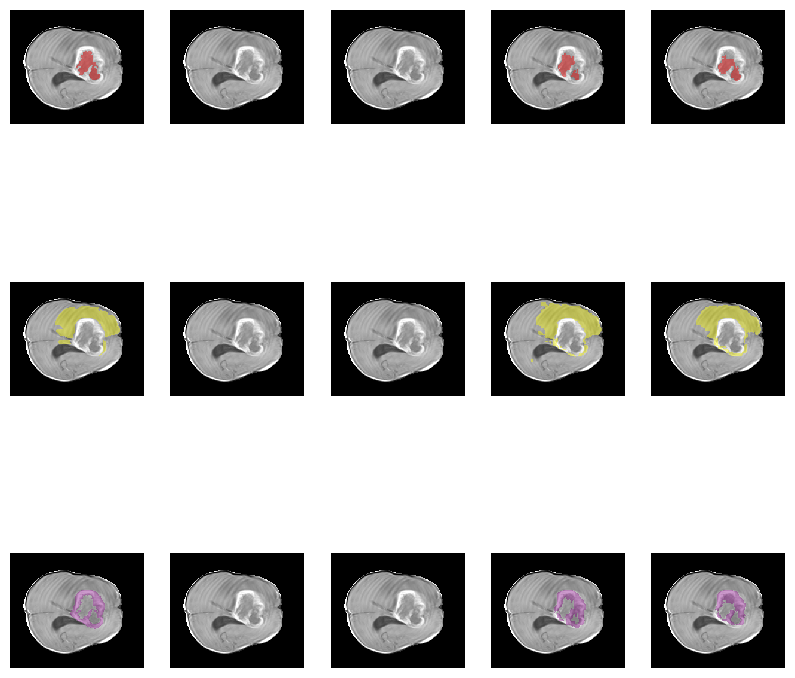

BraTS-SSA-00008-000-stk.npy
[[62. 56. 96. 90.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00008-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


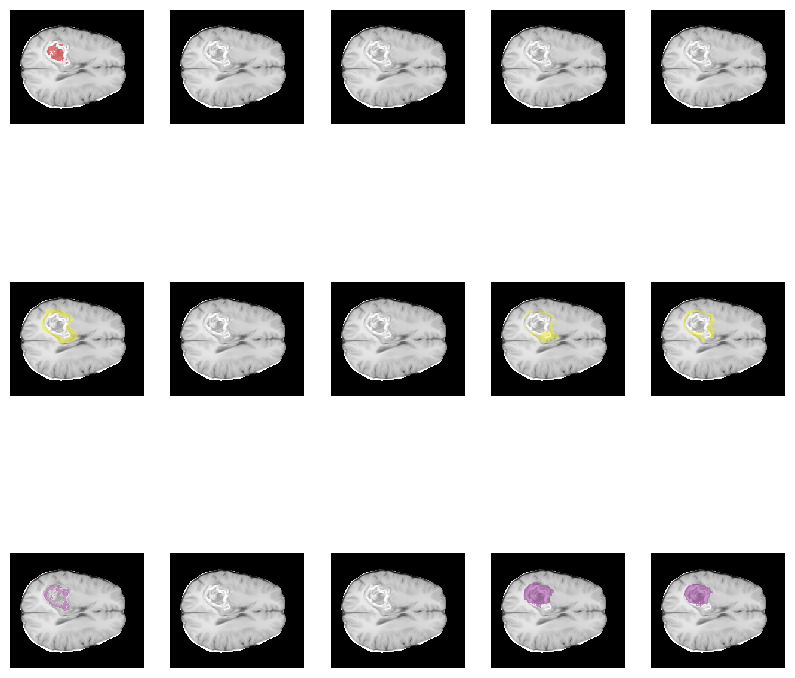

BraTS-SSA-00010-000-stk.npy
[[116.  88. 181. 132.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00010-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


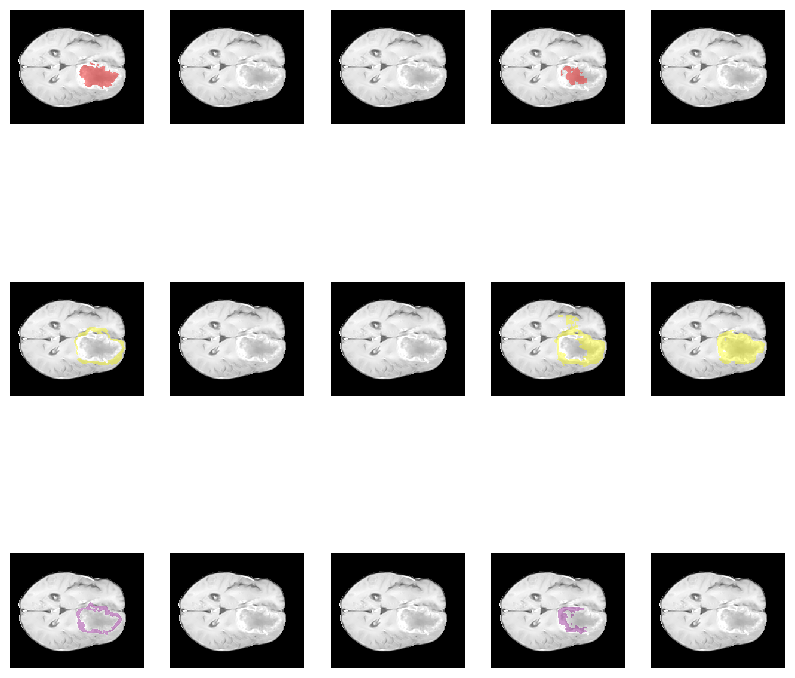

BraTS-SSA-00011-000-stk.npy
[[ 83.  75. 125.  96.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00011-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


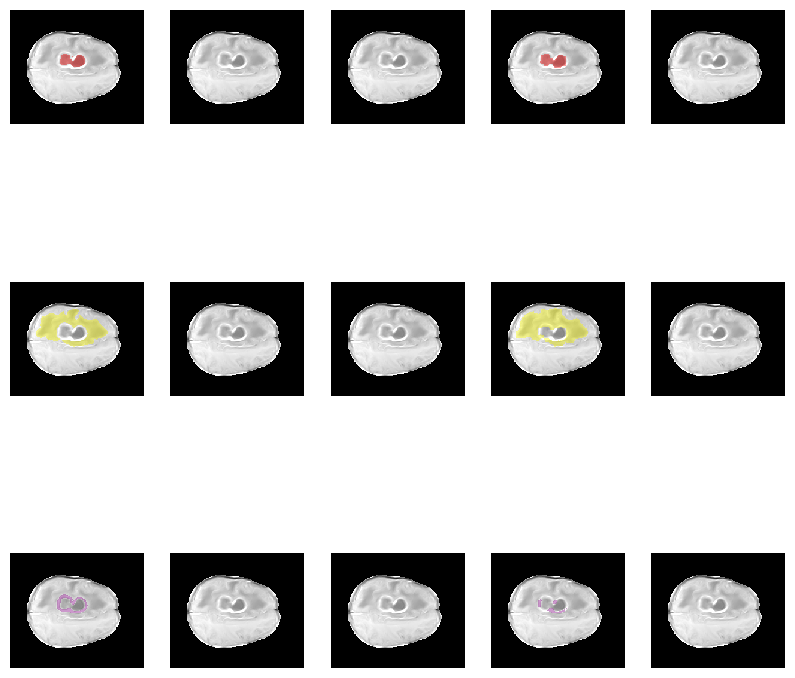

BraTS-SSA-00025-000-stk.npy
[[ 54.  77. 102. 125.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00025-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


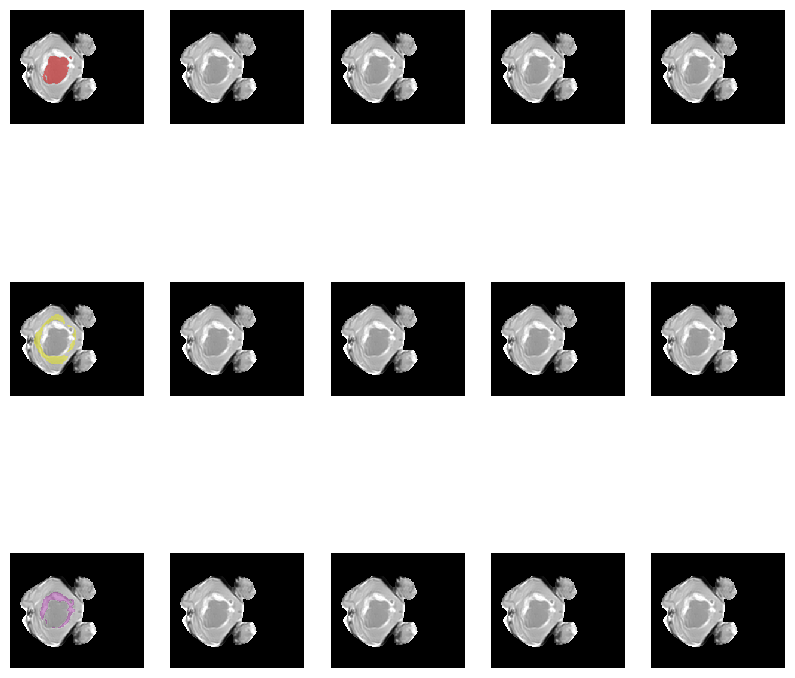

BraTS-SSA-00026-000-stk.npy
[[ 43. 115.  63. 125.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00026-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


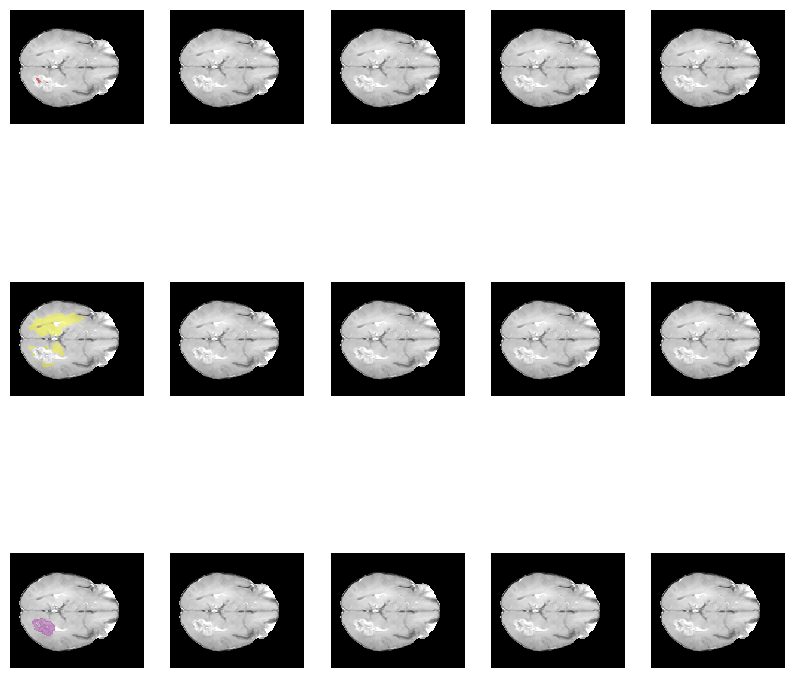

BraTS-SSA-00044-000-stk.npy
[[136.  79. 172.  98.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00044-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


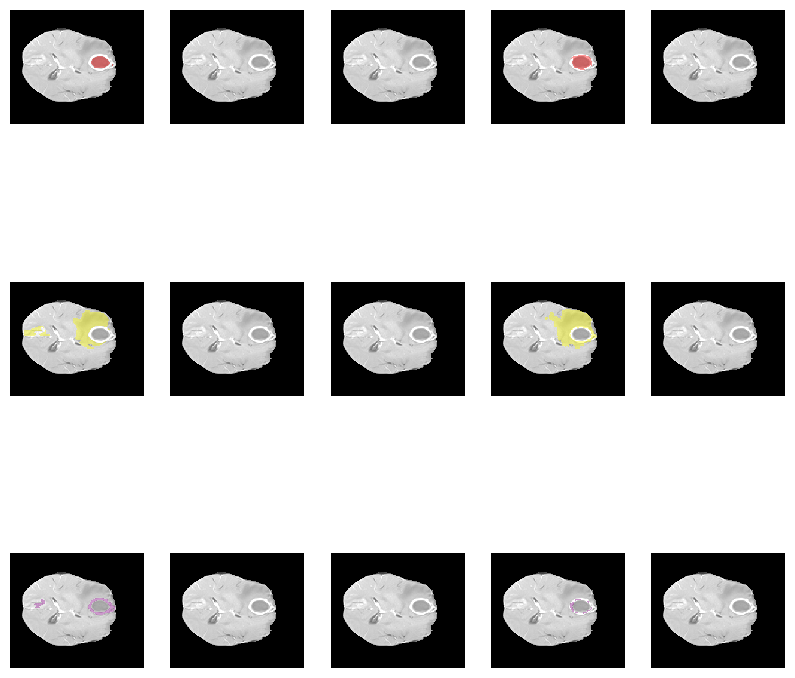

BraTS-SSA-00055-000-stk.npy
[[ 98. 121. 105. 125.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00055-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


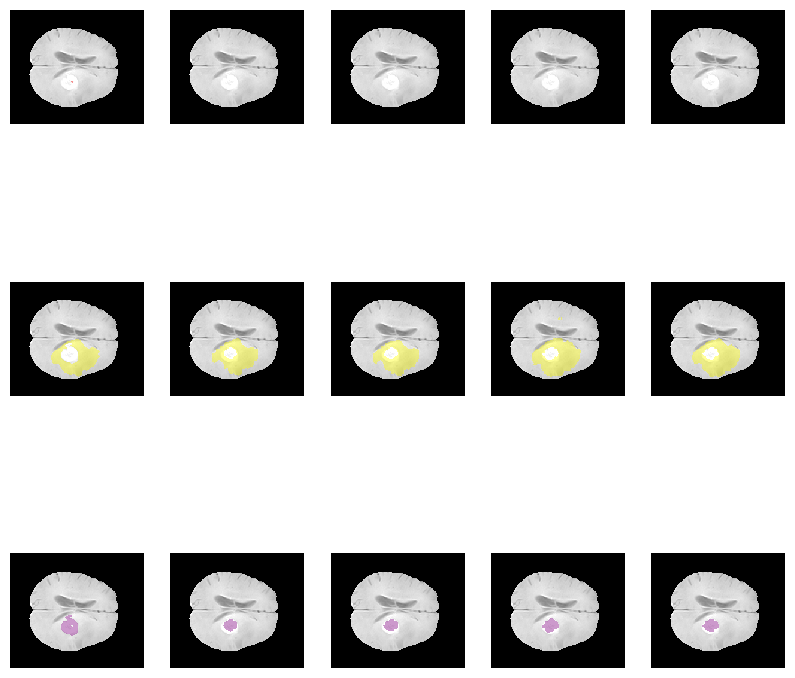

BraTS-SSA-00056-000-stk.npy
[[121.  85. 165. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00056-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


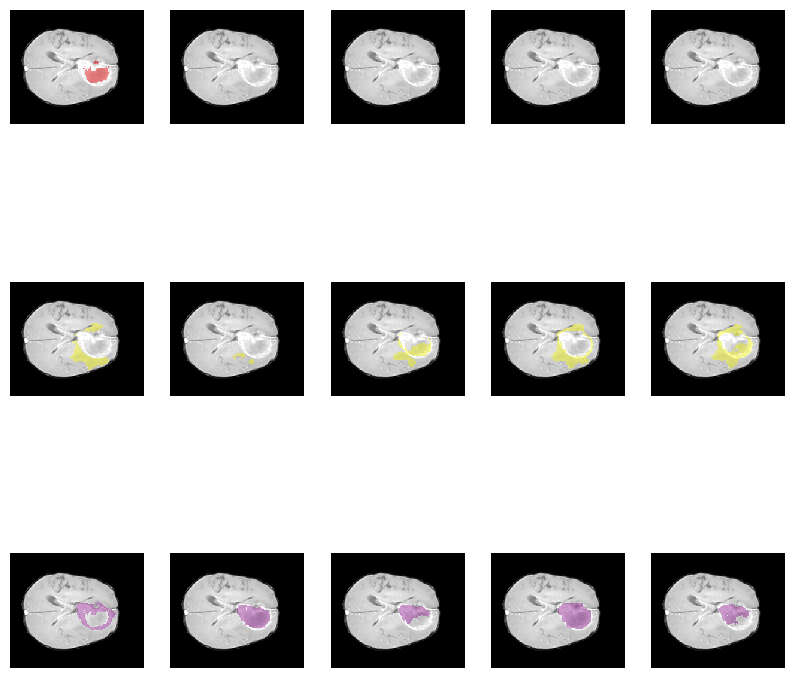

BraTS-SSA-00057-000-stk.npy
[[ 78.  41. 147. 100.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00057-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


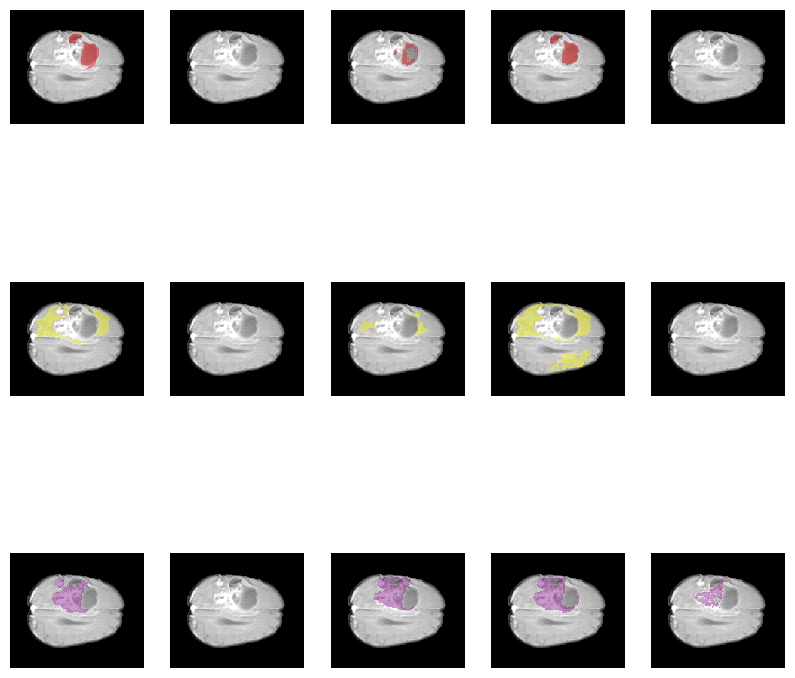

BraTS-SSA-00074-000-stk.npy
[[ 76.  89. 106. 103.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00074-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


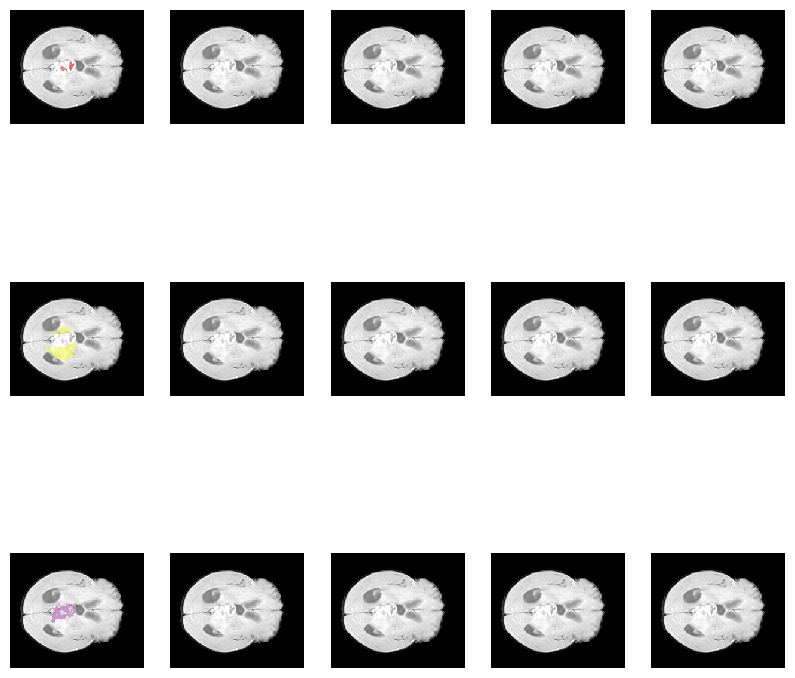

BraTS-SSA-00078-000-stk.npy
[[ 86. 109.  90. 110.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00078-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


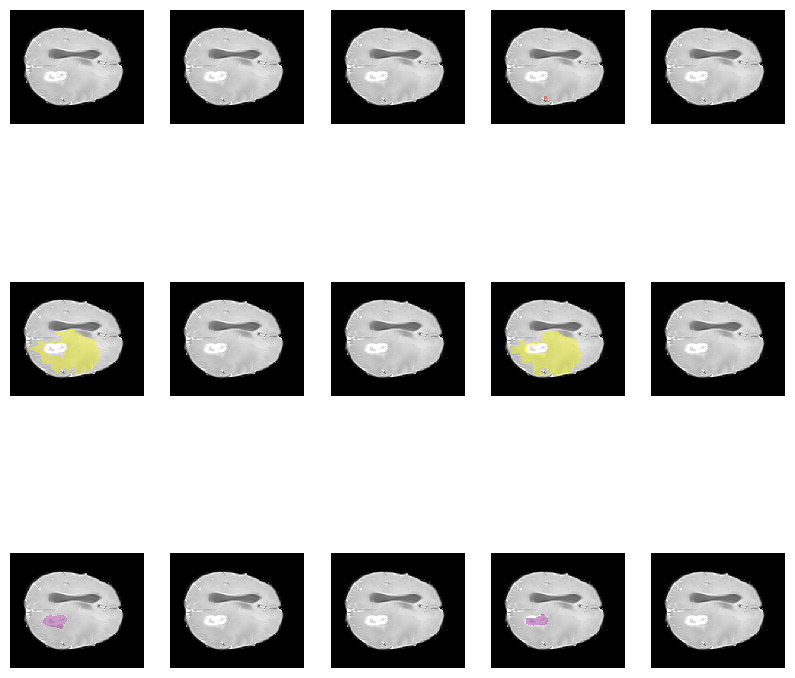

BraTS-SSA-00116-000-stk.npy
[[81. 83. 81. 83.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00116-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


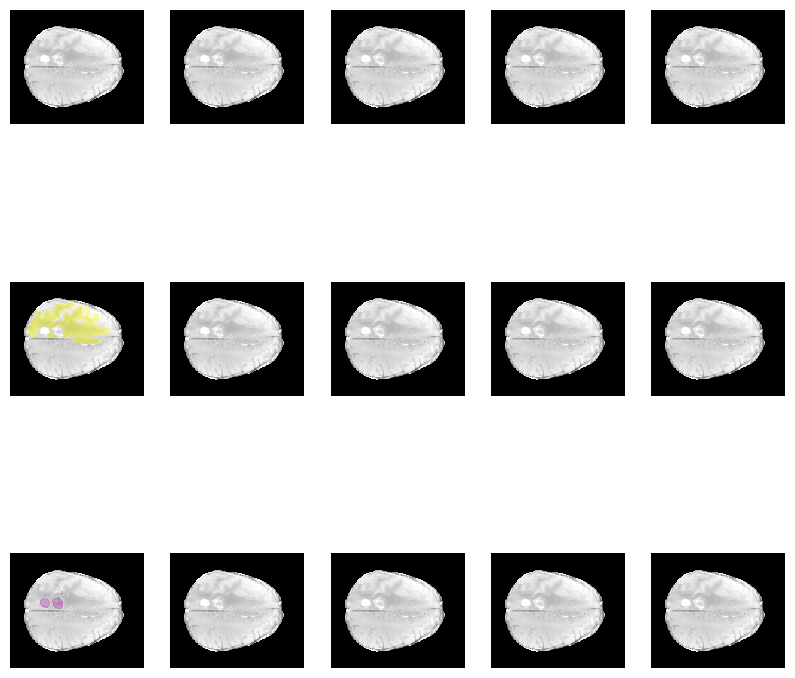

BraTS-SSA-00117-000-stk.npy
[[ 49.  62. 145. 163.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00117-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


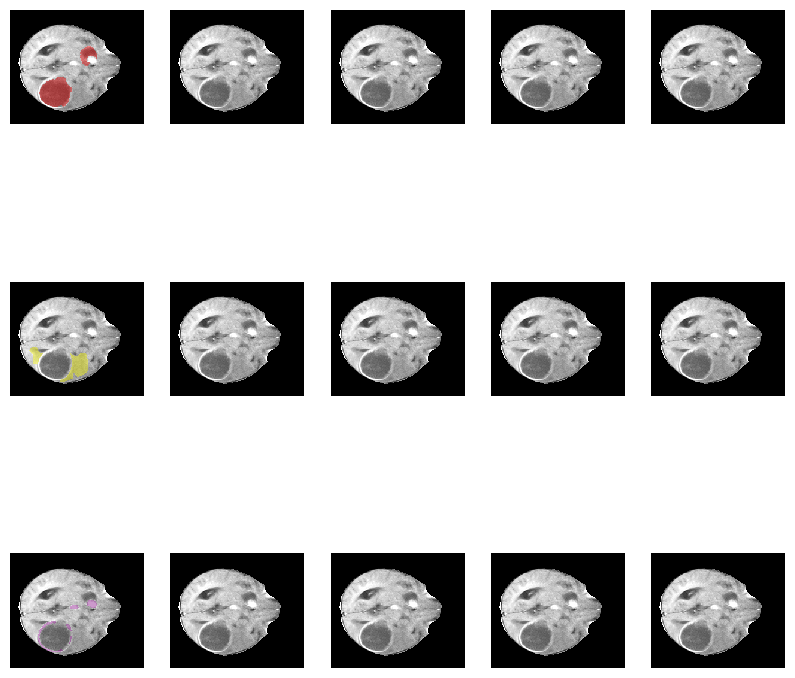

BraTS-SSA-00120-000-stk.npy
[[ 82. 104. 106. 130.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00120-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


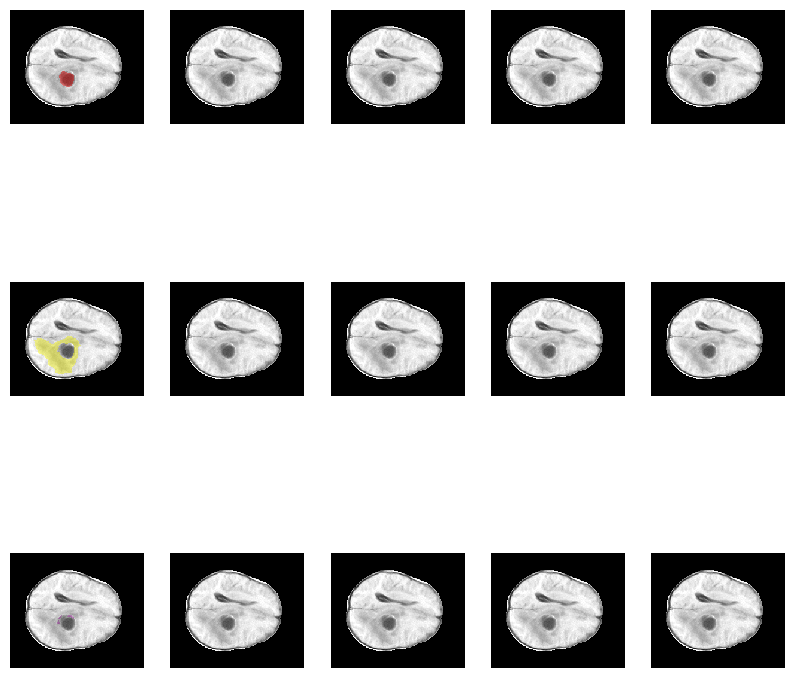

BraTS-SSA-00122-000-stk.npy
[[113. 107. 146. 132.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00122-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


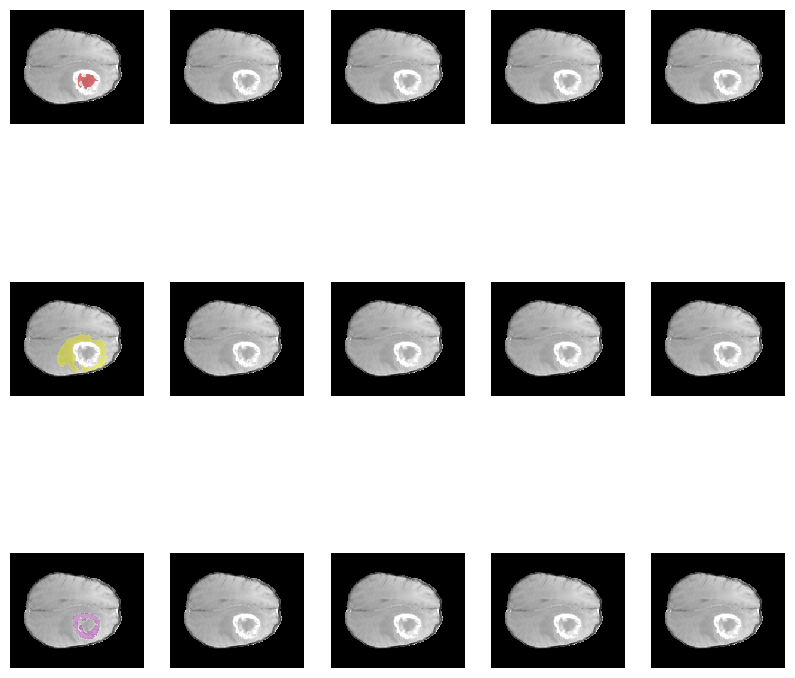

BraTS-SSA-00127-000-stk.npy
[[ 70.  95. 105. 120.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00127-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


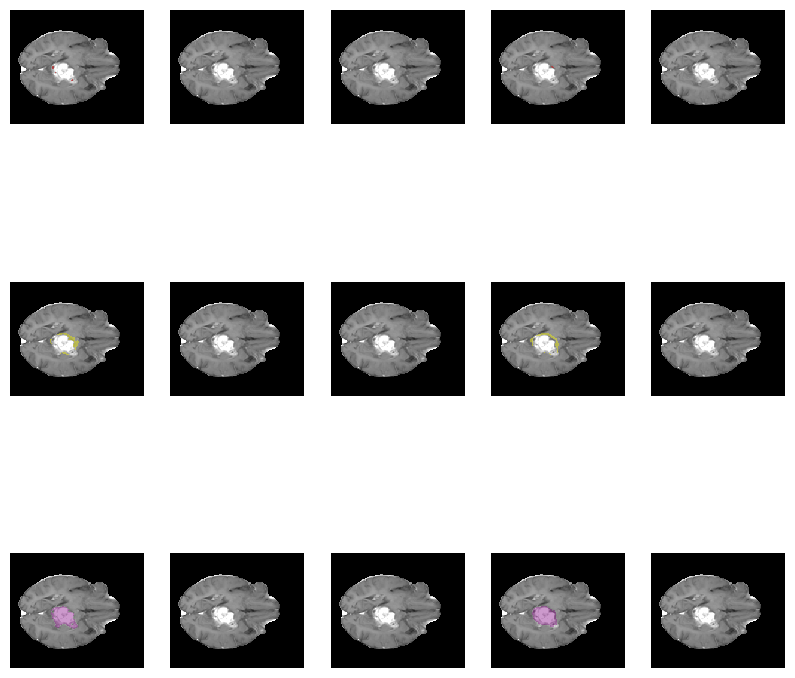

BraTS-SSA-00131-000-stk.npy
[[ 88.  88. 145. 122.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00131-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


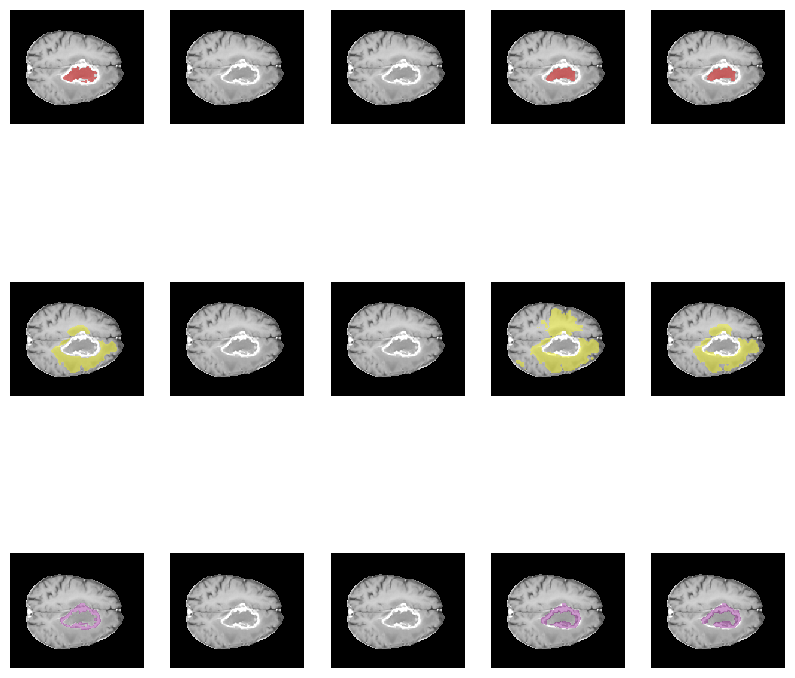

BraTS-SSA-00133-000-stk.npy
[[ 60. 103. 123. 142.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00133-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


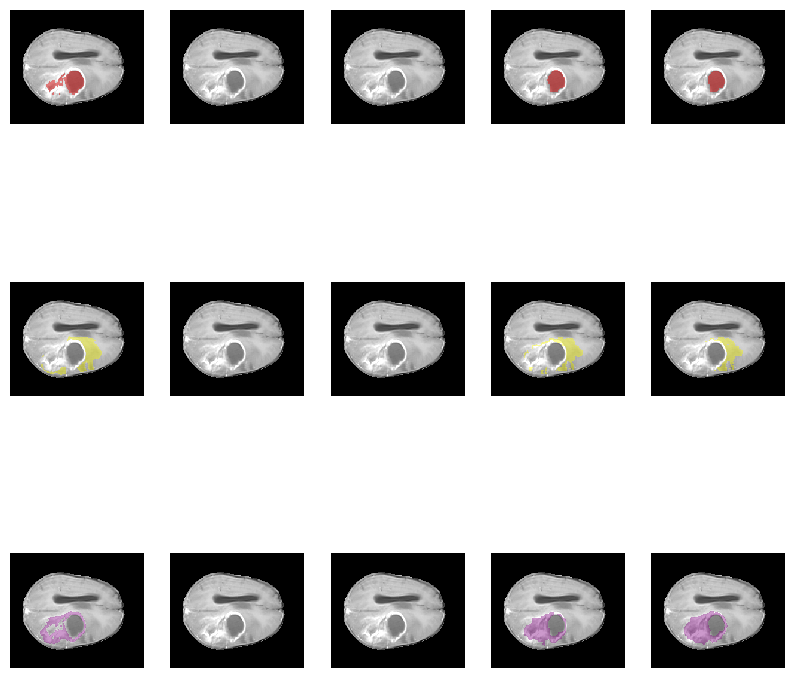

BraTS-SSA-00141-000-stk.npy
[[ 99.  58. 158. 105.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00141-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


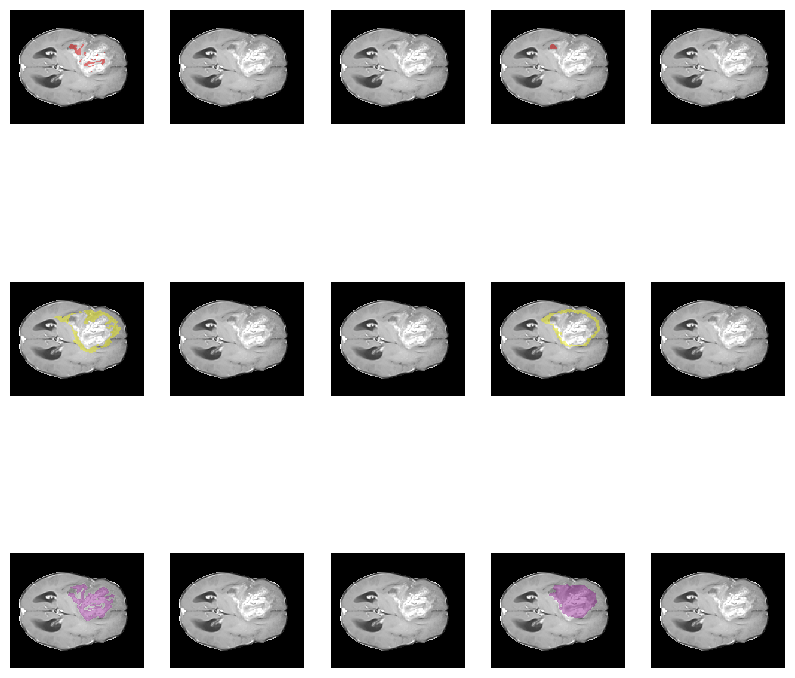

BraTS-SSA-00150-000-stk.npy
[[ 73. 113. 128. 160.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00150-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


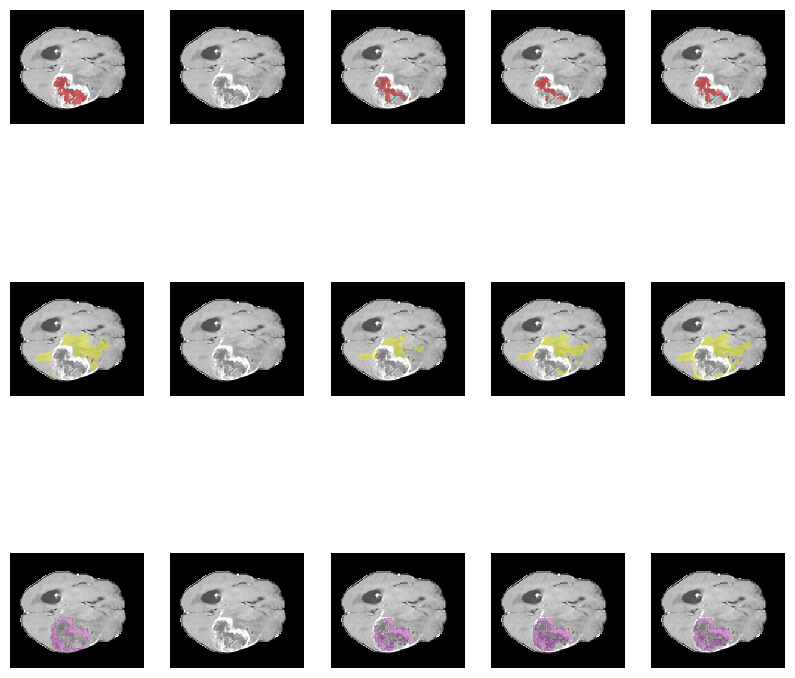

BraTS-SSA-00161-000-stk.npy
[[ 91.  48. 145.  93.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00161-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


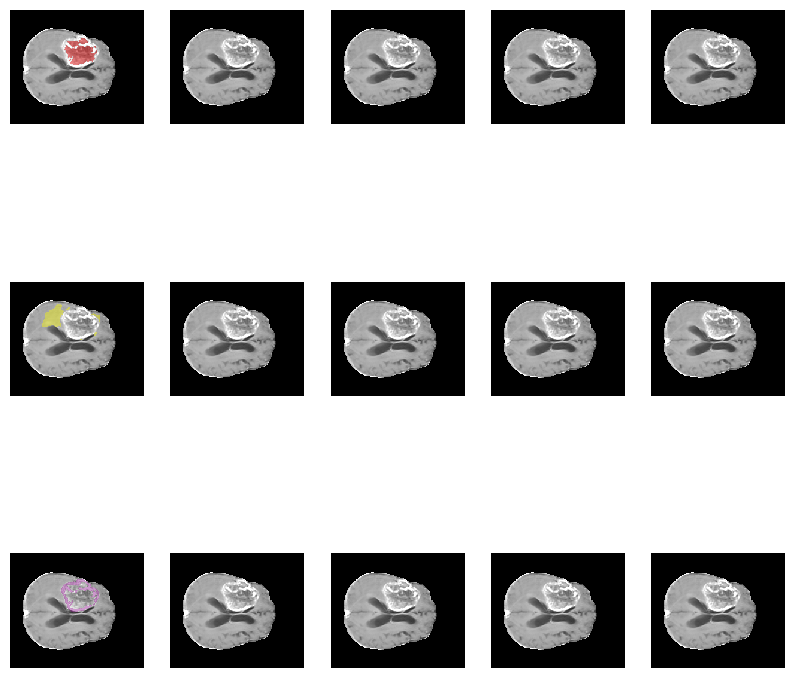

BraTS-SSA-00213-000-stk.npy
[[ 45.  67.  87. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00213-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


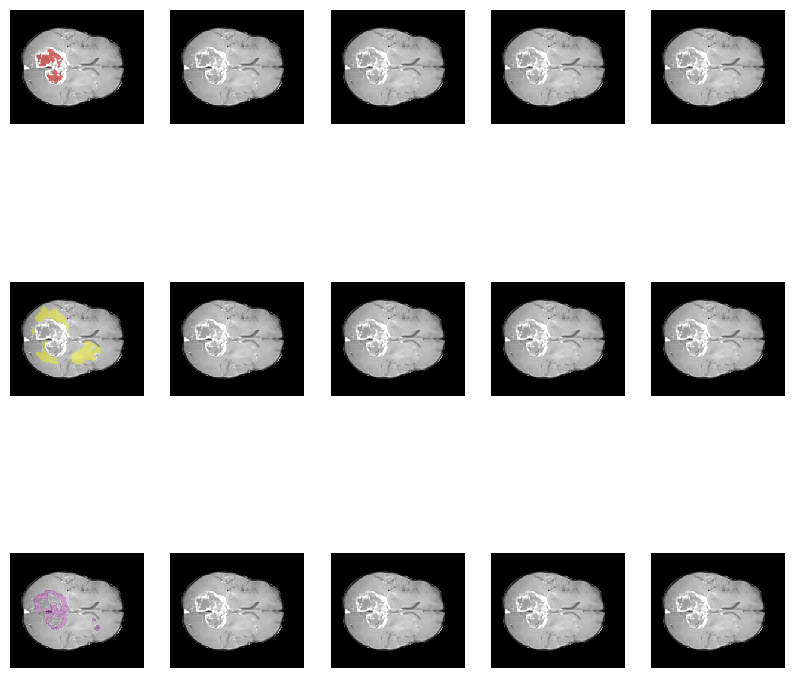

BraTS-SSA-00220-000-stk.npy
[[48. 44. 92. 70.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00220-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


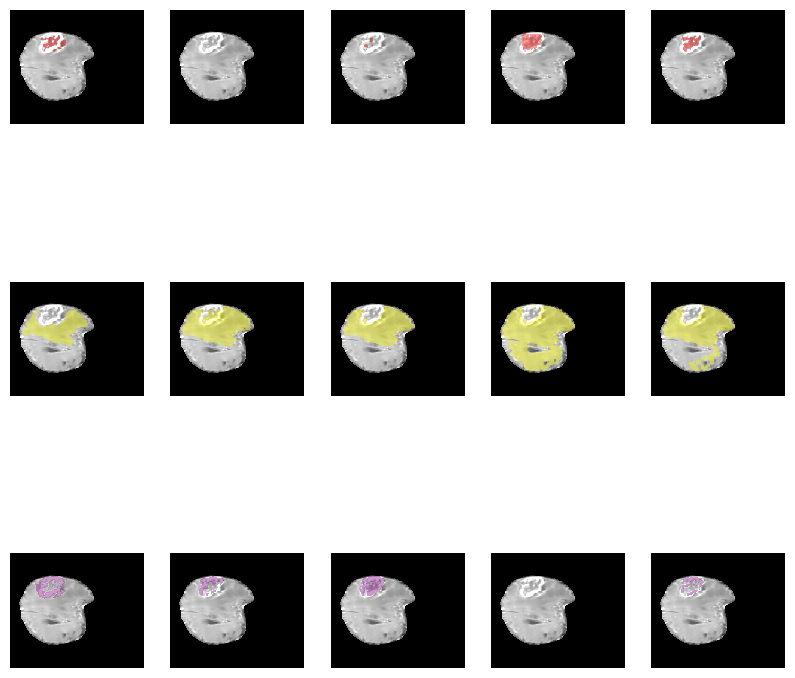

BraTS-SSA-00230-000-stk.npy
[[125.  75. 147.  95.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00230-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


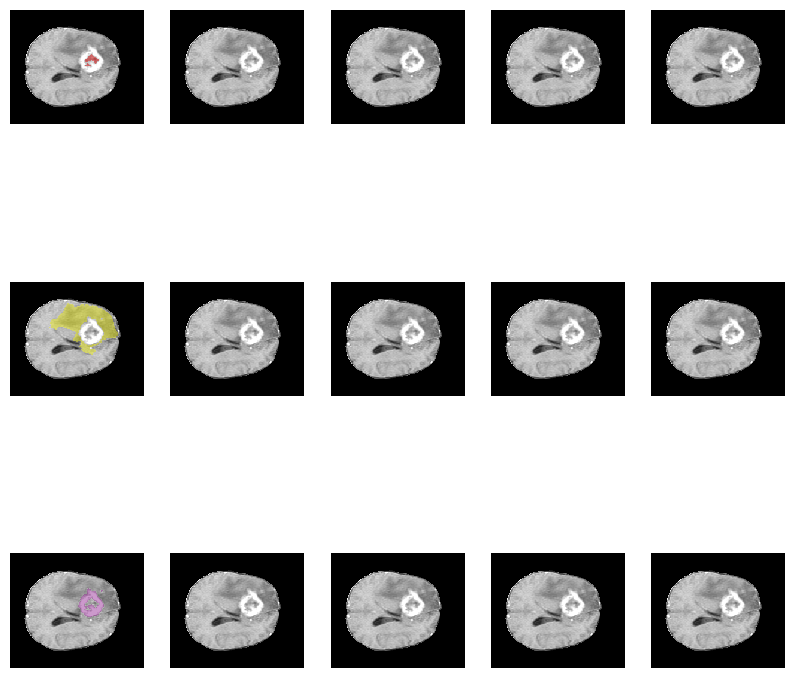

In [22]:
GLI_video_path = '/scratch-second/BraTS_SSA/Validation/images_UNN'
GLI_label_path = '/scratch-second/BraTS_SSA/Validation/labels_UNN'
GLI_pred_path = '/scratch-second/TTA_results/val_ent_only_decoder_lr4_augs/logs/BraTS_GLI'
pred2 = '/scratch-second/TTA_results/val_ent_sup_decoder_lr4_augs/logs/BraTS_GLI'
pred3 = '/scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI' 
pred4 = '/scratch-second/TTA_results/val_combined_decoder_lr4_augs/logs/BraTS_GLI' 
cols = ["dice_ED", "dice_ET", "dice_NCR"]



GLI_worst_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_worst_list)
visualize_3d(GLI_worst_dataset, GLI_pred_path, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, pred2,  pred3, pred4)

BraTS-SSA-00007-000-stk.npy
[[111.  70. 150. 118.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00007-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

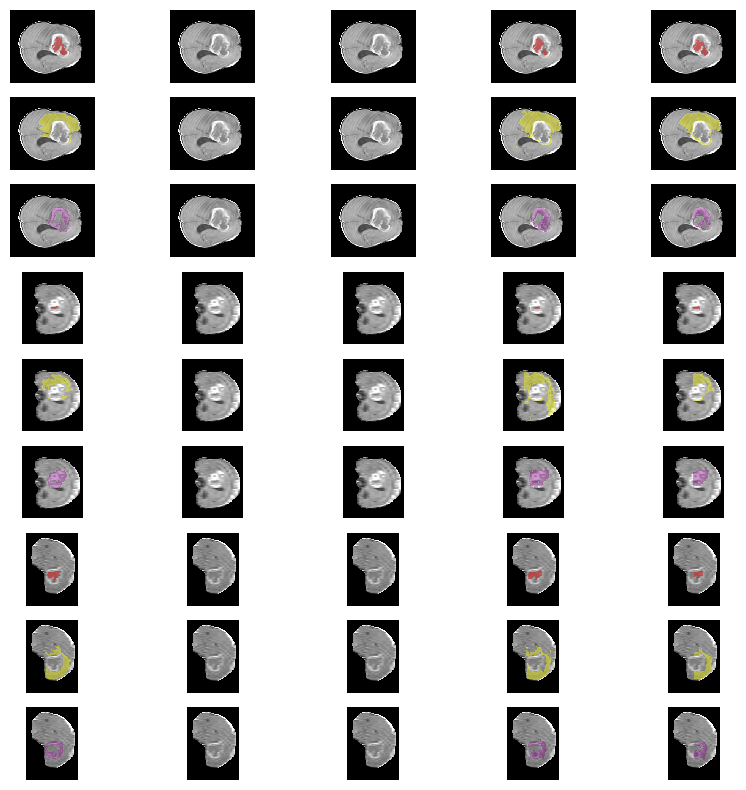

BraTS-SSA-00044-000-stk.npy
[[136.  79. 172.  98.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00044-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

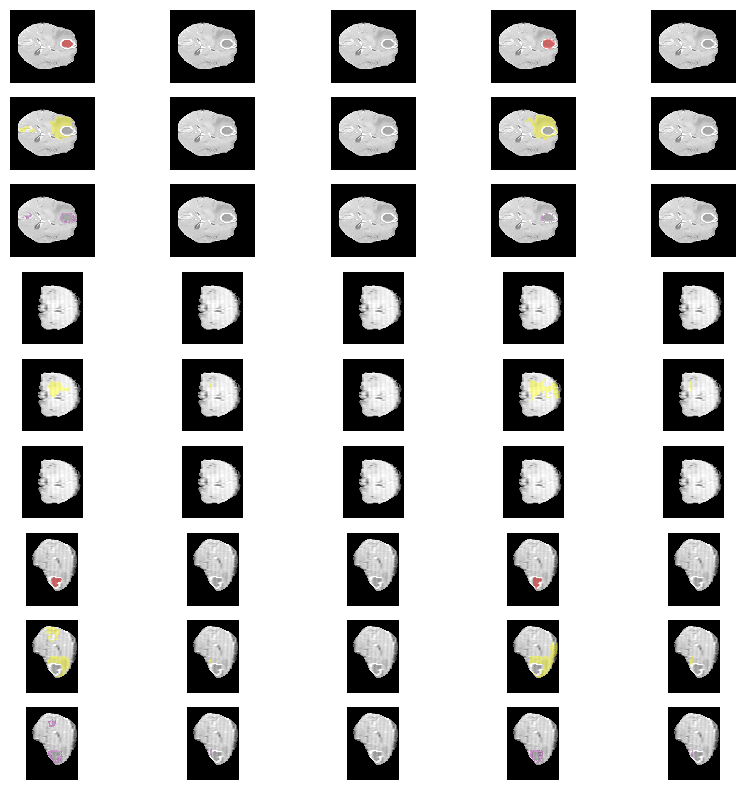

BraTS-SSA-00056-000-stk.npy
[[121.  85. 165. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00056-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

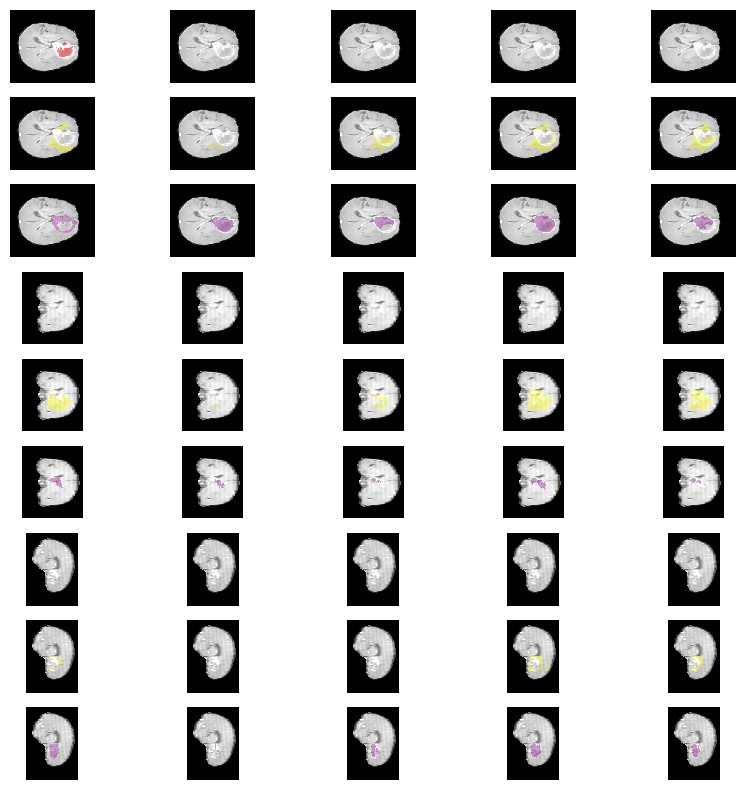

BraTS-SSA-00057-000-stk.npy
[[ 78.  41. 147. 100.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00057-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

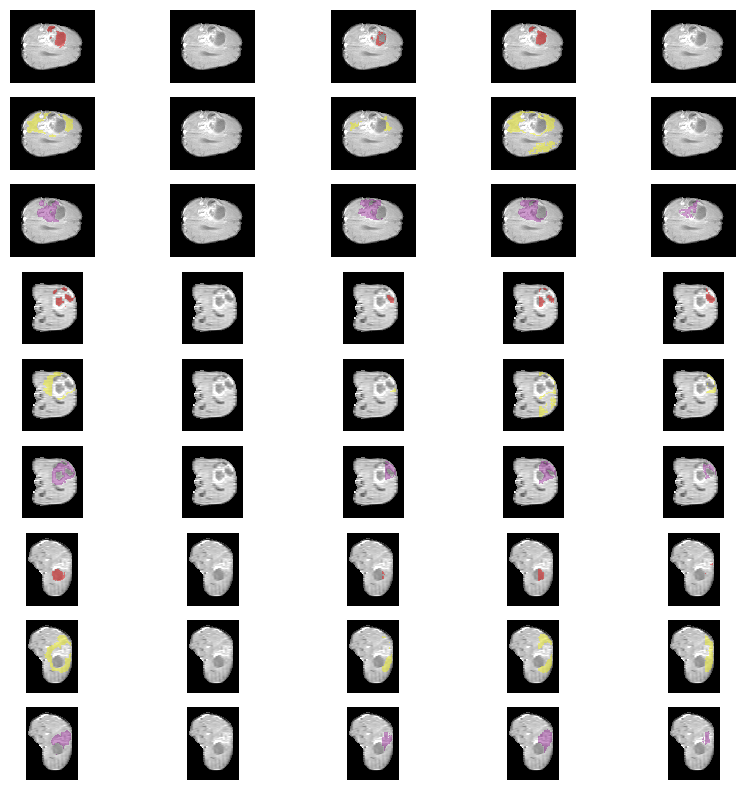

BraTS-SSA-00078-000-stk.npy
[[ 86. 109.  90. 110.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00078-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

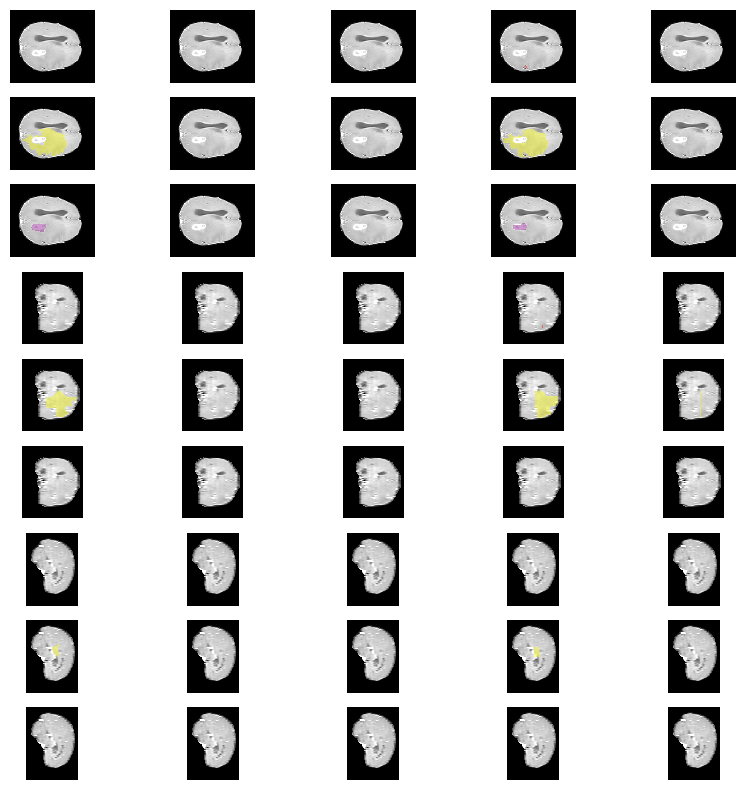

BraTS-SSA-00117-000-stk.npy
[[ 49.  62. 145. 163.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00117-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

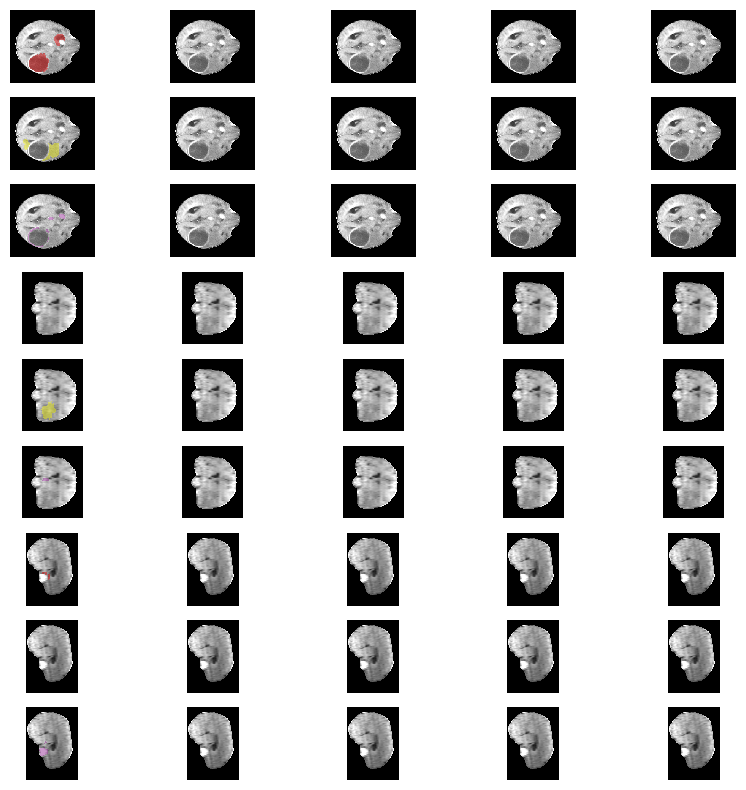

BraTS-SSA-00122-000-stk.npy
[[113. 107. 146. 132.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00122-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

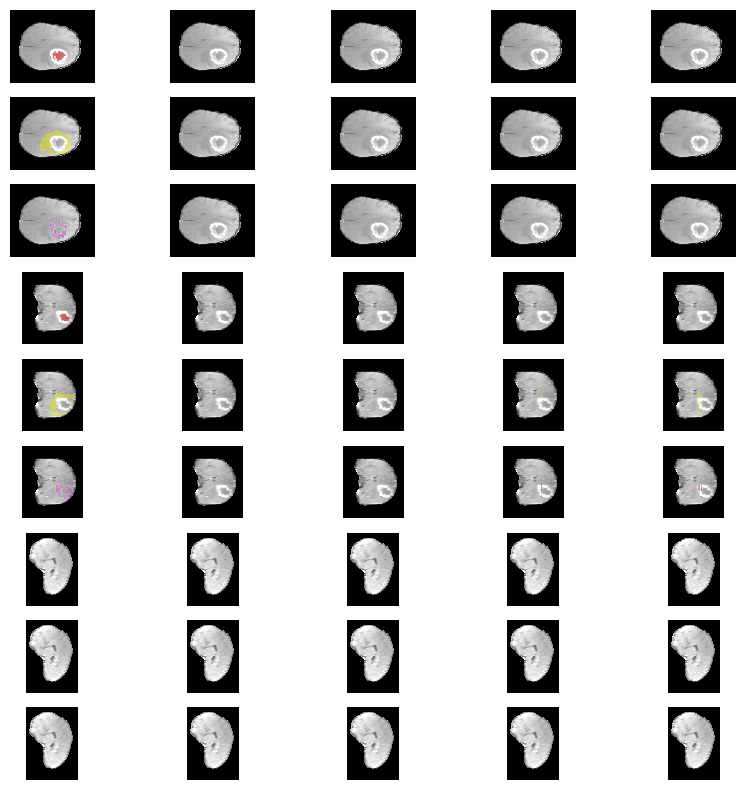

BraTS-SSA-00127-000-stk.npy
[[ 70.  95. 105. 120.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00127-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

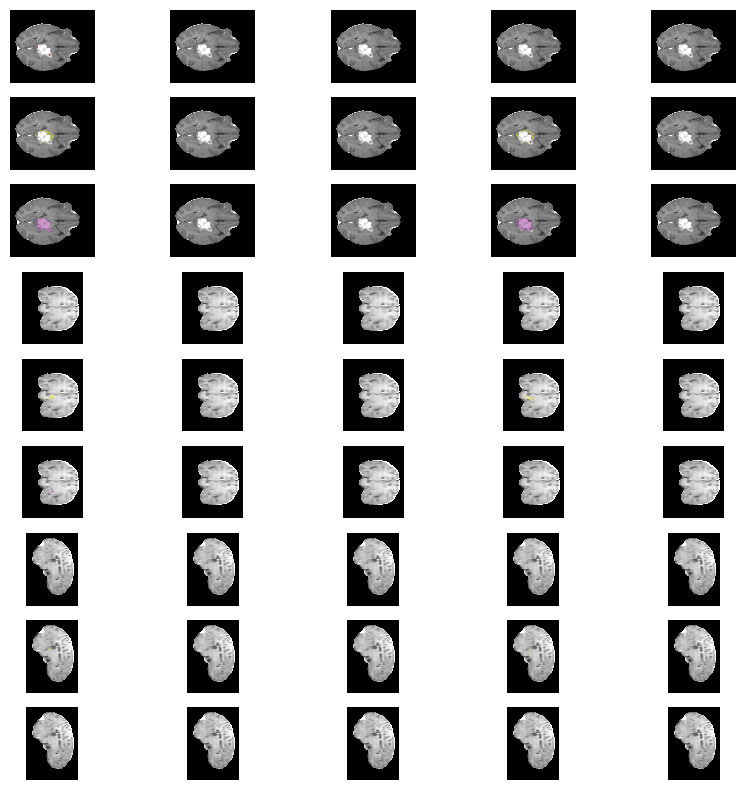

BraTS-SSA-00131-000-stk.npy
[[ 88.  88. 145. 122.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00131-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

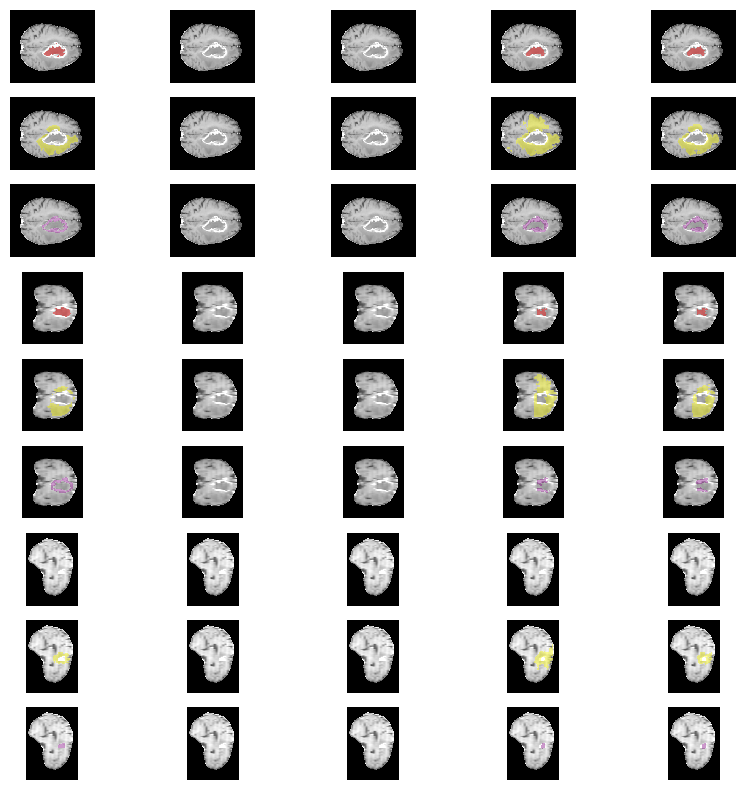

BraTS-SSA-00133-000-stk.npy
[[ 60. 103. 123. 142.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00133-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

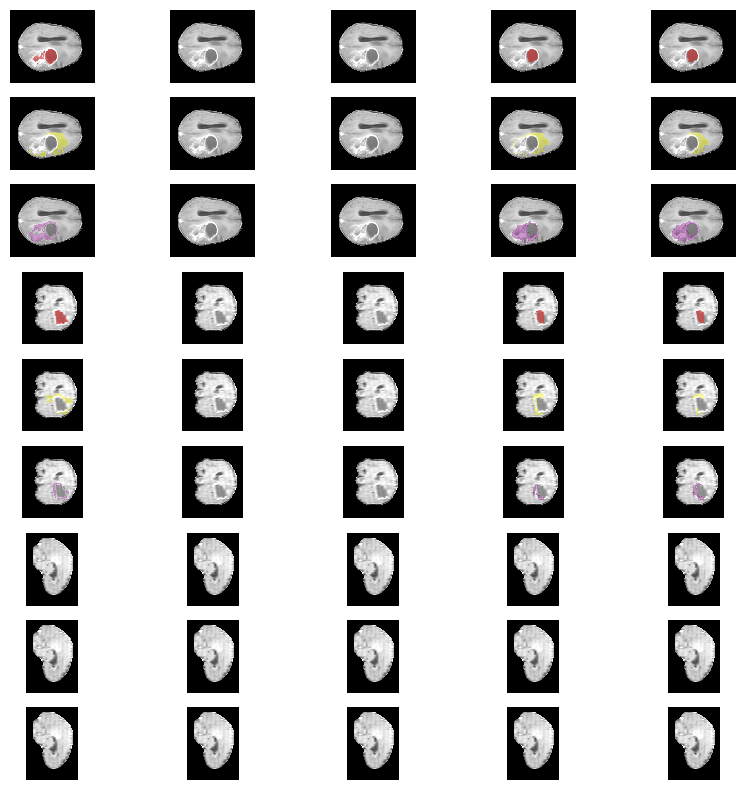

BraTS-SSA-00141-000-stk.npy
[[ 99.  58. 158. 105.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00141-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

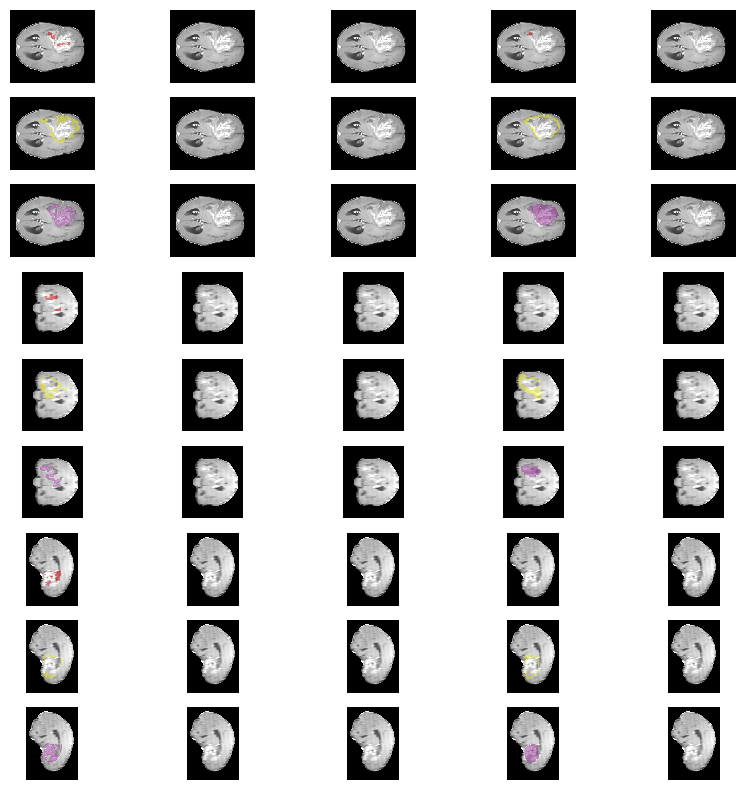

BraTS-SSA-00150-000-stk.npy
[[ 73. 113. 128. 160.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00150-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

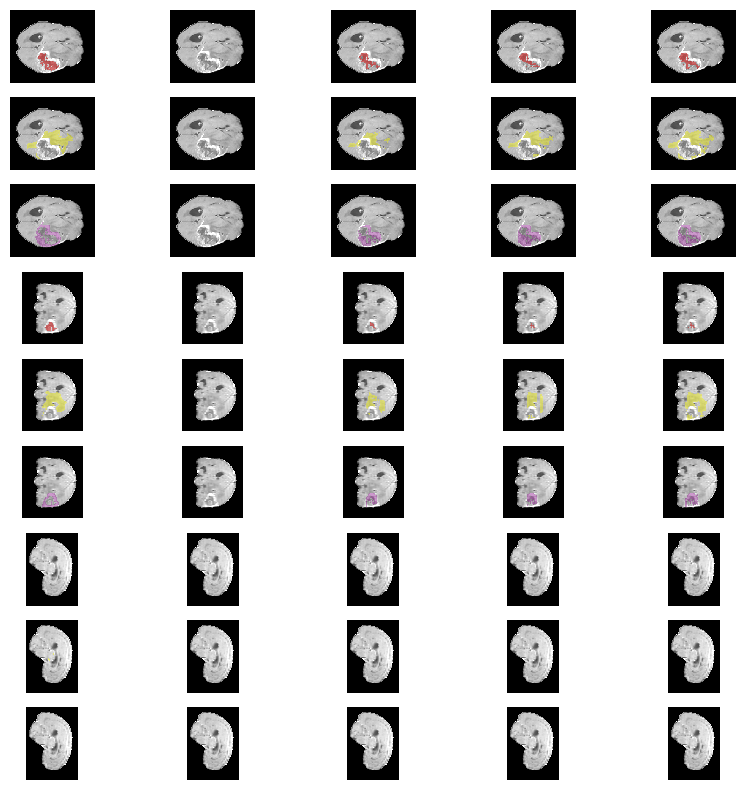

BraTS-SSA-00213-000-stk.npy
[[ 45.  67.  87. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00213-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

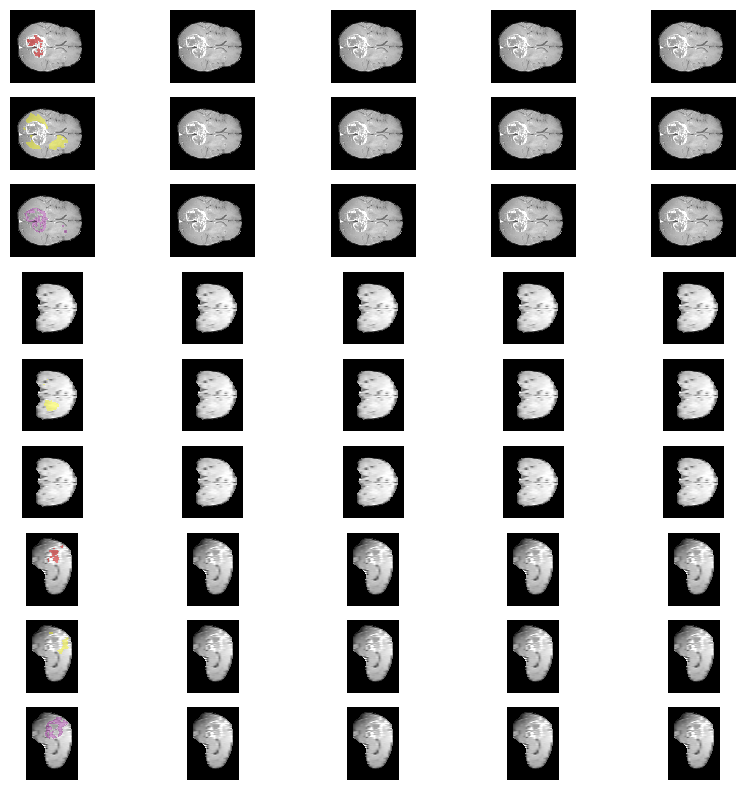

BraTS-SSA-00220-000-stk.npy
[[48. 44. 92. 70.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00220-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overl

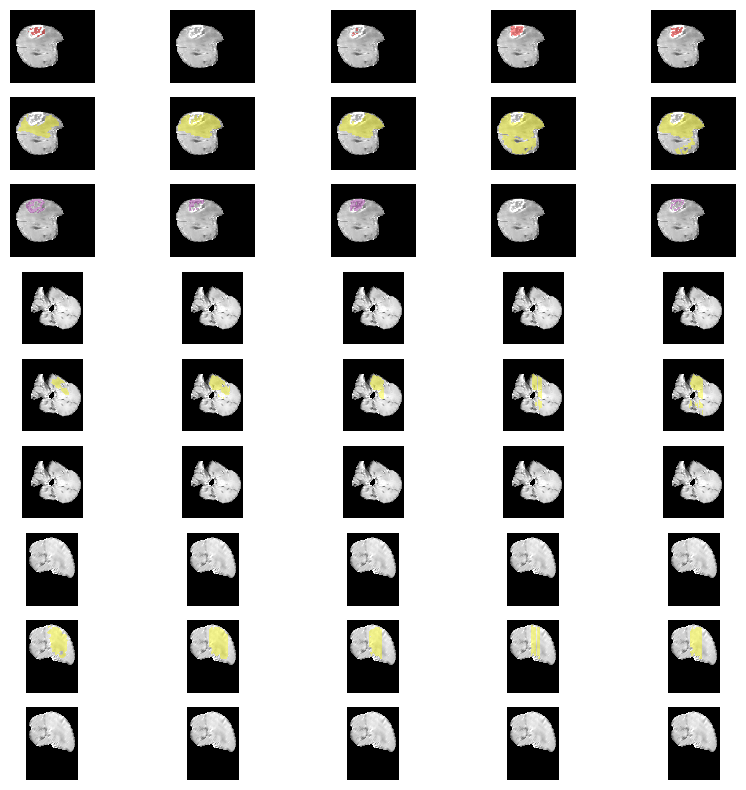

BraTS-SSA-00230-000-stk.npy
[[125.  75. 147.  95.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00230-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

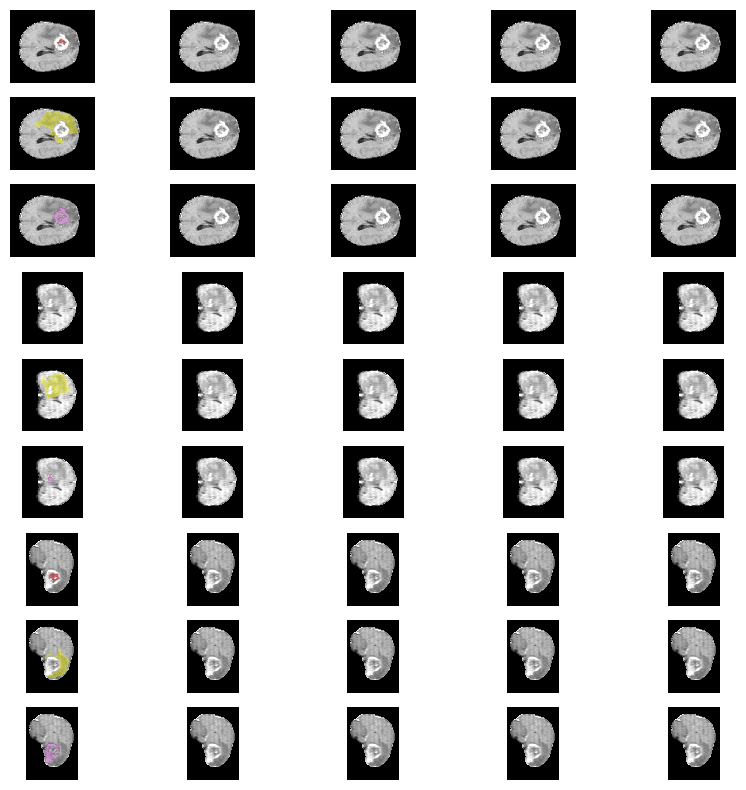

In [14]:
GLI_video_path = '/scratch-second/BraTS_SSA/Validation/images_UNN'
GLI_label_path = '/scratch-second/BraTS_SSA/Validation/labels_UNN'
GLI_pred_path = '/scratch-second/TTA_results/val_ent_only_decoder_lr4_augs/logs/BraTS_GLI'
pred2 = '/scratch-second/TTA_results/val_ent_sup_decoder_lr4_augs/logs/BraTS_GLI'
pred3 = '/scratch-second/TTA_res_con/val_ent_con_decoder_lr4_augs/logs/BraTS_GLI' 
pred4 = '/scratch-second/TTA_results/val_combined_decoder_lr4_augs/logs/BraTS_GLI' 
cols = ["dice_ED", "dice_ET", "dice_NCR"]



GLI_worst_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_worst_list)
visualize_4d(GLI_worst_dataset, GLI_pred_path, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, pred2,  pred3, pred4)

BraTS-SSA-00007-000-stk.npy
[[111.  70. 150. 118.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00007-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


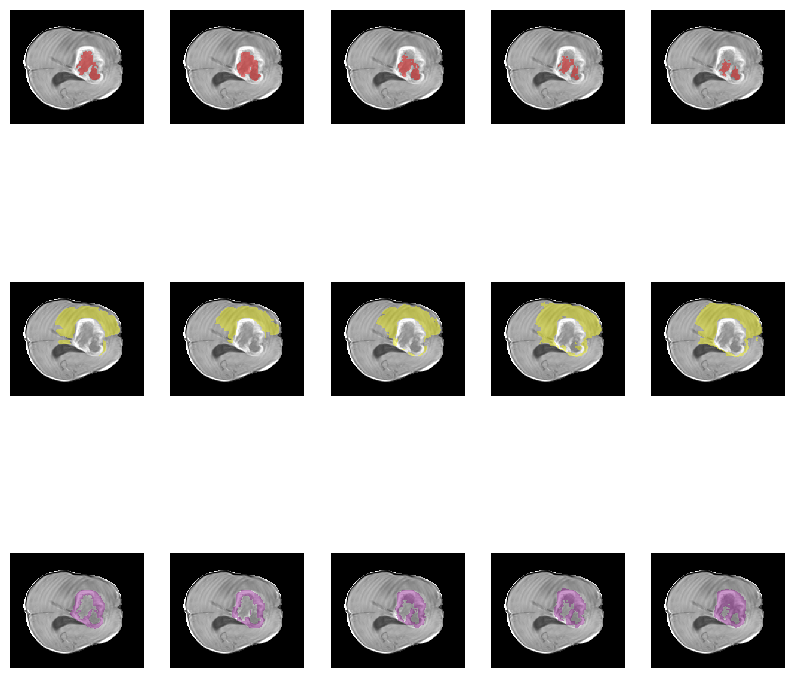

BraTS-SSA-00008-000-stk.npy
[[62. 56. 96. 90.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00008-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


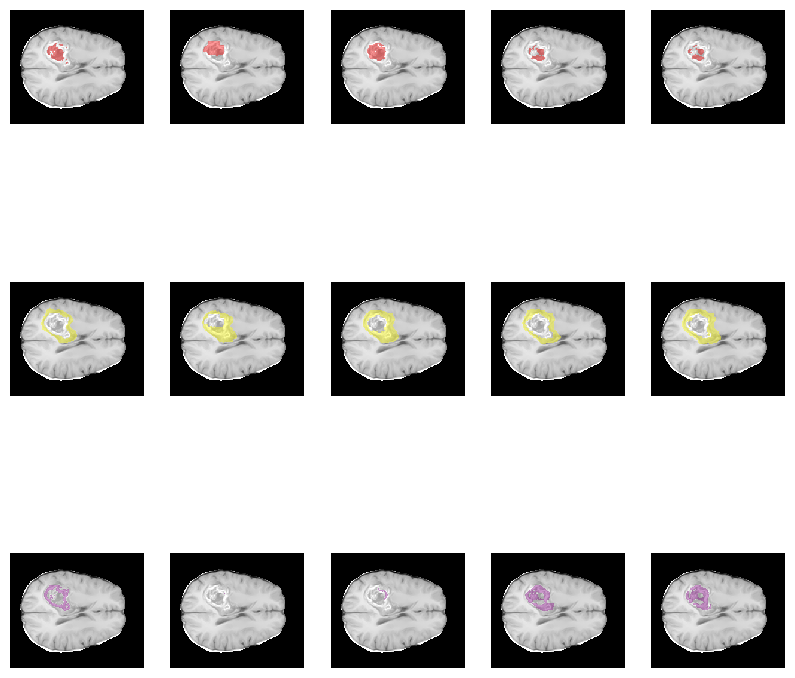

BraTS-SSA-00010-000-stk.npy
[[116.  88. 181. 132.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00010-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


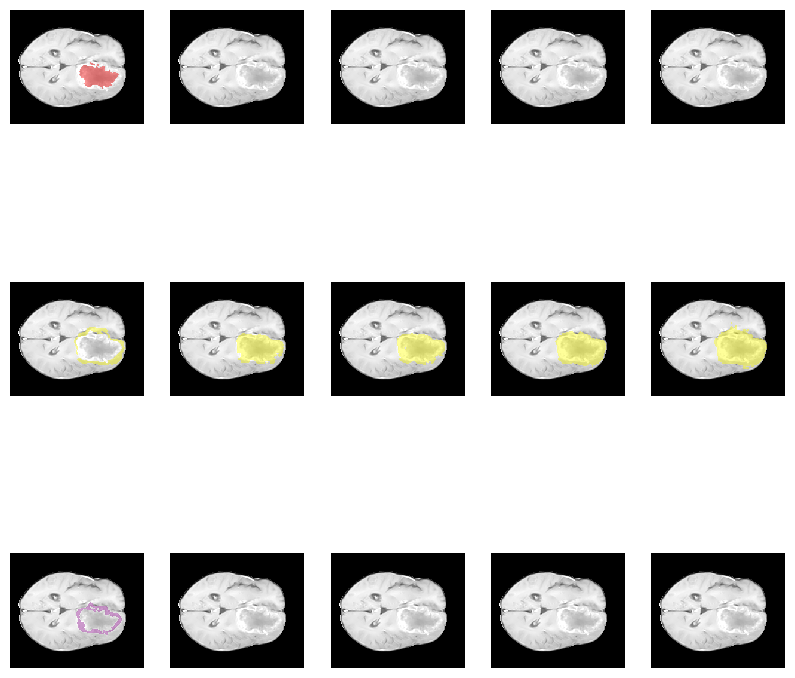

BraTS-SSA-00011-000-stk.npy
[[ 83.  75. 125.  96.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00011-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


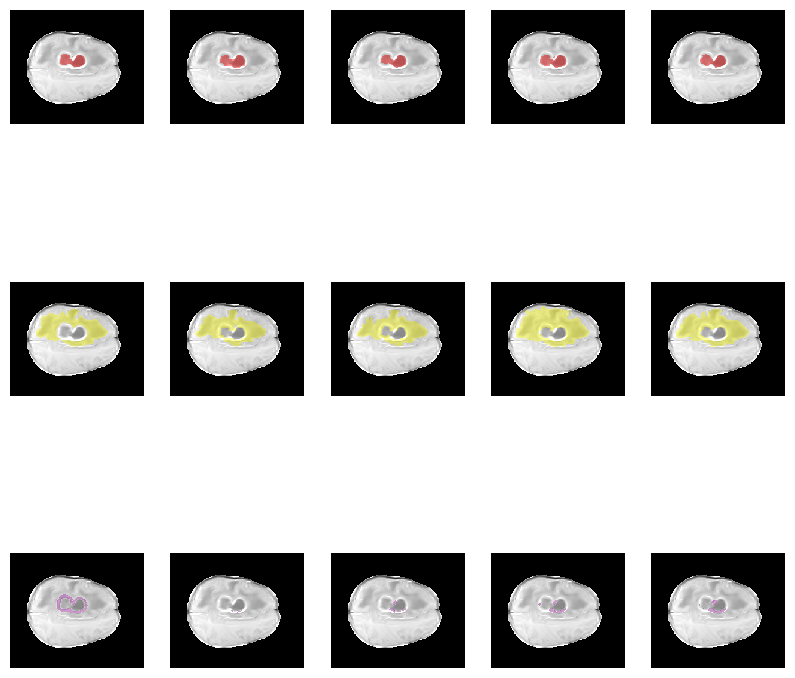

BraTS-SSA-00025-000-stk.npy
[[ 54.  77. 102. 125.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00025-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


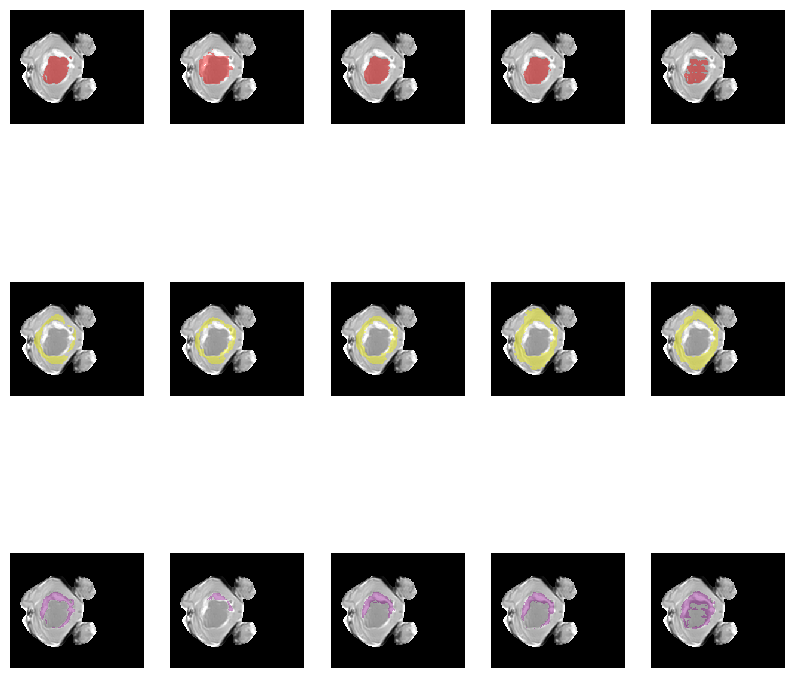

BraTS-SSA-00026-000-stk.npy
[[ 43. 115.  63. 125.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00026-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


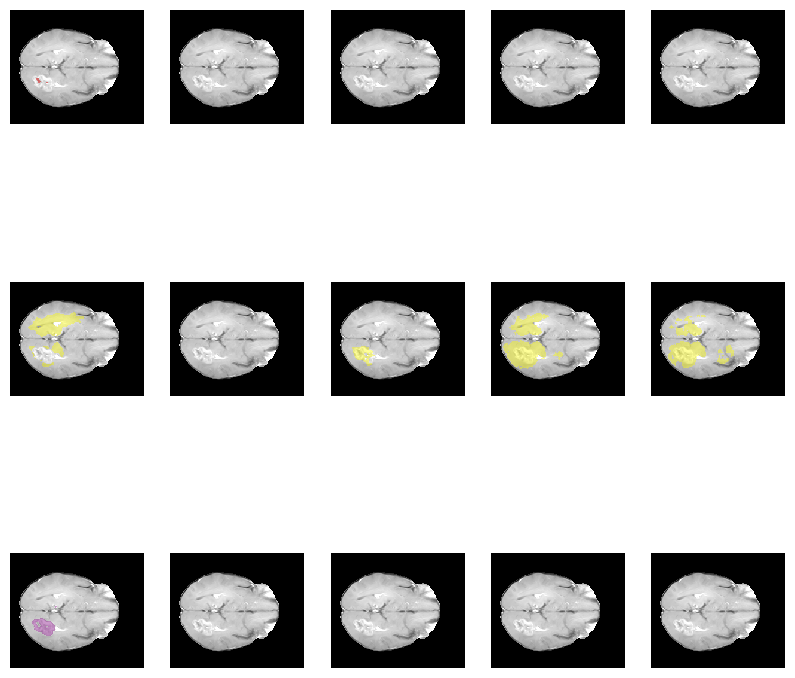

BraTS-SSA-00044-000-stk.npy
[[136.  79. 172.  98.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00044-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


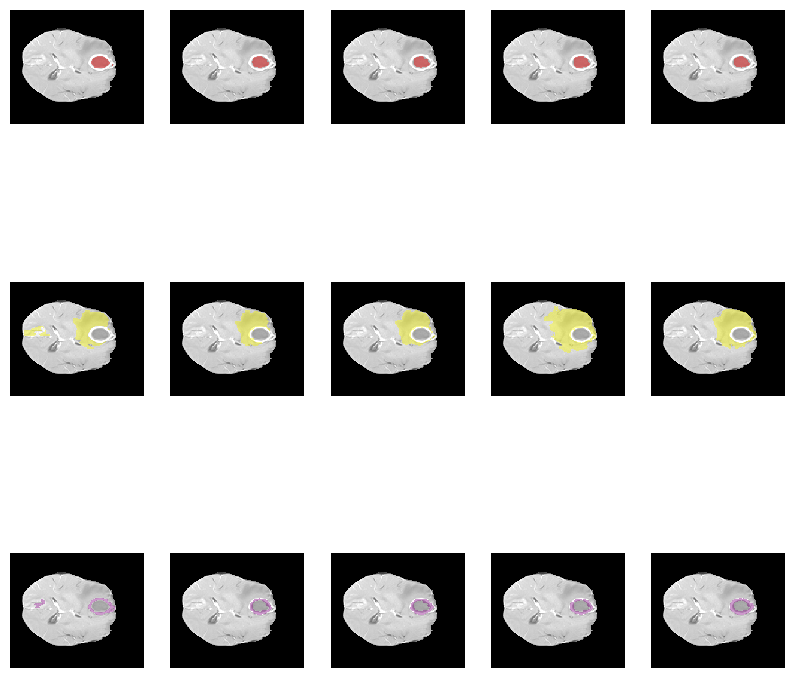

BraTS-SSA-00055-000-stk.npy
[[ 98. 121. 105. 125.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00055-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


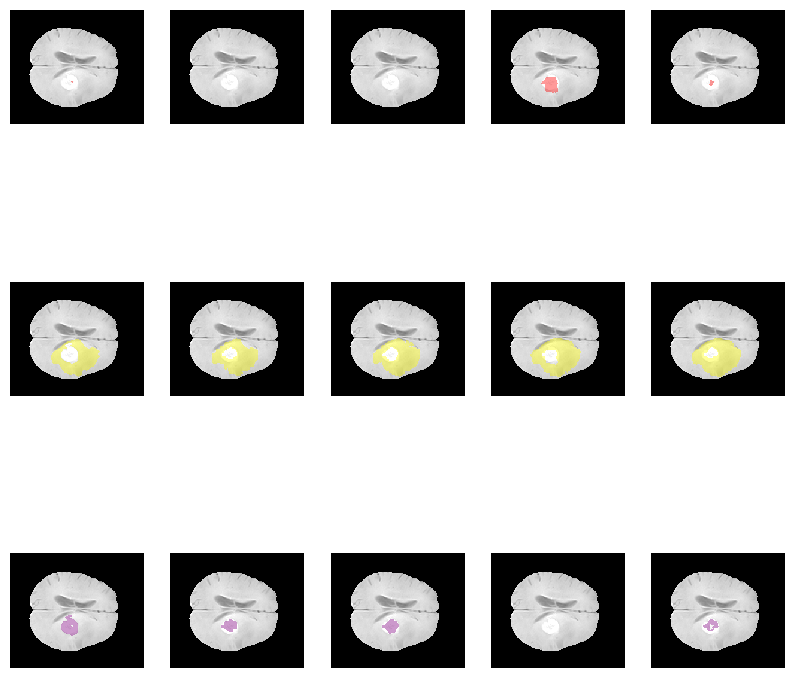

BraTS-SSA-00056-000-stk.npy
[[121.  85. 165. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00056-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


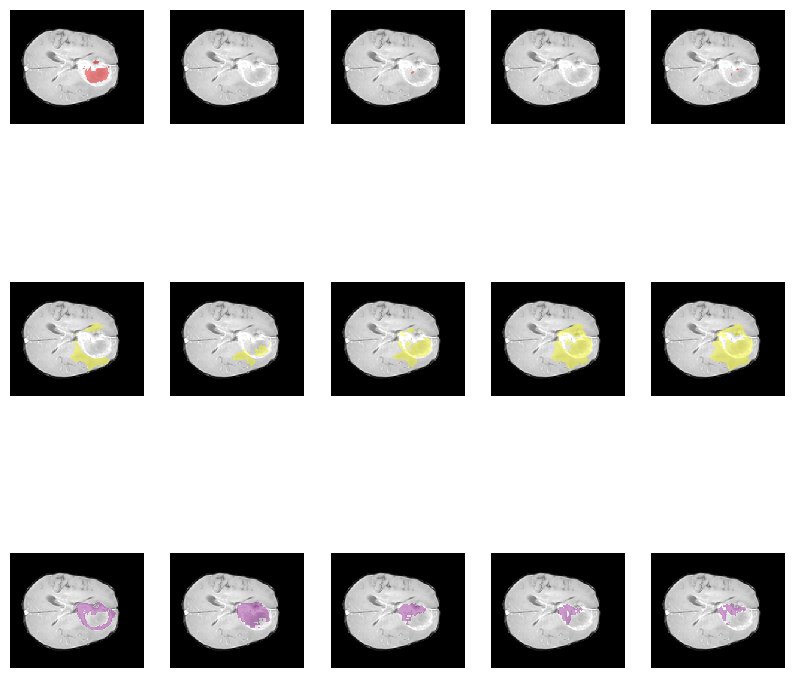

BraTS-SSA-00057-000-stk.npy
[[ 78.  41. 147. 100.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00057-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


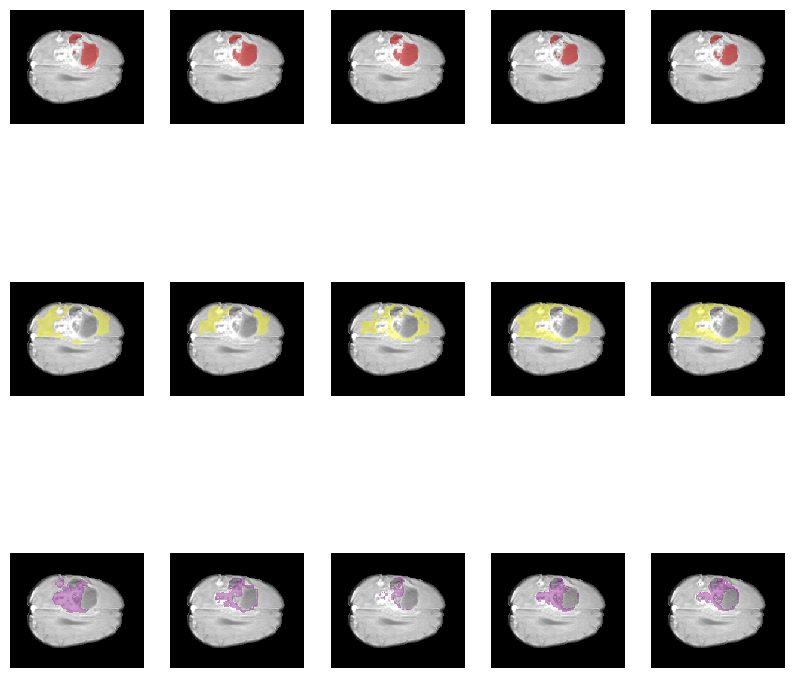

BraTS-SSA-00074-000-stk.npy
[[ 76.  89. 106. 103.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00074-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


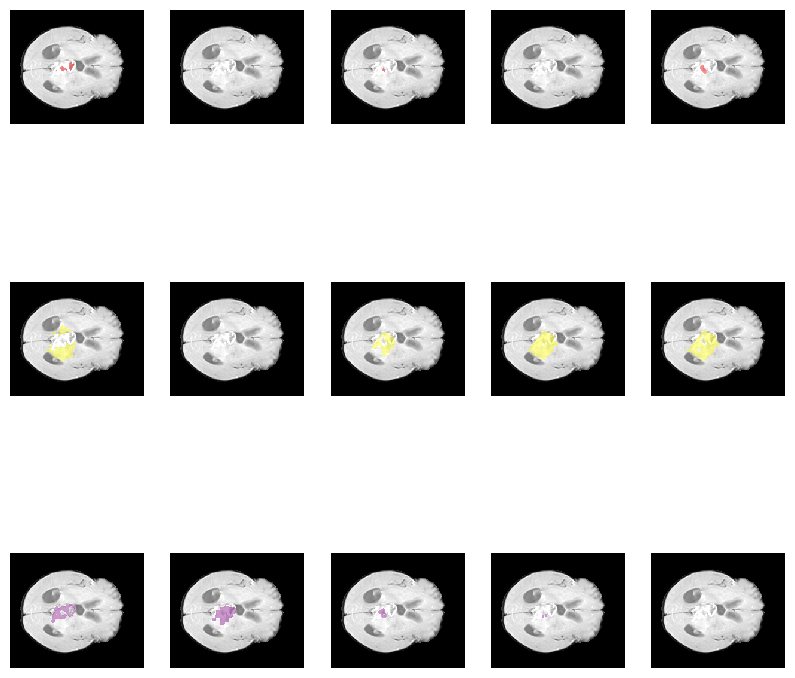

BraTS-SSA-00078-000-stk.npy
[[ 86. 109.  90. 110.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00078-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


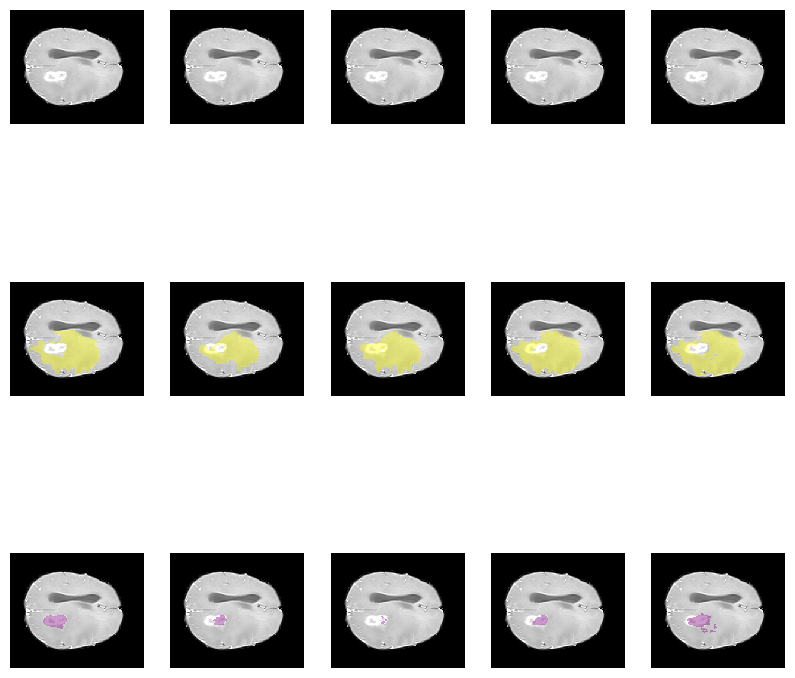

BraTS-SSA-00116-000-stk.npy
[[81. 83. 81. 83.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00116-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


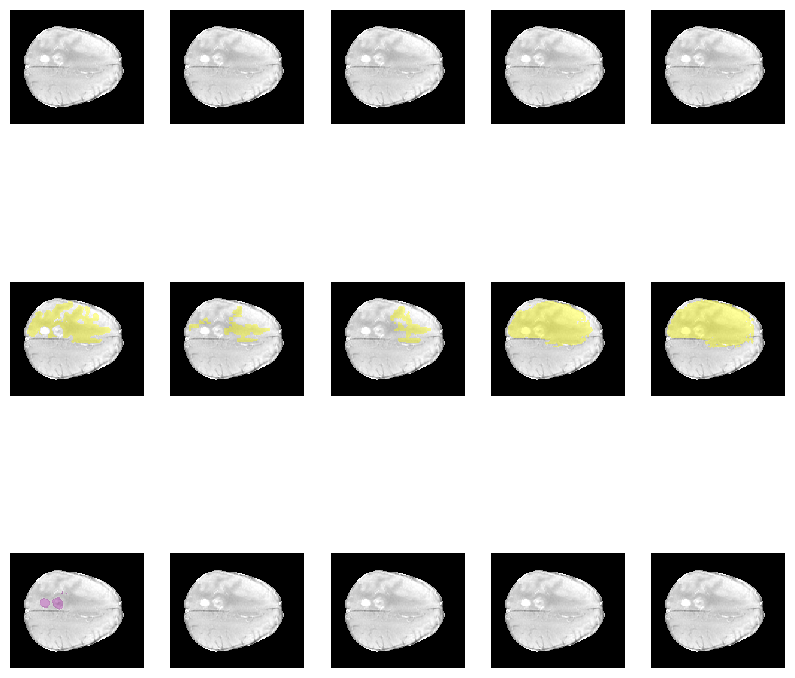

BraTS-SSA-00117-000-stk.npy
[[ 49.  62. 145. 163.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00117-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


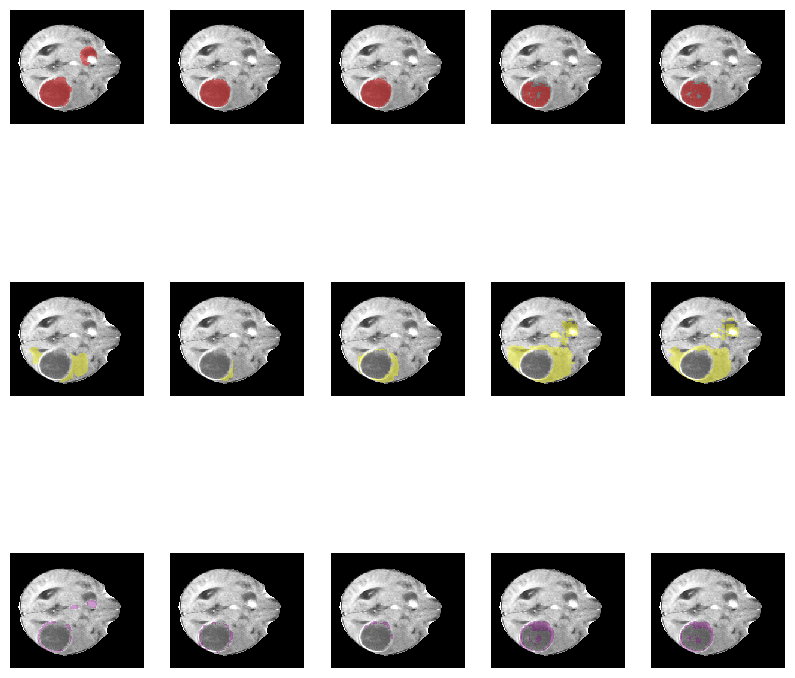

BraTS-SSA-00120-000-stk.npy
[[ 82. 104. 106. 130.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00120-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


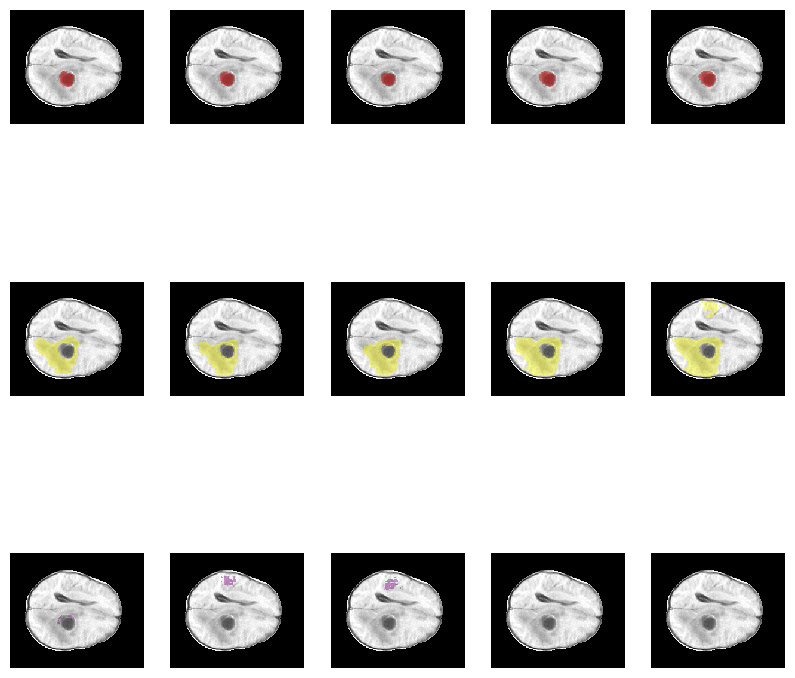

BraTS-SSA-00122-000-stk.npy
[[113. 107. 146. 132.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00122-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


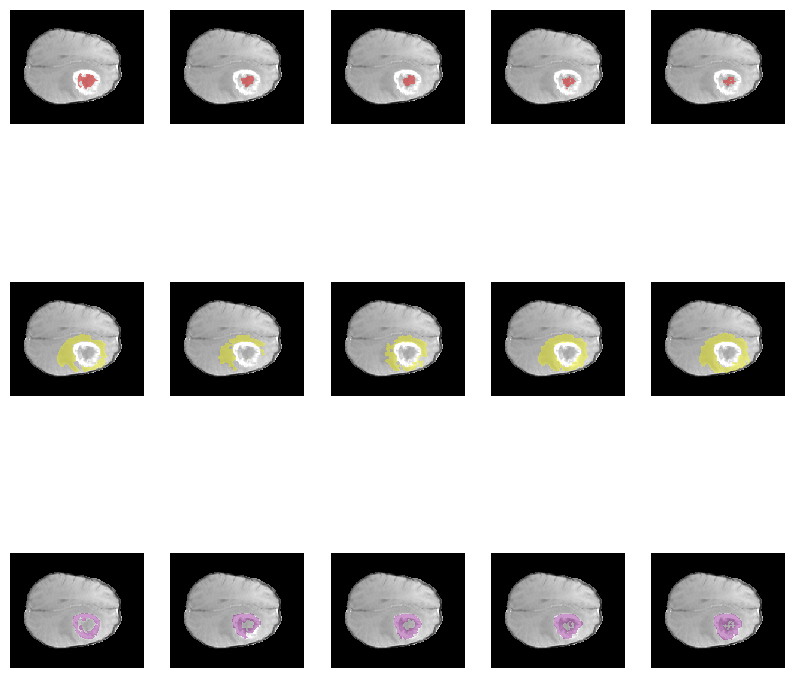

BraTS-SSA-00127-000-stk.npy
[[ 70.  95. 105. 120.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00127-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


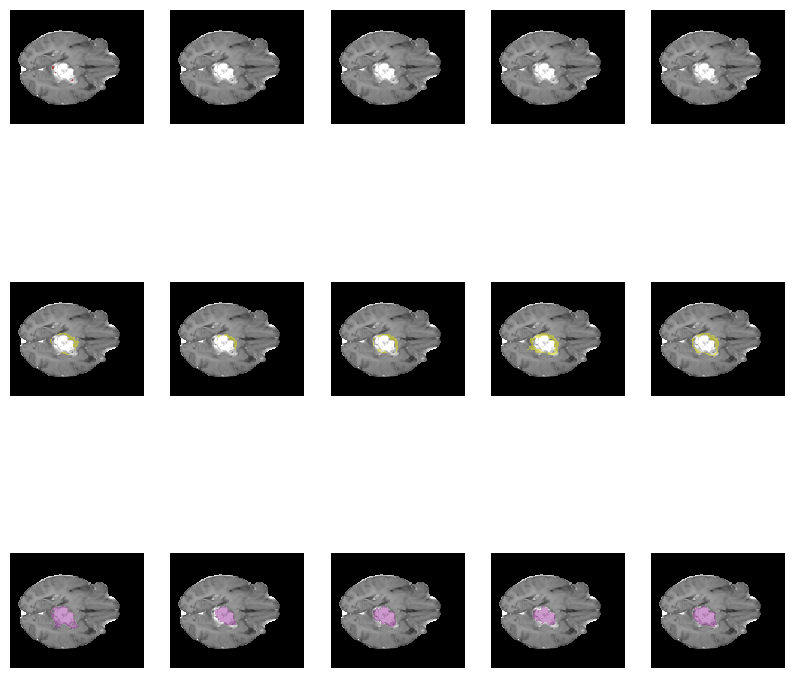

BraTS-SSA-00131-000-stk.npy
[[ 88.  88. 145. 122.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00131-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


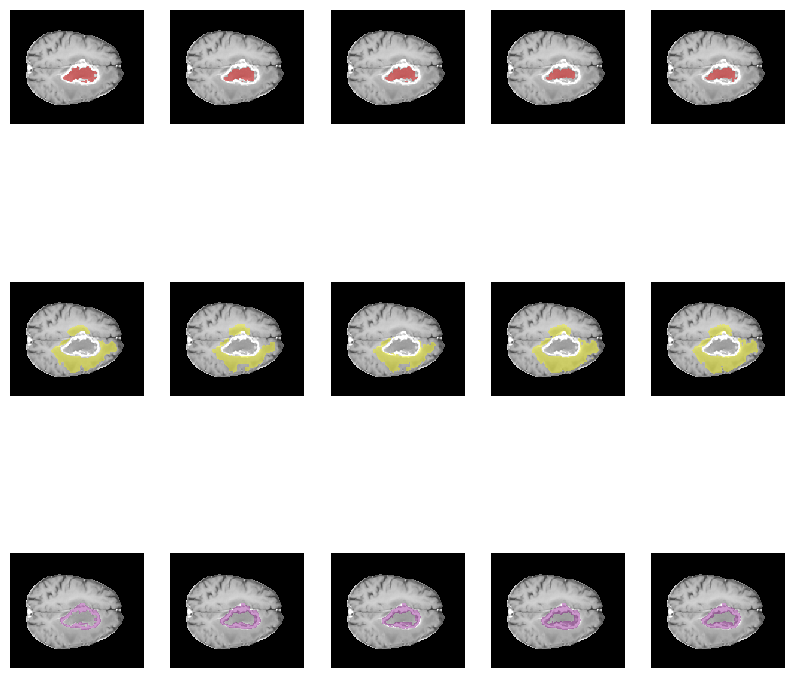

BraTS-SSA-00133-000-stk.npy
[[ 60. 103. 123. 142.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00133-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


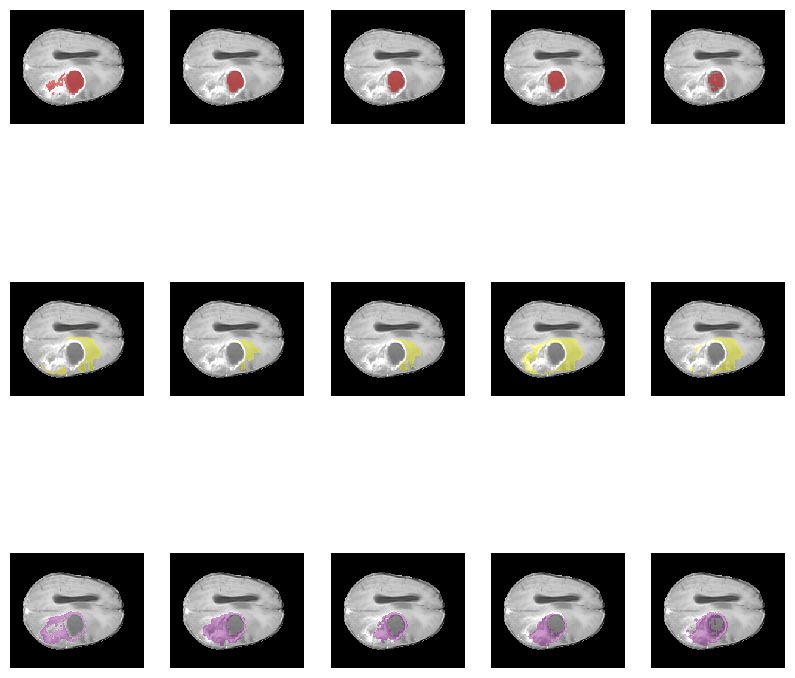

BraTS-SSA-00141-000-stk.npy
[[ 99.  58. 158. 105.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00141-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


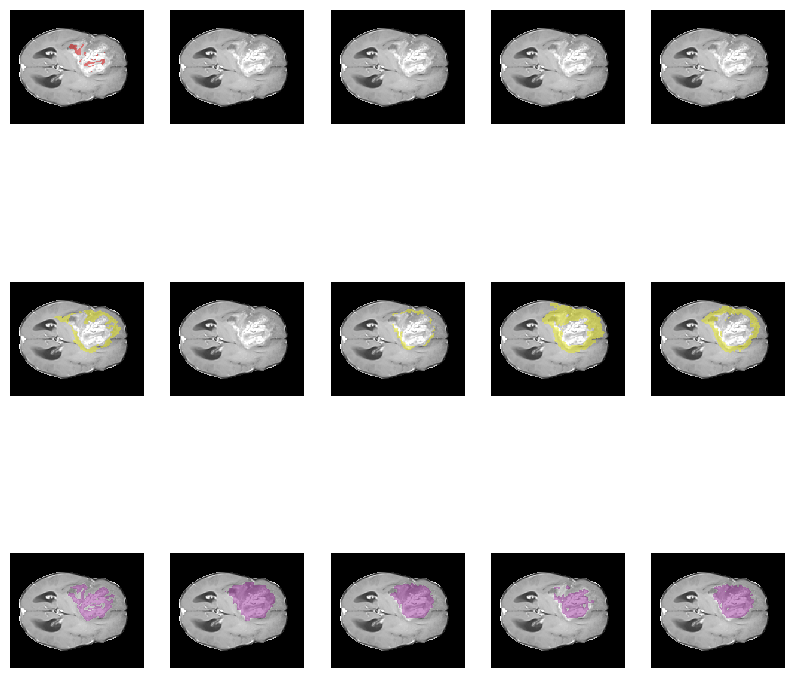

BraTS-SSA-00150-000-stk.npy
[[ 73. 113. 128. 160.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00150-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


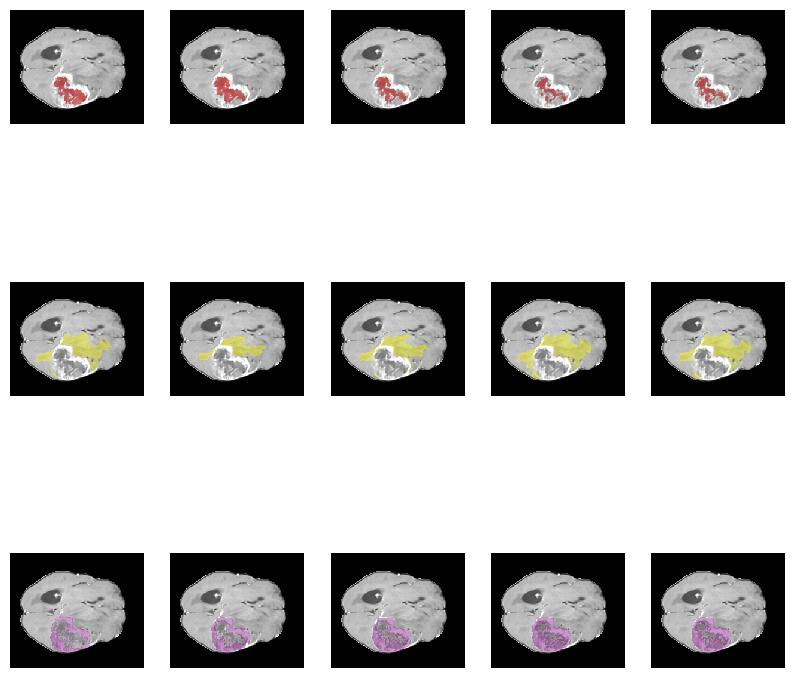

BraTS-SSA-00161-000-stk.npy
[[ 91.  48. 145.  93.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00161-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


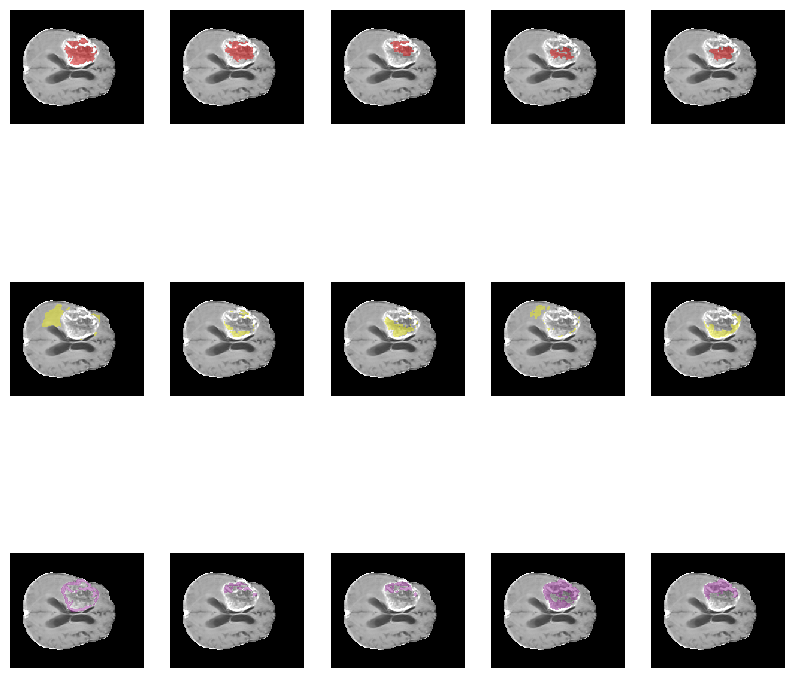

BraTS-SSA-00213-000-stk.npy
[[ 45.  67.  87. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00213-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


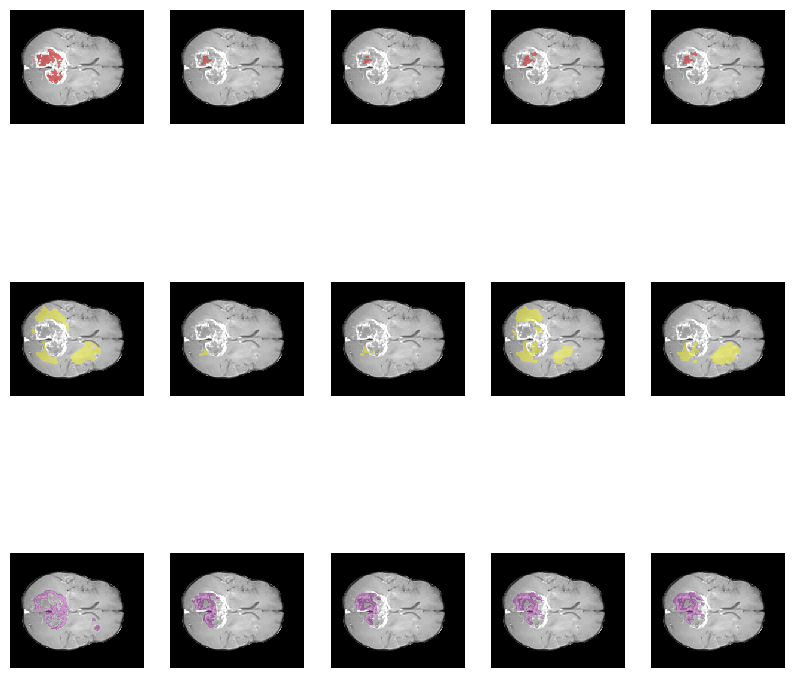

BraTS-SSA-00220-000-stk.npy
[[48. 44. 92. 70.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00220-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


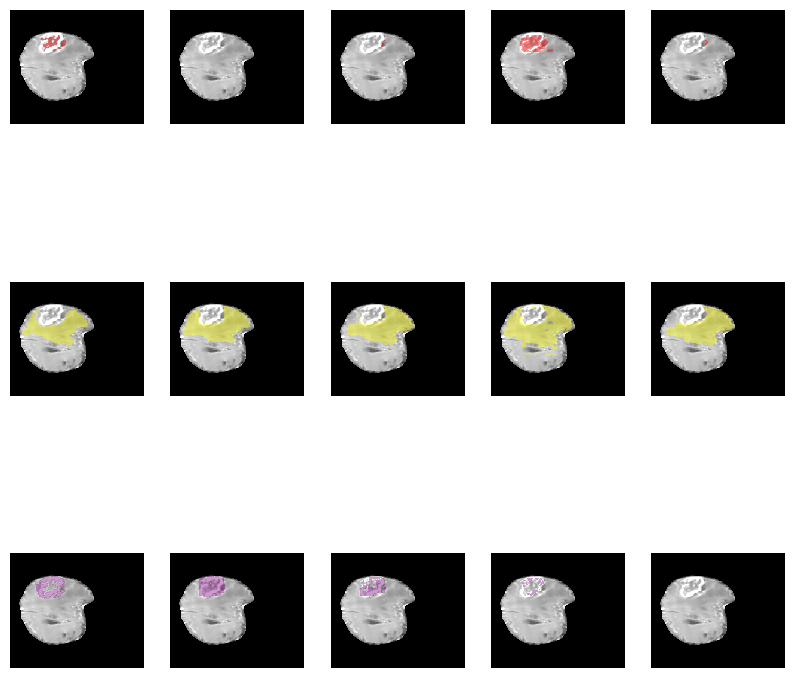

BraTS-SSA-00230-000-stk.npy
[[125.  75. 147.  95.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00230-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


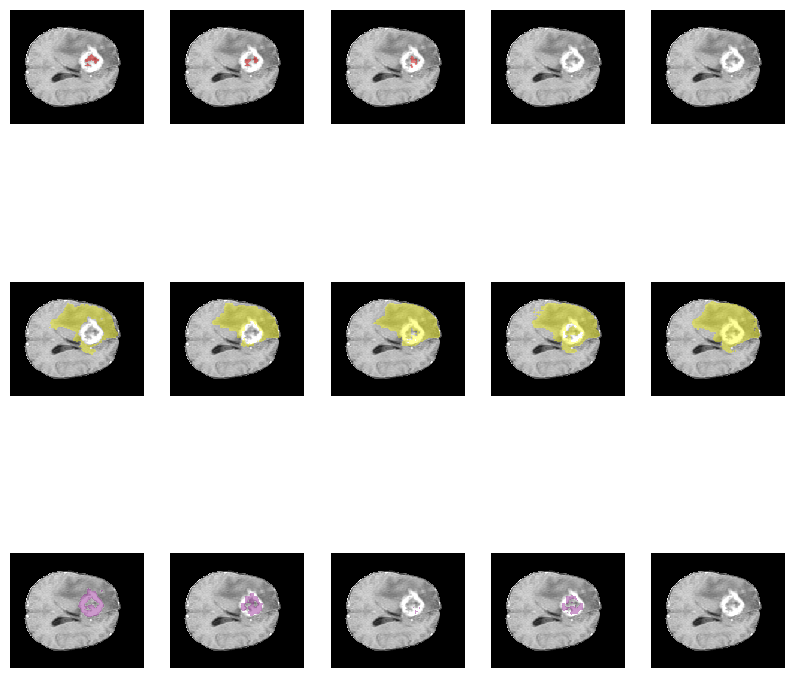

In [23]:
GLI_video_path = '/scratch-second/BraTS_SSA/Validation/images_UNN'
GLI_label_path = '/scratch-second/BraTS_SSA/Validation/labels_UNN'
GLI_pred_path = '/scratch-second/TTA_results/val_ent_only_decoder_lr4/logs/BraTS_GLI'
pred2 = '/scratch-second/TTA_results/val_ent_sup_decoder_lr4/logs/BraTS_GLI'
pred3 = '/scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI' 
pred4 = '/scratch-second/TTA_results/val_combined_decoder_lr4/logs/BraTS_GLI' 
cols = ["dice_ED", "dice_ET", "dice_NCR"]



GLI_worst_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_worst_list)
visualize_3d(GLI_worst_dataset, GLI_pred_path, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, pred2,  pred3, pred4)

BraTS-SSA-00007-000-stk.npy
[[111.  70. 150. 118.]]


pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00007-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overla

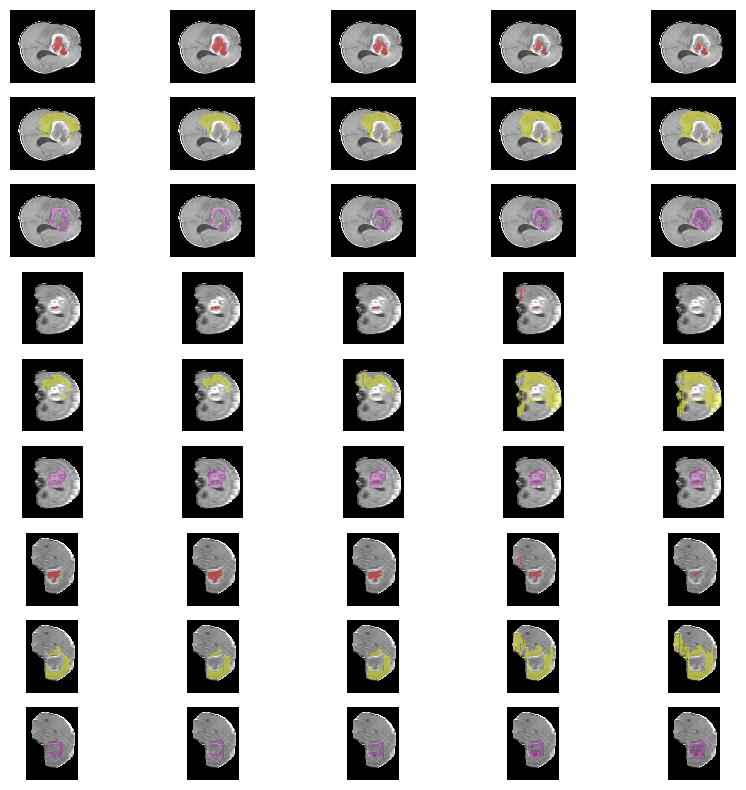

BraTS-SSA-00044-000-stk.npy
[[136.  79. 172.  98.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00044-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

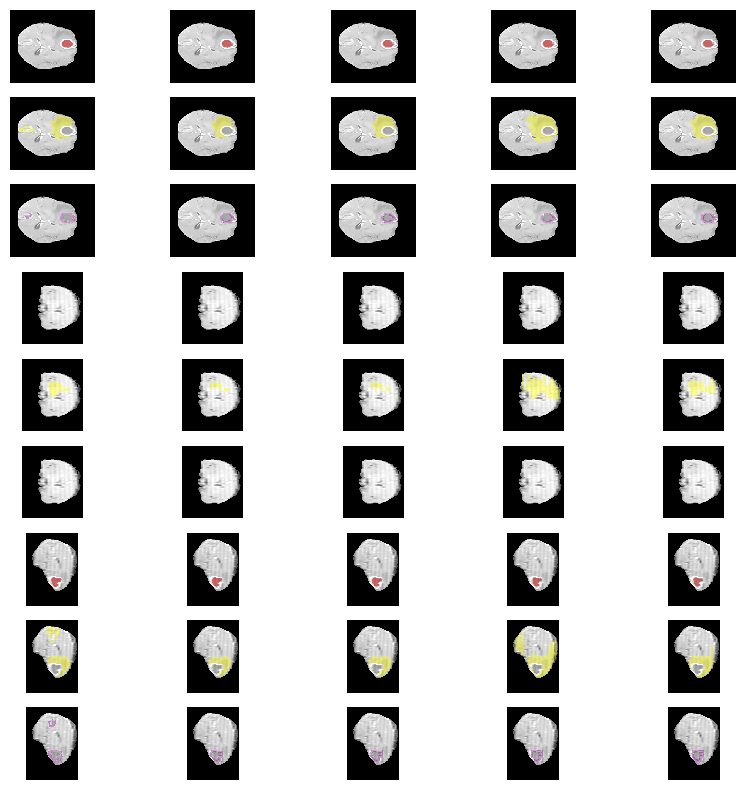

BraTS-SSA-00056-000-stk.npy
[[121.  85. 165. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00056-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

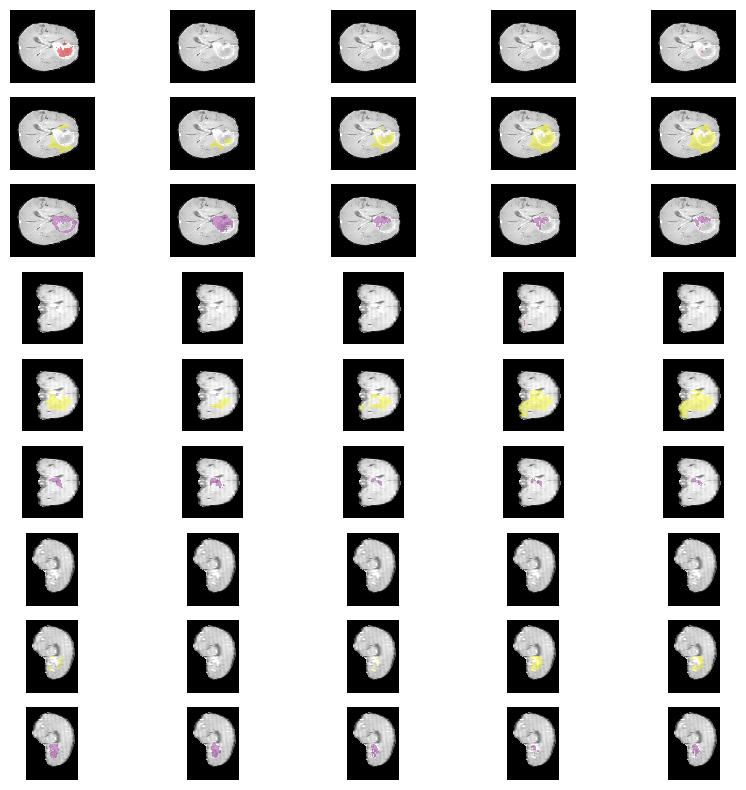

BraTS-SSA-00057-000-stk.npy
[[ 78.  41. 147. 100.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00057-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

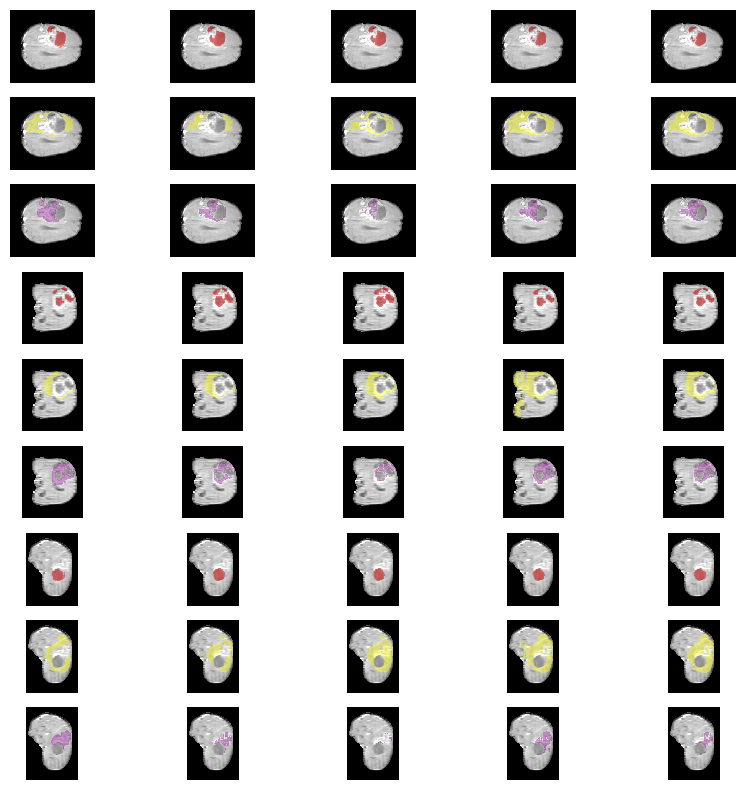

BraTS-SSA-00078-000-stk.npy
[[ 86. 109.  90. 110.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00078-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

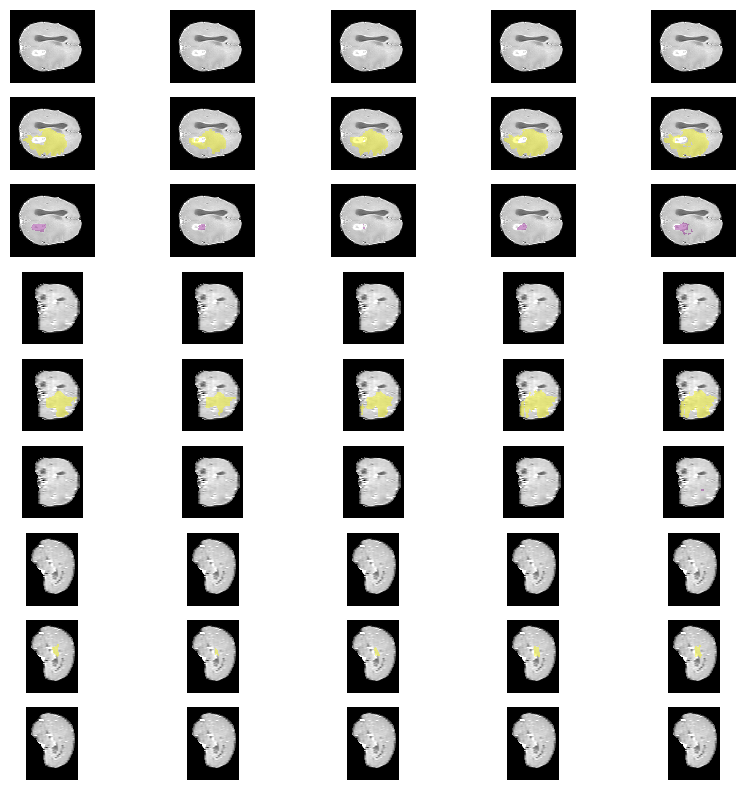

BraTS-SSA-00117-000-stk.npy
[[ 49.  62. 145. 163.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00117-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

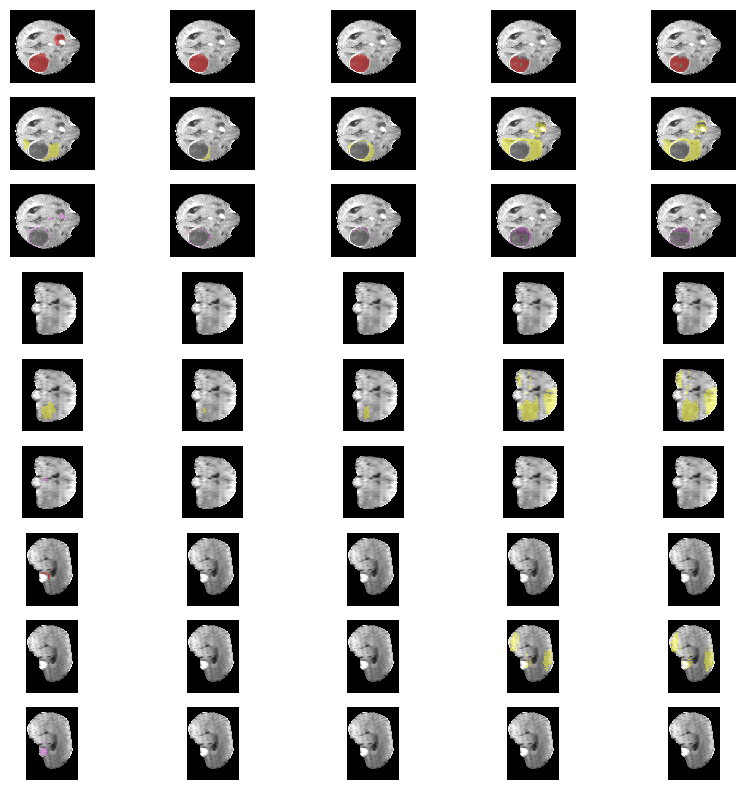

BraTS-SSA-00122-000-stk.npy
[[113. 107. 146. 132.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00122-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

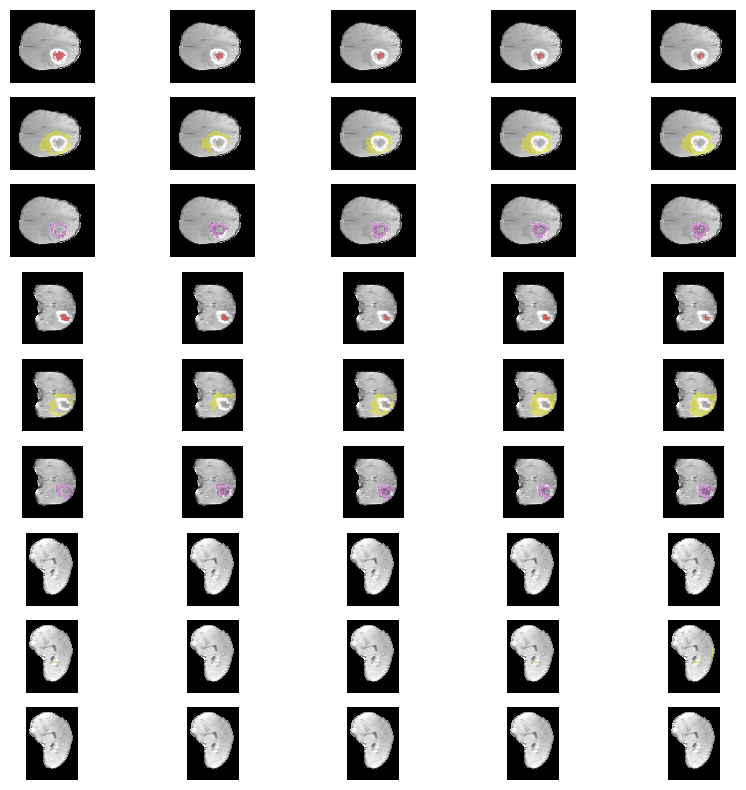

BraTS-SSA-00127-000-stk.npy
[[ 70.  95. 105. 120.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00127-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

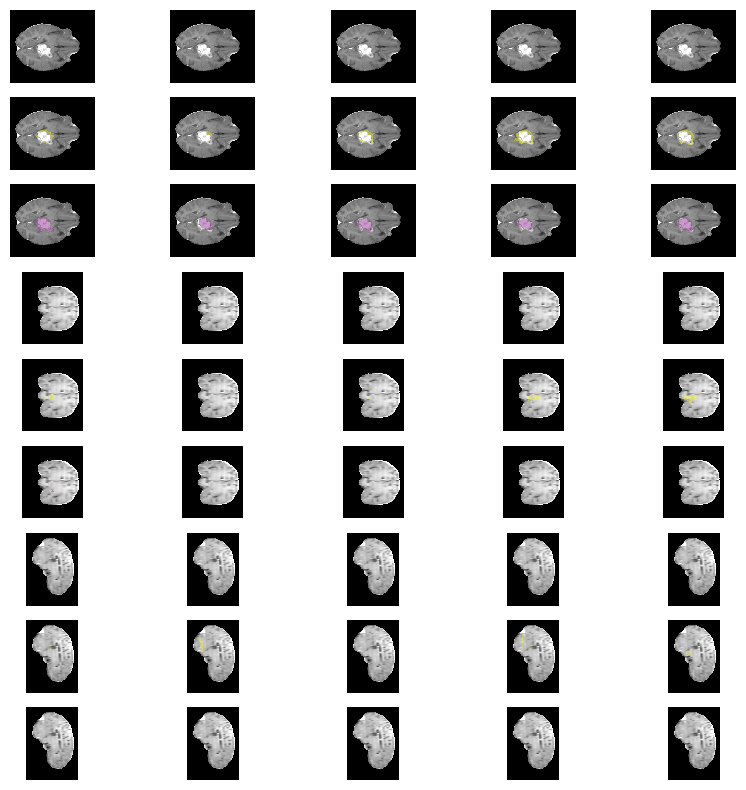

BraTS-SSA-00131-000-stk.npy
[[ 88.  88. 145. 122.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00131-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

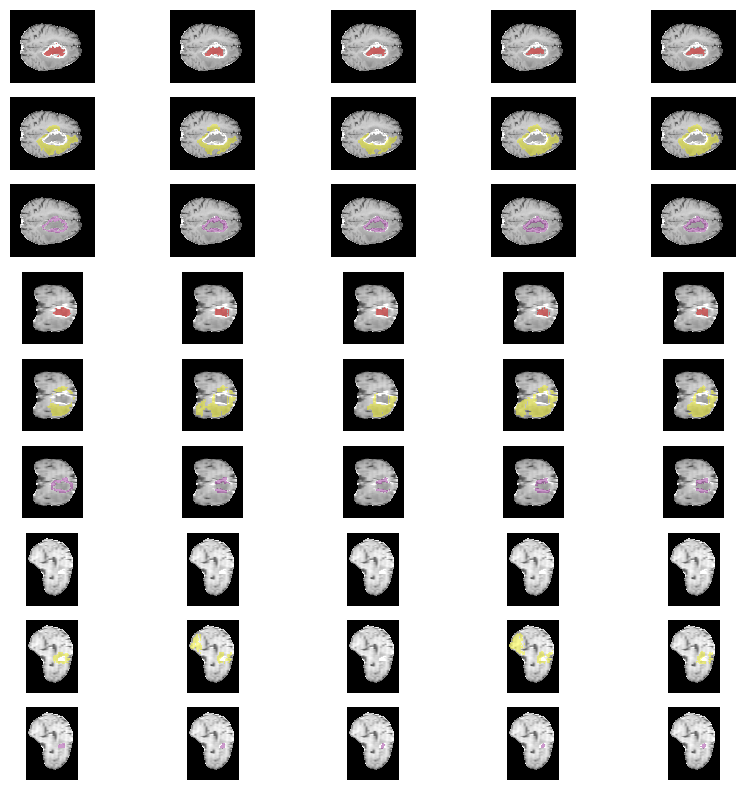

BraTS-SSA-00133-000-stk.npy
[[ 60. 103. 123. 142.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00133-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

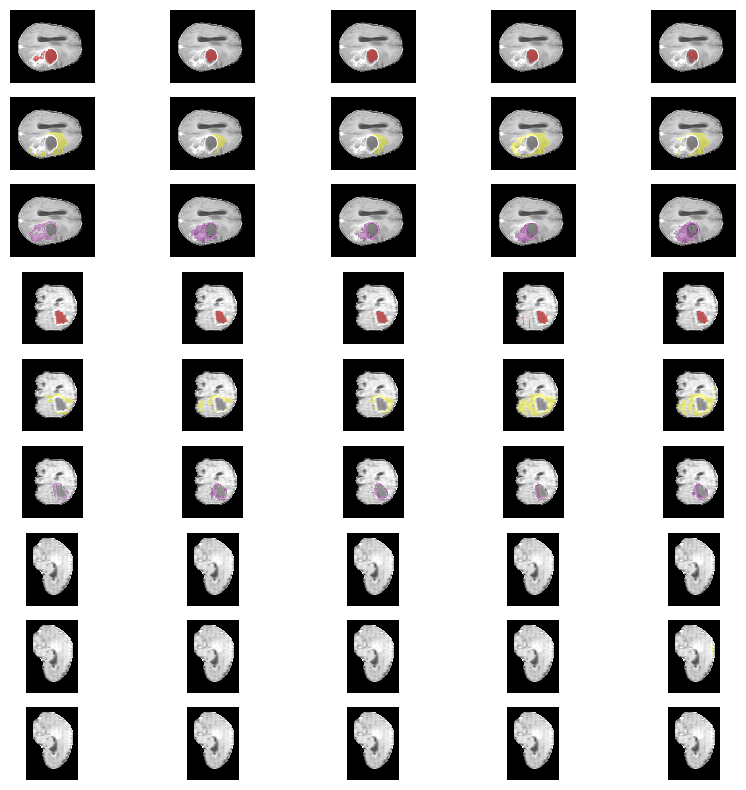

BraTS-SSA-00141-000-stk.npy
[[ 99.  58. 158. 105.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00141-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

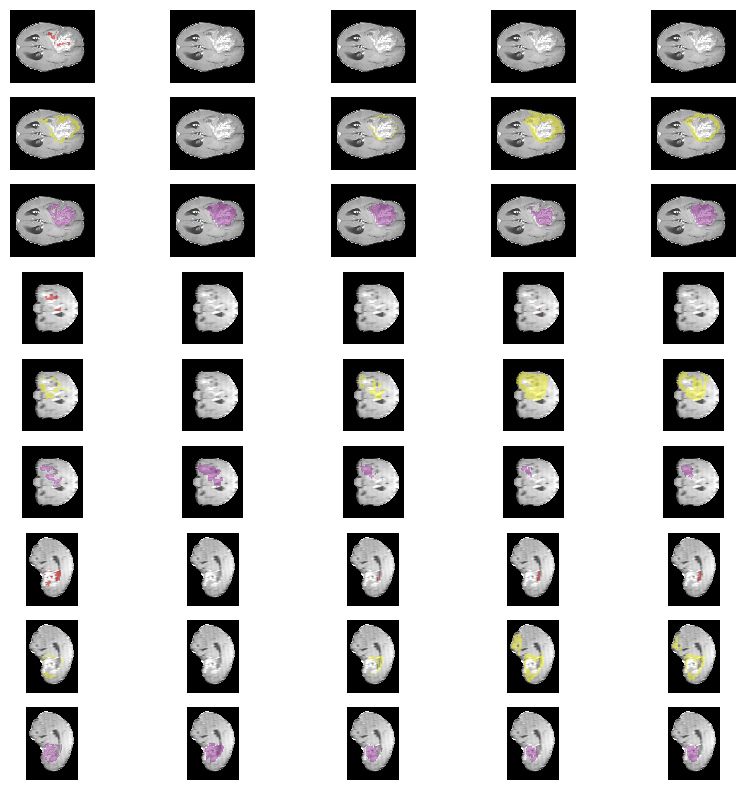

BraTS-SSA-00150-000-stk.npy
[[ 73. 113. 128. 160.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00150-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

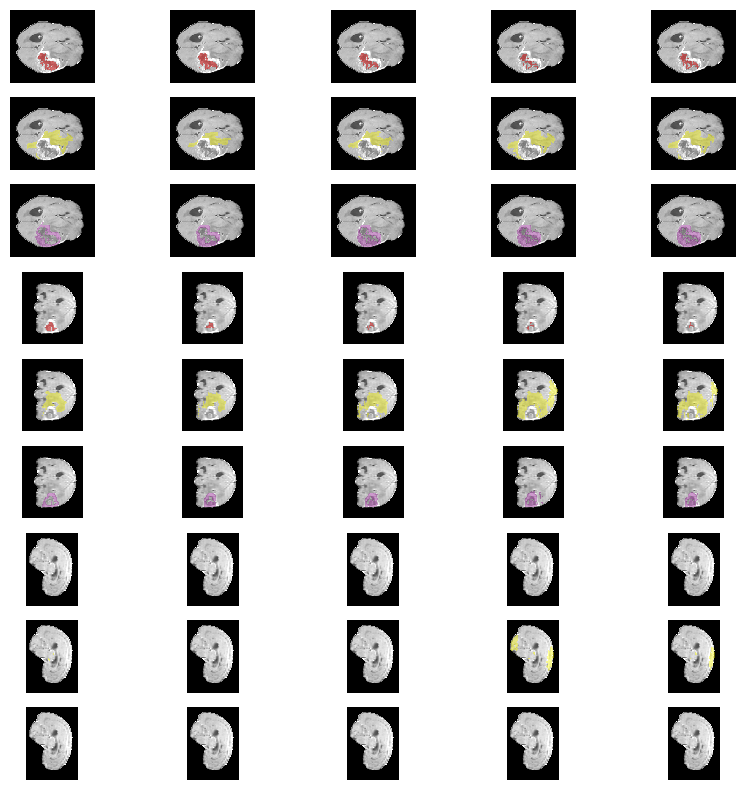

BraTS-SSA-00213-000-stk.npy
[[ 45.  67.  87. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00213-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

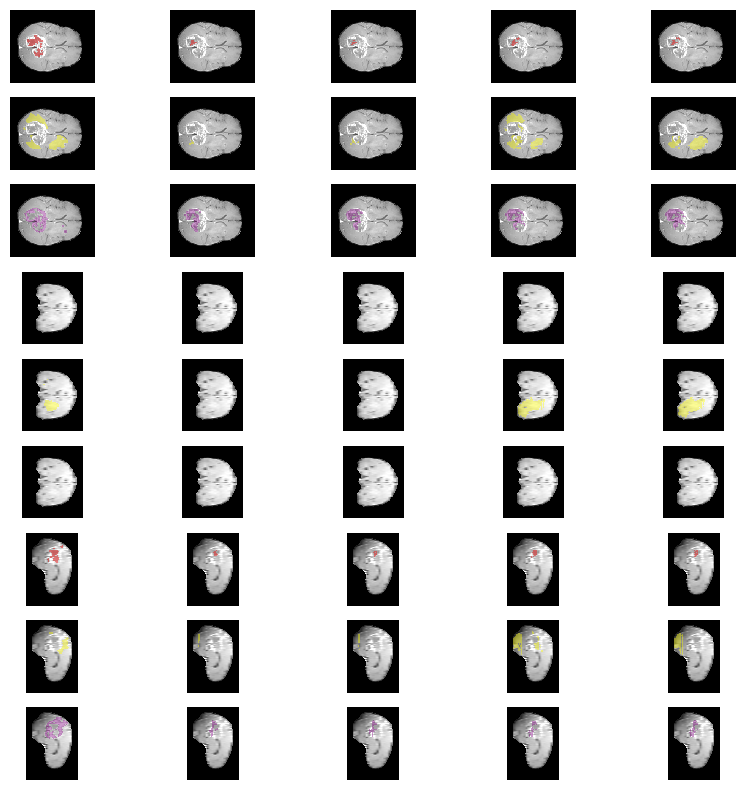

BraTS-SSA-00220-000-stk.npy
[[48. 44. 92. 70.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00220-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rg

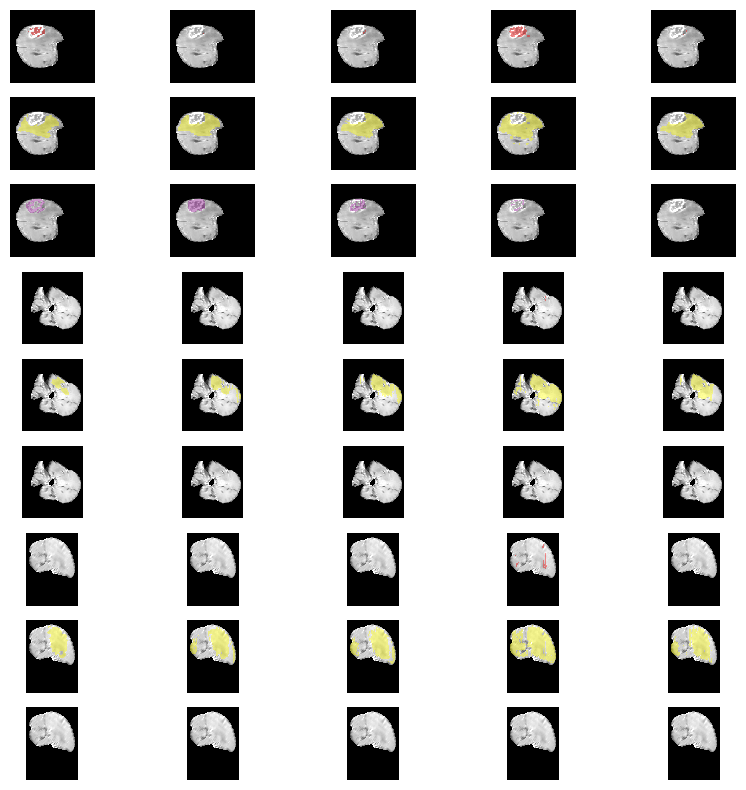

BraTS-SSA-00230-000-stk.npy
[[125.  75. 147.  95.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI/BraTS-SSA-00230-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

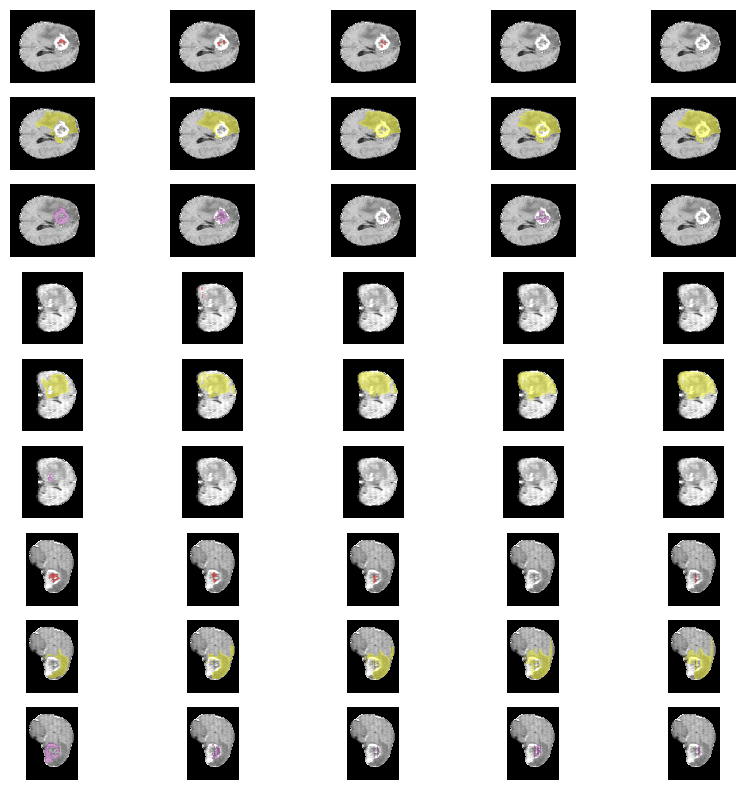

In [15]:
GLI_video_path = '/scratch-second/BraTS_SSA/Validation/images_UNN'
GLI_label_path = '/scratch-second/BraTS_SSA/Validation/labels_UNN'
GLI_pred_path = '/scratch-second/TTA_results/val_ent_only_decoder_lr4/logs/BraTS_GLI'
pred2 = '/scratch-second/TTA_results/val_ent_sup_decoder_lr4/logs/BraTS_GLI'
pred3 = '/scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI' 
pred4 = '/scratch-second/TTA_results/val_combined_decoder_lr4/logs/BraTS_GLI' 
cols = ["dice_ED", "dice_ET", "dice_NCR"]



GLI_worst_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_worst_list)
visualize_4d(GLI_worst_dataset, GLI_pred_path, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, pred2,  pred3, pred4)

BraTS-SSA-00007-000-stk.npy
[[111.  70. 150. 118.]]


pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI/BraTS-SSA-00007-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overla

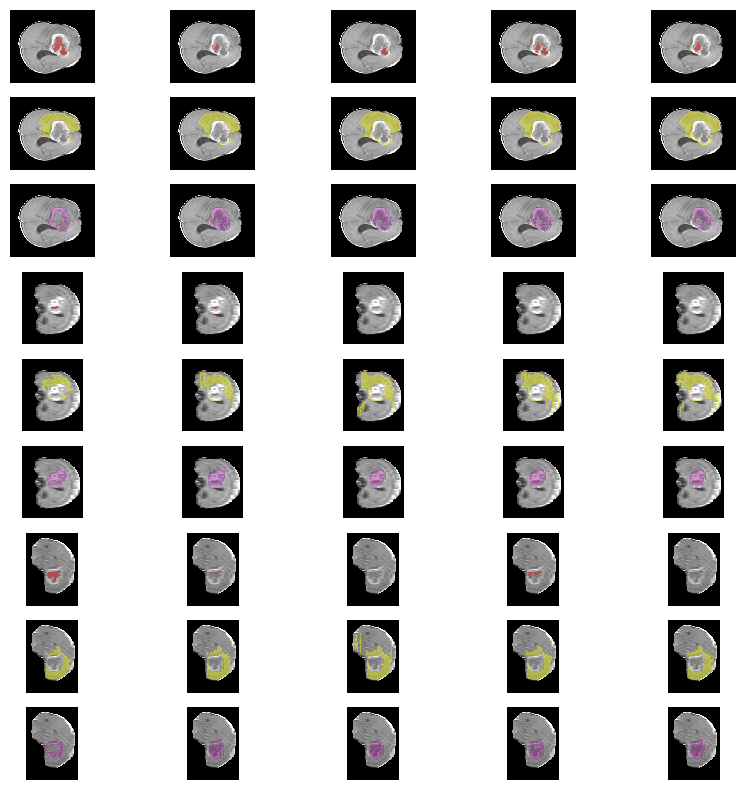

BraTS-SSA-00044-000-stk.npy
[[136.  79. 172.  98.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI/BraTS-SSA-00044-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

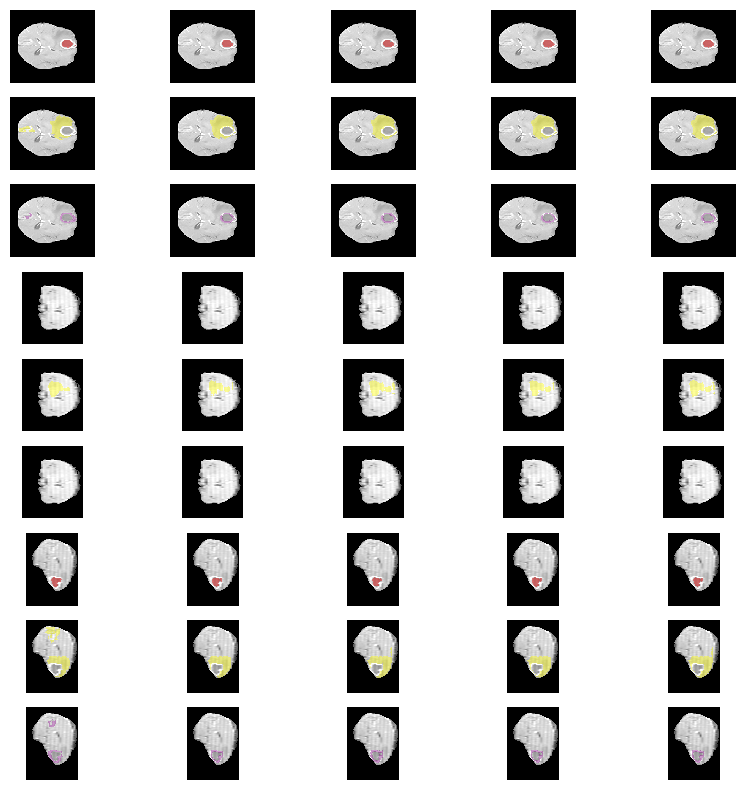

BraTS-SSA-00056-000-stk.npy
[[121.  85. 165. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI/BraTS-SSA-00056-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

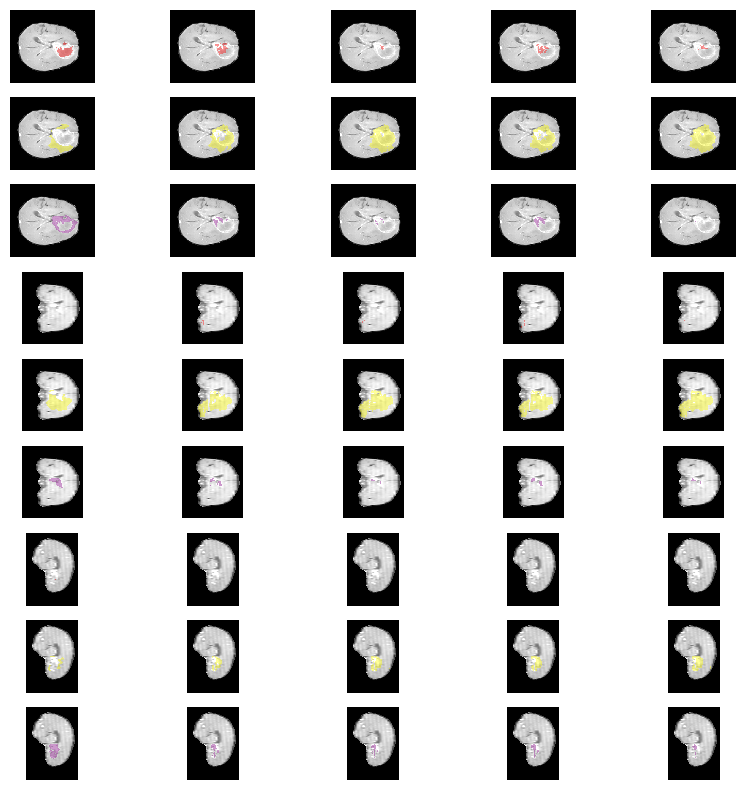

BraTS-SSA-00057-000-stk.npy
[[ 78.  41. 147. 100.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI/BraTS-SSA-00057-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

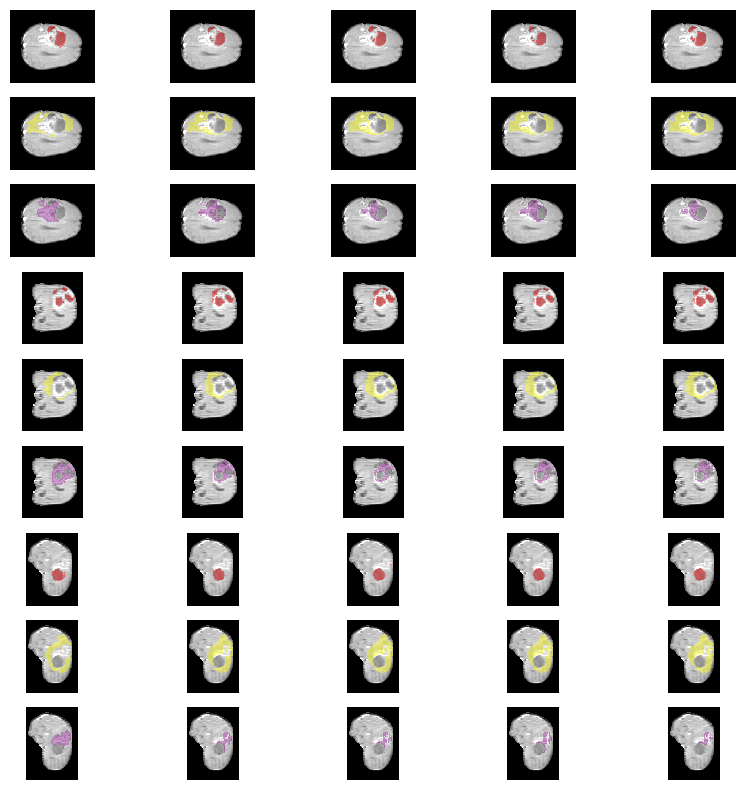

BraTS-SSA-00078-000-stk.npy
[[ 86. 109.  90. 110.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI/BraTS-SSA-00078-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

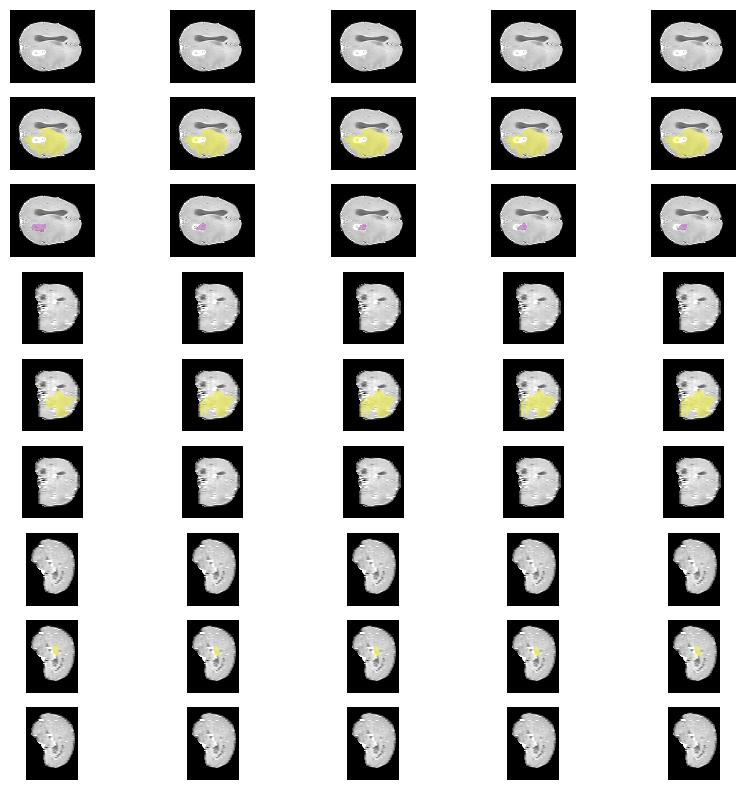

BraTS-SSA-00117-000-stk.npy
[[ 49.  62. 145. 163.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI/BraTS-SSA-00117-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

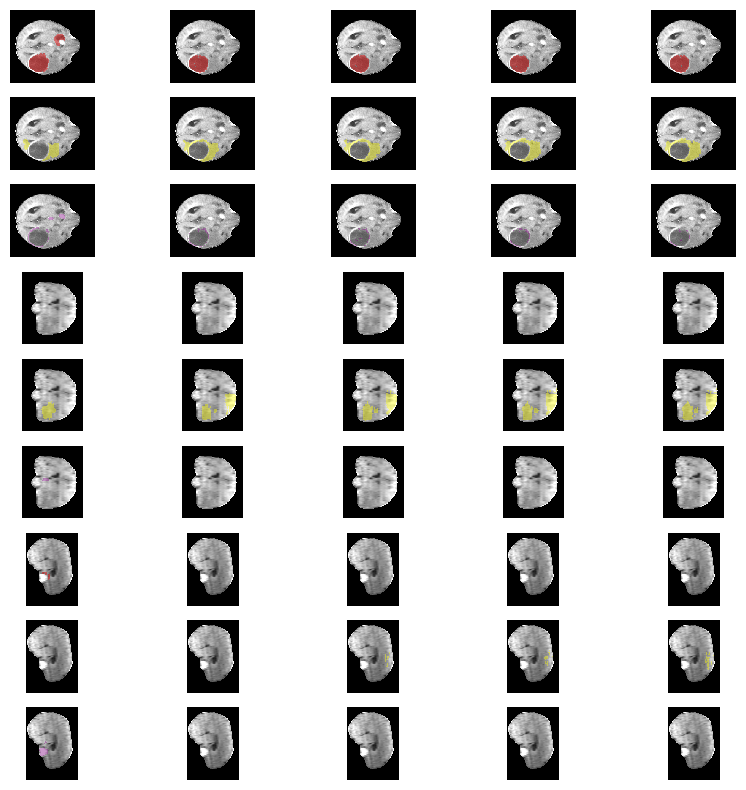

BraTS-SSA-00122-000-stk.npy
[[113. 107. 146. 132.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI/BraTS-SSA-00122-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

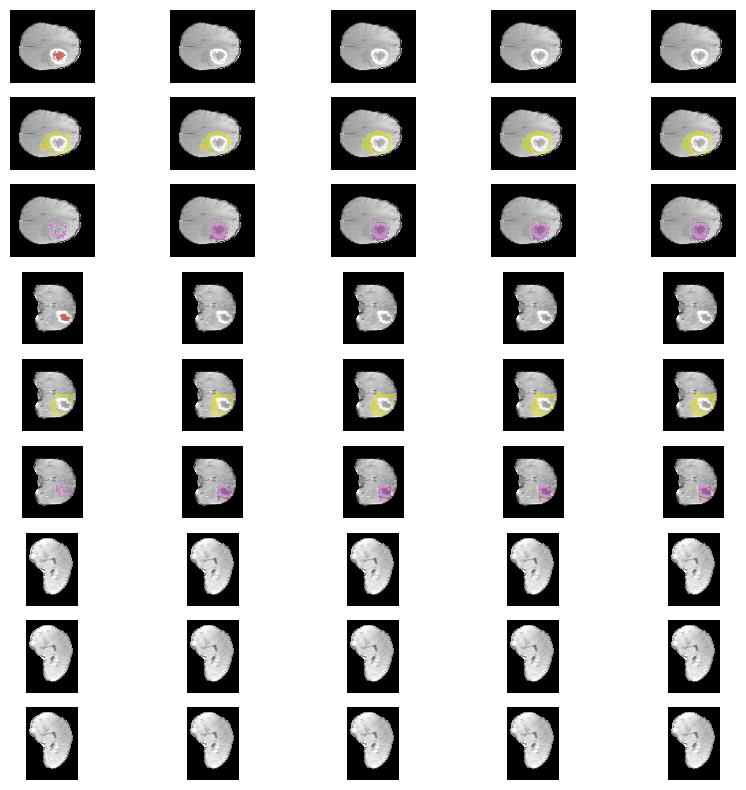

BraTS-SSA-00127-000-stk.npy
[[ 70.  95. 105. 120.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI/BraTS-SSA-00127-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

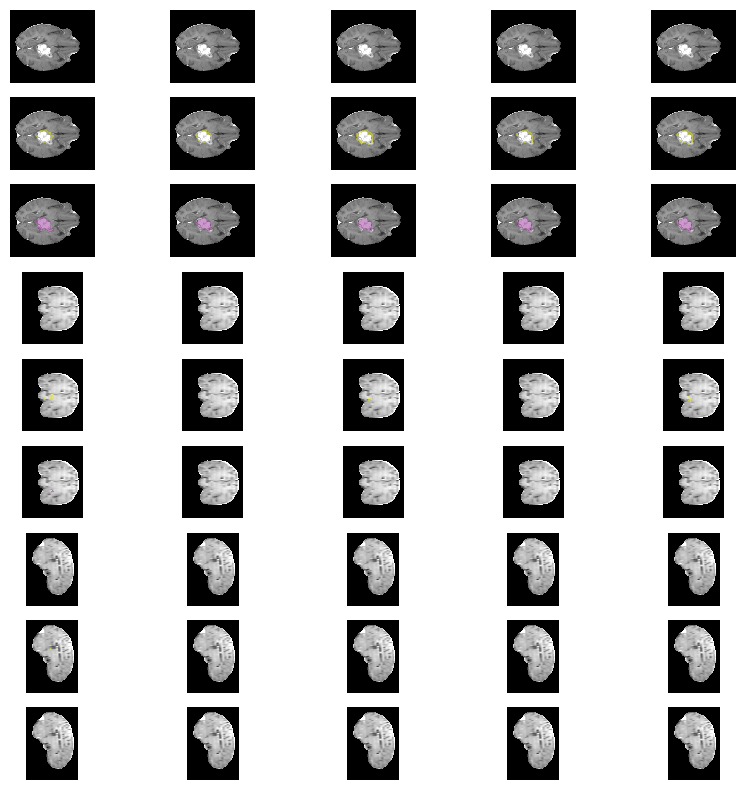

BraTS-SSA-00131-000-stk.npy
[[ 88.  88. 145. 122.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI/BraTS-SSA-00131-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

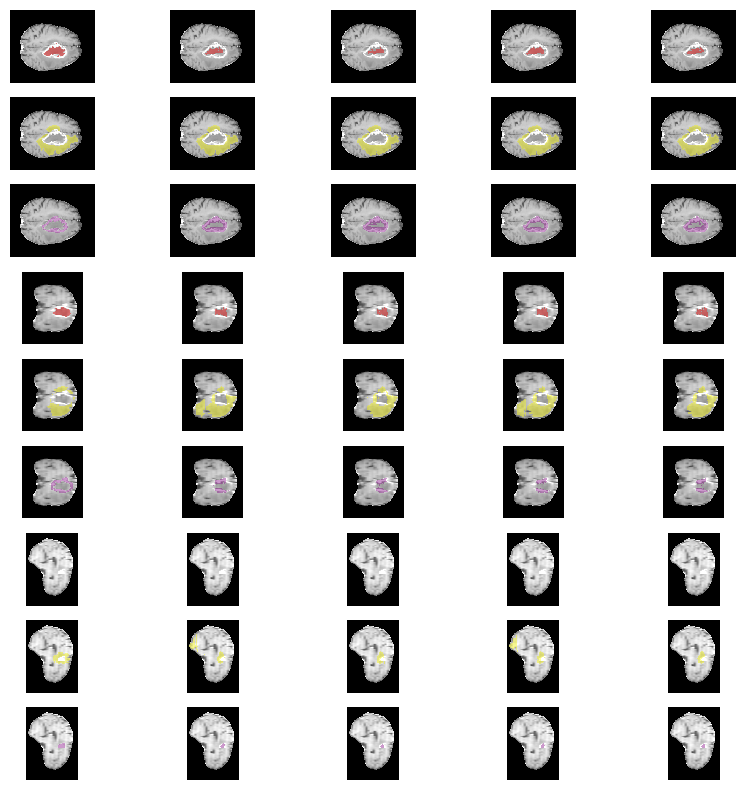

BraTS-SSA-00133-000-stk.npy
[[ 60. 103. 123. 142.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI/BraTS-SSA-00133-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

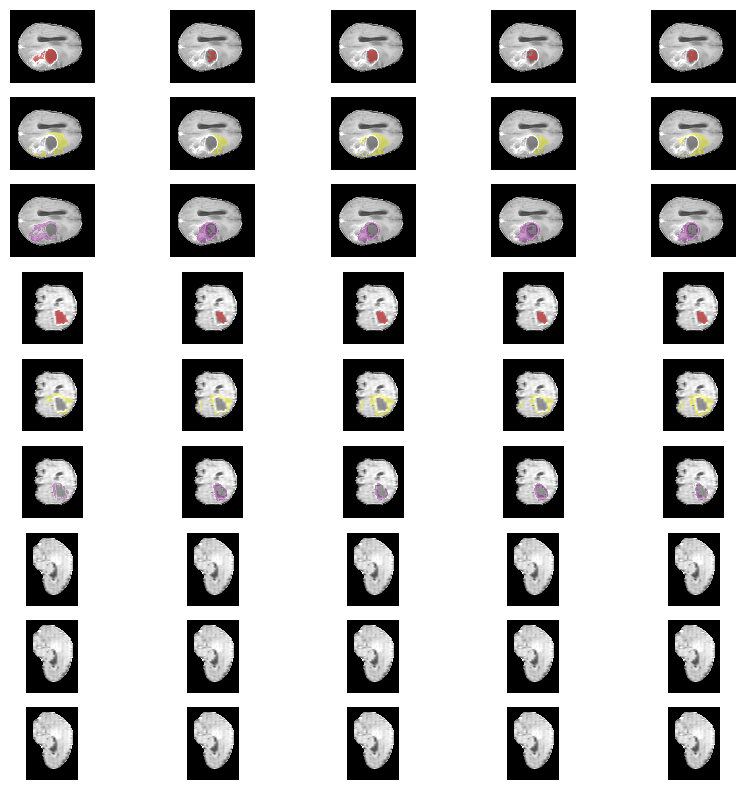

BraTS-SSA-00141-000-stk.npy
[[ 99.  58. 158. 105.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI/BraTS-SSA-00141-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

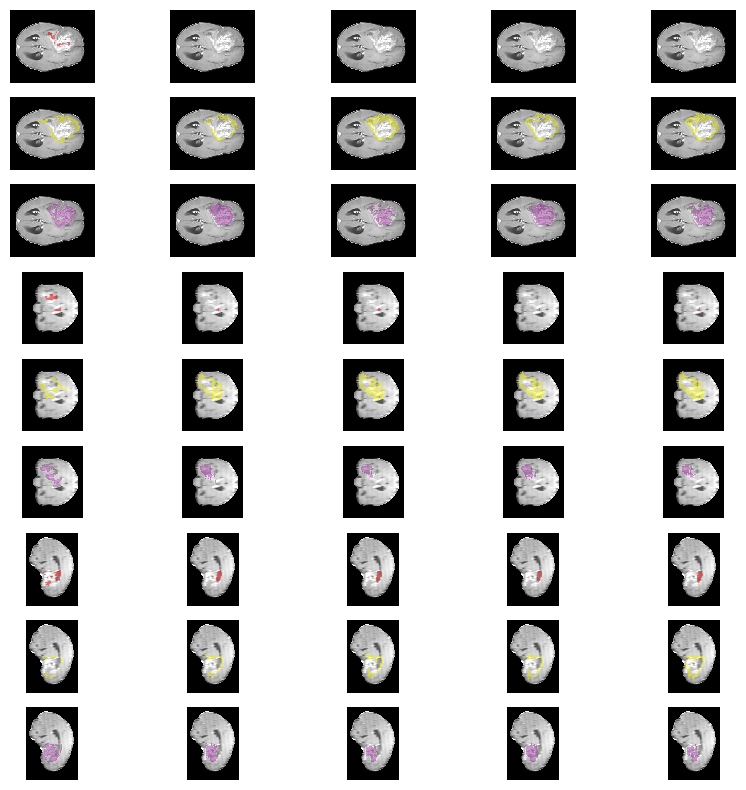

BraTS-SSA-00150-000-stk.npy
[[ 73. 113. 128. 160.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI/BraTS-SSA-00150-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

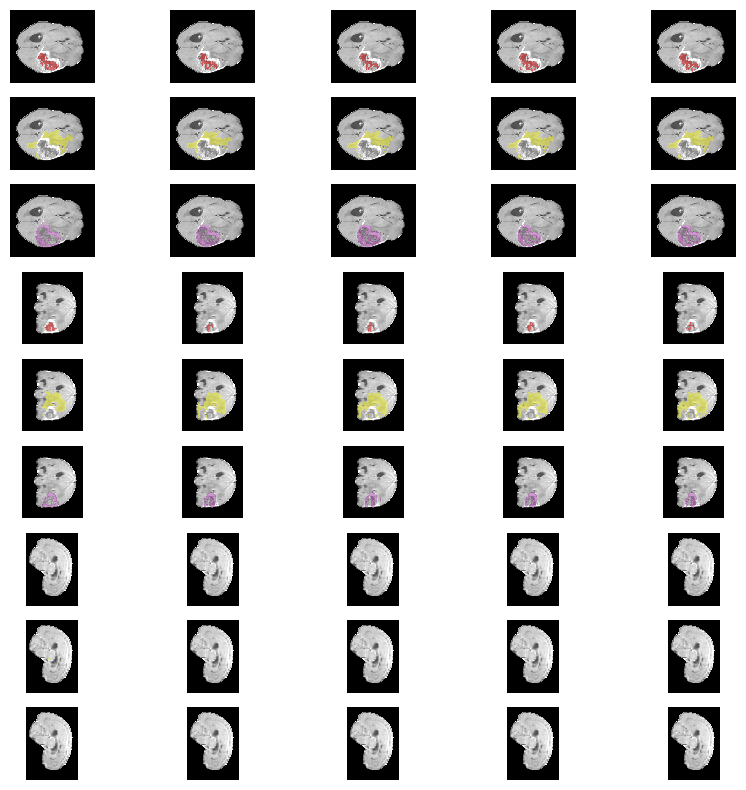

BraTS-SSA-00213-000-stk.npy
[[ 45.  67.  87. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI/BraTS-SSA-00213-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

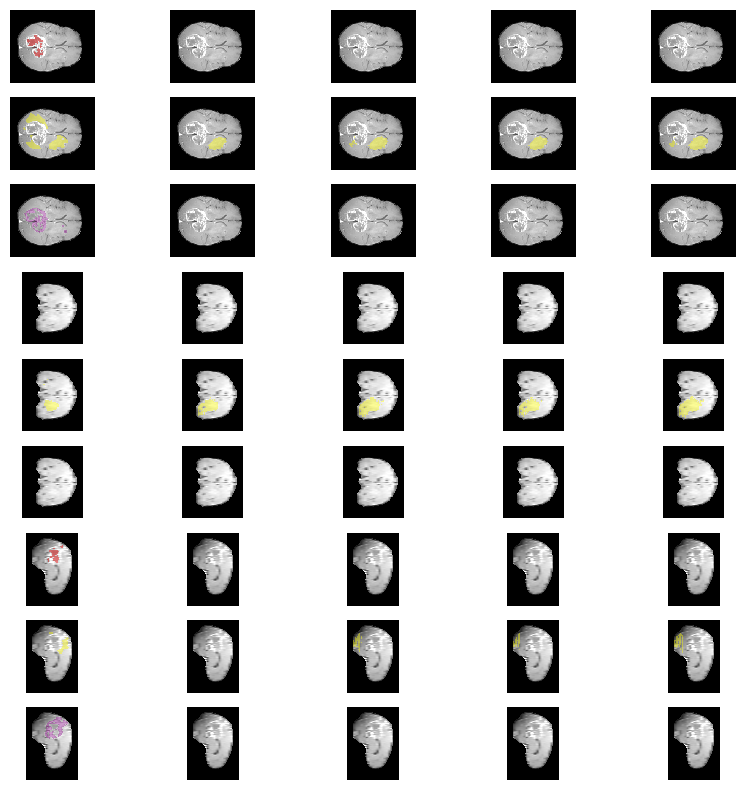

BraTS-SSA-00220-000-stk.npy
[[48. 44. 92. 70.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI/BraTS-SSA-00220-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rg

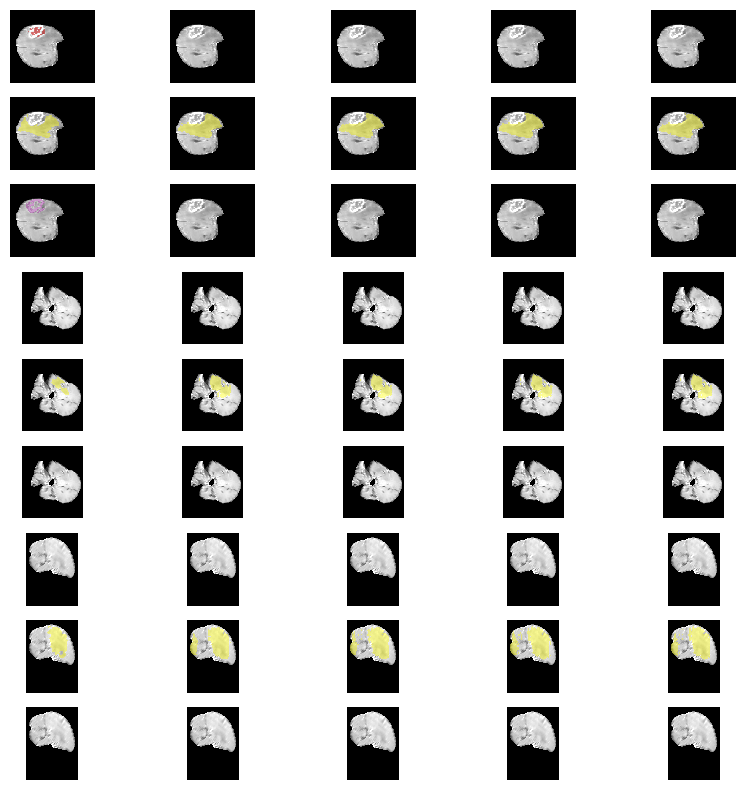

BraTS-SSA-00230-000-stk.npy
[[125.  75. 147.  95.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI/BraTS-SSA-00230-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

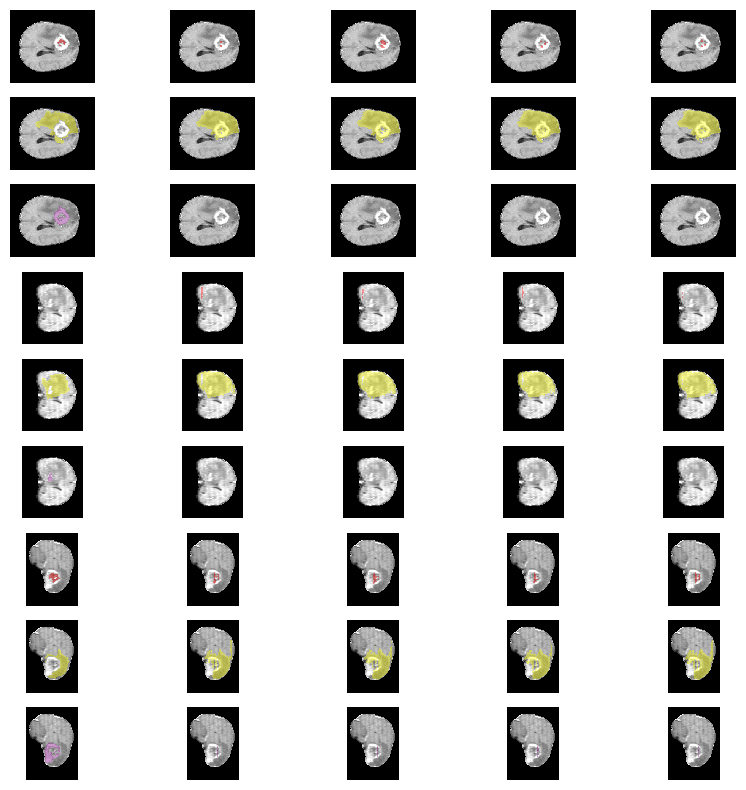

In [16]:
GLI_video_path = '/scratch-second/BraTS_SSA/Validation/images_UNN'
GLI_label_path = '/scratch-second/BraTS_SSA/Validation/labels_UNN'
GLI_pred_path = '/scratch-second/TTA_results/val_ent_only_decoder_lr5/logs/BraTS_GLI'
pred2 = '/scratch-second/TTA_results/val_ent_sup_decoder_lr5/logs/BraTS_GLI'
pred3 = '/scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI' 
pred4 = '/scratch-second/TTA_results/val_combined_decoder_lr5/logs/BraTS_GLI' 
cols = ["dice_ED", "dice_ET", "dice_NCR"]



GLI_worst_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_worst_list)
visualize_4d(GLI_worst_dataset, GLI_pred_path, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, pred2,  pred3, pred4)

BraTS-SSA-00007-000-stk.npy
[[111.  70. 150. 118.]]


pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI/BraTS-SSA-00007-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
o

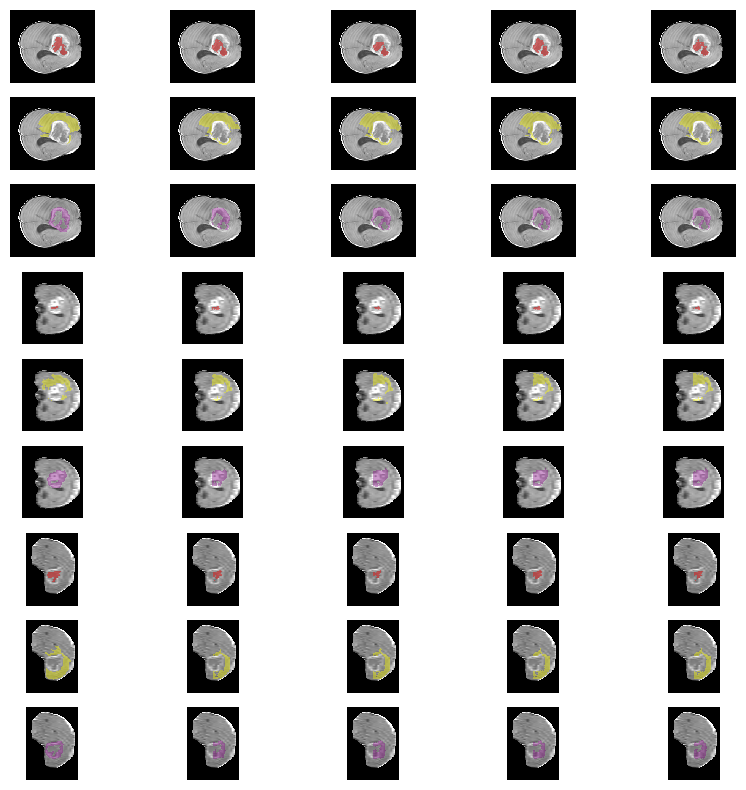

BraTS-SSA-00044-000-stk.npy
[[136.  79. 172.  98.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI/BraTS-SSA-00044-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

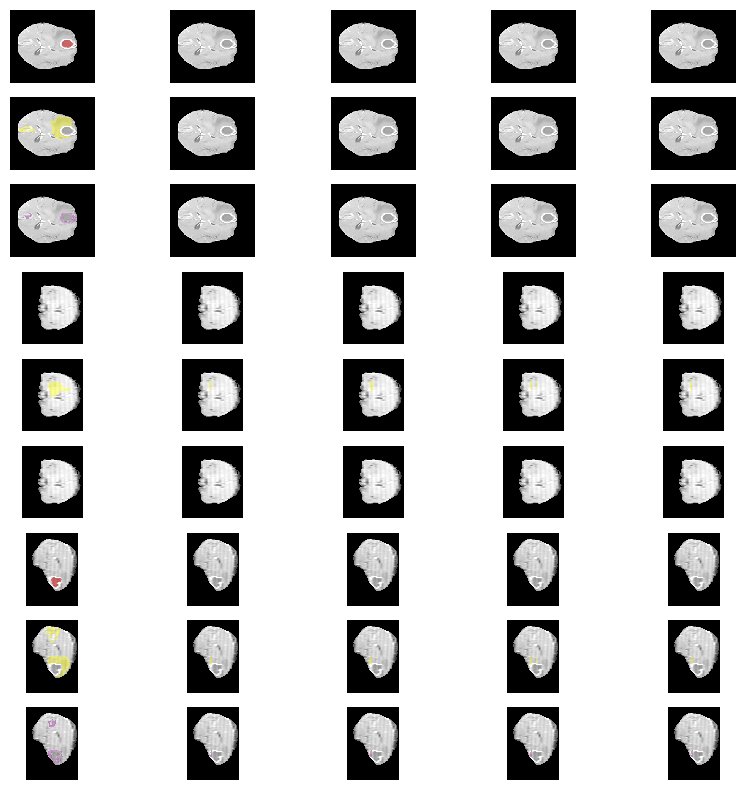

BraTS-SSA-00056-000-stk.npy
[[121.  85. 165. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI/BraTS-SSA-00056-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

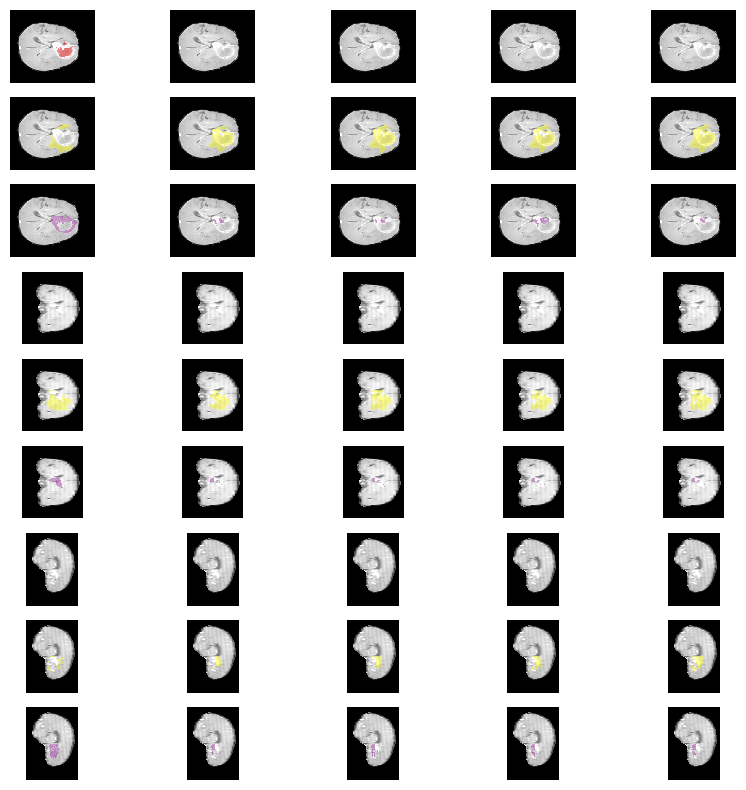

BraTS-SSA-00057-000-stk.npy
[[ 78.  41. 147. 100.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI/BraTS-SSA-00057-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

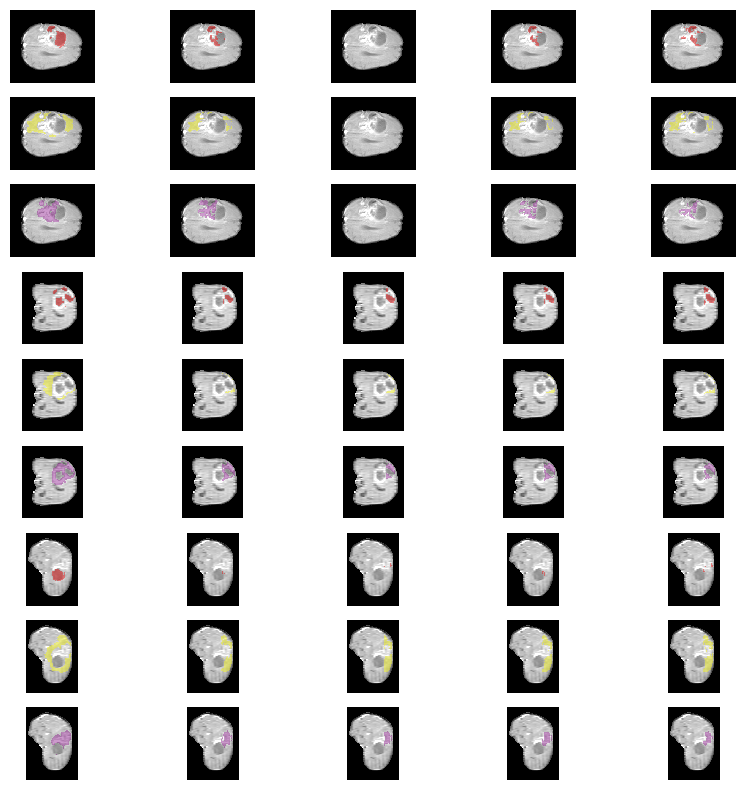

BraTS-SSA-00078-000-stk.npy
[[ 86. 109.  90. 110.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI/BraTS-SSA-00078-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

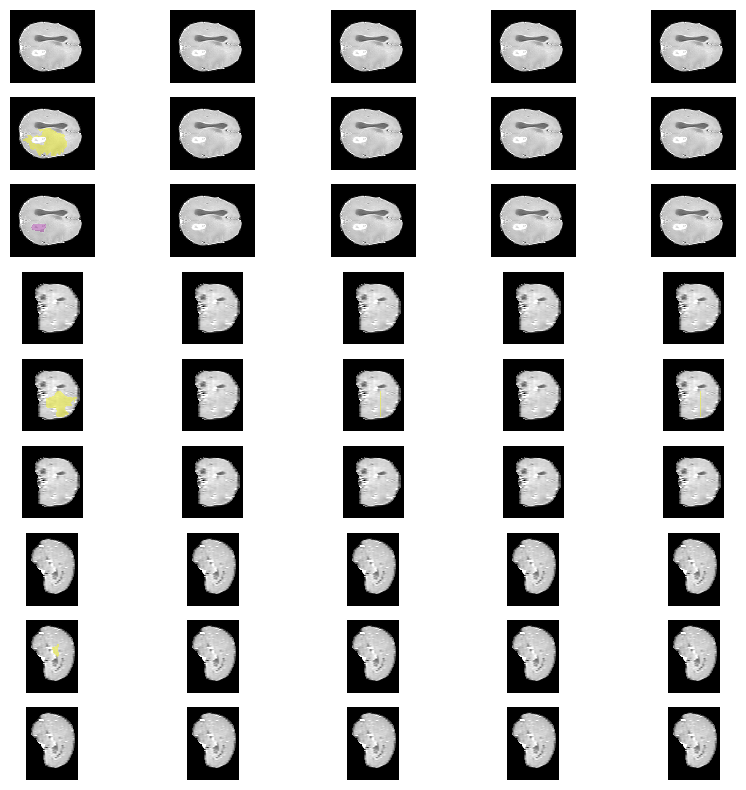

BraTS-SSA-00117-000-stk.npy
[[ 49.  62. 145. 163.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI/BraTS-SSA-00117-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

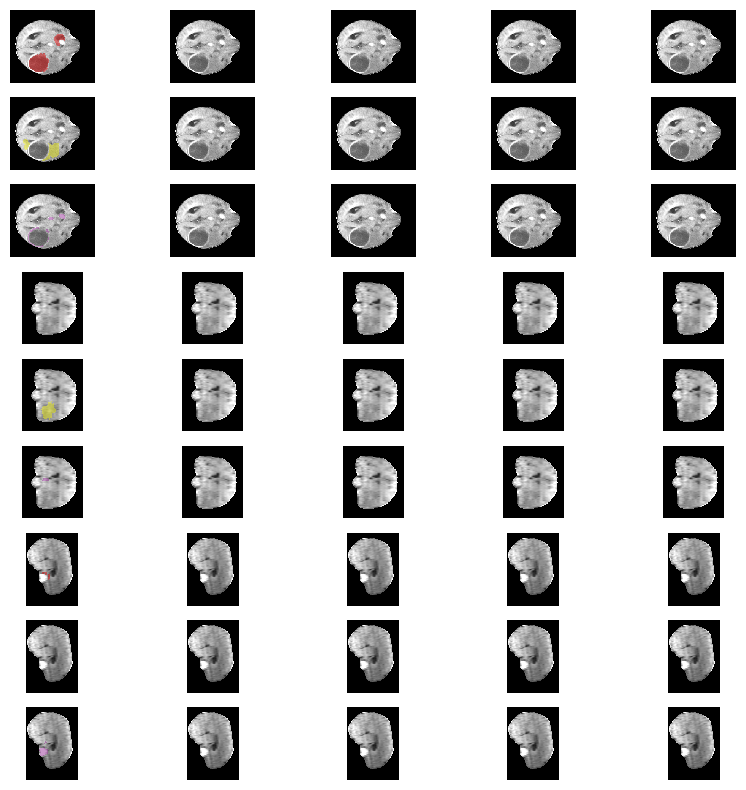

BraTS-SSA-00122-000-stk.npy
[[113. 107. 146. 132.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI/BraTS-SSA-00122-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

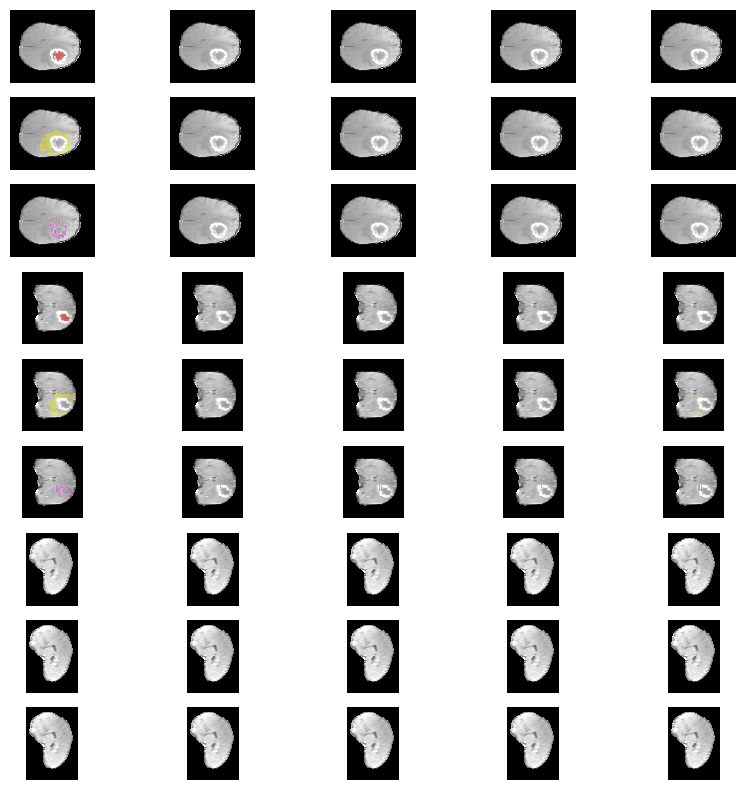

BraTS-SSA-00127-000-stk.npy
[[ 70.  95. 105. 120.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI/BraTS-SSA-00127-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

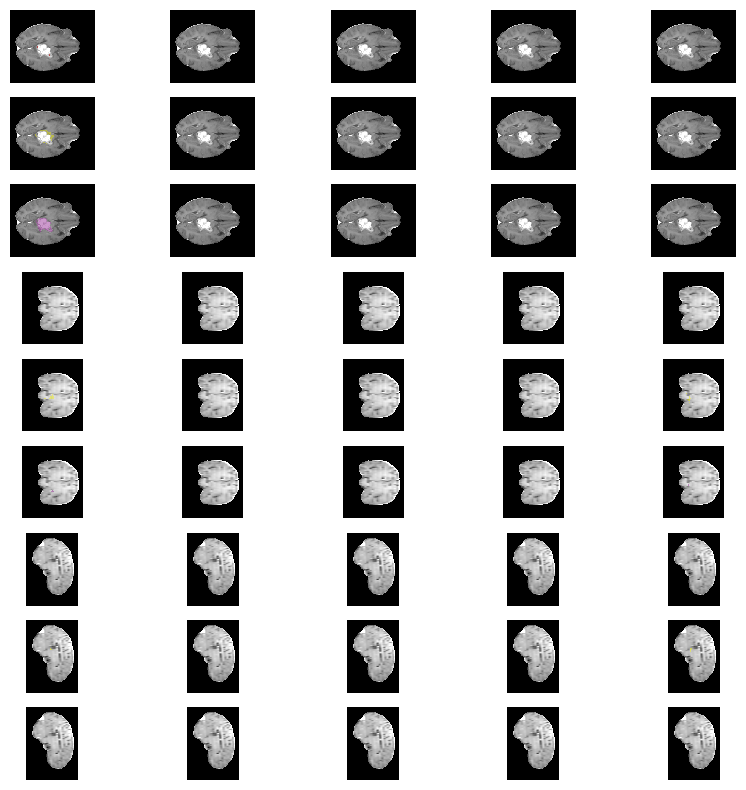

BraTS-SSA-00131-000-stk.npy
[[ 88.  88. 145. 122.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI/BraTS-SSA-00131-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

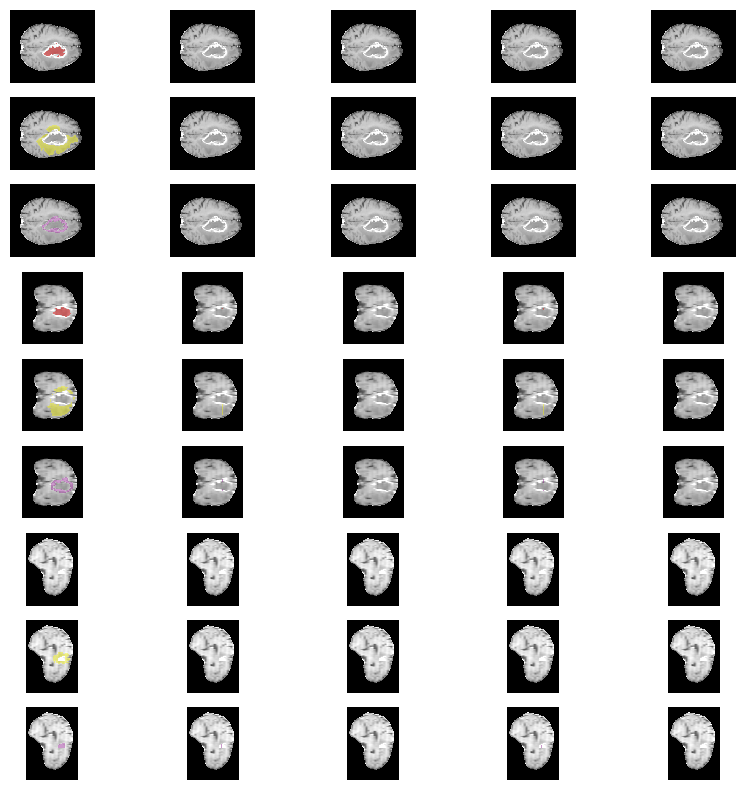

BraTS-SSA-00133-000-stk.npy
[[ 60. 103. 123. 142.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI/BraTS-SSA-00133-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

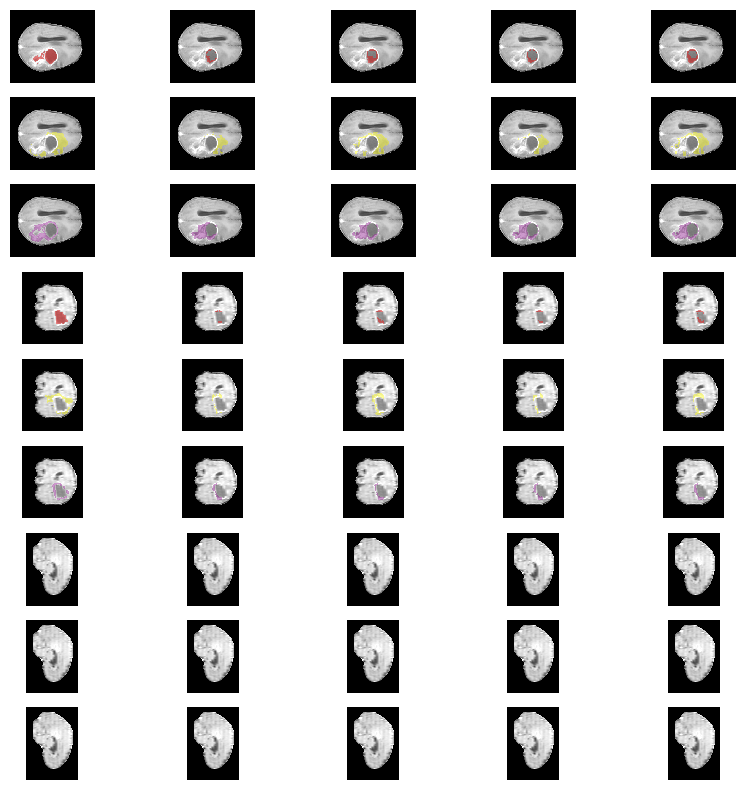

BraTS-SSA-00141-000-stk.npy
[[ 99.  58. 158. 105.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI/BraTS-SSA-00141-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

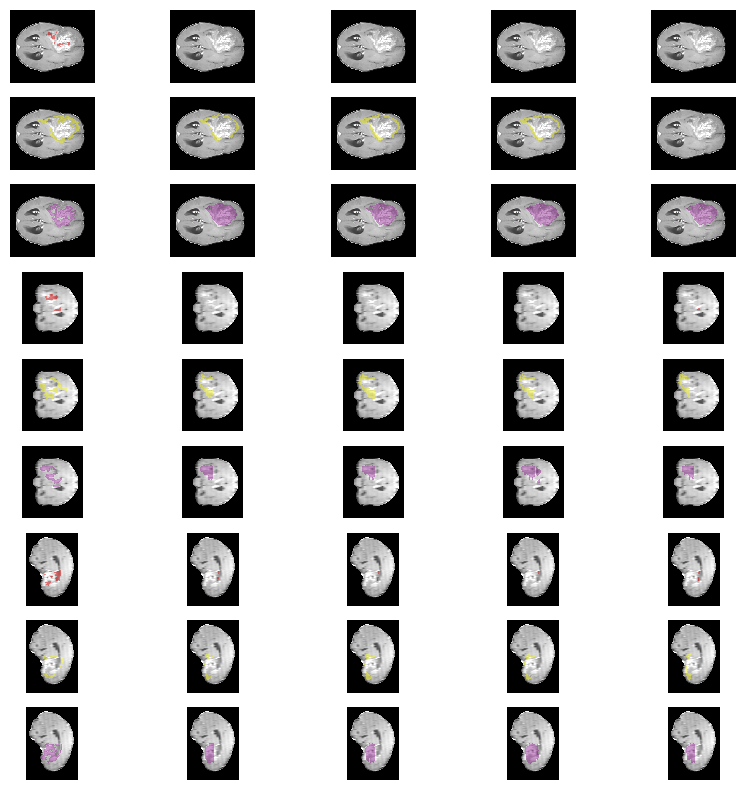

BraTS-SSA-00150-000-stk.npy
[[ 73. 113. 128. 160.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI/BraTS-SSA-00150-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

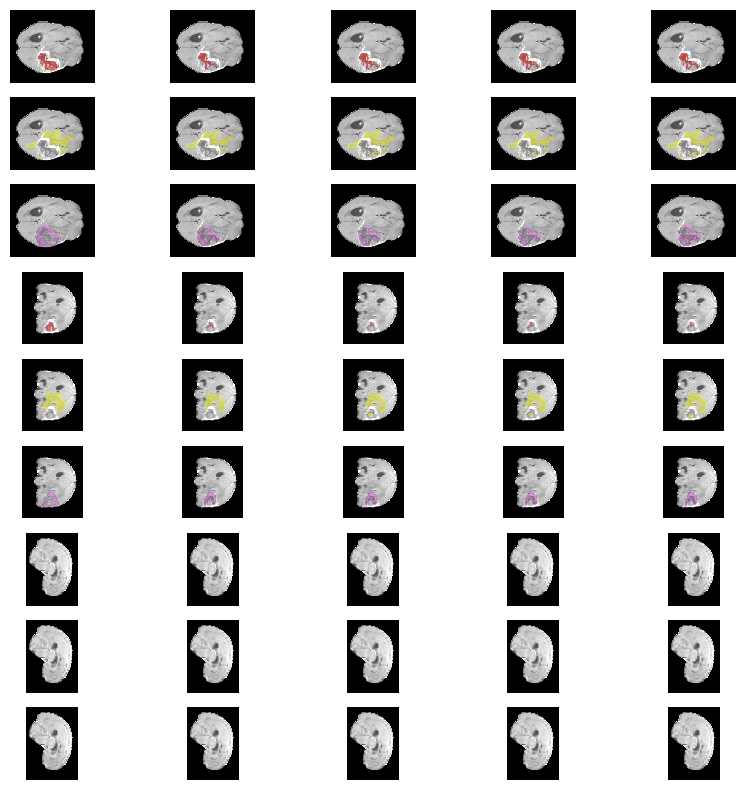

BraTS-SSA-00213-000-stk.npy
[[ 45.  67.  87. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI/BraTS-SSA-00213-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

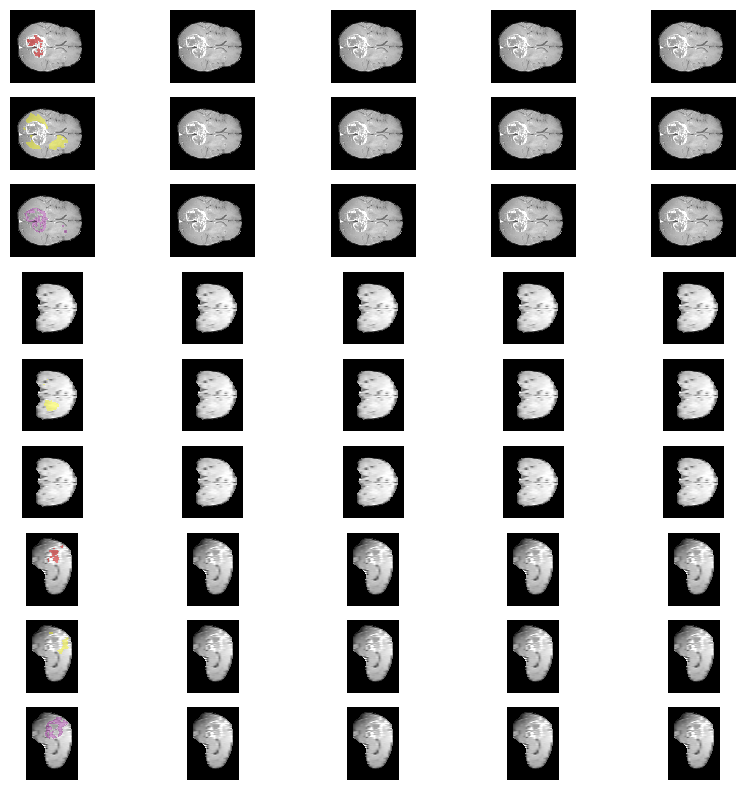

BraTS-SSA-00220-000-stk.npy
[[48. 44. 92. 70.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI/BraTS-SSA-00220-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overl

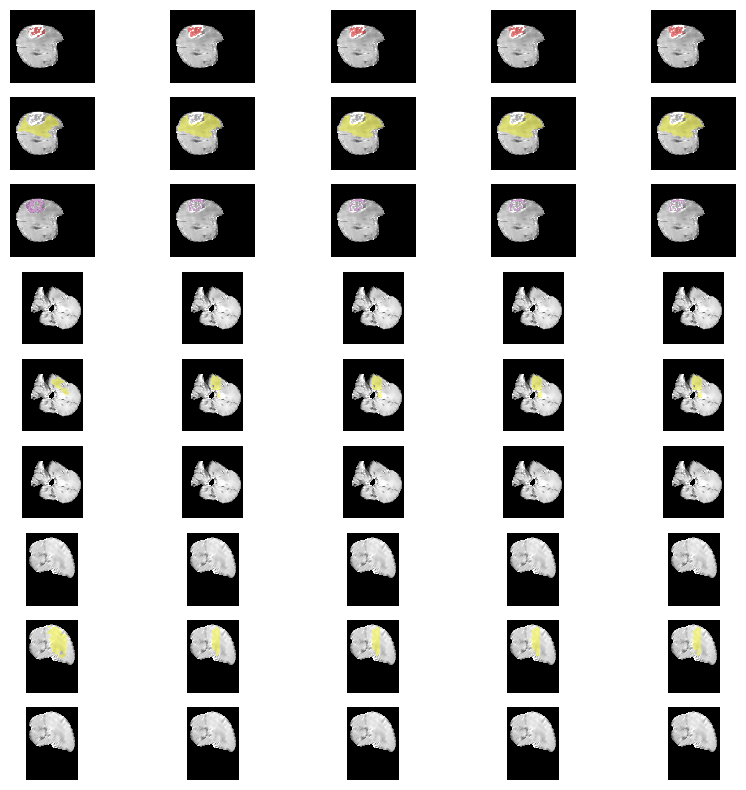

BraTS-SSA-00230-000-stk.npy
[[125.  75. 147.  95.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI/BraTS-SSA-00230-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

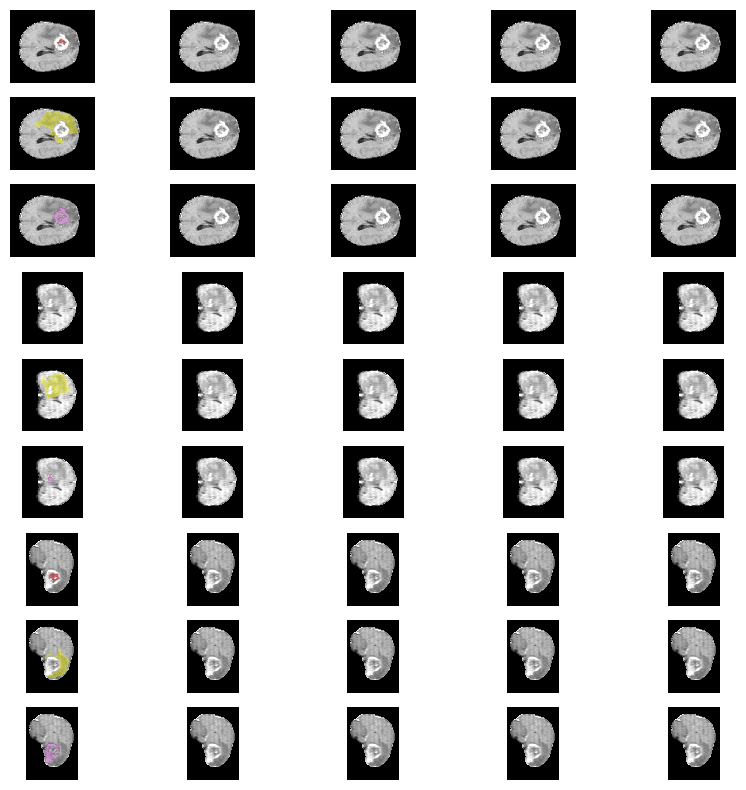

In [17]:
GLI_video_path = '/scratch-second/BraTS_SSA/Validation/images_UNN'
GLI_label_path = '/scratch-second/BraTS_SSA/Validation/labels_UNN'
GLI_pred_path = '/scratch-second/TTA_results/val_ent_only_decoder_lr5_augs/logs/BraTS_GLI'
pred2 = '/scratch-second/TTA_results/val_ent_sup_decoder_lr5_augs/logs/BraTS_GLI'
pred3 = '/scratch-second/TTA_res_con/val_ent_con_decoder_lr5_augs/logs/BraTS_GLI' 
pred4 = '/scratch-second/TTA_results/val_combined_decoder_lr5_augs/logs/BraTS_GLI' 
cols = ["dice_ED", "dice_ET", "dice_NCR"]



GLI_worst_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_worst_list)
visualize_4d(GLI_worst_dataset, GLI_pred_path, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, pred2,  pred3, pred4)

BraTS-SSA-00007-000-stk.npy
[[111.  70. 150. 118.]]


pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00007-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overla

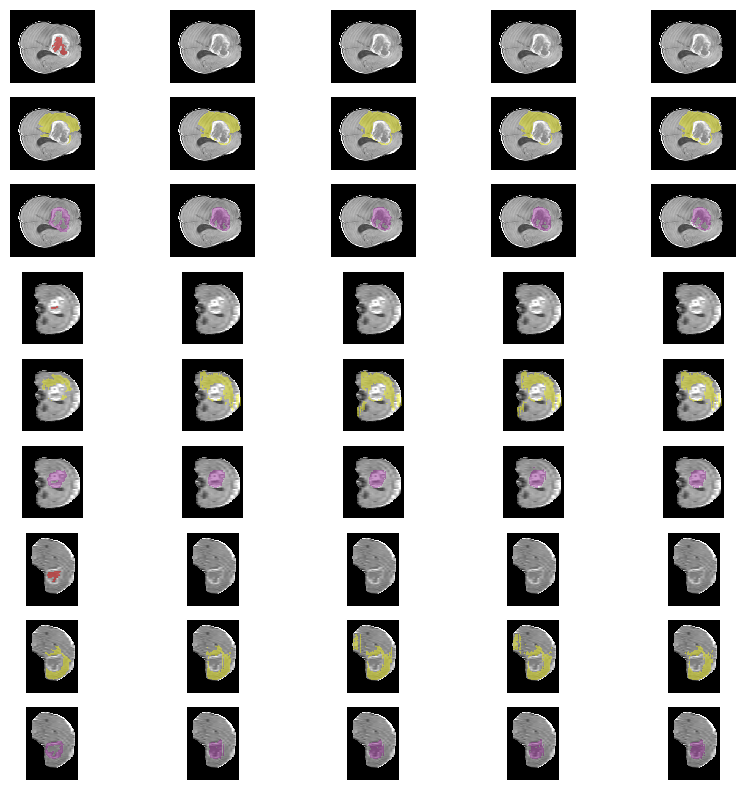

BraTS-SSA-00044-000-stk.npy
[[136.  79. 172.  98.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00044-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

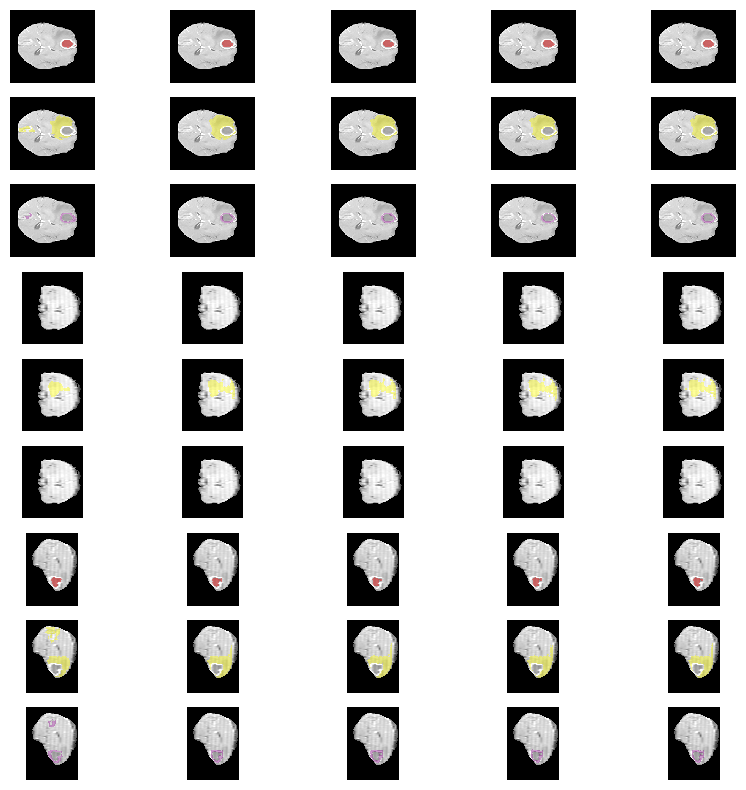

BraTS-SSA-00056-000-stk.npy
[[121.  85. 165. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00056-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

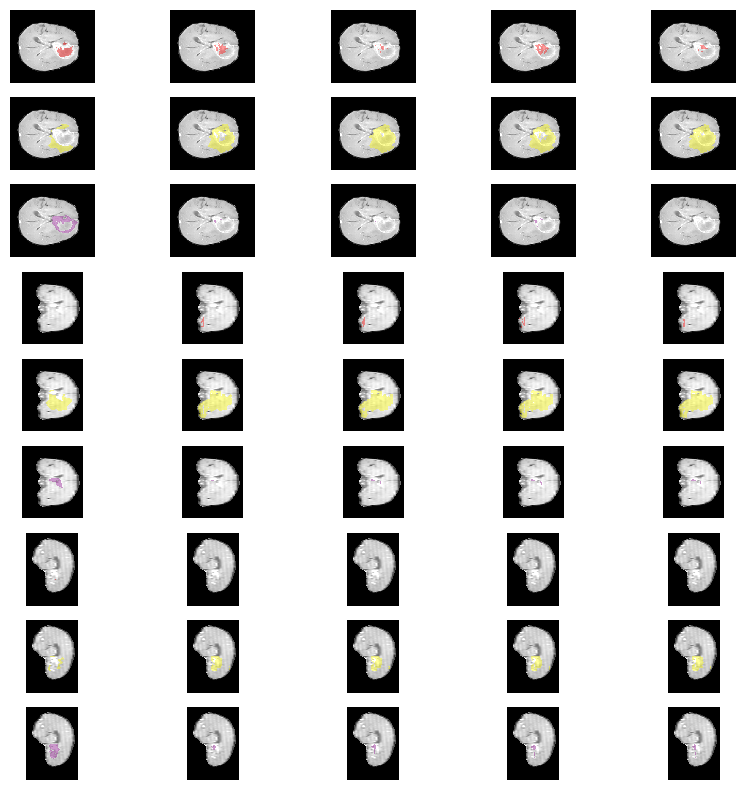

BraTS-SSA-00057-000-stk.npy
[[ 78.  41. 147. 100.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00057-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

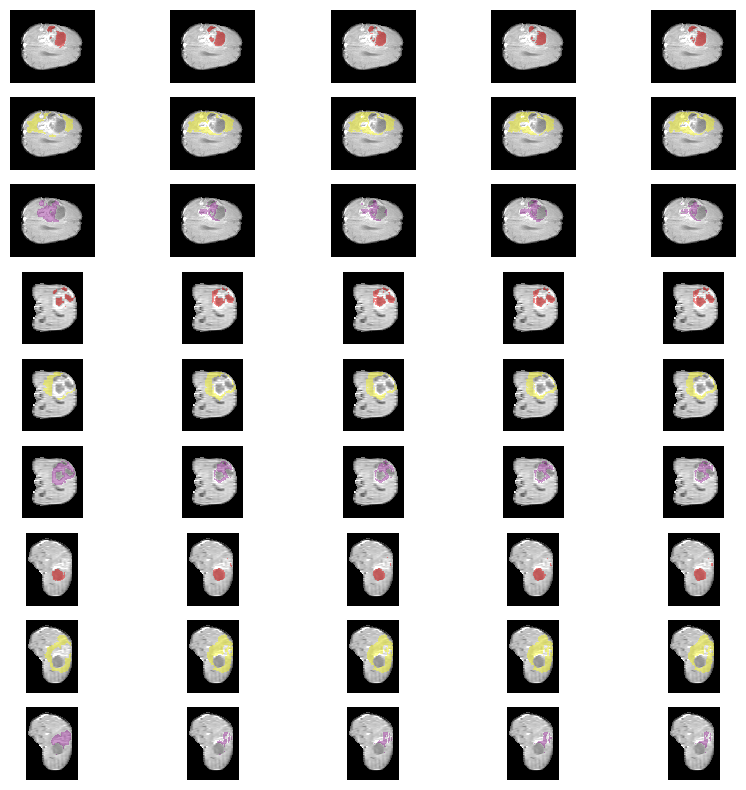

BraTS-SSA-00078-000-stk.npy
[[ 86. 109.  90. 110.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00078-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

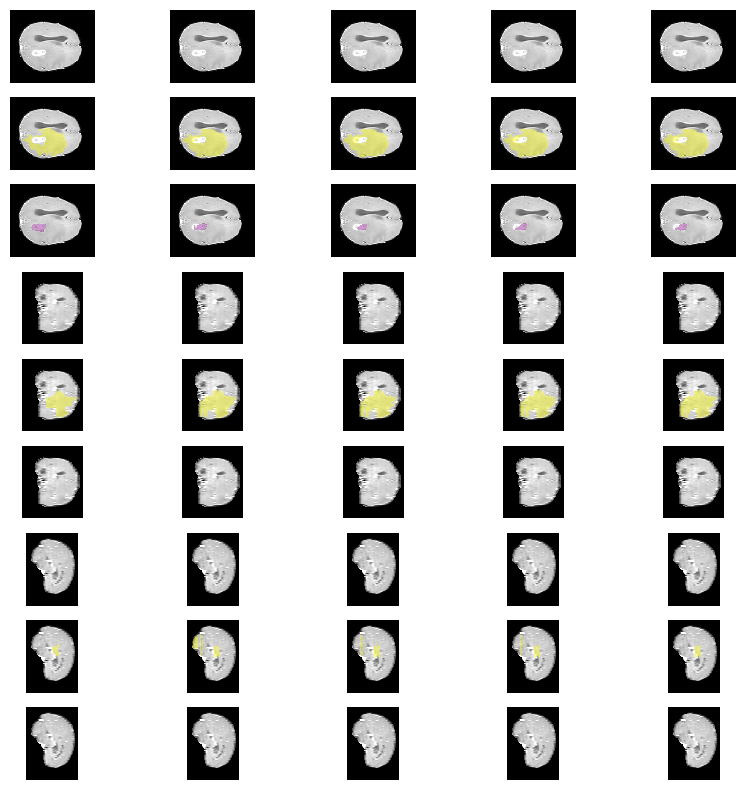

BraTS-SSA-00117-000-stk.npy
[[ 49.  62. 145. 163.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00117-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

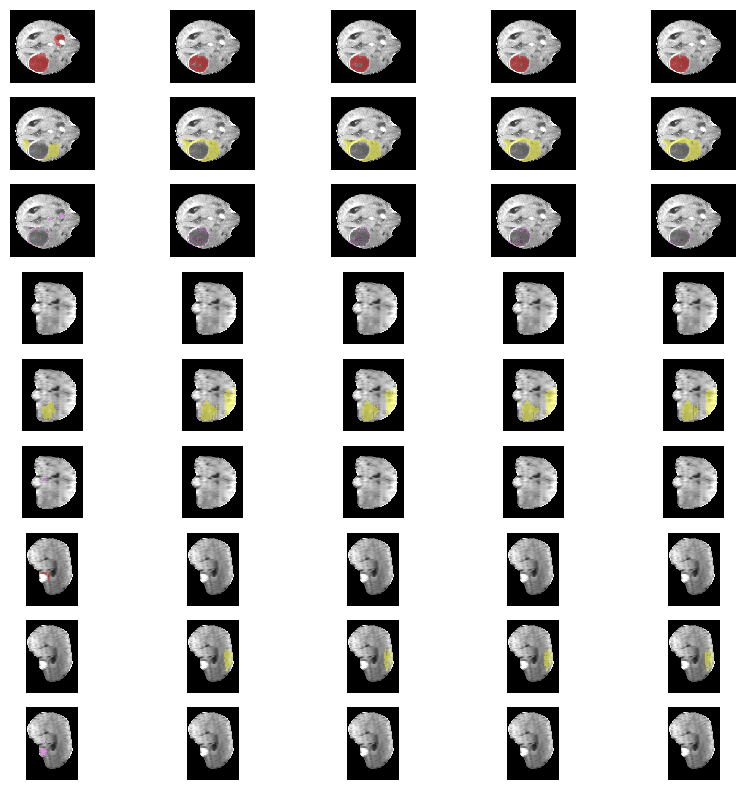

BraTS-SSA-00122-000-stk.npy
[[113. 107. 146. 132.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00122-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

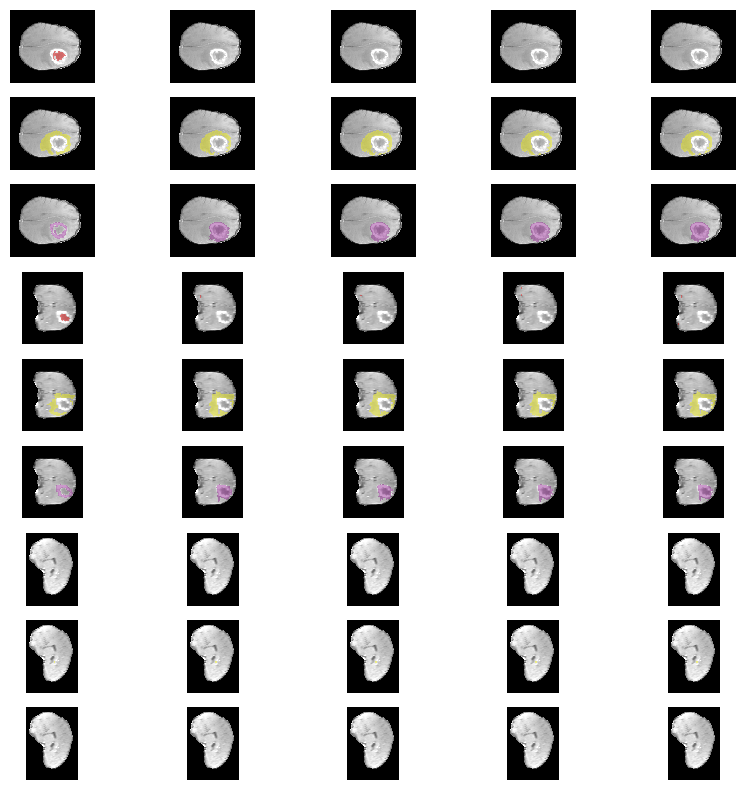

BraTS-SSA-00127-000-stk.npy
[[ 70.  95. 105. 120.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00127-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

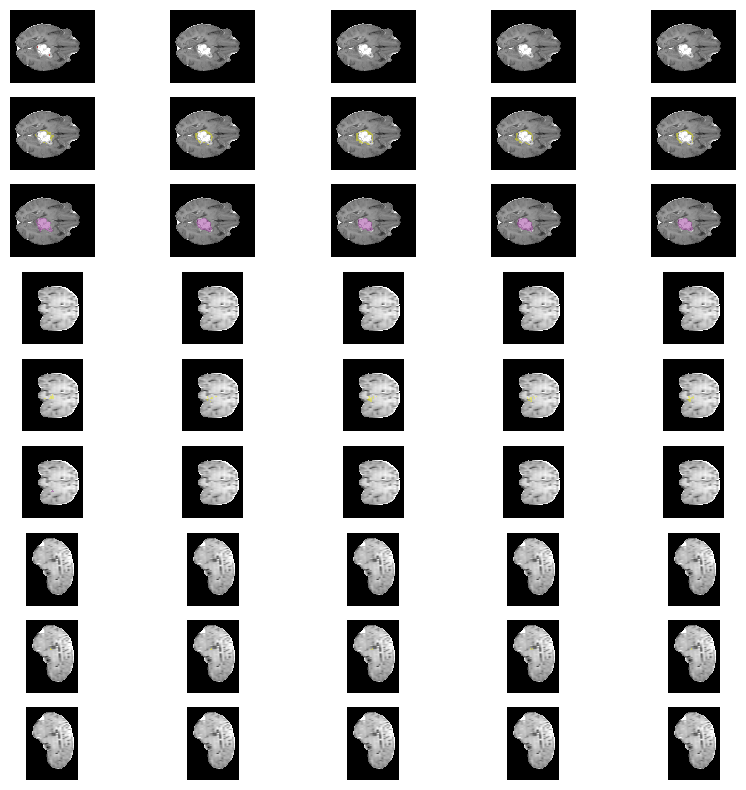

BraTS-SSA-00131-000-stk.npy
[[ 88.  88. 145. 122.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00131-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

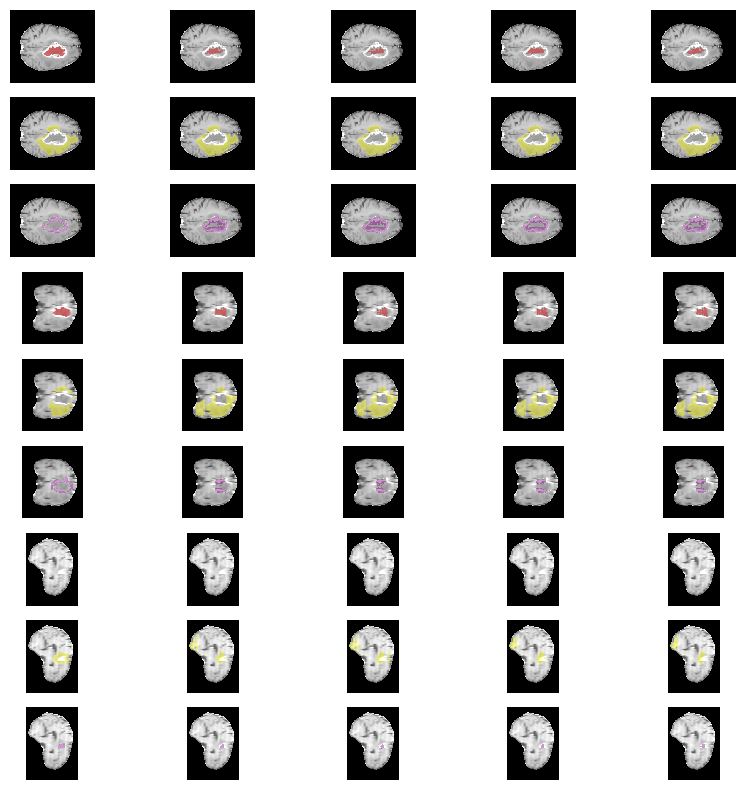

BraTS-SSA-00133-000-stk.npy
[[ 60. 103. 123. 142.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00133-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

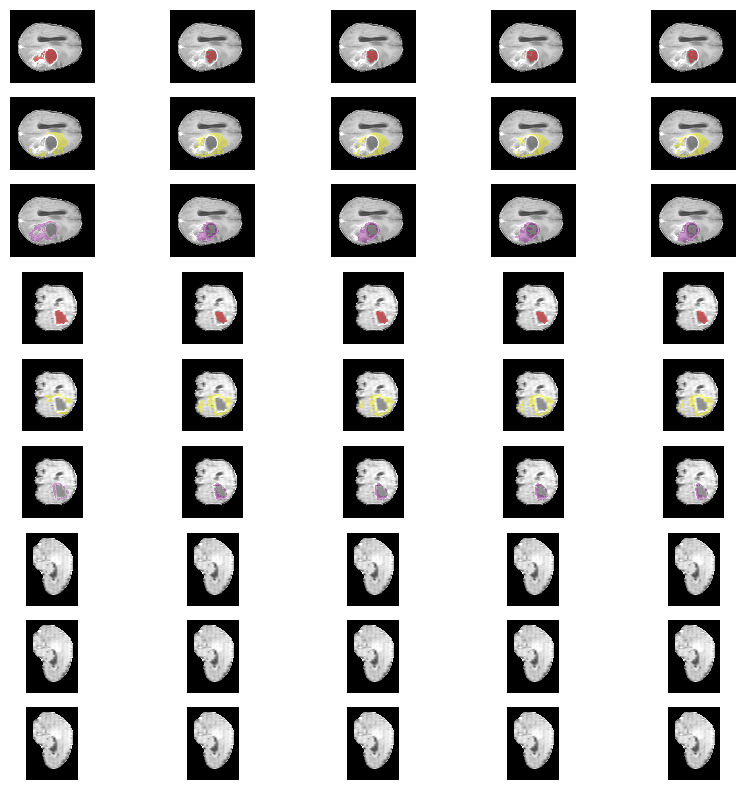

BraTS-SSA-00141-000-stk.npy
[[ 99.  58. 158. 105.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00141-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

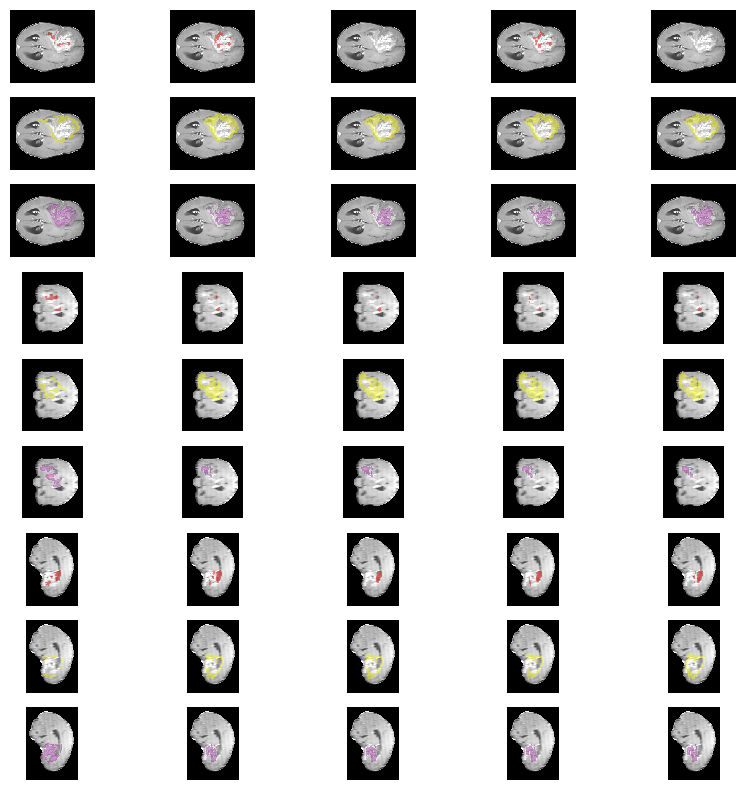

BraTS-SSA-00150-000-stk.npy
[[ 73. 113. 128. 160.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00150-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

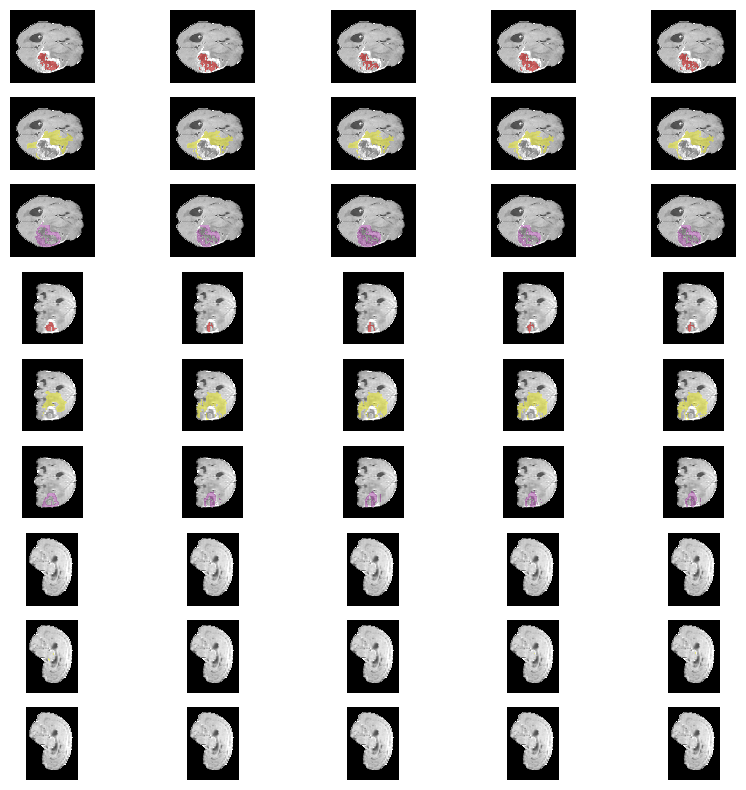

BraTS-SSA-00213-000-stk.npy
[[ 45.  67.  87. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00213-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

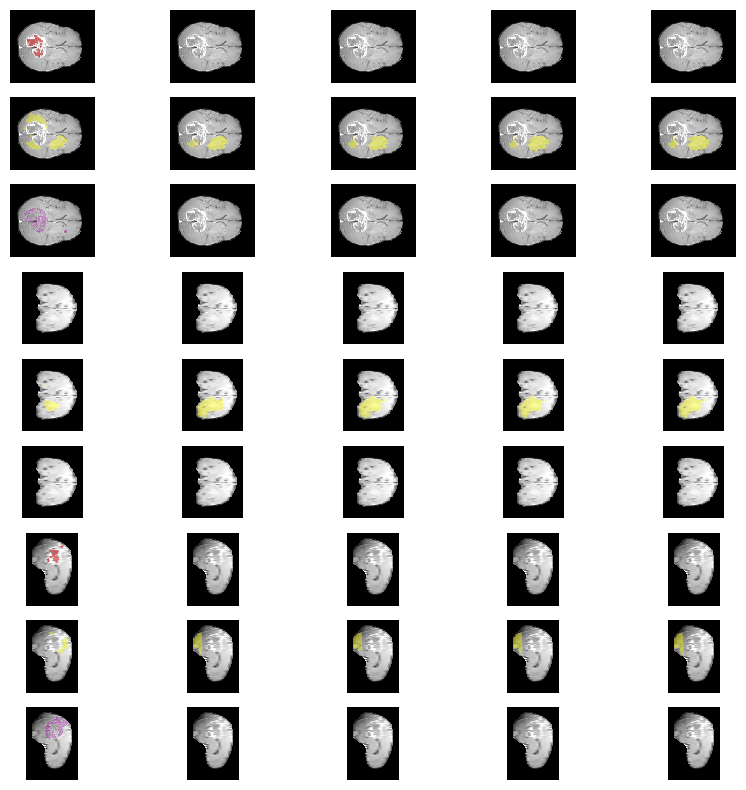

BraTS-SSA-00220-000-stk.npy
[[48. 44. 92. 70.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00220-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rg

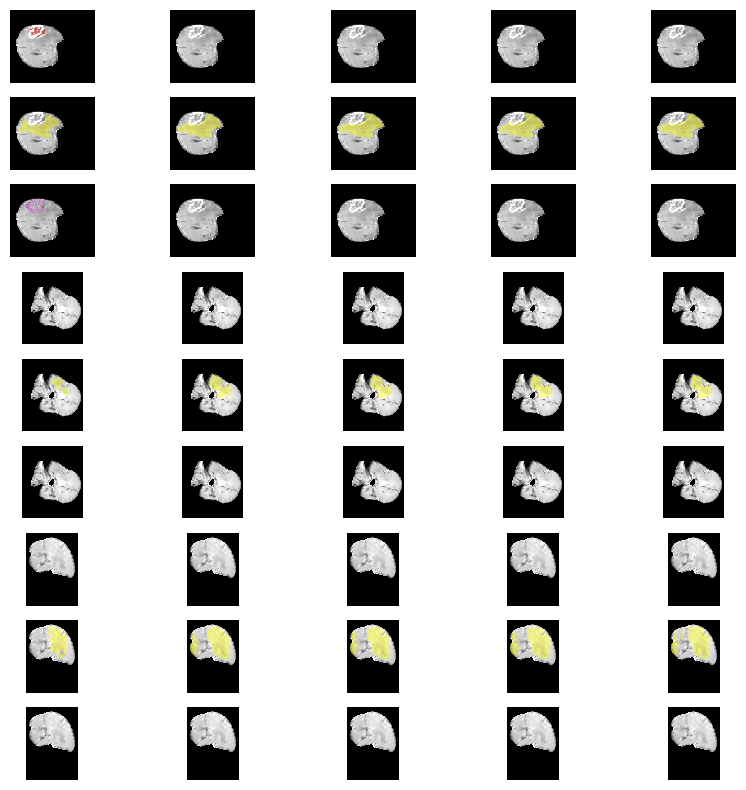

BraTS-SSA-00230-000-stk.npy
[[125.  75. 147.  95.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00230-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overla

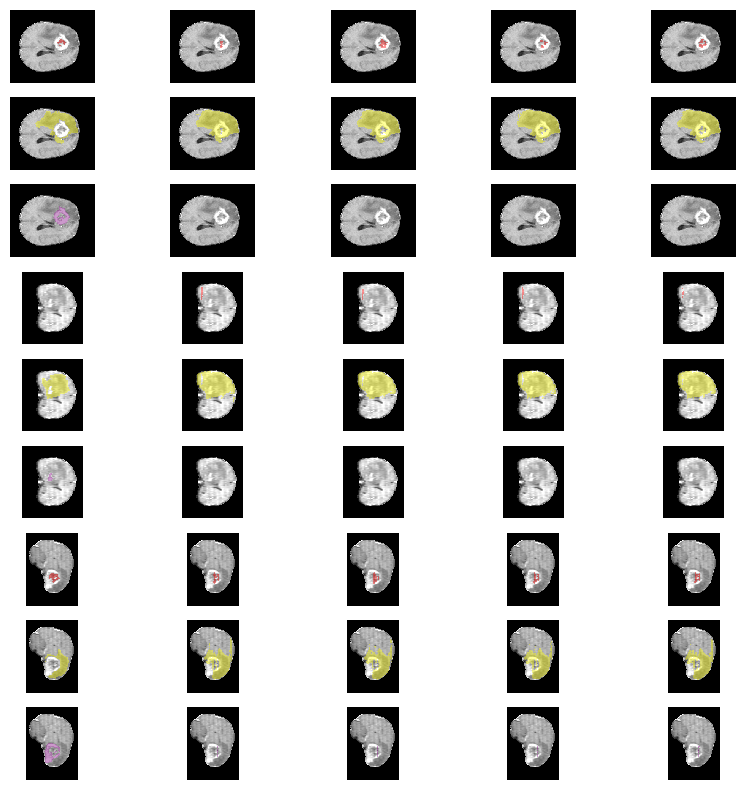

In [18]:
GLI_video_path = '/scratch-second/BraTS_SSA/Validation/images_UNN'
GLI_label_path = '/scratch-second/BraTS_SSA/Validation/labels_UNN'
GLI_pred_path = '/scratch-second/TTA_results/val_ent_only_decoder_lr6/logs/BraTS_GLI'
pred2 = '/scratch-second/TTA_results/val_ent_sup_decoder_lr6/logs/BraTS_GLI'
pred3 = '/scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI' 
pred4 = '/scratch-second/TTA_results/val_combined_decoder_lr6/logs/BraTS_GLI' 
cols = ["dice_ED", "dice_ET", "dice_NCR"]



GLI_worst_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_worst_list)
visualize_4d(GLI_worst_dataset, GLI_pred_path, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, pred2,  pred3, pred4)

BraTS-SSA-00007-000-stk.npy
[[111.  70. 150. 118.]]


pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI/BraTS-SSA-00007-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
o

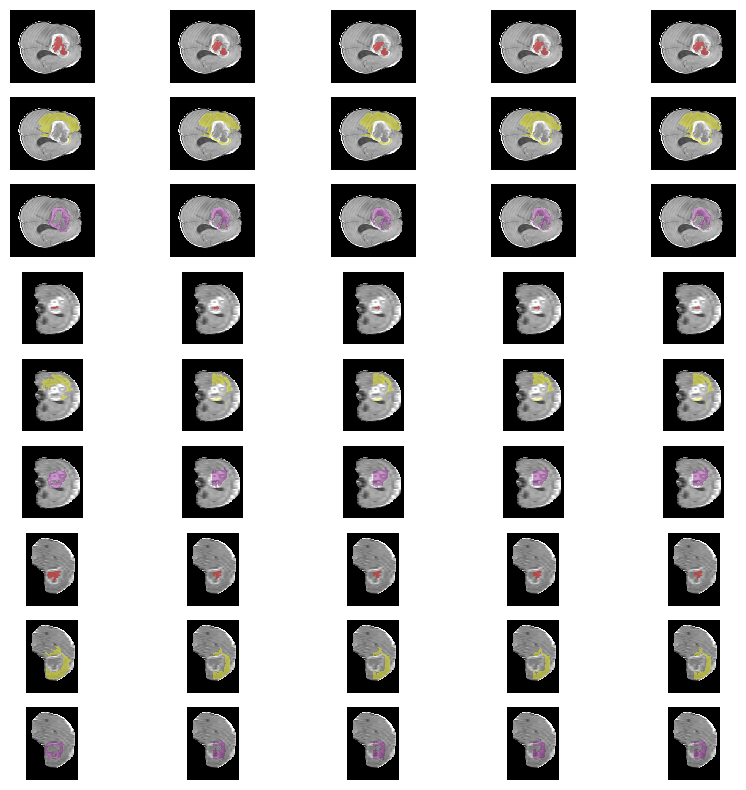

BraTS-SSA-00044-000-stk.npy
[[136.  79. 172.  98.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI/BraTS-SSA-00044-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

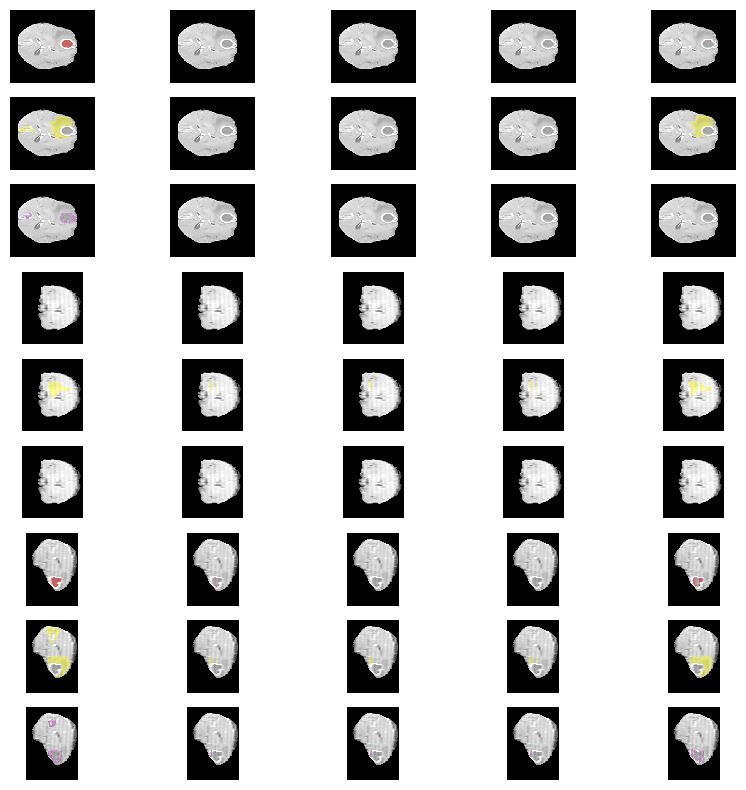

BraTS-SSA-00056-000-stk.npy
[[121.  85. 165. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI/BraTS-SSA-00056-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

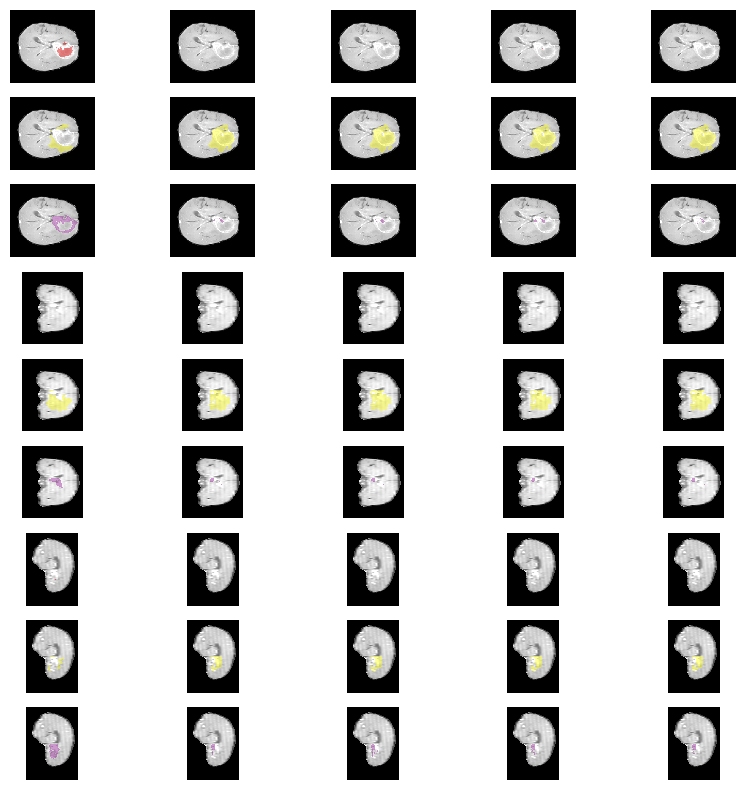

BraTS-SSA-00057-000-stk.npy
[[ 78.  41. 147. 100.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI/BraTS-SSA-00057-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

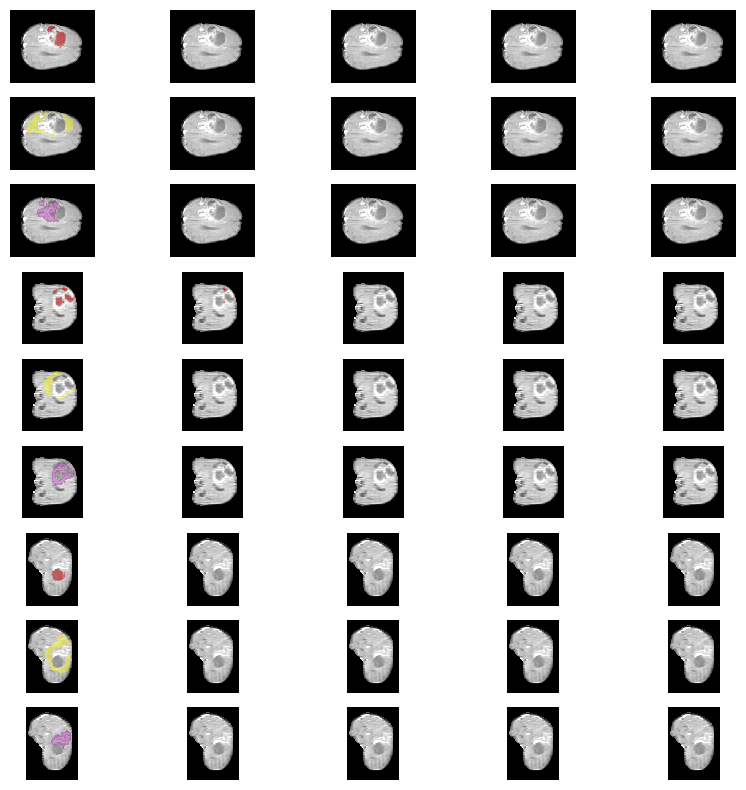

BraTS-SSA-00078-000-stk.npy
[[ 86. 109.  90. 110.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI/BraTS-SSA-00078-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

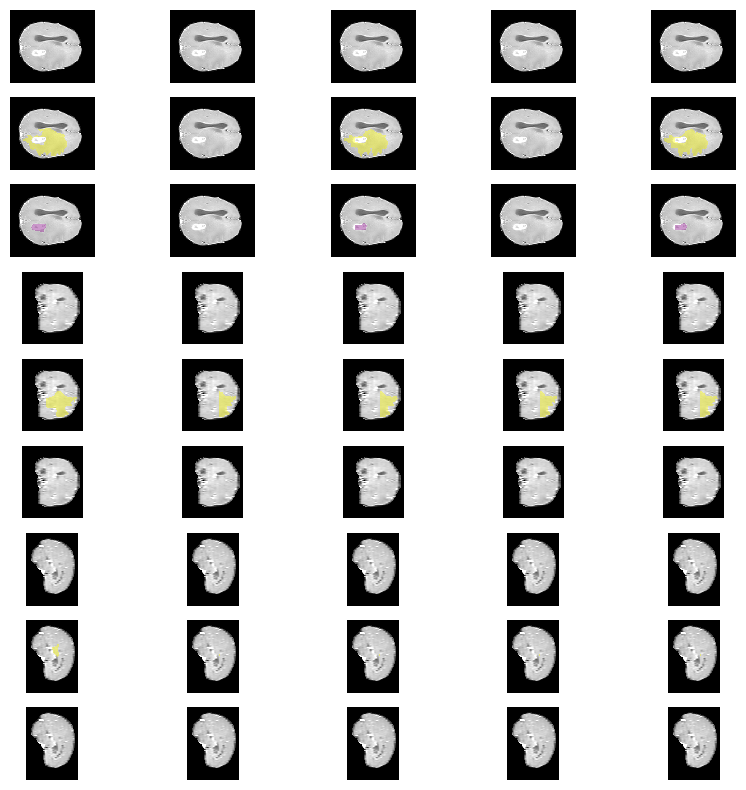

BraTS-SSA-00117-000-stk.npy
[[ 49.  62. 145. 163.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI/BraTS-SSA-00117-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

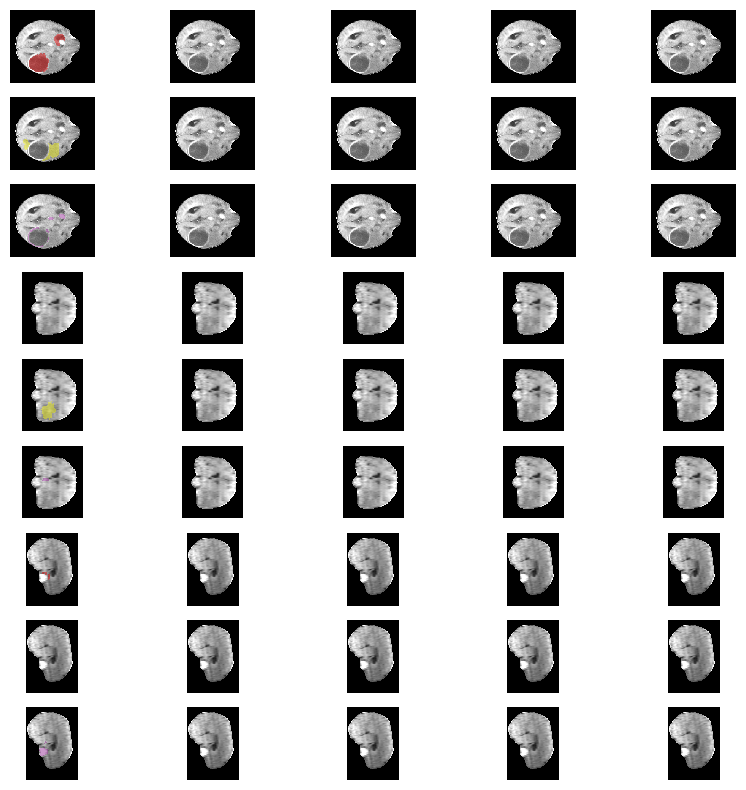

BraTS-SSA-00122-000-stk.npy
[[113. 107. 146. 132.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI/BraTS-SSA-00122-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

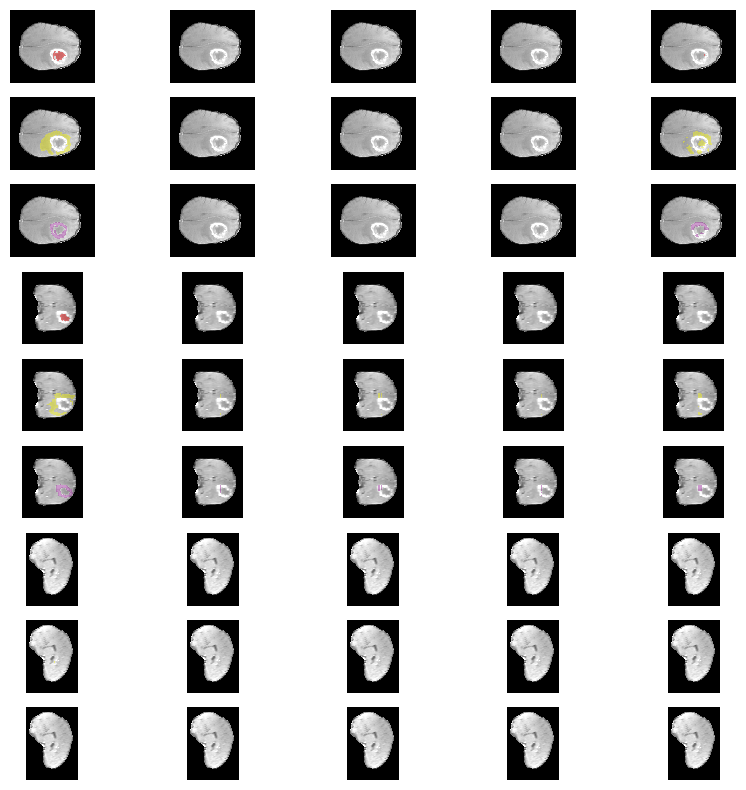

BraTS-SSA-00127-000-stk.npy
[[ 70.  95. 105. 120.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI/BraTS-SSA-00127-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

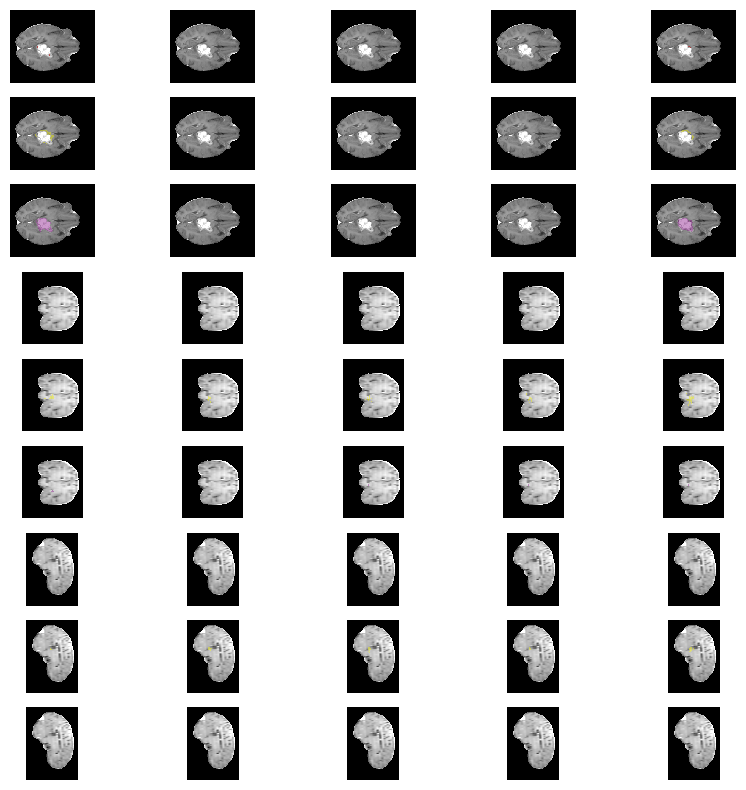

BraTS-SSA-00131-000-stk.npy
[[ 88.  88. 145. 122.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI/BraTS-SSA-00131-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

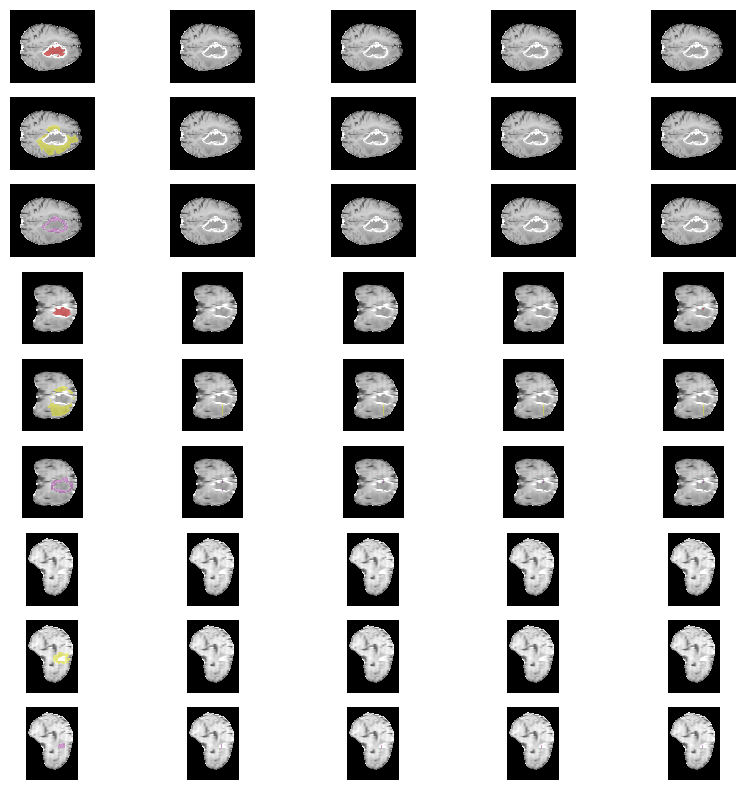

BraTS-SSA-00133-000-stk.npy
[[ 60. 103. 123. 142.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI/BraTS-SSA-00133-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

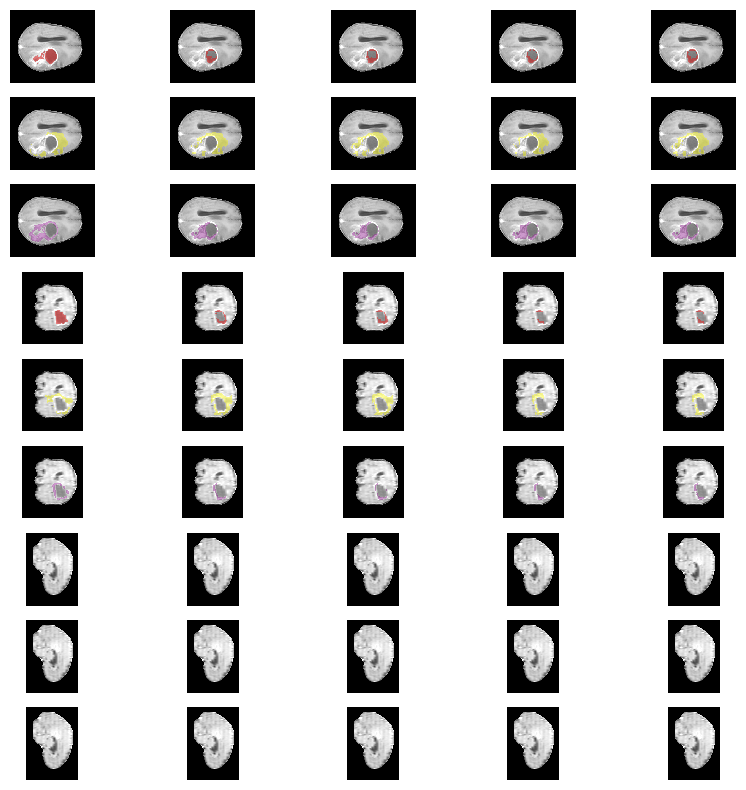

BraTS-SSA-00141-000-stk.npy
[[ 99.  58. 158. 105.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI/BraTS-SSA-00141-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

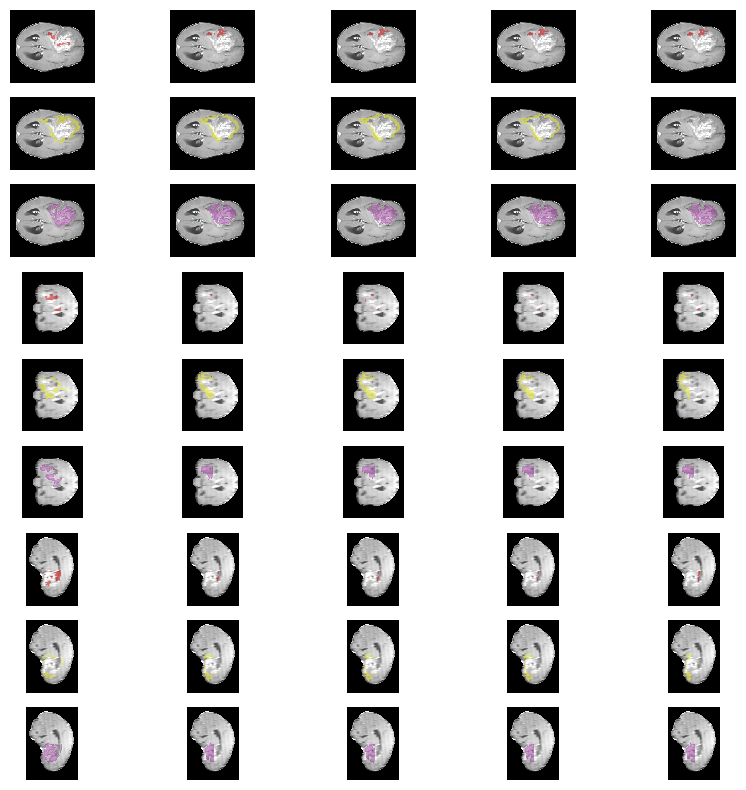

BraTS-SSA-00150-000-stk.npy
[[ 73. 113. 128. 160.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI/BraTS-SSA-00150-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

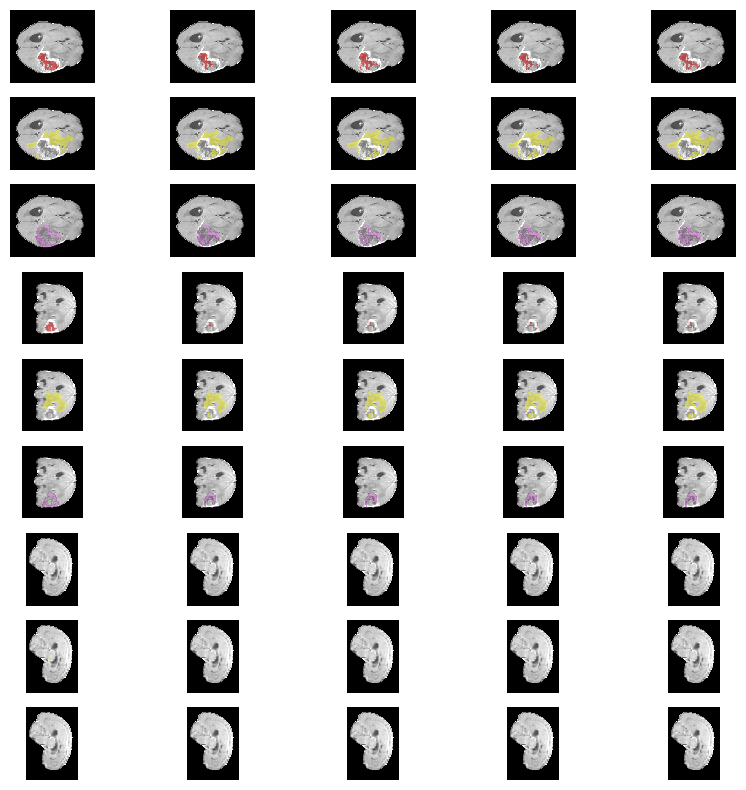

BraTS-SSA-00213-000-stk.npy
[[ 45.  67.  87. 123.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI/BraTS-SSA-00213-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

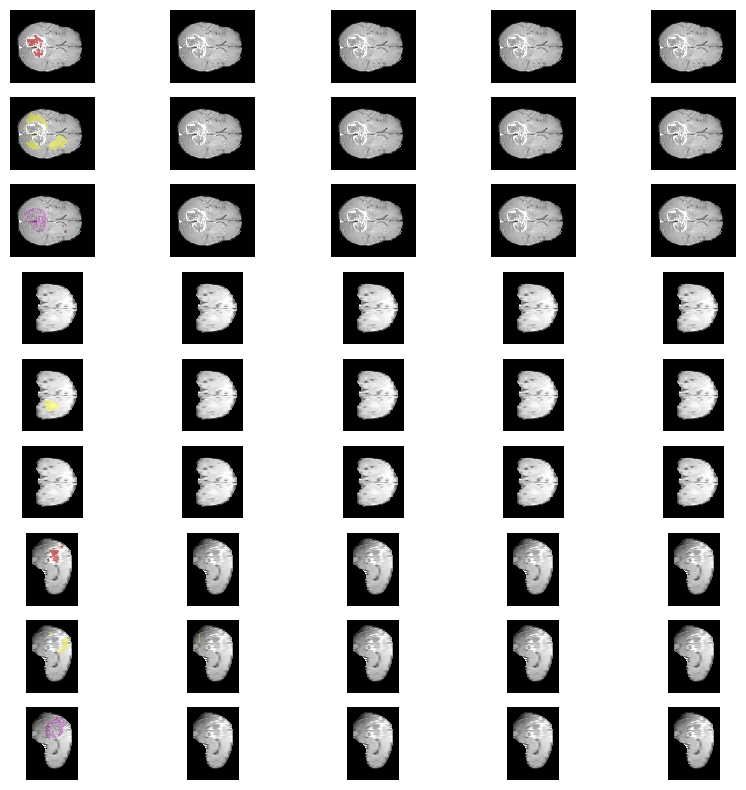

BraTS-SSA-00220-000-stk.npy
[[48. 44. 92. 70.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI/BraTS-SSA-00220-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overl

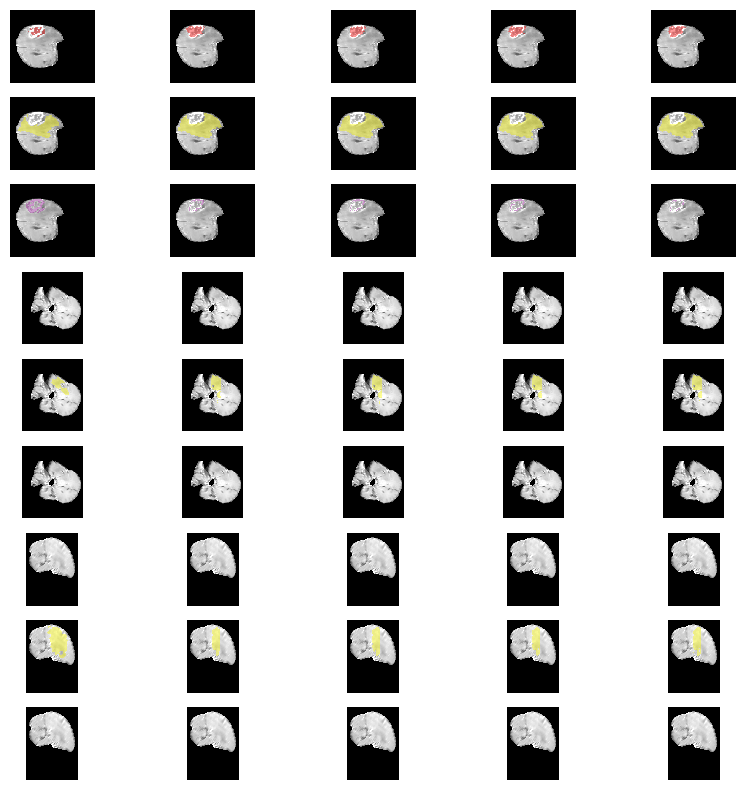

BraTS-SSA-00230-000-stk.npy
[[125.  75. 147.  95.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI/BraTS-SSA-00230-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
o

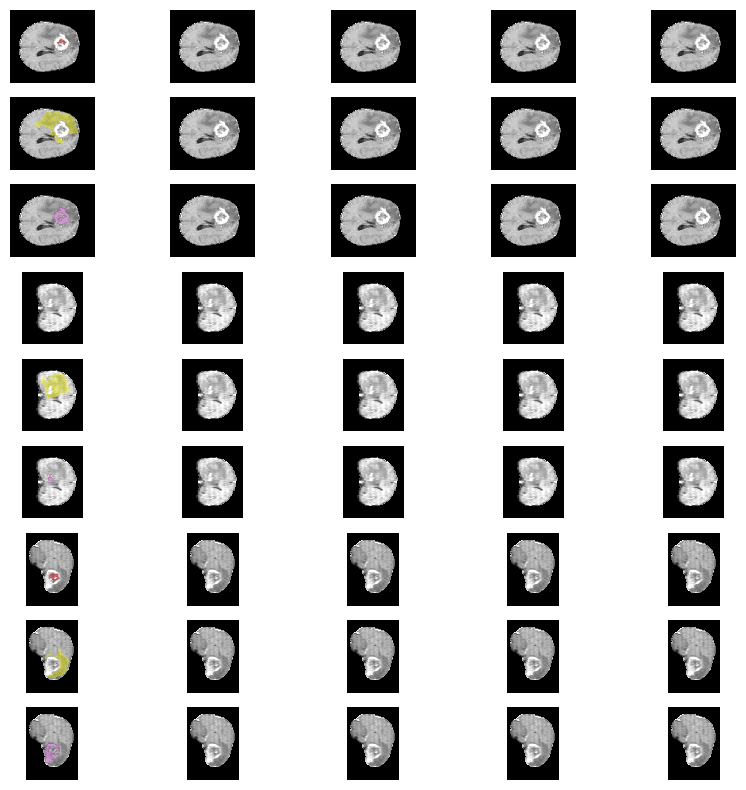

In [19]:
GLI_video_path = '/scratch-second/BraTS_SSA/Validation/images_UNN'
GLI_label_path = '/scratch-second/BraTS_SSA/Validation/labels_UNN'
GLI_pred_path = '/scratch-second/TTA_results/val_ent_only_decoder_lr6_augs/logs/BraTS_GLI'
pred2 = '/scratch-second/TTA_results/val_ent_sup_decoder_lr6_augs/logs/BraTS_GLI'
pred3 = '/scratch-second/TTA_res_con/val_ent_con_decoder_lr6_augs/logs/BraTS_GLI' 
pred4 = '/scratch-second/TTA_results/val_combined_decoder_lr6_augs/logs/BraTS_GLI' 
cols = ["dice_ED", "dice_ET", "dice_NCR"]



GLI_worst_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_worst_list)
visualize_4d(GLI_worst_dataset, GLI_pred_path, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, pred2,  pred3, pred4)

In [29]:
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

from skimage import measure 

def CC_func(prediction):

    C, H, W, D = prediction.shape
    # min_voxels = 100  # adjust for expected object size
    filtered_vol = np.zeros_like(prediction)

    for c in range(C):
        mask = prediction[c].astype(np.uint8)  # binary mask for class c
        min_voxels = mask.sum() * 0.2
        
        # 3D connected component labeling
        labeled_mask = measure.label(mask, connectivity=3)
        
        # Filter small components
        filtered_mask = np.zeros_like(mask)
        for i in range(1, labeled_mask.max() + 1):
            if np.sum(labeled_mask == i) >= min_voxels:
                filtered_mask[labeled_mask == i] = 1
        
        filtered_vol[c] = filtered_mask

    return filtered_vol

def display_image(color, label, b1, frames, class_id, ax):
    colored_out_mask = np.zeros((label.shape[1],label.shape[2] , 3))
    colored_out_mask[label[class_id,:,:,frames] == 1] = color
    ax.imshow(colored_out_mask)
    ax.add_patch(plt.Rectangle(b1[0], b1[2] , -b1[1], ls="--", ec="c", fc="none"))
    

    
def renormalize(arr):
    foreground = arr[arr != 0]
    min_val, max_val = np.min(foreground), np.max(foreground)

    scaled = (arr - min_val) / (max_val - min_val + 1e-8)
    scaled[arr == 0] = 0 

    return scaled

def vis_image(path):
    image_path = path
    imgs = np.load(image_path)
    imgs = np.delete(imgs, 1, axis=0)
    for i in range(imgs.shape[0]):
        imgs[i] = renormalize(imgs[i])
    imgs = np.transpose(imgs, (3, 1, 2,0))
    return imgs


def display_image_overlay(color, label, b1, frames, class_id, ax, title, image, alpha=0.4):
    C,H,W,T = label.shape
    m = (label[class_id, :, :, frames] > 0)

    # normalize image to 0..1 and make RGB
    img = image.astype(float)
    if img.ndim == 2:
        lo, hi = np.percentile(img, [1, 99])
        if hi > lo:
            img = np.clip((img - lo)/(hi - lo), 0, 1)
        img_rgb = np.repeat(img[..., None], 3, axis=2)
    else:
        if img.max() > 1.0:  # assume 0..255
            img = img / 255.0
        img_rgb = img

    # overlay color
    col = (np.array(color, float) / 255.0)
    overlay_rgb = np.zeros_like(img_rgb)
    overlay_rgb[m] = col

    # alpha map
    A = (m.astype(float) * alpha)[..., None]  # HxWx1

    # alpha blending: out = A*overlay + (1-A)*img
    comp = A*overlay_rgb + (1.0 - A)*img_rgb
    # comp = np.transpose(comp, (1, 0, 2))
    ax.imshow(comp, interpolation='nearest')
    # if title: ax.set_title(title)
    ax.axis('off')

def display_image_sides(color, label, b1, frames, class_id, ax, title, image, alpha=0.4):
    C,H,W,T = label.shape
    m = (label[class_id, :, 112,:] > 0)

    # normalize image to 0..1 and make RGB
    img = image.astype(float)
    if img.ndim == 2:
        lo, hi = np.percentile(img, [1, 99])
        if hi > lo:
            img = np.clip((img - lo)/(hi - lo), 0, 1)
        img_rgb = np.repeat(img[..., None], 3, axis=2)
    else:
        if img.max() > 1.0:  # assume 0..255
            img = img / 255.0
        img_rgb = img

    # overlay color
    col = (np.array(color, float) / 255.0)
    overlay_rgb = np.zeros_like(img_rgb)
    print(f'overlay_rgb shape {overlay_rgb.shape}, m shape {m.shape}')
    m = m.T
    overlay_rgb[m] = col
    # overlay_rgb = overlay_rgb.T
    # img_rgb = img_rgb.T

    # alpha map
    A = (m.astype(float) * alpha)[..., None]  # HxWx1

    # alpha blending: out = A*overlay + (1-A)*img
    comp = A*overlay_rgb + (1.0 - A)*img_rgb
    comp = np.transpose(comp, (1, 0, 2))
    ax.imshow(comp, interpolation='nearest')
    # if title: ax.set_title(title)
    ax.axis('off')

def display_image_sides2(color, label, b1, frames, class_id, ax, title, image, alpha=0.4):
    C,H,W,T = label.shape
    m = (label[class_id, 86, :,:] > 0)

    # normalize image to 0..1 and make RGB
    img = image.astype(float)
    if img.ndim == 2:
        lo, hi = np.percentile(img, [1, 99])
        if hi > lo:
            img = np.clip((img - lo)/(hi - lo), 0, 1)
        img_rgb = np.repeat(img[..., None], 3, axis=2)
    else:
        if img.max() > 1.0:  # assume 0..255
            img = img / 255.0
        img_rgb = img

    # overlay color
    col = (np.array(color, float) / 255.0)
    overlay_rgb = np.zeros_like(img_rgb)
    print(f'overlay_rgb shape {overlay_rgb.shape}, m shape {m.shape}')
    m = m.T
    overlay_rgb[m] = col
    # overlay_rgb = overlay_rgb.T
    # img_rgb = img_rgb.T

    # alpha map
    A = (m.astype(float) * alpha)[..., None]  # HxWx1

    # alpha blending: out = A*overlay + (1-A)*img
    comp = A*overlay_rgb + (1.0 - A)*img_rgb
    comp = np.transpose(comp, (1, 0, 2))

    ax.imshow(comp, interpolation='nearest')
    # if title: ax.set_title(title)
    ax.axis('off')

def display_image(color, label, b1, frames, class_id, ax, title):
    
    # print(f'here {label.shape}')
    colored_out_mask = np.zeros((label.shape[1],label.shape[2], 3 ))
    mask = label[class_id, :, :, frames] == 1
    colored_out_mask[mask] = np.array(color, dtype=np.uint8)
    ax.imshow(colored_out_mask)
    # ax.add_patch(plt.Rectangle(b1[0], b1[2] , -b1[1], ls="--", ec="c", fc="none"))
    ax.set_title(title)

def preprocess_bbox(bbox):
    print(bbox)
    x = int(bbox[0][0]) 
    y = int(bbox[0][3]) 
    w = int(bbox[0][2]) - int(bbox[0][0])
    h = int(bbox[0][3]) - int(bbox[0][1])
    return (x,y) , h, w

def fig2img(fig):
    canvas = FigureCanvas(fig)  # Attach the Agg backend
    fig.set_canvas(canvas)      # Set the canvas to the figure
    canvas.draw()
    
    # Get the RGB buffer from the figure
    buf = canvas.buffer_rgba()  # Use buffer_rgba() instead of tostring_rgb
    img = np.asarray(buf)[:, :, :3]  # Drop alpha channel
    return img

def visualize_4d_layer(dataset, pred_path, title, path_img, pred_path2, pred_path3 ):
    colors = [
        [255, 0, 0],       
        [255, 255, 0],     
        [128, 0, 128],     
    ]
    # graph_num = len(pred_path)
    for i in range(len(dataset)):
        # try:
        
            fig, ax = plt.subplots(9, 4, figsize=(10,10), constrained_layout=False)
            # fig.subplots_adjust(wspace=0.02, hspace=0.12, left=0.02, right=0.98, top=0.9, bottom=0.02)

            # fig.suptitle(title)
            # print(len(ax))
            idx, img, label_name, box, points, frames, label = dataset[i]
            print(img)
            b1 = preprocess_bbox(bbox=box[0])
            # b2 = preprocess_bbox(bbox=box[1])
            # b3 = preprocess_bbox(bbox=box[2])
            b = [b1,b1, b1]
            
            read_path = os.path.join(pred_path, f'{img[:-8]}.npy')
            # print(read_path)
            pred = np.load(read_path)[1:]
            pred = CC_func(pred)

            read_path2 = os.path.join(pred_path2, f'{img[:-8]}.npy')
            # print(read_path)
            pred2 = np.load(read_path2)[1:]
            pred2 = CC_func(pred2)

            
            read_path3 = os.path.join(pred_path3, f'{img[:-8]}.npy')
            print(f'pred2.shape {read_path3}')
            # print(read_path)
            pred3 = np.load(read_path3)[1:]
            pred3 = CC_func(pred3)
            # print(f'pred2.shape {pred_path4}')
            # read_path4 = os.path.join(pred_path4, f'{img[:-8]}.npy')
            # print(read_path)
            # read_path4 = os.path.join(pred_path4, f'{img[:-8]}.npy')
            # pred4 = np.load(read_path4)[1:]
            # pred4 = CC_func(pred4)

            # pred4 = np.load(read_path4)[1:]
            # pred = np.transpose(pred, (3,0,1,2))
            # sides = label[:, , :, :]
            label = np.array(label[1:])

            print(f'label.shape {label.shape}')
            # label = np.transpose(label, (1,2,3,0))

            true_img_path = f'{path_img}/{img}'
            true_img = vis_image(true_img_path)

            # if pred_path2:
            #     read_path2 = os.path.join(pred_path2, img[:-8])
            #     loadpath2 = os.path.join(read_path2, os.listdir(read_path2)[0])
            #     pred2 = np.load(loadpath2)
            #     pred2 = np.transpose(pred2, (3,0,1,2))




            
            label_key = ['NCR','ED','ET']

            for i in range(3):
                print(true_img[frames].shape)
                display_image_overlay(colors[i], label, b[i],frames, i, ax[i,0], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred, b[i], frames, i, ax[i,1], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred2, b[i],frames, i, ax[i,2], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred3, b[i], frames, i, ax[i,3], label_key[i], true_img[frames, :, :, 1])
                # display_image_overlay(colors[i], pred4, b[i], frames, i, ax[i,4], label_key[i], true_img[frames, :, :, 1])

                display_image_sides(colors[i], label, b[i],frames, i, ax[i+3,0], label_key[i], true_img[:, :, 112, 1])
                display_image_sides(colors[i], pred, b[i], frames, i, ax[i+3,1], label_key[i], true_img[:, :, 112, 1])
                display_image_sides(colors[i], pred2, b[i],frames, i, ax[i+3,2], label_key[i], true_img[:, :, 112, 1])
                display_image_sides(colors[i], pred3, b[i], frames, i, ax[i+3,3], label_key[i], true_img[:, :, 112, 1])
                # display_image_sides(colors[i], pred4, b[i], frames, i, ax[i+3,4], label_key[i], true_img[:, :, 112, 1])

                display_image_sides2(colors[i], label, b[i],frames, i, ax[i+6,0], label_key[i], true_img[:, 86, :, 1])
                display_image_sides2(colors[i], pred, b[i], frames, i, ax[i+6,1], label_key[i], true_img[:, 86, :, 1])
                display_image_sides2(colors[i], pred2, b[i],frames, i, ax[i+6,2], label_key[i], true_img[:, 86, :, 1])
                display_image_sides2(colors[i], pred3, b[i], frames, i, ax[i+6,3], label_key[i], true_img[:, 86, :, 1])
                # display_image_sides2(colors[i], pred4, b[i], frames, i, ax[i+6,4], label_key[i], true_img[:, 86, :, 1])

                # if pred_path2:
                #     display_image(colors[i], pred2, b[i], frames, i, ax[i,2])
                #     display_image(colors[i], pred3, b[i], frames, i, ax[i,2])
                    # display_image(colors[i], pred4, b[i], frames, i, ax[i,2])


            # plt.legend(title='Legend')
            
            # plt.imshow(true_img[frames])
            
                
            plt.show()
        # except Exception as e:
        #     print(e)



def visualize_3d_layer(dataset, pred_path, title, path_img, pred_path2, pred_path3  ):
    colors = [
        [255, 0, 0],       
        [255, 255, 0],     
        [128, 0, 128],     
    ]
    # graph_num = len(pred_path)
    for i in range(len(dataset)):
        # try:
        
            fig, ax = plt.subplots(3, 5, figsize=(10,10), constrained_layout=False)
            # fig.subplots_adjust(wspace=0.02, hspace=0.12, left=0.02, right=0.98, top=0.9, bottom=0.02)

            # fig.suptitle(title)
            # print(len(ax))
            idx, img, label_name, box, points, frames, label = dataset[i]
            print(img)
            b1 = preprocess_bbox(bbox=box[0])
            # b2 = preprocess_bbox(bbox=box[1])
            # b3 = preprocess_bbox(bbox=box[2])
            b = [b1,b1, b1]
            
            read_path = os.path.join(pred_path, f'{img[:-8]}.npy')
            # print(read_path)
            pred = np.load(read_path)[1:]
            pred = CC_func(pred)

            read_path2 = os.path.join(pred_path2, f'{img[:-8]}.npy')
            # print(read_path)
            pred2 = np.load(read_path2)[1:]
            pred2 = CC_func(pred2)

            
            read_path3 = os.path.join(pred_path3, f'{img[:-8]}.npy')
            print(f'pred2.shape {read_path3}')
            # print(read_path)
            pred3 = np.load(read_path3)[1:]
            pred3 = CC_func(pred3)
            # print(f'pred2.shape {pred_path4}')
            # read_path4 = os.path.join(pred_path4, f'{img[:-8]}.npy')
            # print(read_path)
            # read_path4 = os.path.join(pred_path4, f'{img[:-8]}.npy')
            # pred4 = np.load(read_path4)[1:]
            # pred4 = CC_func(pred4)

            # pred4 = np.load(read_path4)[1:]
            # pred = np.transpose(pred, (3,0,1,2))
            # sides = label[:, , :, :]
            label = np.array(label[1:])

            print(f'label.shape {label.shape}')
            # label = np.transpose(label, (1,2,3,0))

            true_img_path = f'{path_img}/{img}'
            true_img = vis_image(true_img_path)

            # if pred_path2:
            #     read_path2 = os.path.join(pred_path2, img[:-8])
            #     loadpath2 = os.path.join(read_path2, os.listdir(read_path2)[0])
            #     pred2 = np.load(loadpath2)
            #     pred2 = np.transpose(pred2, (3,0,1,2))




            
            label_key = ['NCR','ED','ET']

            for i in range(3):
                print(true_img[frames].shape)
                display_image_overlay(colors[i], label, b[i],frames, i, ax[i,0], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred, b[i], frames, i, ax[i,1], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred2, b[i],frames, i, ax[i,2], label_key[i], true_img[frames, :, :, 1])
                display_image_overlay(colors[i], pred3, b[i], frames, i, ax[i,3], label_key[i], true_img[frames, :, :, 1])
                # display_image_overlay(colors[i], pred4, b[i], frames, i, ax[i,4], label_key[i], true_img[frames, :, :, 1])

                # display_image_sides(colors[i], label, b[i],frames, i, ax[i+3,0], label_key[i], true_img[:, :, 112, 1])
                # display_image_sides(colors[i], pred, b[i], frames, i, ax[i+3,1], label_key[i], true_img[:, :, 112, 1])
                # display_image_sides(colors[i], pred2, b[i],frames, i, ax[i+3,2], label_key[i], true_img[:, :, 112, 1])
                # display_image_sides(colors[i], pred3, b[i], frames, i, ax[i+3,3], label_key[i], true_img[:, :, 112, 1])
                # display_image_sides(colors[i], pred4, b[i], frames, i, ax[i+3,4], label_key[i], true_img[:, :, 112, 1])

                # display_image_sides2(colors[i], label, b[i],frames, i, ax[i+6,0], label_key[i], true_img[:, 86, :, 1])
                # display_image_sides2(colors[i], pred, b[i], frames, i, ax[i+6,1], label_key[i], true_img[:, 86, :, 1])
                # display_image_sides2(colors[i], pred2, b[i],frames, i, ax[i+6,2], label_key[i], true_img[:, 86, :, 1])
                # display_image_sides2(colors[i], pred3, b[i], frames, i, ax[i+6,3], label_key[i], true_img[:, 86, :, 1])
                # display_image_sides2(colors[i], pred4, b[i], frames, i, ax[i+6,4], label_key[i], true_img[:, 86, :, 1])

                # if pred_path2:
                #     display_image(colors[i], pred2, b[i], frames, i, ax[i,2])
                #     display_image(colors[i], pred3, b[i], frames, i, ax[i,2])
                    # display_image(colors[i], pred4, b[i], frames, i, ax[i,2])


            # plt.legend(title='Legend')
            
            # plt.imshow(true_img[frames])
            
                
            plt.show()
        # except Exception as e:

BraTS-SSA-00007-000-stk.npy
[[111.  70. 150. 118.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00007-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

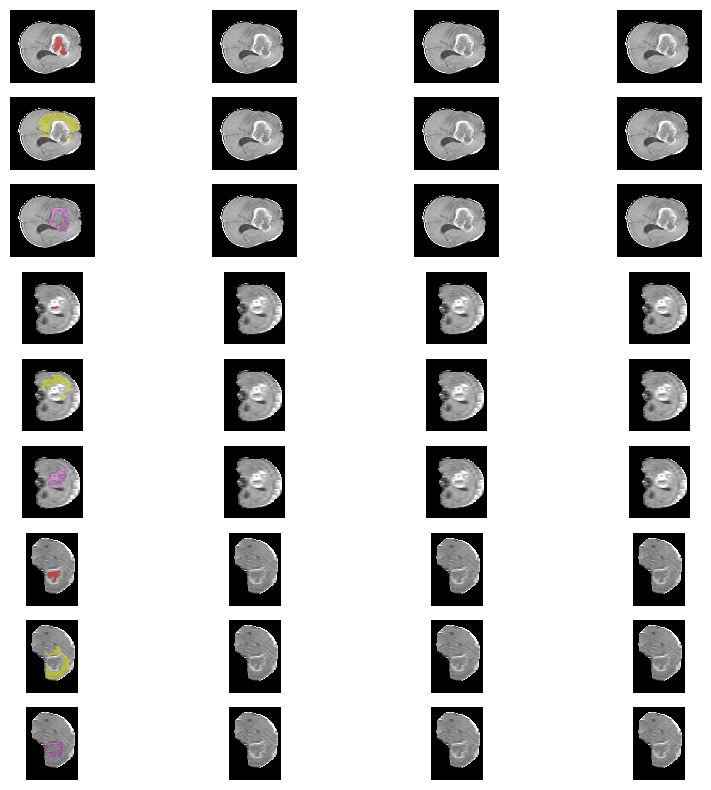

BraTS-SSA-00008-000-stk.npy
[[62. 56. 96. 90.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00008-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb 

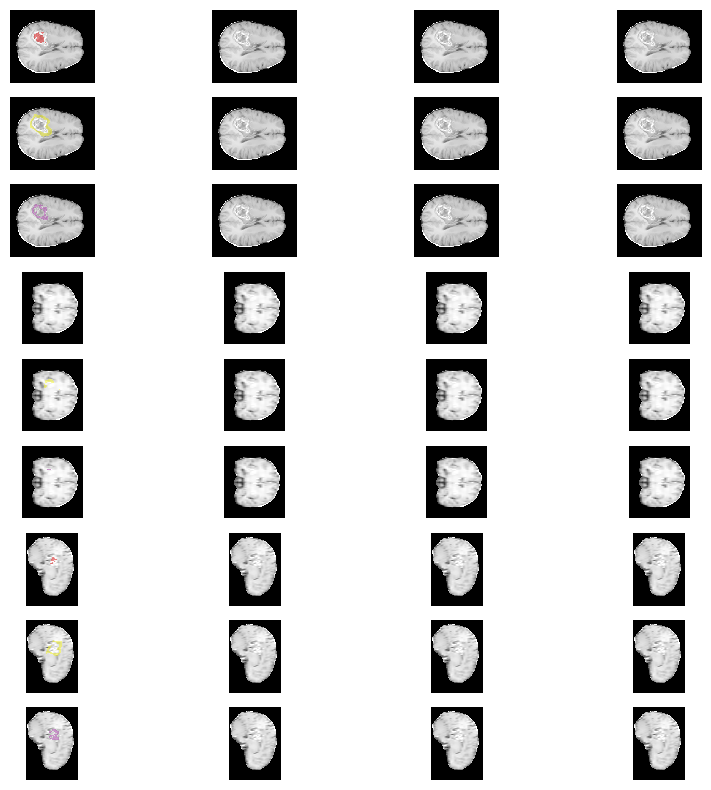

BraTS-SSA-00010-000-stk.npy
[[116.  88. 181. 132.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00010-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

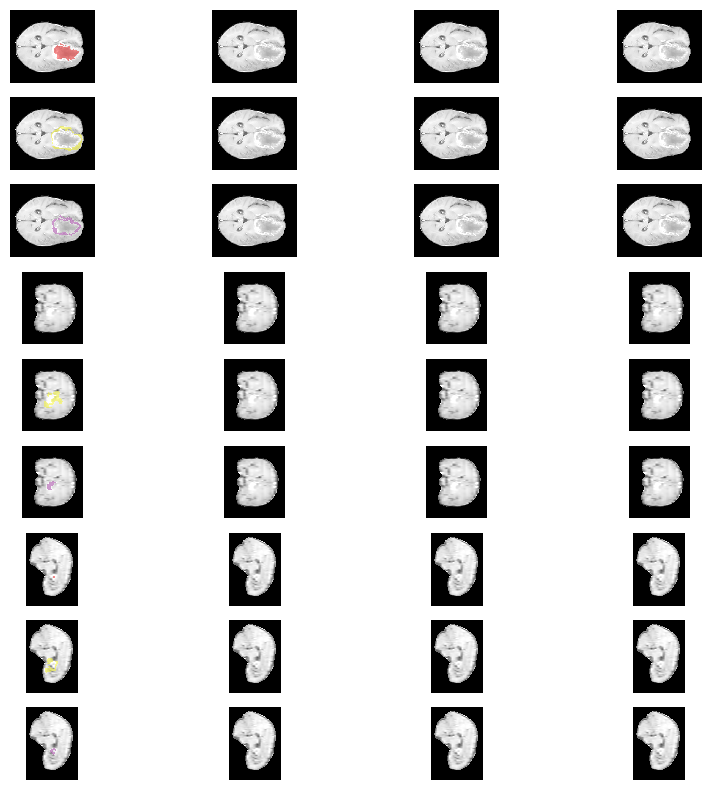

BraTS-SSA-00011-000-stk.npy
[[ 83.  75. 125.  96.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00011-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

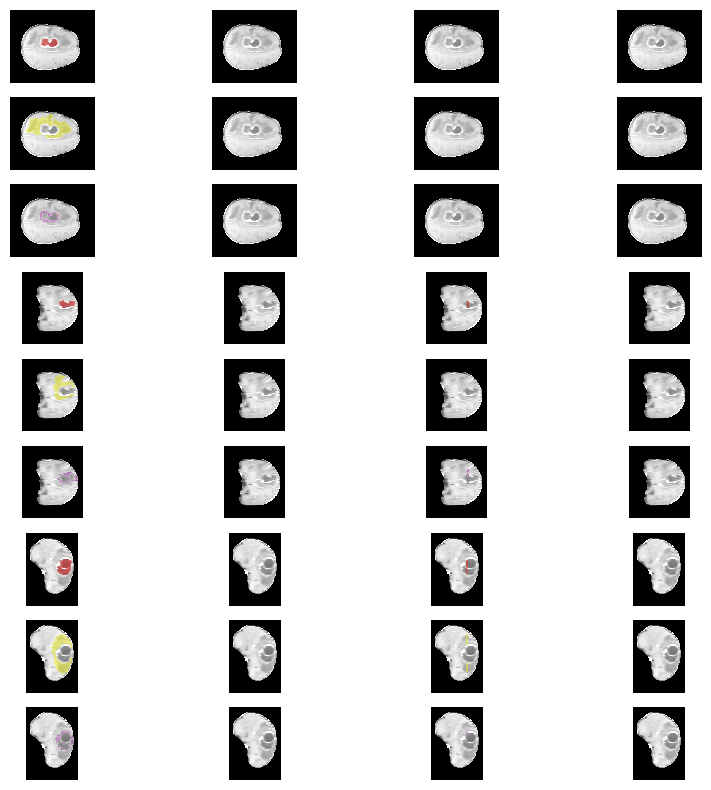

BraTS-SSA-00025-000-stk.npy
[[ 54.  77. 102. 125.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00025-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

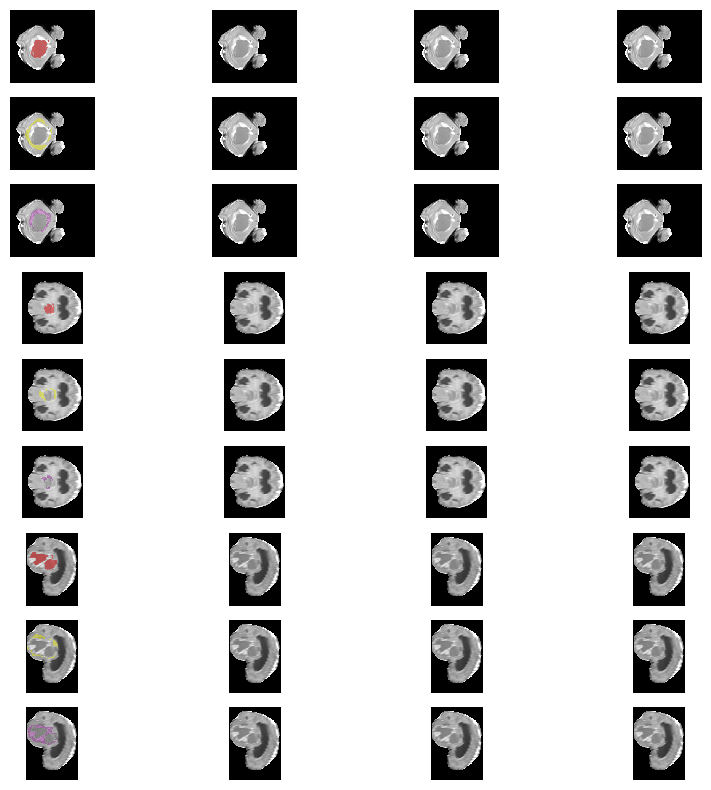

BraTS-SSA-00026-000-stk.npy
[[ 43. 115.  63. 125.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00026-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

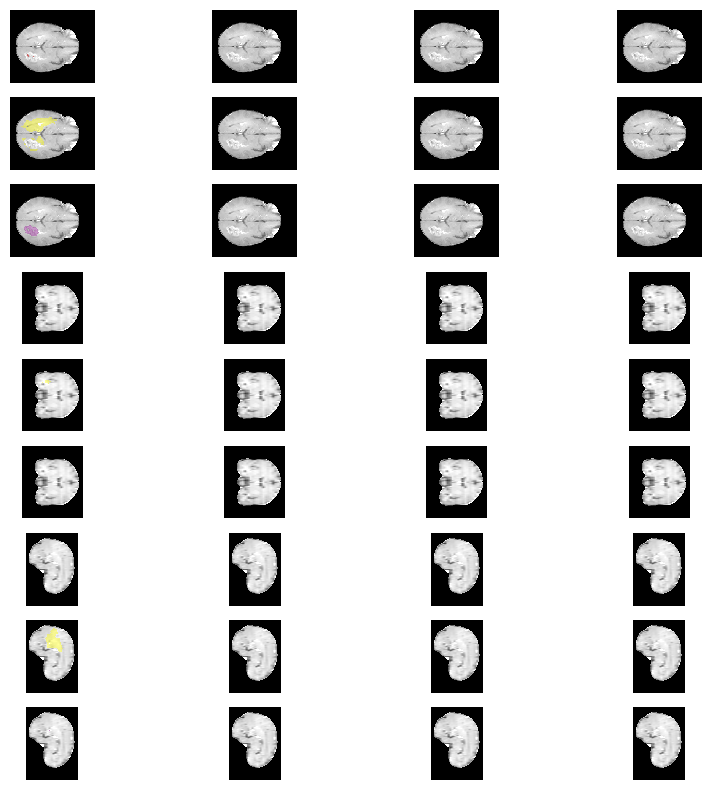

BraTS-SSA-00044-000-stk.npy
[[136.  79. 172.  98.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00044-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

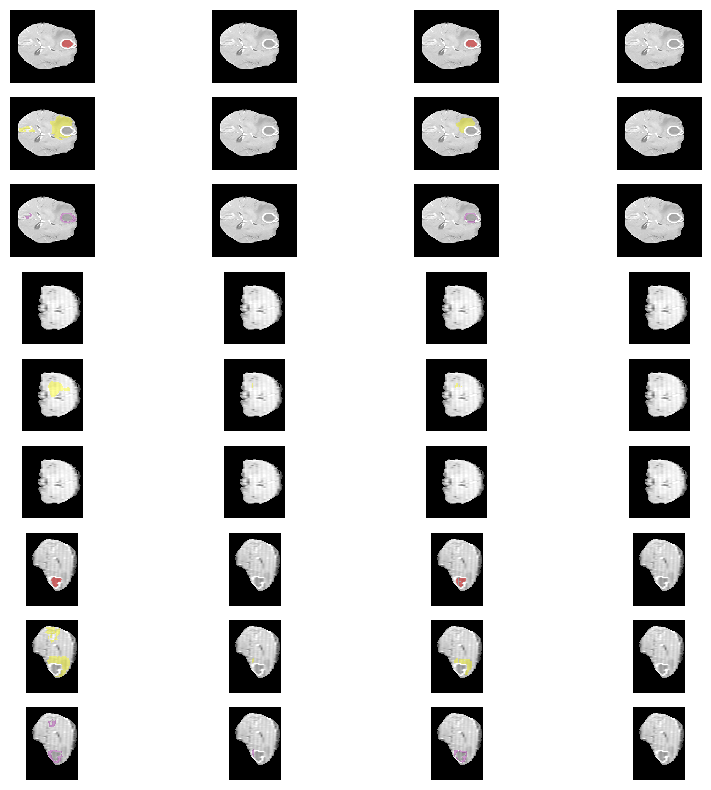

BraTS-SSA-00055-000-stk.npy
[[ 98. 121. 105. 125.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00055-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

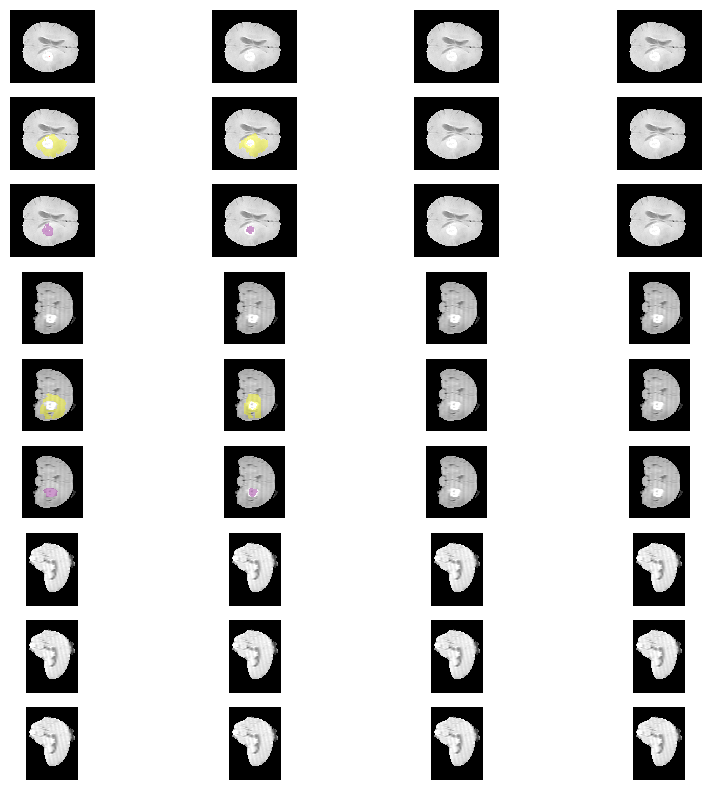

BraTS-SSA-00056-000-stk.npy
[[121.  85. 165. 123.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00056-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

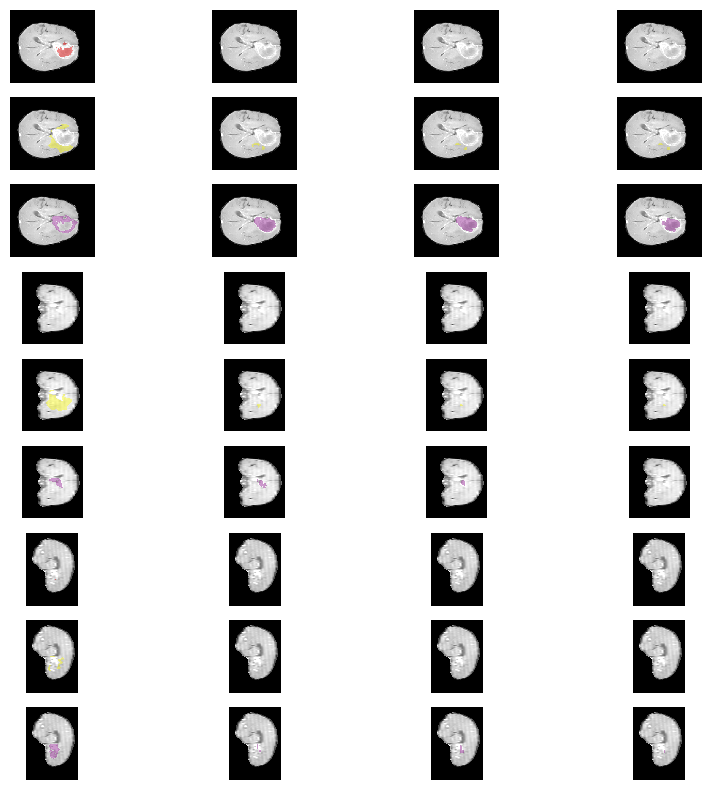

BraTS-SSA-00057-000-stk.npy
[[ 78.  41. 147. 100.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00057-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

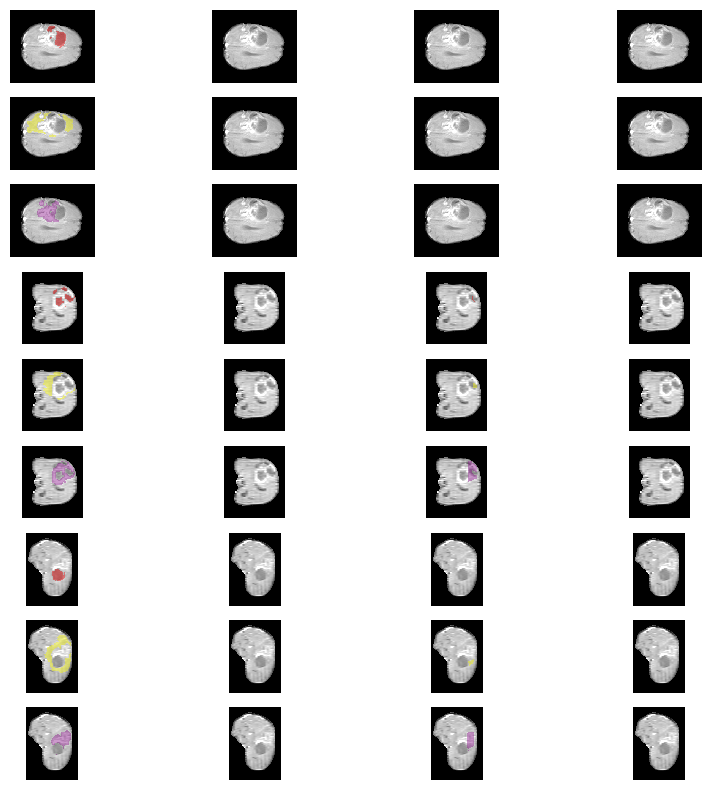

BraTS-SSA-00074-000-stk.npy
[[ 76.  89. 106. 103.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00074-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

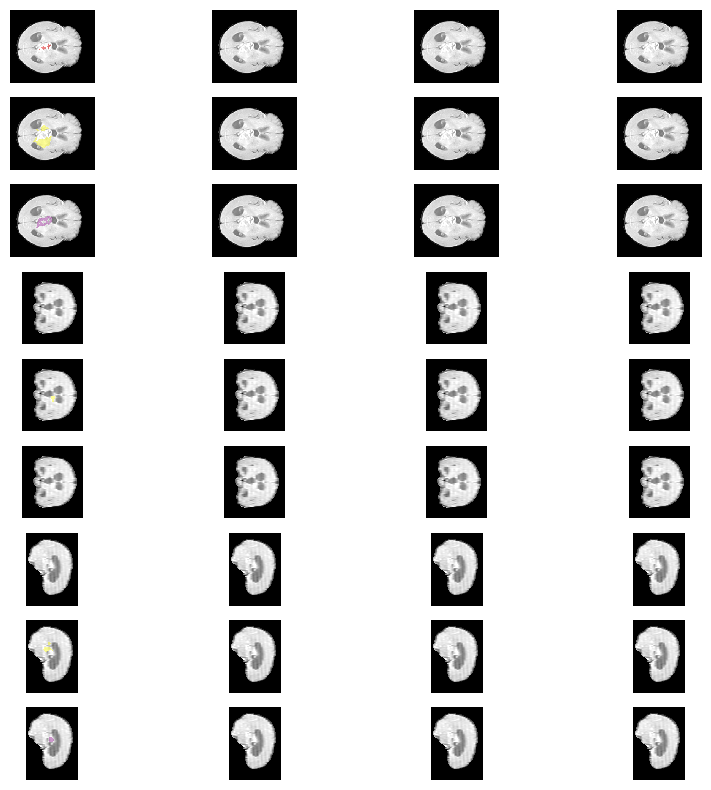

BraTS-SSA-00078-000-stk.npy
[[ 86. 109.  90. 110.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00078-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

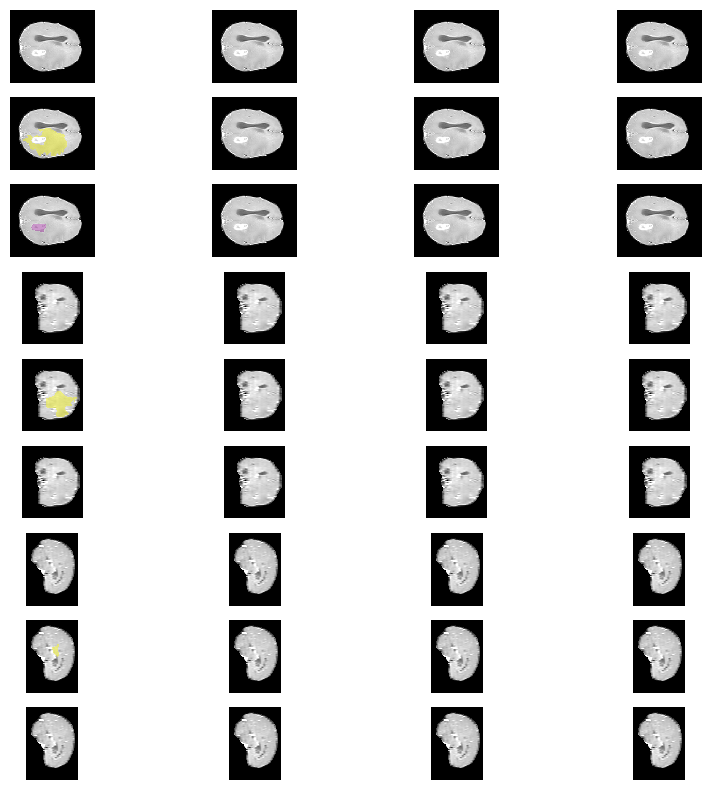

BraTS-SSA-00116-000-stk.npy
[[81. 83. 81. 83.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00116-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb 

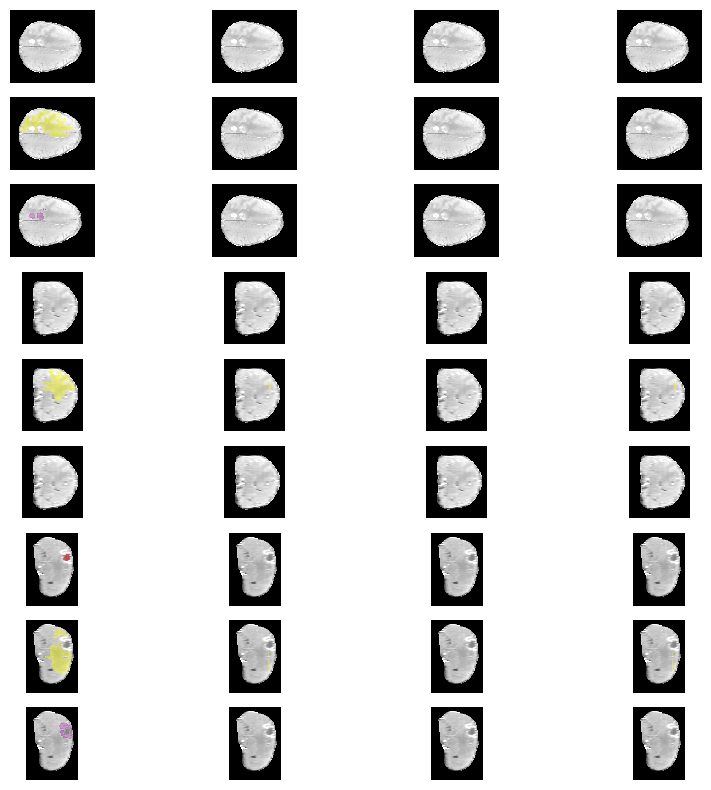

BraTS-SSA-00117-000-stk.npy
[[ 49.  62. 145. 163.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00117-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

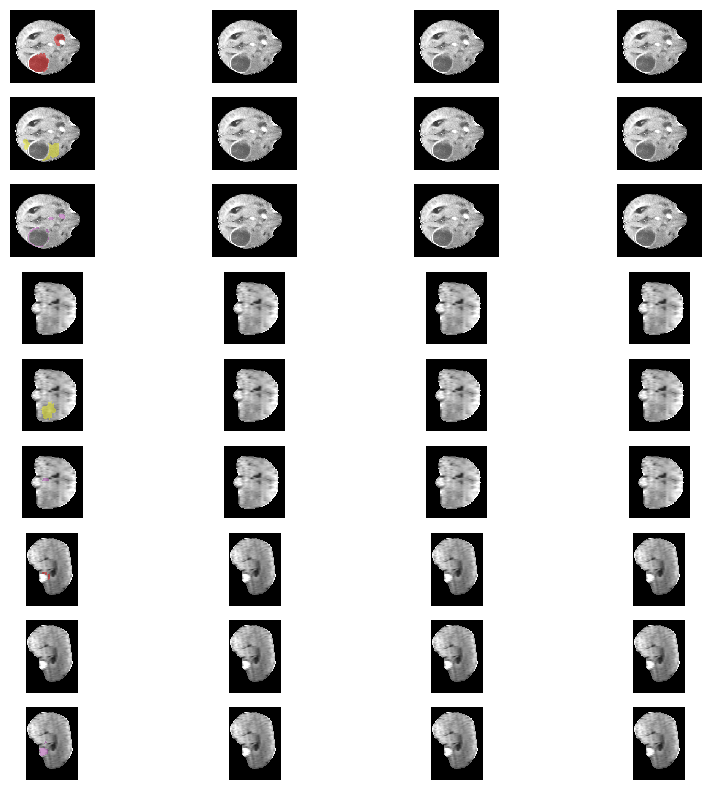

BraTS-SSA-00120-000-stk.npy
[[ 82. 104. 106. 130.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00120-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

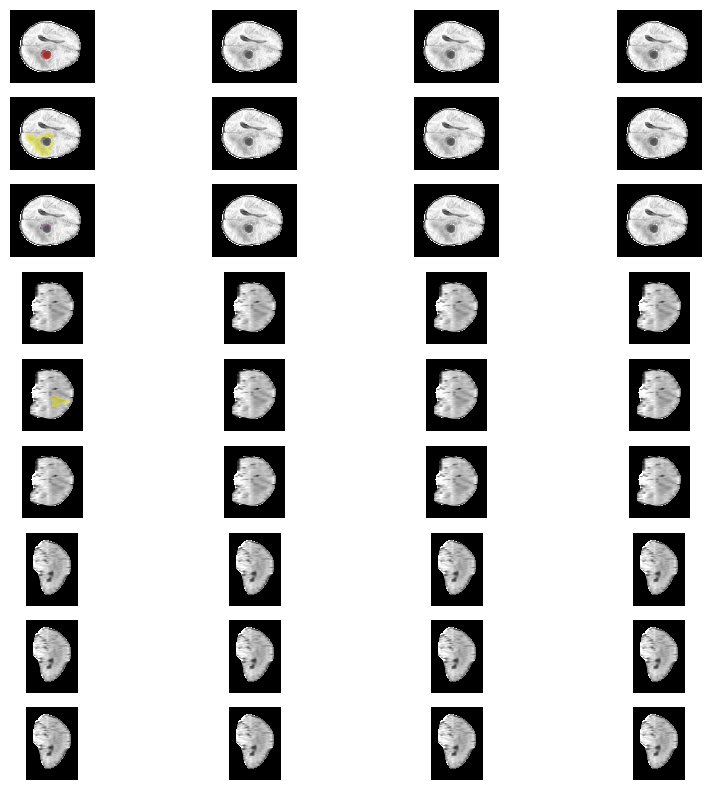

BraTS-SSA-00122-000-stk.npy
[[113. 107. 146. 132.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00122-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

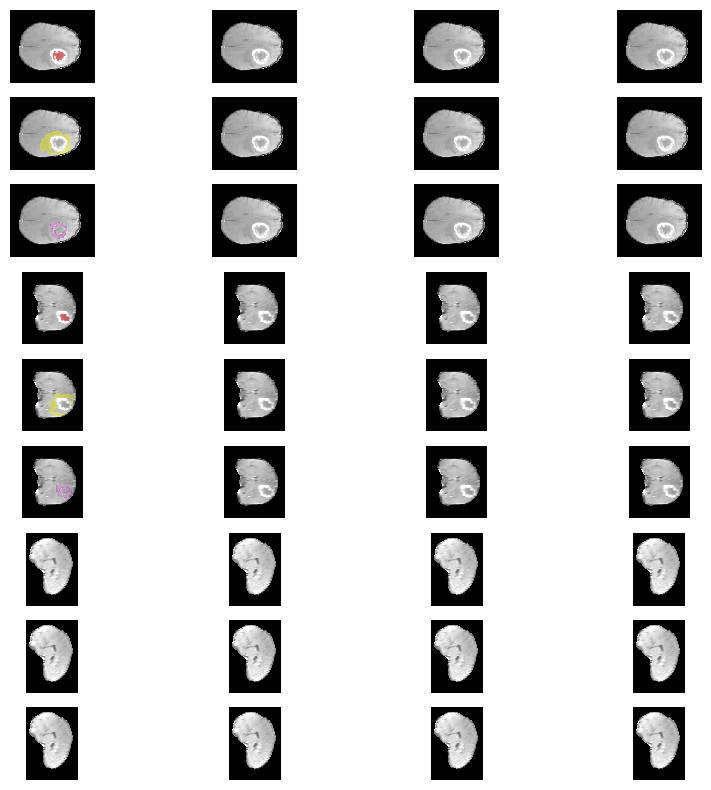

BraTS-SSA-00127-000-stk.npy
[[ 70.  95. 105. 120.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00127-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

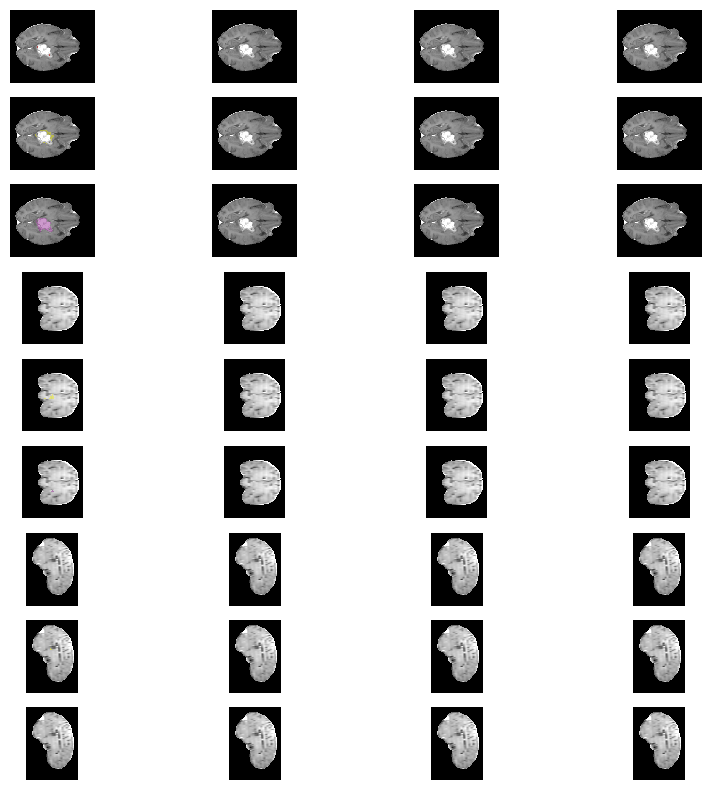

BraTS-SSA-00131-000-stk.npy
[[ 88.  88. 145. 122.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00131-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

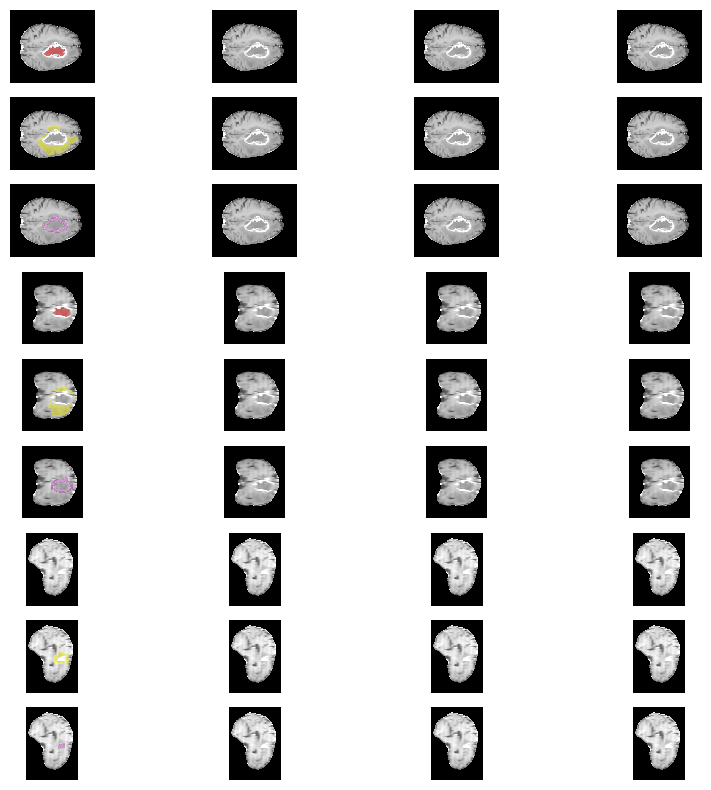

BraTS-SSA-00133-000-stk.npy
[[ 60. 103. 123. 142.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00133-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

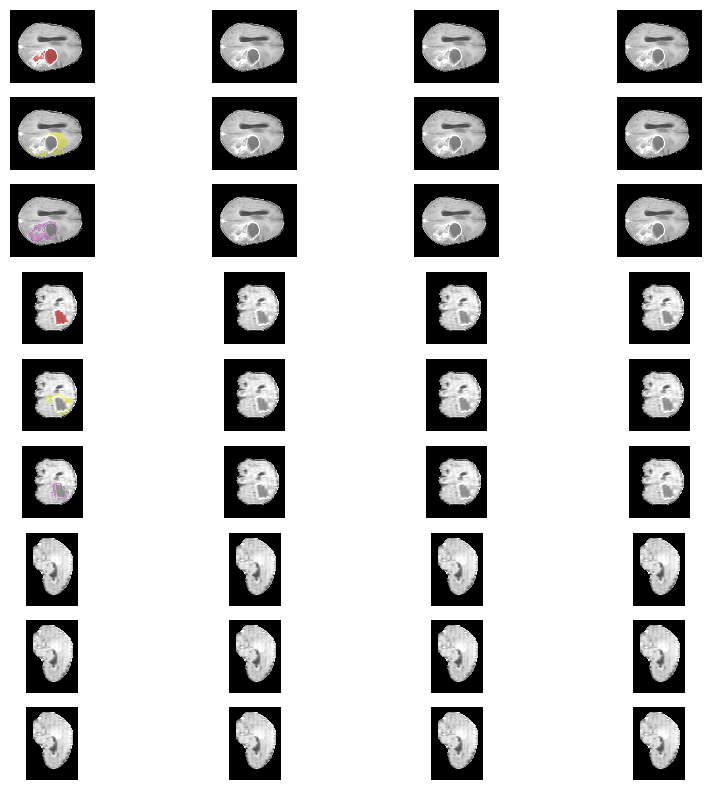

BraTS-SSA-00141-000-stk.npy
[[ 99.  58. 158. 105.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00141-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

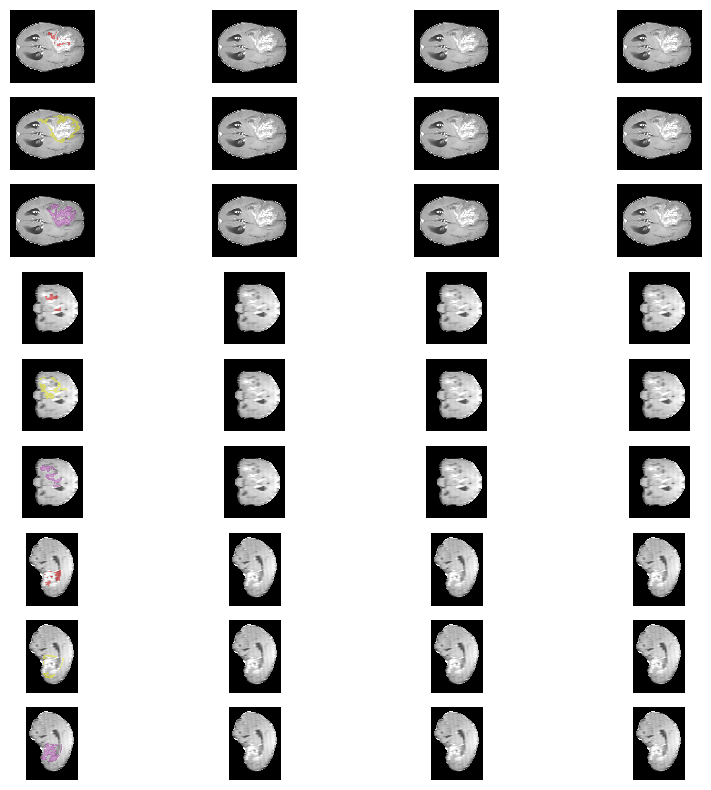

BraTS-SSA-00150-000-stk.npy
[[ 73. 113. 128. 160.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00150-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

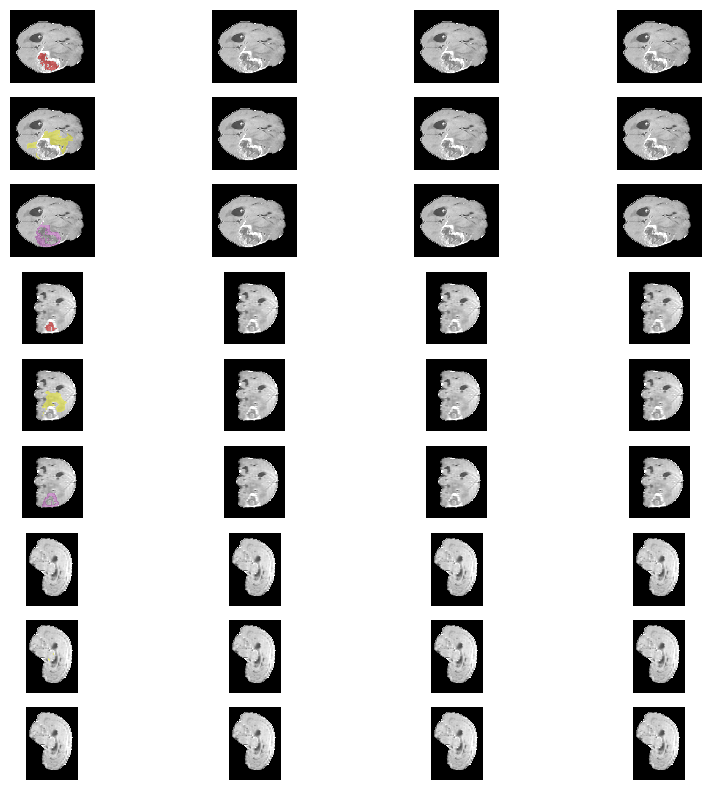

BraTS-SSA-00161-000-stk.npy
[[ 91.  48. 145.  93.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00161-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

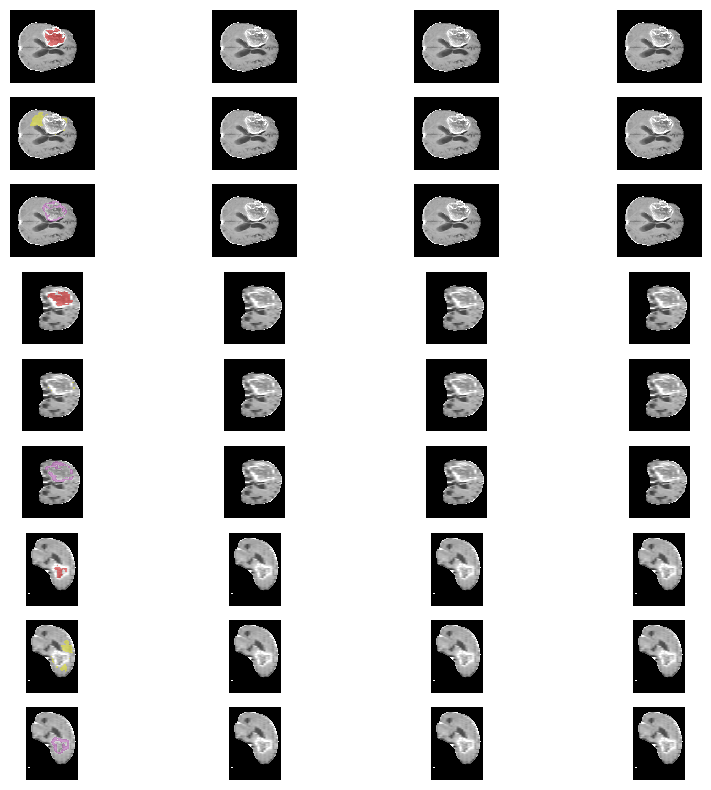

BraTS-SSA-00213-000-stk.npy
[[ 45.  67.  87. 123.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00213-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

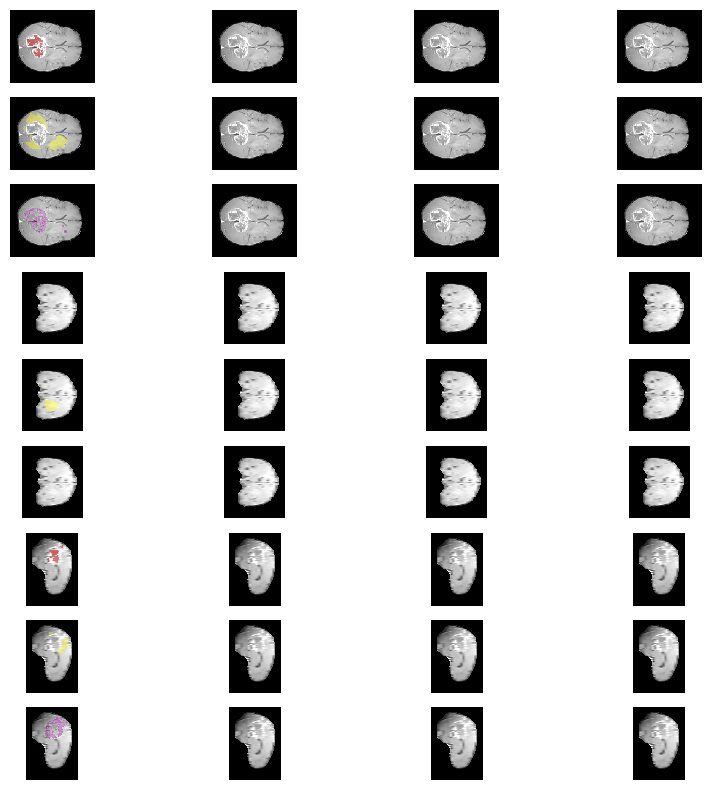

BraTS-SSA-00220-000-stk.npy
[[48. 44. 92. 70.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00220-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb 

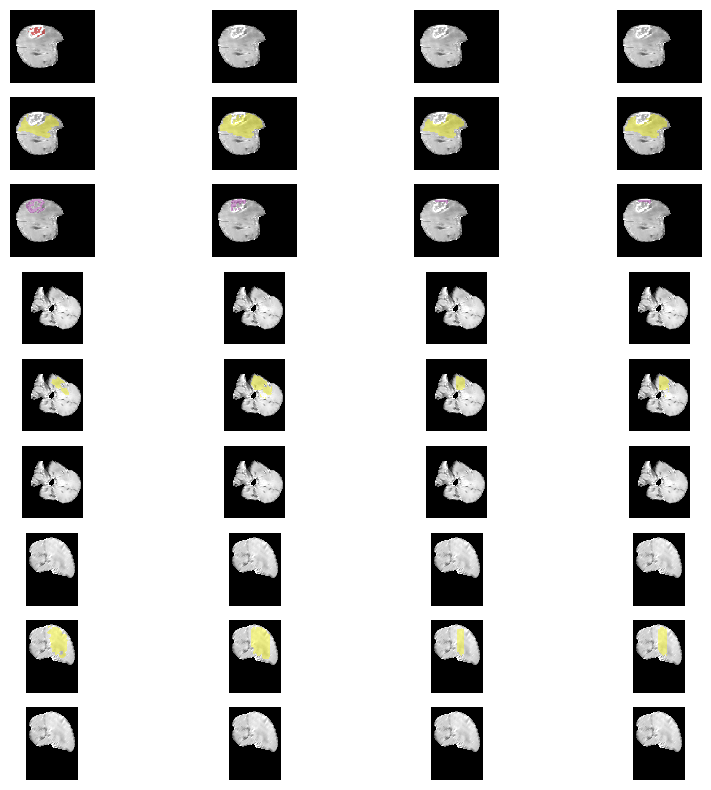

BraTS-SSA-00230-000-stk.npy
[[125.  75. 147.  95.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00230-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_

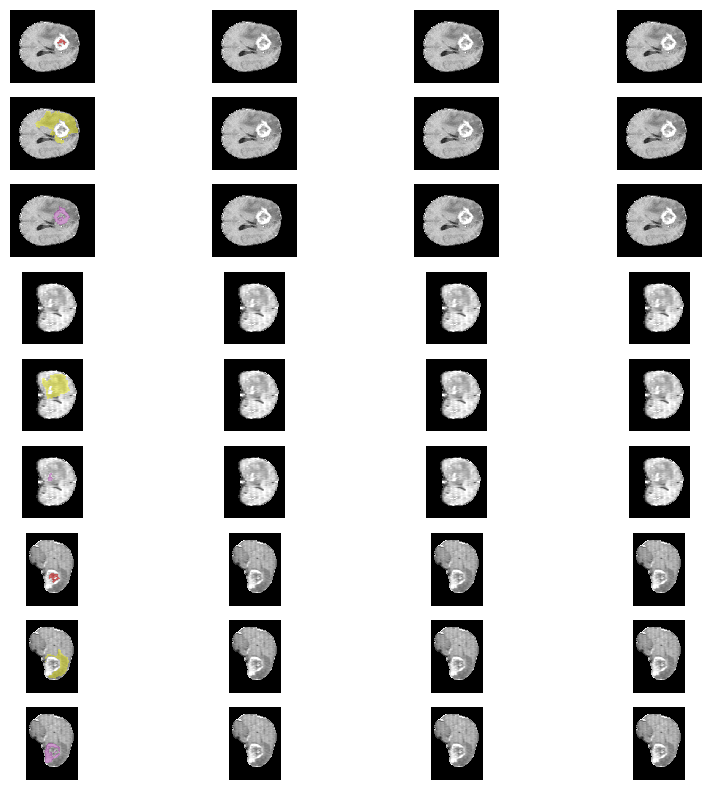

In [33]:
GLI_video_path = '/scratch-second/BraTS_SSA/Validation/images_UNN'
GLI_label_path = '/scratch-second/BraTS_SSA/Validation/labels_UNN'
GLI_pred_path = '/scratch-second/TTA_results/val_ent_only_decoder_lr4_augs/logs/BraTS_GLI'
pred2 = '/scratch-second/TTA_results/val_ent_first_layer_lr4_augs/logs/BraTS_GLI'
pred3 = '/scratch-second/TTA_results/val_ent_norm_lr4_augs/logs/BraTS_GLI' 
cols = ["dice_ED", "dice_ET", "dice_NCR"]




GLI_worst_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_worst_list)
visualize_4d_layer(GLI_worst_dataset, GLI_pred_path, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, pred2,  pred3)

BraTS-SSA-00007-000-stk.npy
[[111.  70. 150. 118.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00007-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

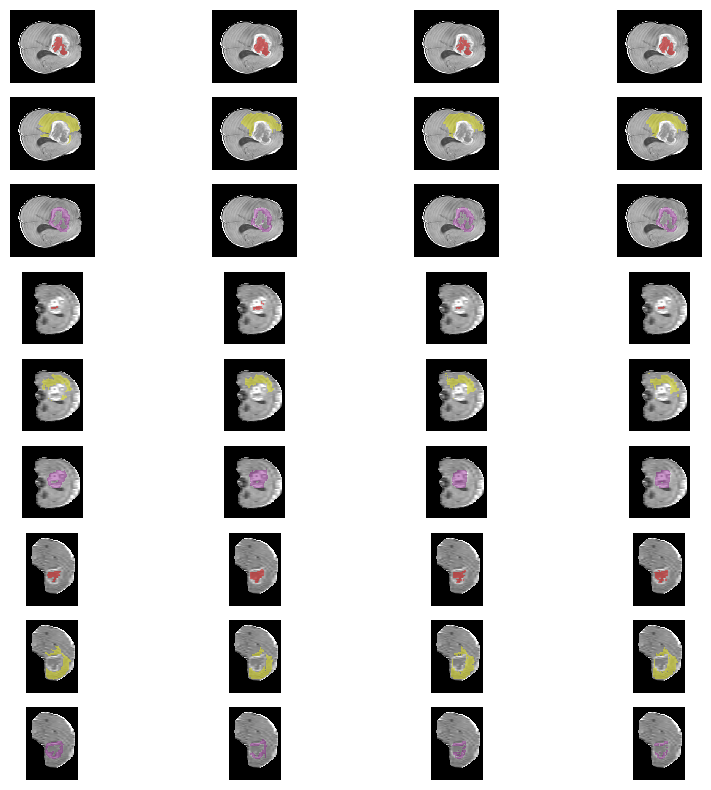

BraTS-SSA-00008-000-stk.npy
[[62. 56. 96. 90.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00008-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape

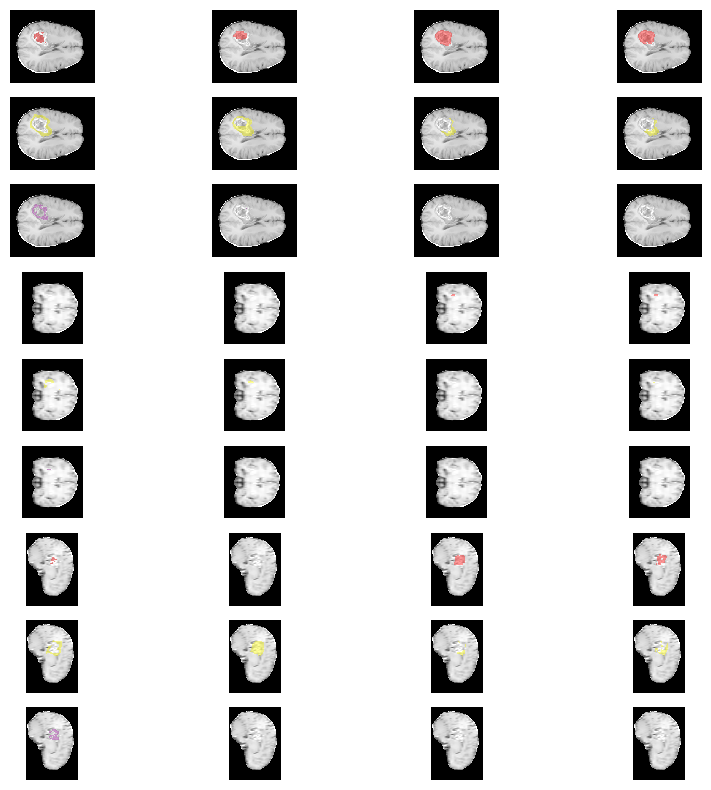

BraTS-SSA-00010-000-stk.npy
[[116.  88. 181. 132.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00010-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

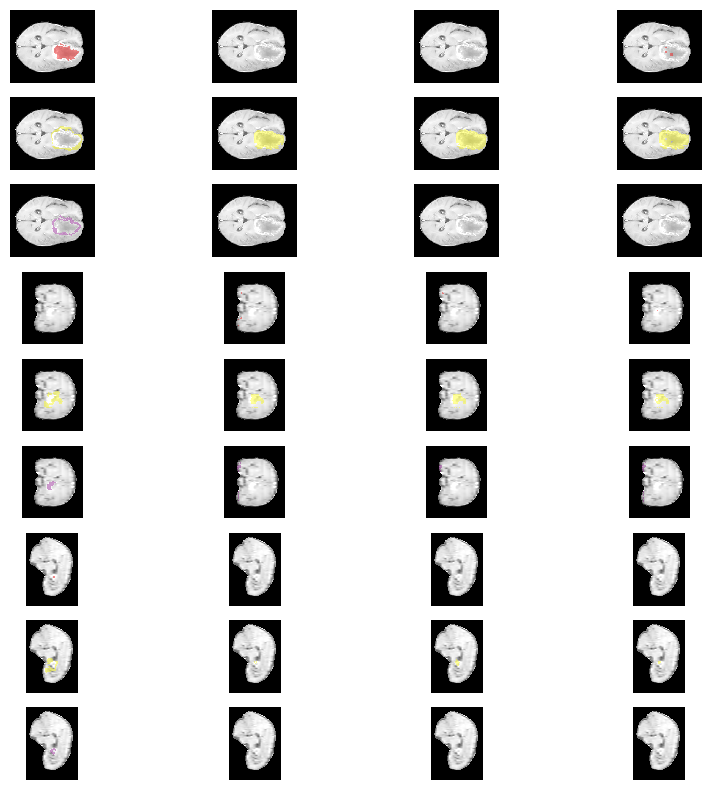

BraTS-SSA-00011-000-stk.npy
[[ 83.  75. 125.  96.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00011-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

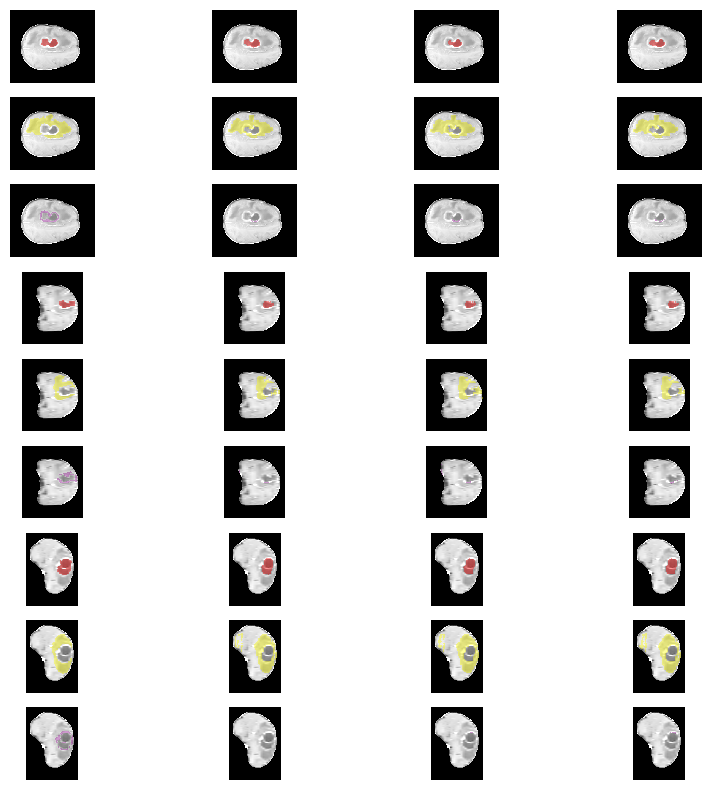

BraTS-SSA-00025-000-stk.npy
[[ 54.  77. 102. 125.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00025-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

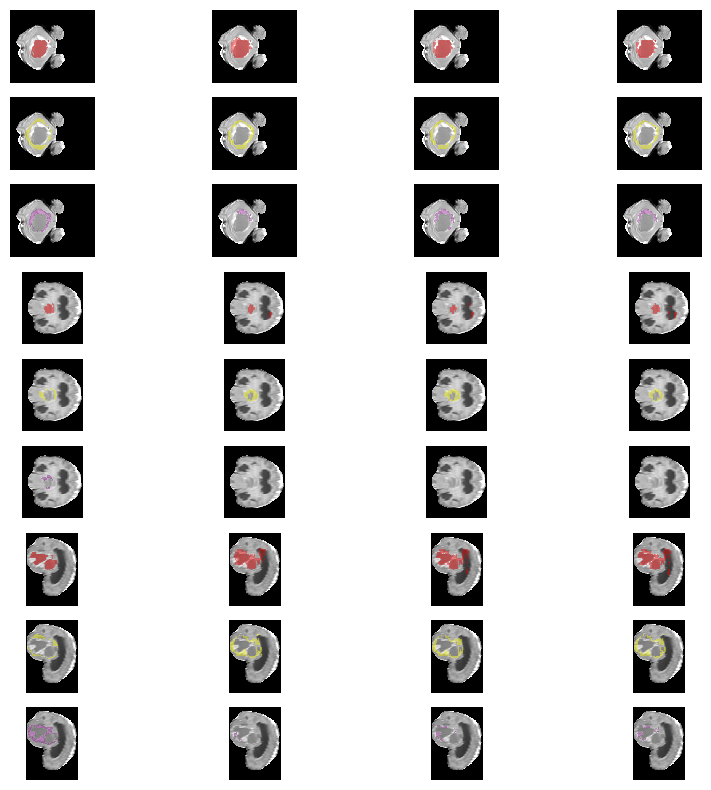

BraTS-SSA-00026-000-stk.npy
[[ 43. 115.  63. 125.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00026-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

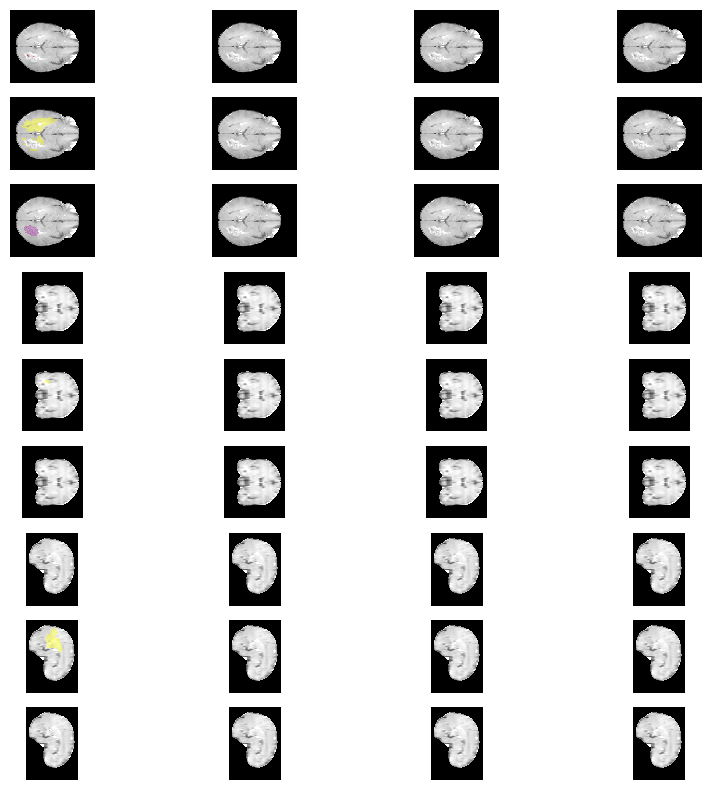

BraTS-SSA-00044-000-stk.npy
[[136.  79. 172.  98.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00044-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

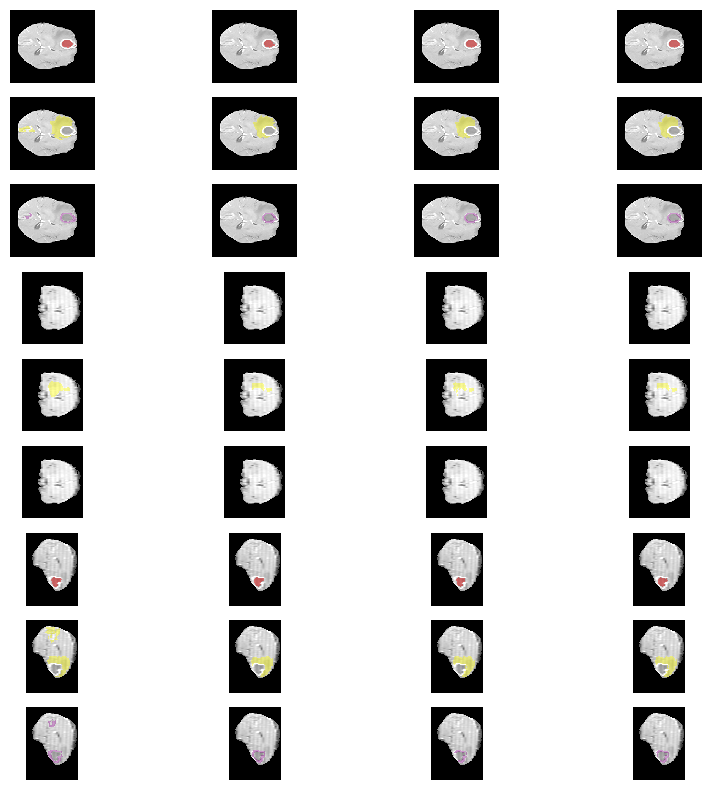

BraTS-SSA-00055-000-stk.npy
[[ 98. 121. 105. 125.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00055-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

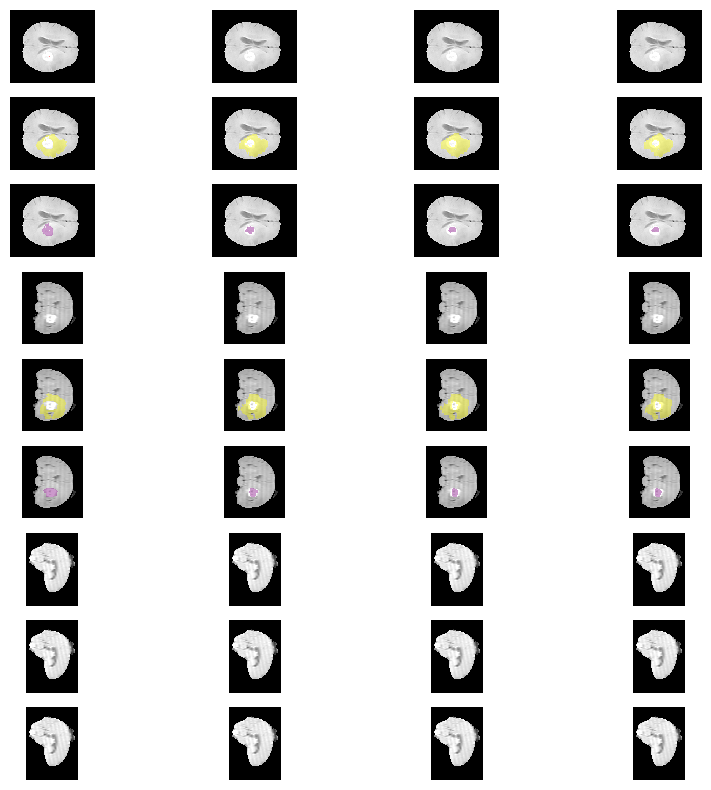

BraTS-SSA-00056-000-stk.npy
[[121.  85. 165. 123.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00056-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

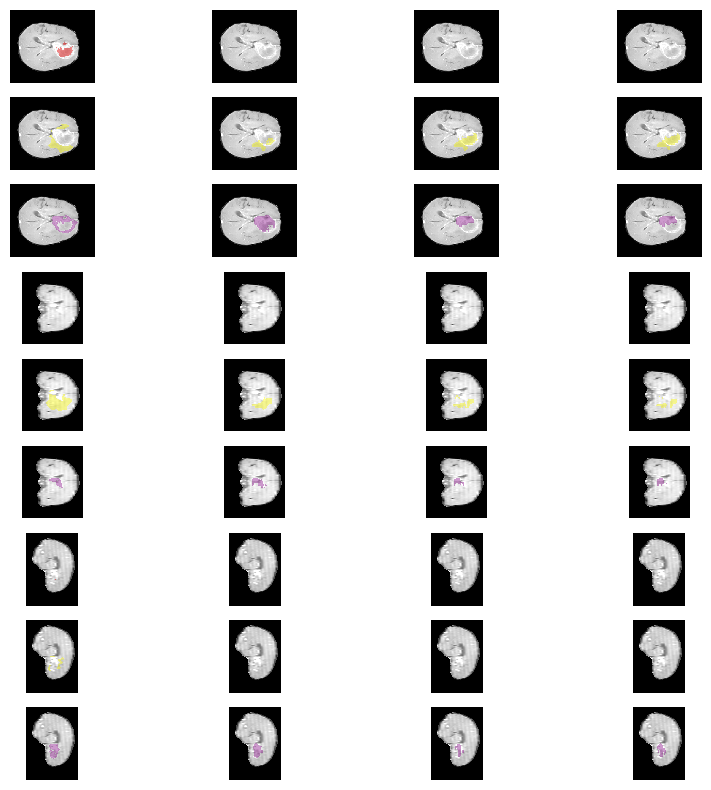

BraTS-SSA-00057-000-stk.npy
[[ 78.  41. 147. 100.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00057-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

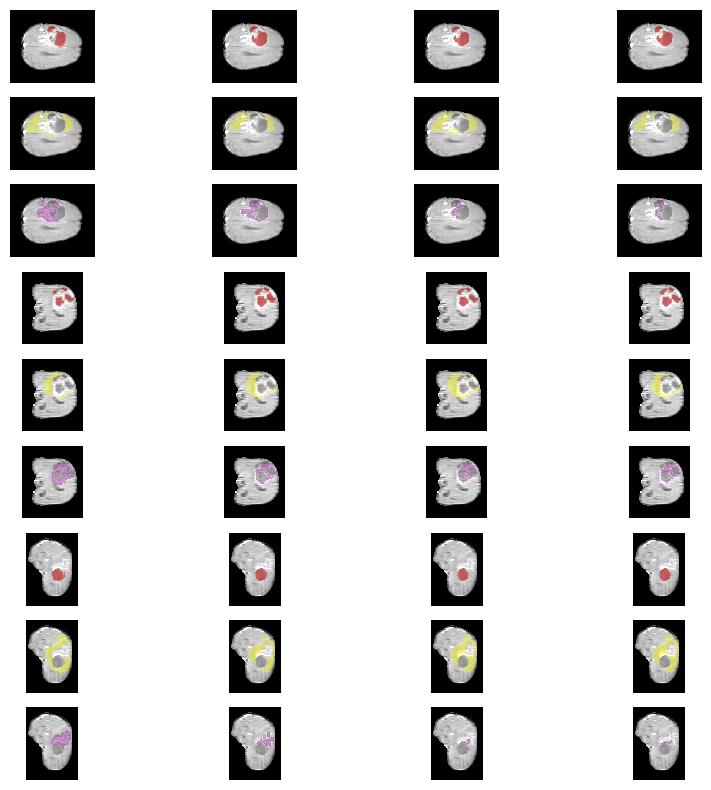

BraTS-SSA-00074-000-stk.npy
[[ 76.  89. 106. 103.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00074-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

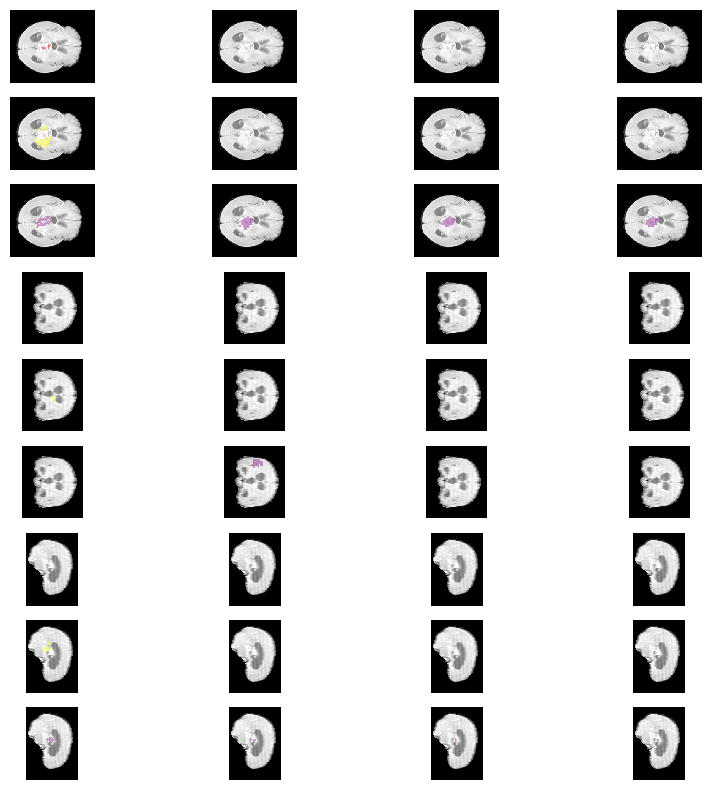

BraTS-SSA-00078-000-stk.npy
[[ 86. 109.  90. 110.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00078-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

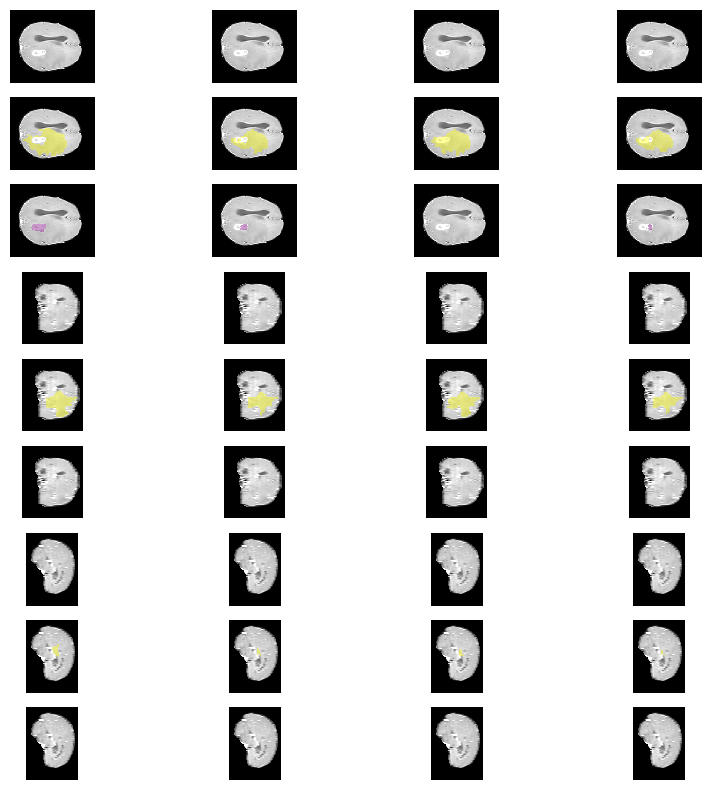

BraTS-SSA-00116-000-stk.npy
[[81. 83. 81. 83.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00116-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape

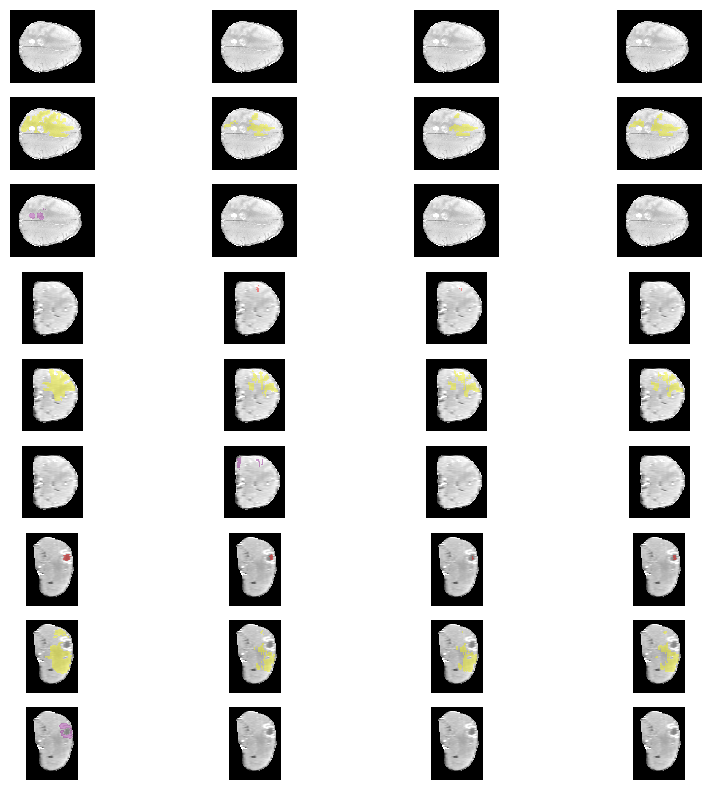

BraTS-SSA-00117-000-stk.npy
[[ 49.  62. 145. 163.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00117-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

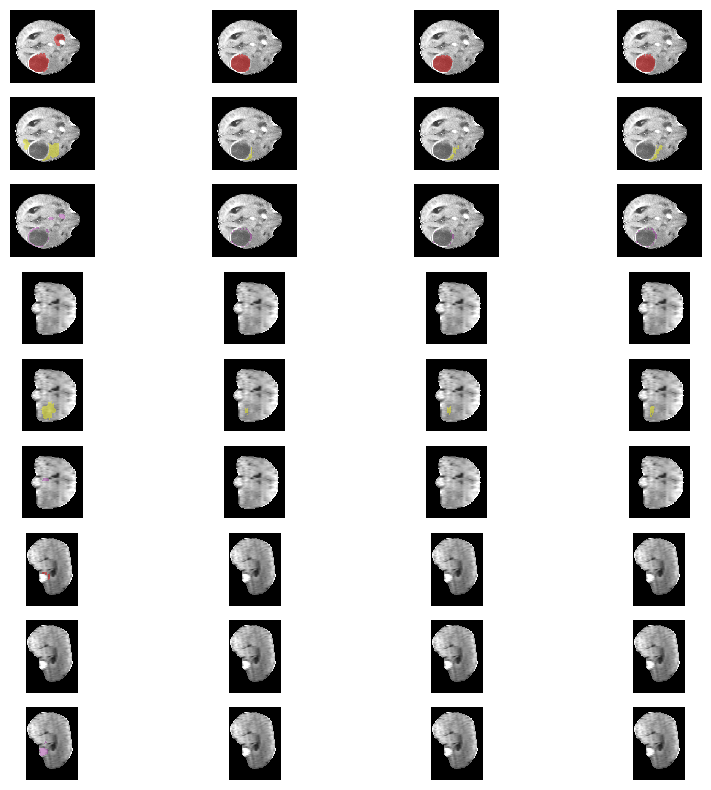

BraTS-SSA-00120-000-stk.npy
[[ 82. 104. 106. 130.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00120-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

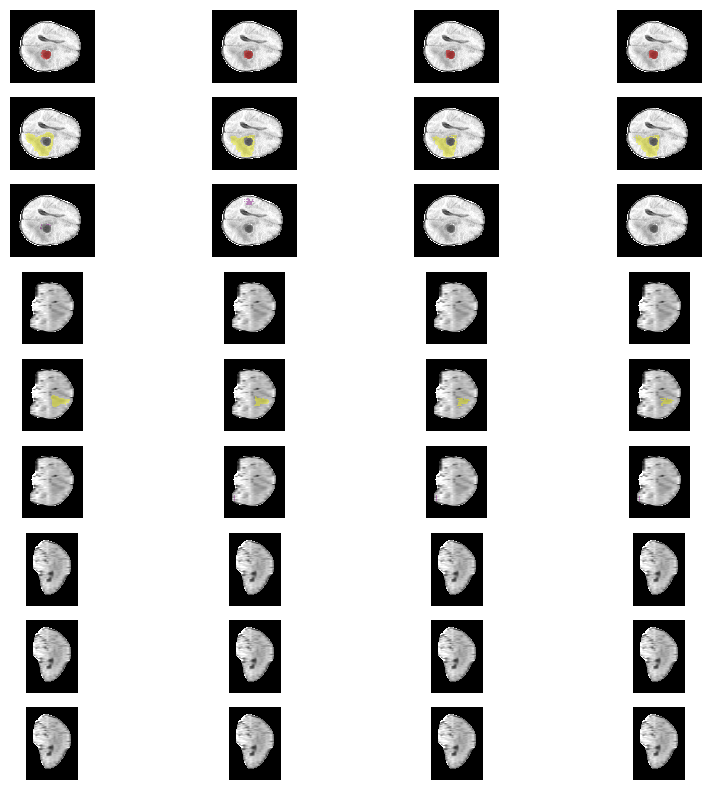

BraTS-SSA-00122-000-stk.npy
[[113. 107. 146. 132.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00122-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

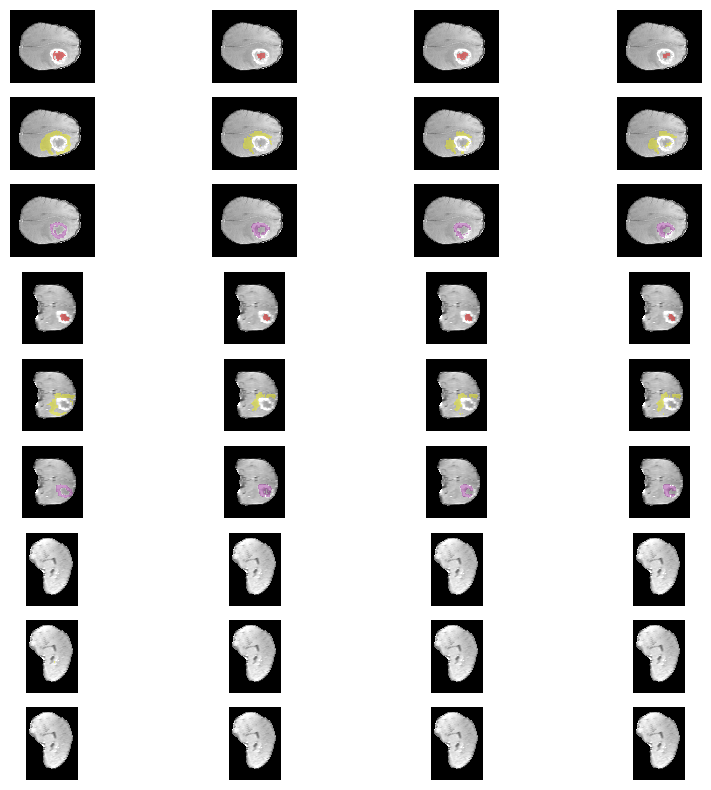

BraTS-SSA-00127-000-stk.npy
[[ 70.  95. 105. 120.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00127-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

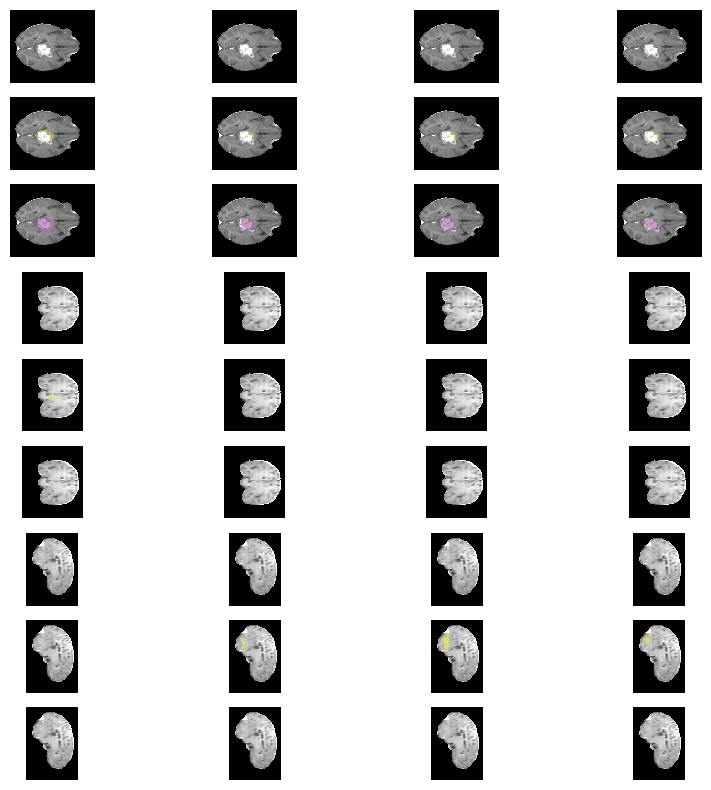

BraTS-SSA-00131-000-stk.npy
[[ 88.  88. 145. 122.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00131-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

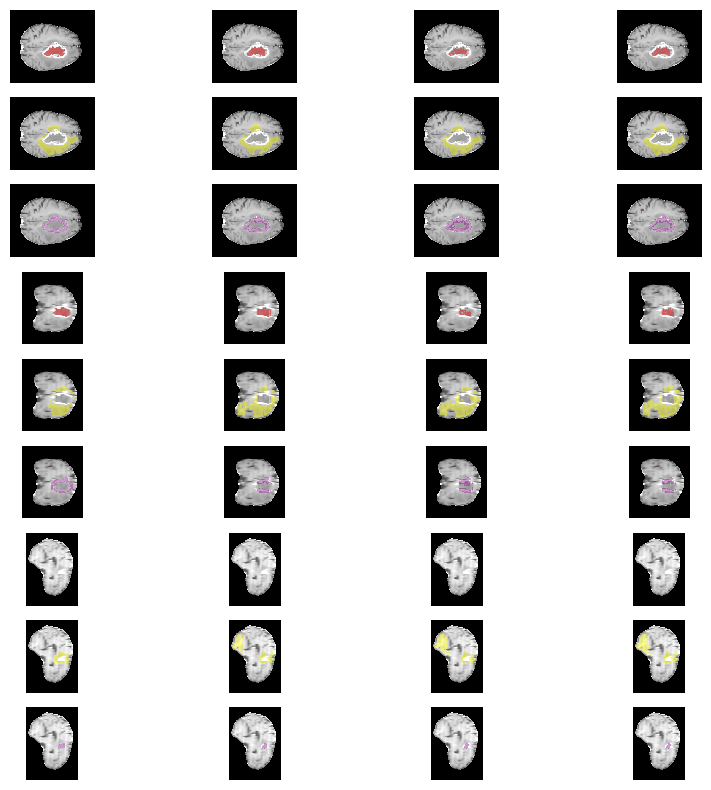

BraTS-SSA-00133-000-stk.npy
[[ 60. 103. 123. 142.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00133-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

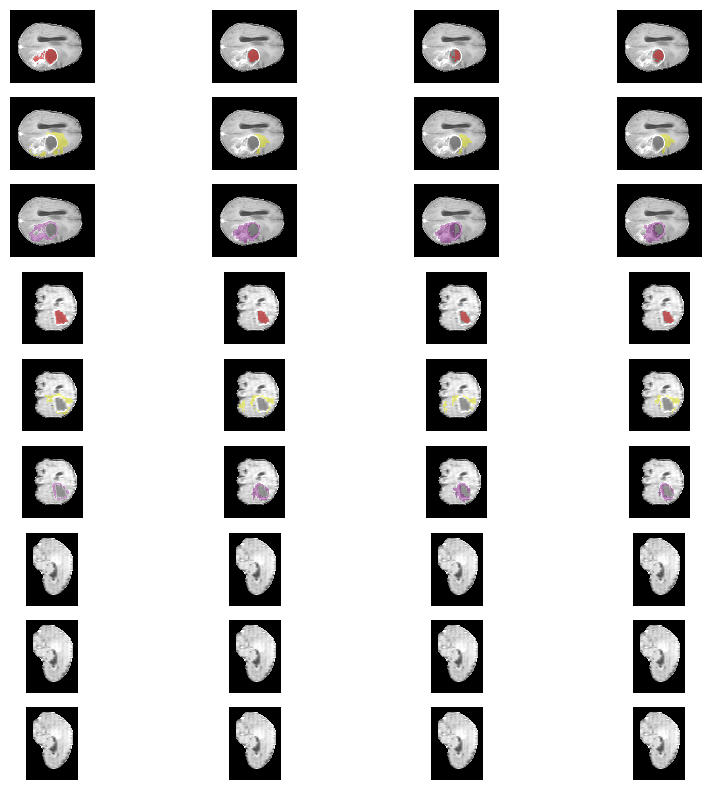

BraTS-SSA-00141-000-stk.npy
[[ 99.  58. 158. 105.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00141-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

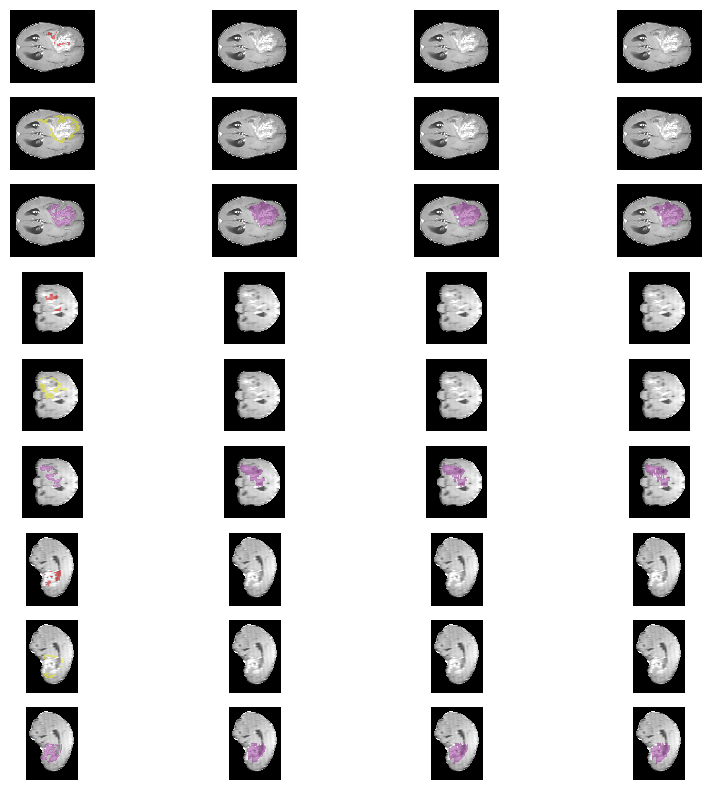

BraTS-SSA-00150-000-stk.npy
[[ 73. 113. 128. 160.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00150-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

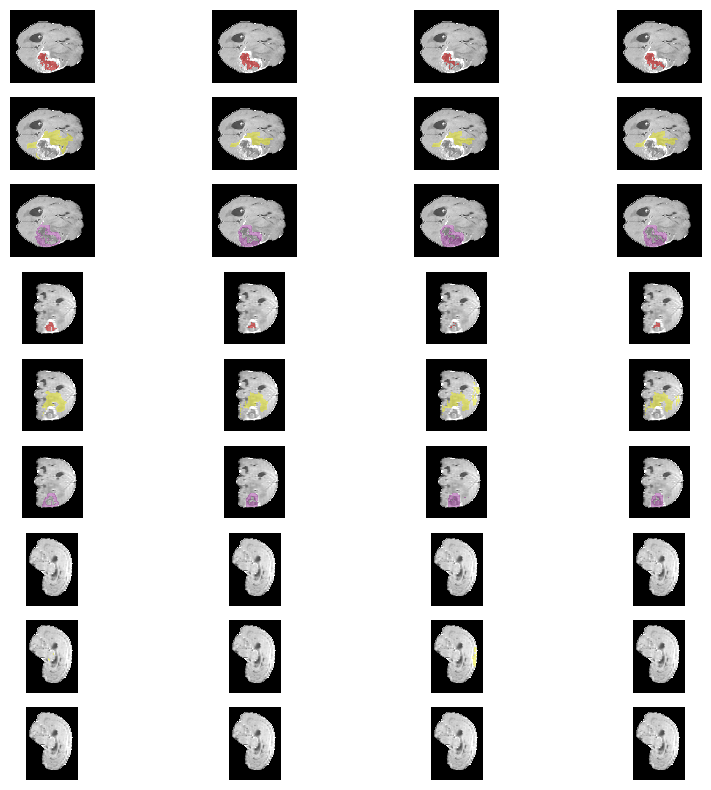

BraTS-SSA-00161-000-stk.npy
[[ 91.  48. 145.  93.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00161-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

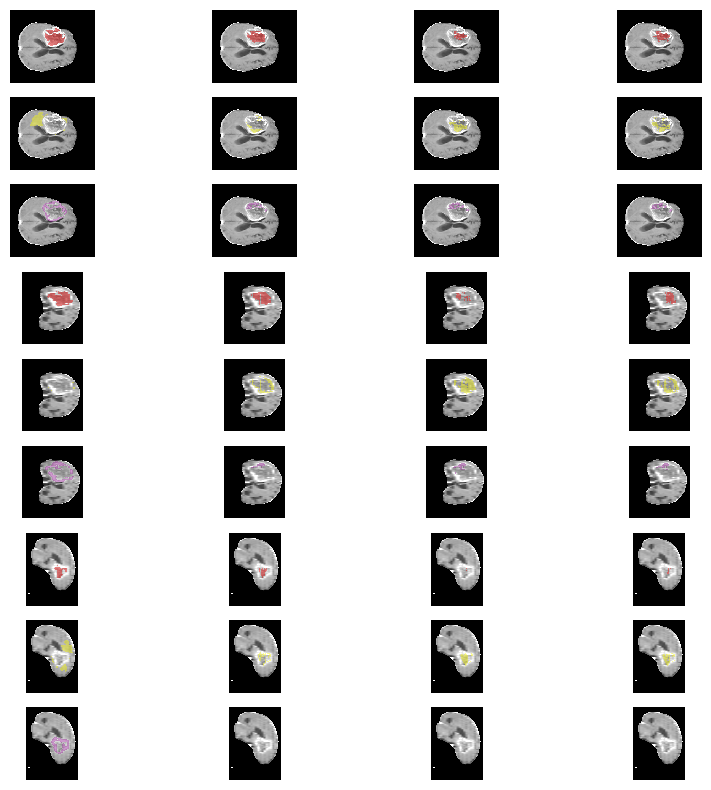

BraTS-SSA-00213-000-stk.npy
[[ 45.  67.  87. 123.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00213-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

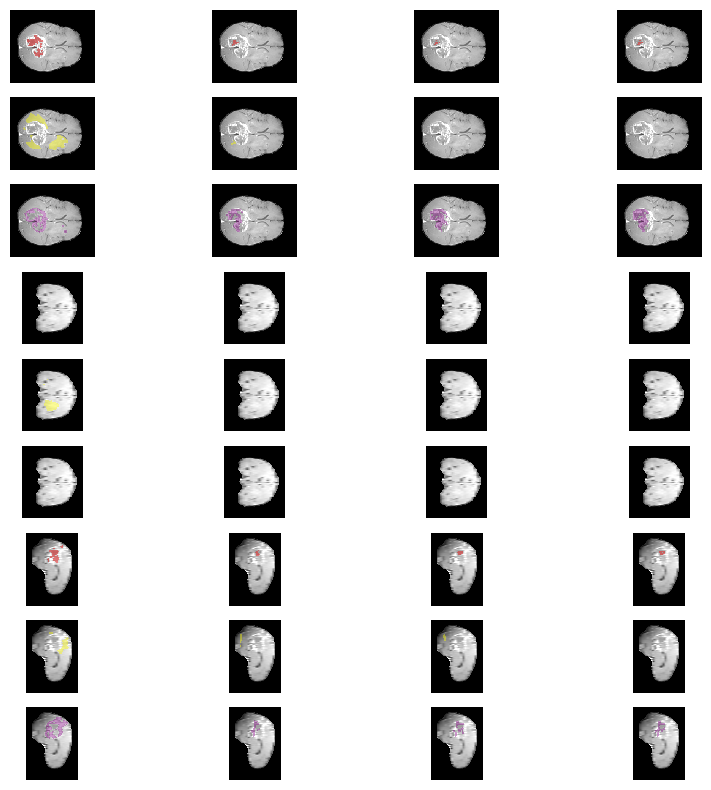

BraTS-SSA-00220-000-stk.npy
[[48. 44. 92. 70.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00220-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape

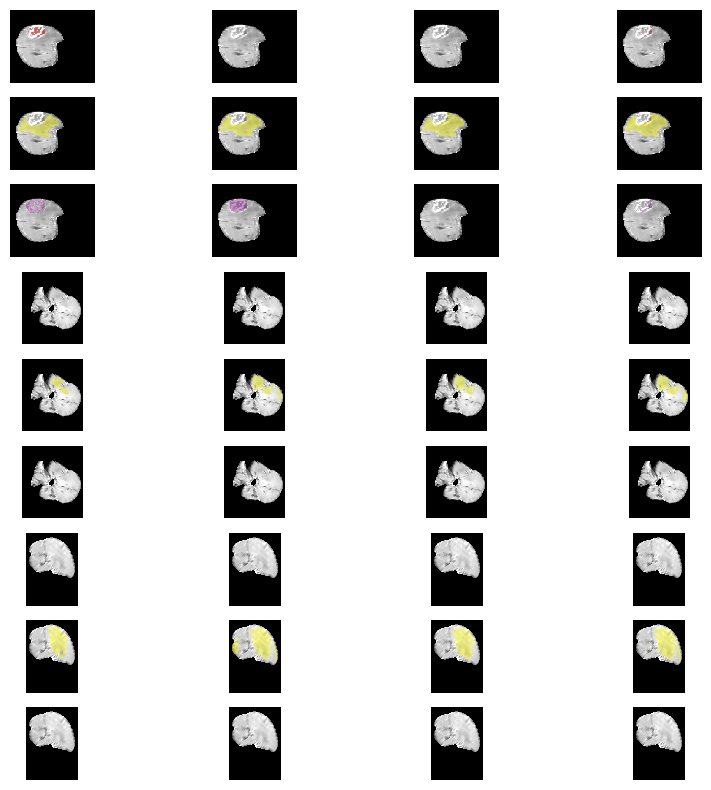

BraTS-SSA-00230-000-stk.npy
[[125.  75. 147.  95.]]
pred2.shape /scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI/BraTS-SSA-00230-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb s

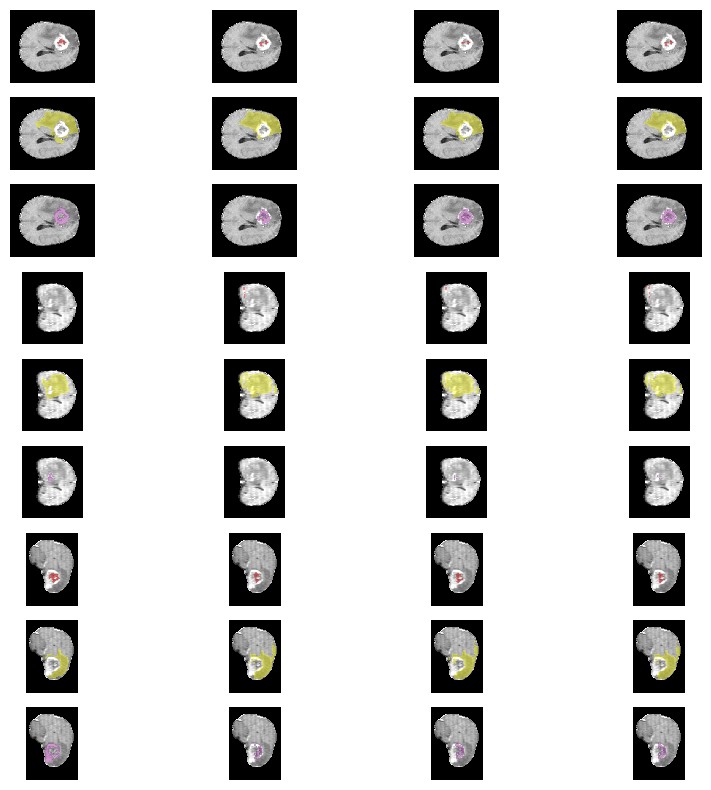

In [34]:
GLI_video_path = '/scratch-second/BraTS_SSA/Validation/images_UNN'
GLI_label_path = '/scratch-second/BraTS_SSA/Validation/labels_UNN'
GLI_pred_path = '/scratch-second/TTA_results/val_ent_only_decoder_lr4/logs/BraTS_GLI'
pred2 = '/scratch-second/TTA_results/val_ent_first_layer_lr4/logs/BraTS_GLI'
pred3 = '/scratch-second/TTA_results/val_ent_norm_lr4/logs/BraTS_GLI' 
cols = ["dice_ED", "dice_ET", "dice_NCR"]




GLI_worst_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_worst_list)
visualize_4d_layer(GLI_worst_dataset, GLI_pred_path, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, pred2,  pred3)

BraTS-SSA-00007-000-stk.npy
[[111.  70. 150. 118.]]


FileNotFoundError: [Errno 2] No such file or directory: '/scratch-second/TTA_results/val_ent_sup_only_decoder_lr4_augs/logs/BraTS_GLI/BraTS-SSA-00007-000.npy'

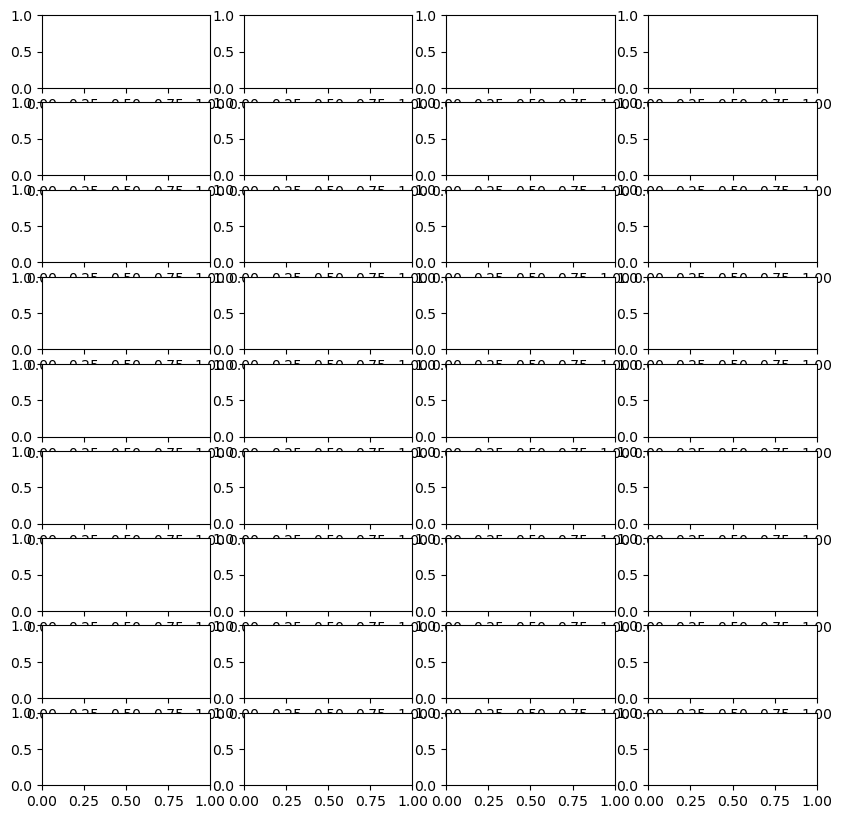

In [ ]:
GLI_video_path = '/scratch-second/BraTS_SSA/Validation/images_UNN'
GLI_label_path = '/scratch-second/BraTS_SSA/Validation/labels_UNN'
GLI_pred_path = '/scratch-second/TTA_results/val_ent_sup_decoder_lr4_augs/logs/BraTS_GLI'
pred2 = '/scratch-second/TTA_results/val_ent_sup_first_layer_lr4_augs/logs/BraTS_GLI'
pred3 = '/scratch-second/TTA_results/val_ent_sup_norm_lr4_augs/logs/BraTS_GLI' 
cols = ["dice_ED", "dice_ET", "dice_NCR"]




GLI_worst_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_worst_list)
visualize_4d_layer(GLI_worst_dataset, GLI_pred_path, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, pred2,  pred3)

target (p25 of row-mean): 0.11645916251776113
                      name  dice_NCR   dice_ED   dice_ET  hausdorff_NCR  \
4  BraTS-SSA-00121-000.npy  0.001708  0.007637  0.533908      51.283527   
1  BraTS-SSA-00044-000.npy  0.002303  0.046764  0.106435      35.292351   
3  BraTS-SSA-00057-000.npy  0.017680  0.009067  0.045719      35.355339   
0  BraTS-SSA-00015-000.npy  0.000869  0.015481  0.006336      64.969223   
2  BraTS-SSA-00055-000.npy  0.043880  0.663044  0.674311      14.163321   
5  BraTS-SSA-00220-000.npy  0.001933  0.738617  0.747630      24.596748   

   hausdorff_ED  hausdorff_ET  recall_NCR  recall_ED  recall_ET  \
4     56.619343     15.000000    0.000867   0.003899   0.841788   
1     83.815269     72.996582    0.001153   0.023952   0.057553   
3     51.048996     28.000000    0.008920   0.004555   0.023742   
0     67.096947     64.544556    0.000435   0.007812   0.003188   
2     20.000000     43.281639    0.022432   0.549075   0.550752   
5     11.000000      6.708

pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00015-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 

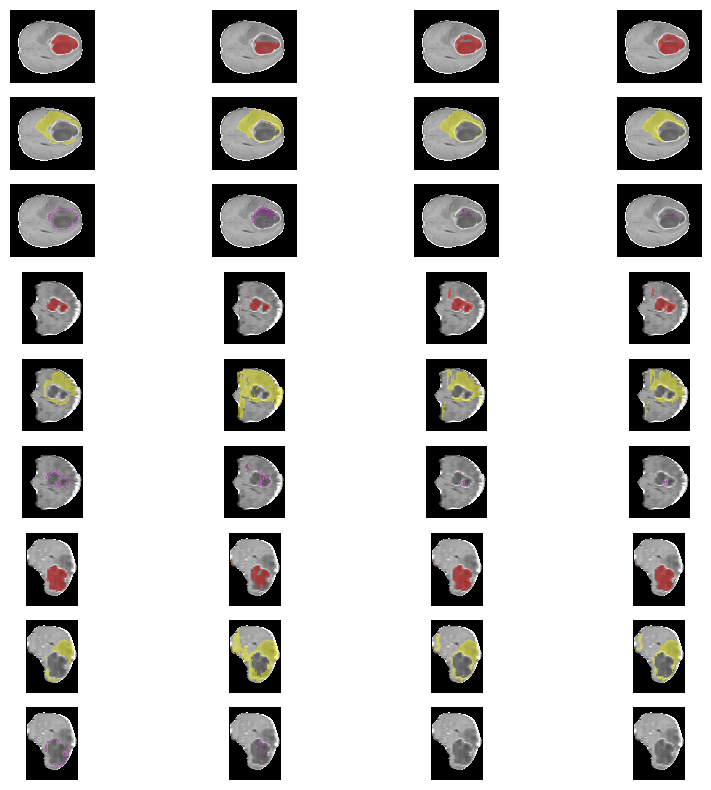

BraTS-SSA-00044-000-stk.npy
[[136.  79. 172.  98.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00044-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overla

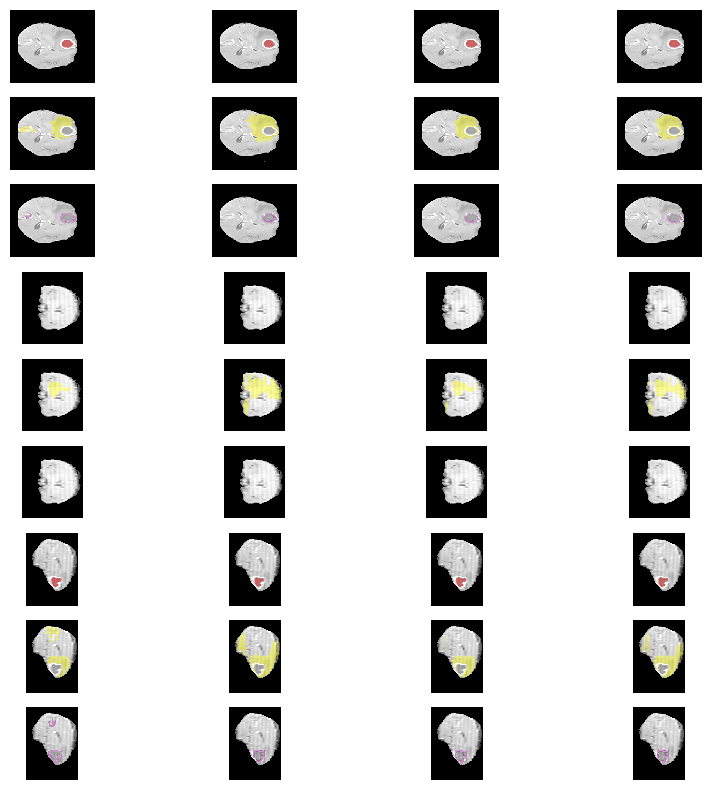

BraTS-SSA-00055-000-stk.npy
[[ 98. 121. 105. 125.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00055-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overla

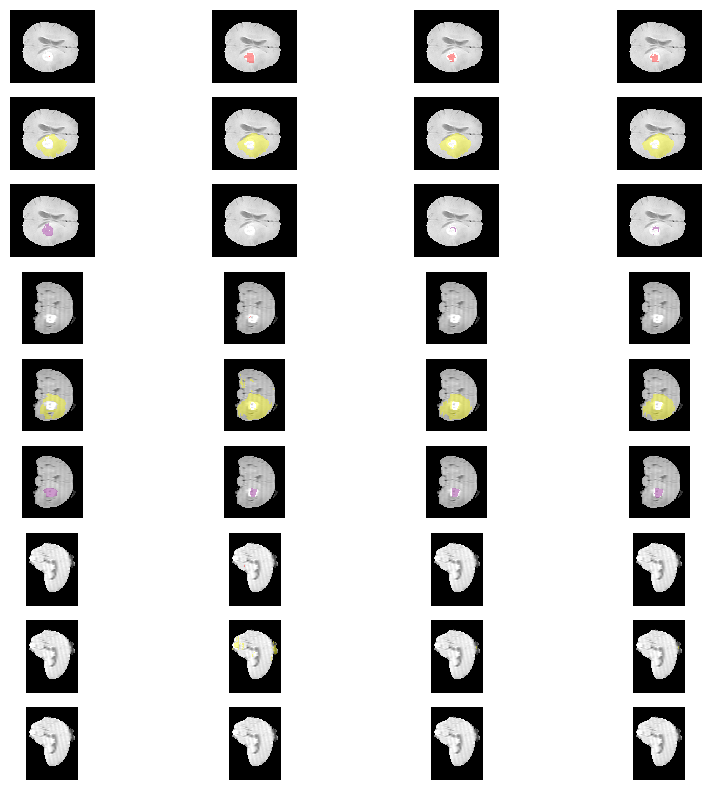

BraTS-SSA-00057-000-stk.npy
[[ 78.  41. 147. 100.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00057-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overla

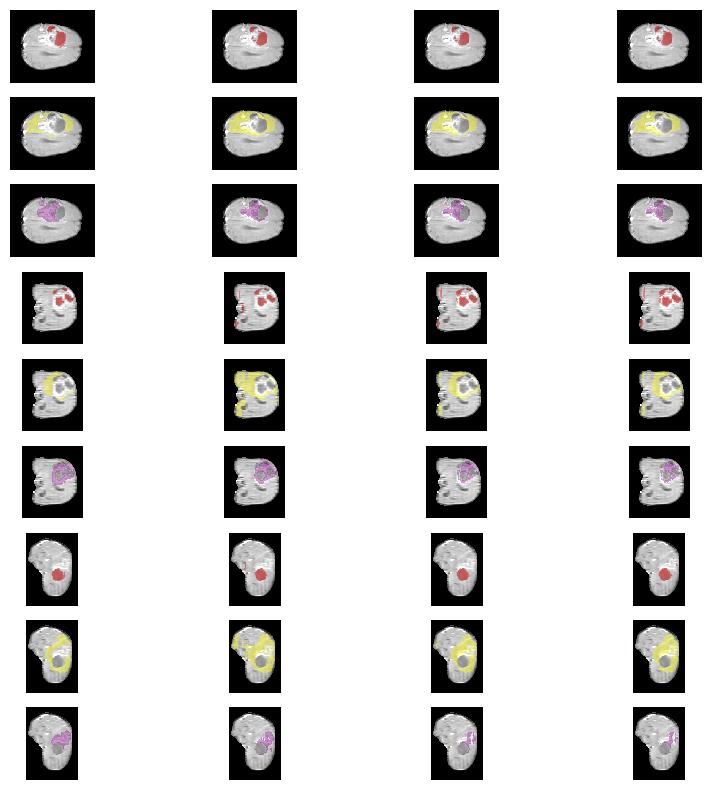

BraTS-SSA-00121-000-stk.npy
[[ 89.  39. 166. 105.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00121-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overla

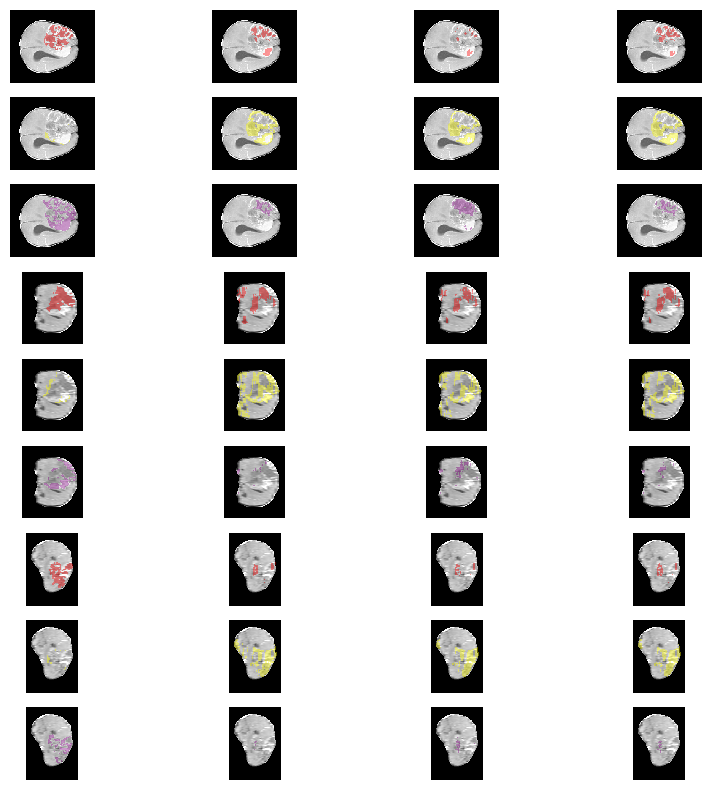

BraTS-SSA-00220-000-stk.npy
[[48. 44. 92. 70.]]
pred2.shape /scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI/BraTS-SSA-00220-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
(192, 224, 3)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 192, 3), m shape (192, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rgb shape (160, 224, 3), m shape (224, 160)
overlay_rg

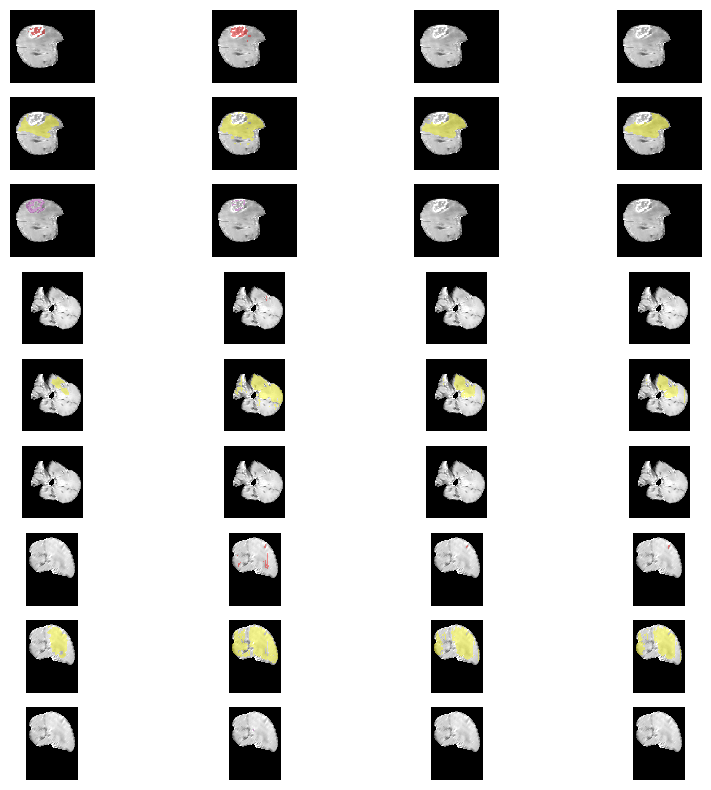

In [18]:
GLI_video_path = '/scratch-second/BraTS_SSA/Validation/images_UNN'
GLI_label_path = '/scratch-second/BraTS_SSA/Validation/labels_UNN'
GLI_pred_path = '/scratch-second/TTA_res_con/val_ent_con_decoder_lr4/logs/BraTS_GLI'
pred2 = '/scratch-second/TTA_res_con/val_ent_con_decoder_lr5/logs/BraTS_GLI'
pred3 = '/scratch-second/TTA_res_con/val_ent_con_decoder_lr6/logs/BraTS_GLI'  
cols = ["dice_ED", "dice_ET", "dice_NCR"]

# target (scalar): 25th percentile of per-row mean
target = tta_ent_lr6_df[cols].mean(axis=1).quantile(0.50)
print("target (p25 of row-mean):", target)

GLI_4 = (tta_ent_lr6_df
         .assign(_diff=(tta_ent_lr6_df[cols].mean(axis=1) - target).abs())
         .nsmallest(6, "_diff")
         .drop(columns="_diff"))

print(GLI_4)
GLI_worst_list = GLI_4.name.to_list()

GLI_worst_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_worst_list)
visualize_3d(GLI_worst_dataset, GLI_pred_path, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, pred2,  pred3)

target (p25 of row-mean): 0.46801046654582024
                       name  dice_NCR   dice_ED   dice_ET  hausdorff_NCR  \
26  BraTS-SSA-00127-000.npy  0.071023  0.511138  0.845235      21.931713   
27  BraTS-SSA-00131-000.npy  0.259669  0.559339  0.561658      11.180340   
8   BraTS-SSA-00041-000.npy  0.191714  0.696914  0.539261      28.792360   
25  BraTS-SSA-00122-000.npy  0.043687  0.700317  0.635366      14.560220   

    hausdorff_ED  hausdorff_ET  recall_NCR  recall_ED  recall_ET  \
26     10.924556      8.062258    0.037860   0.624180   0.808462   
27     69.000000     49.244289    0.149373   0.923797   0.488565   
8      12.727922      6.000000    0.763293   0.619132   0.413856   
25     67.690475      5.830952    0.022331   0.918852   0.866163   

    precision_NCR  precision_ED  precision_ET  
26       0.572519      0.432763      0.885513  
27       0.992618      0.401097      0.660470  
8        0.109624      0.797047      0.773708  
25       1.000000      0.565760      0.5

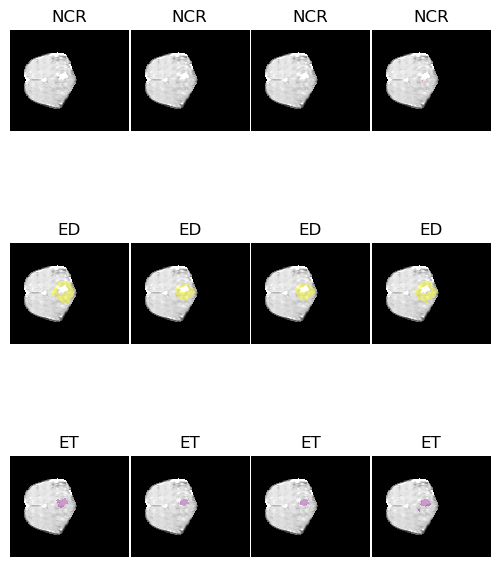

BraTS-SSA-00122-000-stk.npy
[[113. 107. 146. 132.]]
pred2.shape /scratch-second/TTA_Augs/val_ent_sup_decoder_lr4_augs_90/logs/BraTS_GLI/BraTS-SSA-00122-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


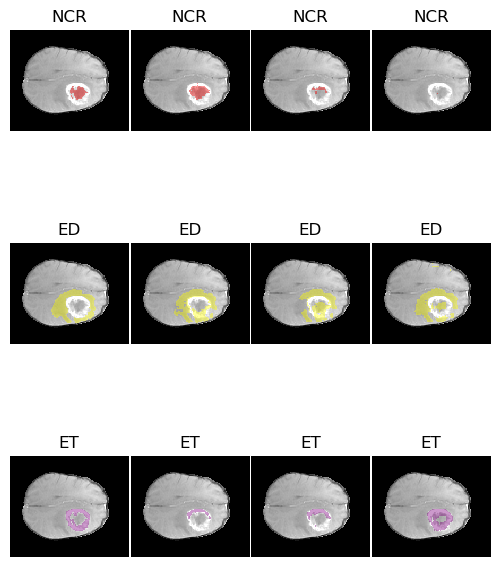

BraTS-SSA-00127-000-stk.npy
[[ 70.  95. 105. 120.]]
pred2.shape /scratch-second/TTA_Augs/val_ent_sup_decoder_lr4_augs_90/logs/BraTS_GLI/BraTS-SSA-00127-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


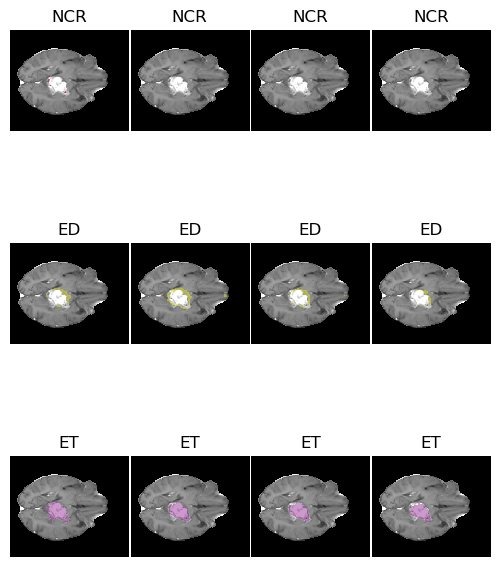

BraTS-SSA-00131-000-stk.npy
[[ 88.  88. 145. 122.]]
pred2.shape /scratch-second/TTA_Augs/val_ent_sup_decoder_lr4_augs_90/logs/BraTS_GLI/BraTS-SSA-00131-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


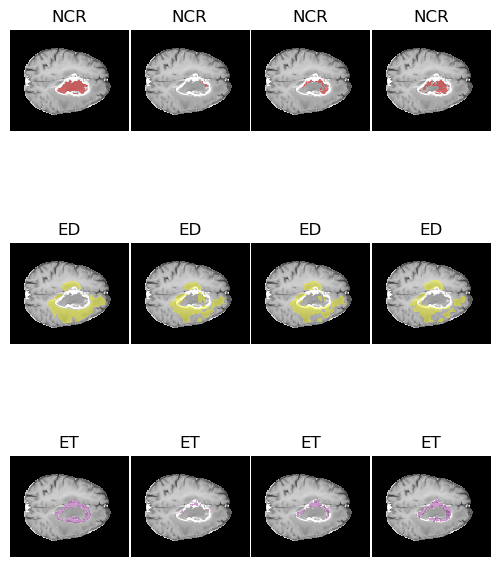

In [ ]:
GLI_video_path = '/scratch-second/BraTS_SSA/Validation/images_UNN'
GLI_label_path = '/scratch-second/BraTS_SSA/Validation/labels_UNN'
GLI_pred_path = '/scratch/radjoe/Projects/Experiments/SAMEXP/logs/val_ent_sup_decoder_lr4_augs/logs/BraTS_GLI'
pred2 = '/scratch/radjoe/Projects/Experiments/SAMEXP/logs/val_ent_sup_decoder_lr5_augs/logs/BraTS_GLI'
pred3 = '/scratch/radjoe/Projects/Experiments/SAMEXP/logs/val_ent_sup_decoder_lr6_augs/logs/BraTS_GLI' 
cols = ["dice_ED", "dice_ET", "dice_NCR"]

# target (scalar): 25th percentile of per-row mean
target = tta_ent_lr6_df[cols].mean(axis=1).quantile(0.50)
print("target (p25 of row-mean):", target)

GLI_4 = (tta_ent_lr6_df
         .assign(_diff=(tta_ent_lr6_df[cols].mean(axis=1) - target).abs())
         .nsmallest(10, "_diff")
         .drop(columns="_diff"))

print(GLI_4)
GLI_worst_list = GLI_4.name.to_list()

GLI_worst_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_worst_list)
visualize(GLI_worst_dataset, GLI_pred_path, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, pred2,  pred3)

target (p25 of row-mean): 0.46801046654582024
                       name  dice_NCR   dice_ED   dice_ET  hausdorff_NCR  \
26  BraTS-SSA-00127-000.npy  0.071023  0.511138  0.845235      21.931713   
27  BraTS-SSA-00131-000.npy  0.259669  0.559339  0.561658      11.180340   
8   BraTS-SSA-00041-000.npy  0.191714  0.696914  0.539261      28.792360   
25  BraTS-SSA-00122-000.npy  0.043687  0.700317  0.635366      14.560220   

    hausdorff_ED  hausdorff_ET  recall_NCR  recall_ED  recall_ET  \
26     10.924556      8.062258    0.037860   0.624180   0.808462   
27     69.000000     49.244289    0.149373   0.923797   0.488565   
8      12.727922      6.000000    0.763293   0.619132   0.413856   
25     67.690475      5.830952    0.022331   0.918852   0.866163   

    precision_NCR  precision_ED  precision_ET  
26       0.572519      0.432763      0.885513  
27       0.992618      0.401097      0.660470  
8        0.109624      0.797047      0.773708  
25       1.000000      0.565760      0.5

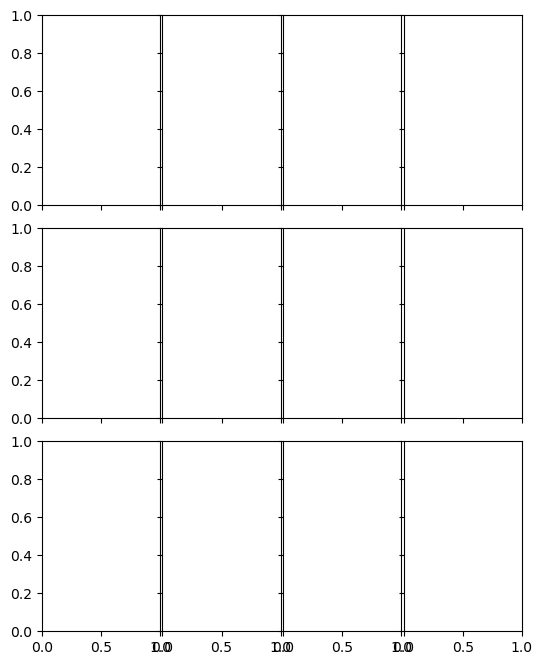

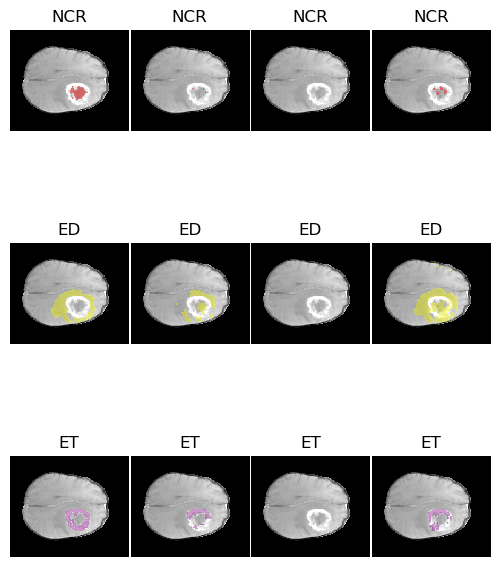

BraTS-SSA-00127-000-stk.npy
[[ 70.  95. 105. 120.]]
pred2.shape /scratch-second/TTA_Augs/val_ent_sup_decoder_lr4_augs_105/logs/BraTS_GLI/BraTS-SSA-00127-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


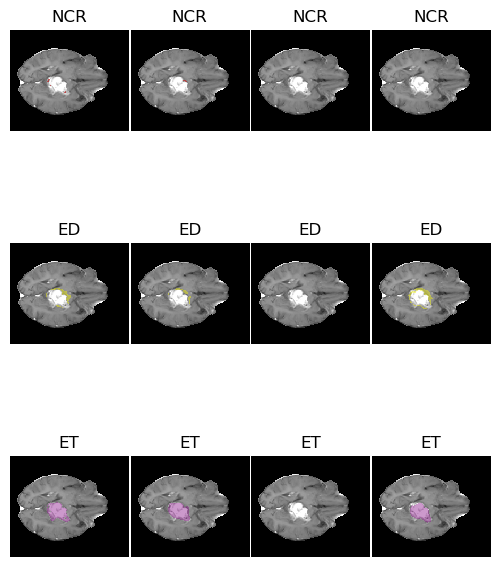

BraTS-SSA-00131-000-stk.npy
[[ 88.  88. 145. 122.]]
pred2.shape /scratch-second/TTA_Augs/val_ent_sup_decoder_lr4_augs_105/logs/BraTS_GLI/BraTS-SSA-00131-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


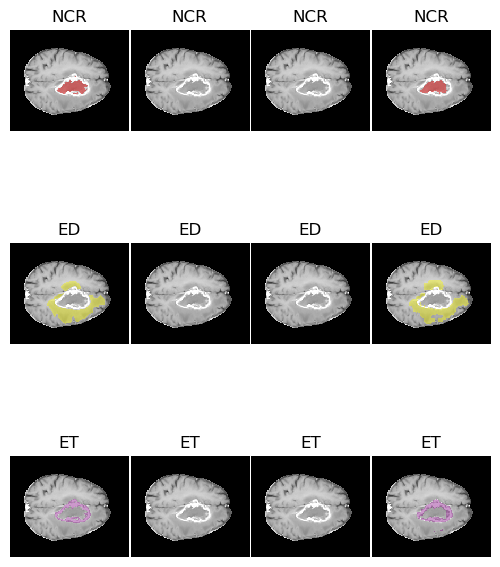

In [13]:
tta_ent_lr6_df = clean_df(tta_ent_lr6, True, 'brats')
GLI_video_path = '/scratch-second/BraTS_SSA/Validation/images_UNN'
GLI_label_path = '/scratch-second/BraTS_SSA/Validation/labels_UNN'
GLI_pred_path = '/scratch-second/TTA_Augs/val_ent_con_decoder_lr6_augs_90/logs/BraTS_GLI/'
pred2 = '/scratch/radjoe/Projects/Experiments/SAMEXP/logs/val_ent_con_decoder_lr5_augs_105/logs/BraTS_GLI/'
pred3 = '/scratch-second/TTA_Augs/val_ent_sup_decoder_lr4_augs_105/logs/BraTS_GLI'
cols = ["dice_ED", "dice_ET", "dice_NCR"]

# target (scalar): 25th percentile of per-row mean
target = tta_ent_lr6_df[cols].mean(axis=1).quantile(0.5)
print("target (p25 of row-mean):", target)

GLI_4 = (tta_ent_lr6_df
         .assign(_diff=(tta_ent_lr6_df[cols].mean(axis=1) - target).abs())
         .nsmallest(4, "_diff")
         .drop(columns="_diff"))

print(GLI_4)
GLI_worst_list = GLI_4.name.to_list()

GLI_worst_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_worst_list)
visualize(GLI_worst_dataset, GLI_pred_path, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, pred2,  pred3)

target (p25 of row-mean): 0.46801046654582024
                       name  dice_NCR   dice_ED   dice_ET  hausdorff_NCR  \
26  BraTS-SSA-00127-000.npy  0.071023  0.511138  0.845235      21.931713   
27  BraTS-SSA-00131-000.npy  0.259669  0.559339  0.561658      11.180340   
8   BraTS-SSA-00041-000.npy  0.191714  0.696914  0.539261      28.792360   
25  BraTS-SSA-00122-000.npy  0.043687  0.700317  0.635366      14.560220   

    hausdorff_ED  hausdorff_ET  recall_NCR  recall_ED  recall_ET  \
26     10.924556      8.062258    0.037860   0.624180   0.808462   
27     69.000000     49.244289    0.149373   0.923797   0.488565   
8      12.727922      6.000000    0.763293   0.619132   0.413856   
25     67.690475      5.830952    0.022331   0.918852   0.866163   

    precision_NCR  precision_ED  precision_ET  
26       0.572519      0.432763      0.885513  
27       0.992618      0.401097      0.660470  
8        0.109624      0.797047      0.773708  
25       1.000000      0.565760      0.5

pred2.shape /scratch-second/TTA_Augs/val_ent_sup_decoder_lr4_105/logs/BraTS_GLI/BraTS-SSA-00122-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


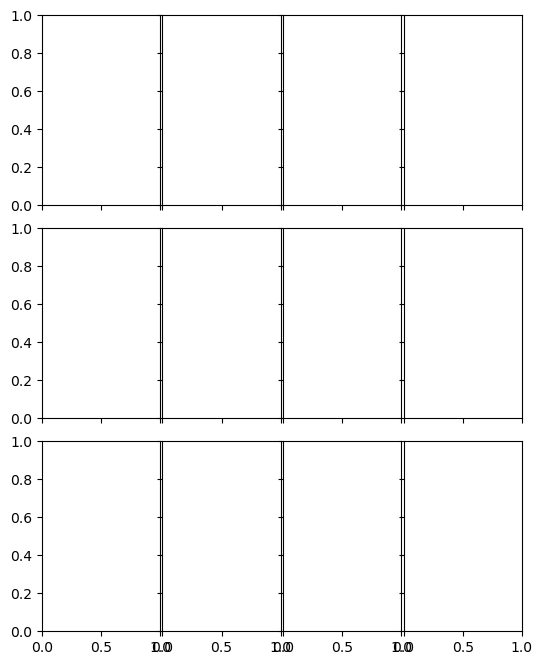

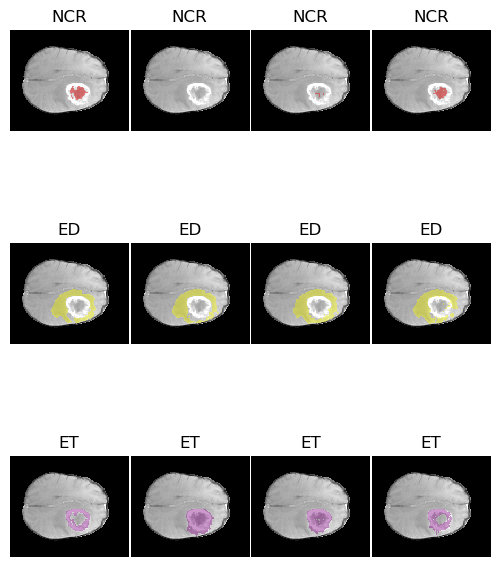

BraTS-SSA-00127-000-stk.npy
[[ 70.  95. 105. 120.]]
pred2.shape /scratch-second/TTA_Augs/val_ent_sup_decoder_lr4_105/logs/BraTS_GLI/BraTS-SSA-00127-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


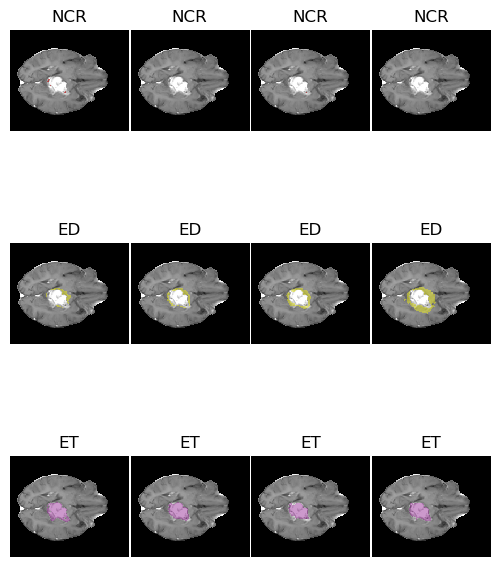

BraTS-SSA-00131-000-stk.npy
[[ 88.  88. 145. 122.]]
pred2.shape /scratch-second/TTA_Augs/val_ent_sup_decoder_lr4_105/logs/BraTS_GLI/BraTS-SSA-00131-000.npy
label.shape (3, 192, 224, 160)
(192, 224, 3)
(192, 224, 3)
(192, 224, 3)


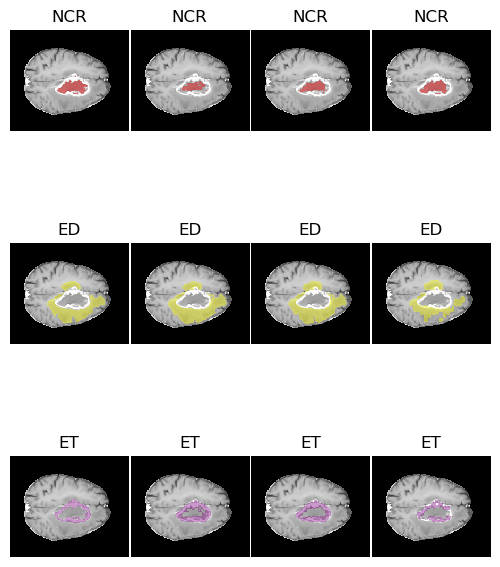

In [16]:
tta_ent_lr6_df = clean_df(tta_ent_lr6, True, 'brats')
GLI_video_path = '/scratch-second/BraTS_SSA/Validation/images_UNN'
GLI_label_path = '/scratch-second/BraTS_SSA/Validation/labels_UNN'
GLI_pred_path = '/scratch-second/TTA_Augs/val_ent_con_decoder_lr6_90/logs/BraTS_GLI/'
pred2 = '/scratch/radjoe/Projects/Experiments/SAMEXP/logs/val_ent_con_decoder_lr5_105/logs/BraTS_GLI/'
pred3 = '/scratch-second/TTA_Augs/val_ent_sup_decoder_lr4_105/logs/BraTS_GLI'
cols = ["dice_ED", "dice_ET", "dice_NCR"]

# target (scalar): 25th percentile of per-row mean
target = tta_ent_lr6_df[cols].mean(axis=1).quantile(0.5)
print("target (p25 of row-mean):", target)

GLI_4 = (tta_ent_lr6_df
         .assign(_diff=(tta_ent_lr6_df[cols].mean(axis=1) - target).abs())
         .nsmallest(4, "_diff")
         .drop(columns="_diff"))

print(GLI_4)
GLI_worst_list = GLI_4.name.to_list()

GLI_worst_dataset = MRIDataset(GLI_video_path, GLI_label_path, GLI_worst_list)
visualize(GLI_worst_dataset, GLI_pred_path, 'GT Vs MedSAM2-BraTS-GLI', GLI_video_path, pred2,  pred3)